# Global Explainer - ETN

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
from local_explanations import *
import utils
import models

import matplotlib.pyplot as plt
import matplotlib.cm as cm

import os
import numpy as np
import wandb
import networkx as nx
from networkx.algorithms import isomorphism
from networkx.generators import classic

import torch
from torch_geometric.nn import GAE, VGAE, GCNConv
import torch_geometric.transforms as T
from torch_geometric.data import InMemoryDataset, download_url, Data
from torch_geometric.utils import from_networkx, to_networkx
from torch_geometric.loader import DataLoader
from tqdm.notebook import tqdm
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pickle

from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score

import copy
import random
from scipy.stats import hmean

from collections import defaultdict
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, global_mean_pool, global_add_pool, global_max_pool, GATConv, GINConv
from torch_scatter import scatter
import torch_explain as te
from torch_explain.logic.nn import entropy
from torch_explain.logic.metrics import test_explanation, complexity, test_explanations
from torch_geometric.datasets import MNISTSuperpixels


%load_ext autoreload
%autoreload 2

In [4]:
adjs_train , \
edge_weights_train , \
ori_adjs_train , \
ori_classes_train , \
belonging_train , \
summary_predictions_train , \
le_classes_train ,\
embeddings_train = read_etn(split="TRAIN", priori_annotation=True)

print(np.unique(le_classes_train, return_counts=True))
print(len(adjs_train) , len(edge_weights_train), len(ori_adjs_train) , len(ori_classes_train) , len(belonging_train))
np.unique(summary_predictions_train["wrong"], return_counts=True) , np.unique(summary_predictions_train["correct"], return_counts=True)

[]
defaultdict(<class 'int'>, {'{2}': 24, '{1, 2, 3}': 9, '{0, 1, 3}': 10, '{0, 2, 3}': 11, '{0, 2}': 23, '{1, 2}': 3, '{0, 1, 2}': 4})
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))
709 709 709 709 709


((array([0, 1]), array([44, 56], dtype=int64)),
 (array([0, 1]), array([660, 648], dtype=int64)))

In [5]:
adjs_val , \
edge_weights_val , \
ori_adjs_val , \
ori_classes_val , \
belonging_val , \
summary_predictions_val , \
le_classes_val ,\
embeddings_val = read_etn(split="VAL", priori_annotation=True)

print(np.unique(le_classes_val, return_counts=True))
print(len(adjs_val) , len(edge_weights_val), len(ori_adjs_val) , len(ori_classes_val) , len(belonging_val))
np.unique(summary_predictions_val["wrong"], return_counts=True) , np.unique(summary_predictions_val["correct"], return_counts=True)

[]
defaultdict(<class 'int'>, {'{2}': 4, '{1, 2, 3}': 1, '{0, 2}': 6, '{1, 2}': 1})
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))
66 66 66 66 66


((array([0, 1]), array([5, 9], dtype=int64)),
 (array([0, 1]), array([65, 61], dtype=int64)))

In [6]:
adjs_test , \
edge_weights_test , \
ori_adjs_test , \
ori_classes_test , \
belonging_test , \
summary_predictions_test , \
le_classes_test ,\
embeddings_test = read_etn(split="TEST", priori_annotation=True)

print(np.unique(le_classes_test, return_counts=True))
print(len(adjs_test) , len(edge_weights_test), len(ori_adjs_test) , len(ori_classes_test) , len(belonging_test))
np.unique(summary_predictions_test["wrong"], return_counts=True) , np.unique(summary_predictions_test["correct"], return_counts=True)

[]
defaultdict(<class 'int'>, {'{2}': 1, '{0, 2}': 5, '{0, 1, 3}': 3, '{0, 1, 2}': 1, '{1, 2}': 2})
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))
107 107 107 107 107


((array([0, 1]), array([13, 10], dtype=int64)),
 (array([0, 1]), array([93, 96], dtype=int64)))

### Dataset

In [42]:
def convert_labels(g):
    new_dict = dict()
    for n,x in dict(nx.get_node_attributes(g,"x")).items():
        if x[0]==1:
            new_dict[n]="D"
        if x[1]==1:
            new_dict[n]="P"
        if x[2]==1:
            new_dict[n]="A"
        if x[3]==1:
            new_dict[n]="N"
        if x[4]==1:
            new_dict[n]="Ego"
    return new_dict

def plot_etn(data):
    G = to_networkx(data, node_attrs=["x"])
    pos = nx.kamada_kawai_layout(G)
    nx.draw(G, pos)
    nx.draw_networkx_labels(G, pos, {k:v for k,v in convert_labels(G).items() if k in G.nodes()}, font_size=20, font_color="red")

C:\Users\Steve\Desktop\GNN\gnn_logic_global_expl\code\utils.py:46: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(precomputed_embeddings[i])
C:\Users\Steve\Desktop\GNN\gnn_logic_global_expl\code\utils.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  edge_attr=torch.tensor(t.weight).reshape(-1, 1),


(array([0, 1, 2, 3, 4, 5, 6, 7]), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))
(tensor([0, 1]), tensor([296, 413]))


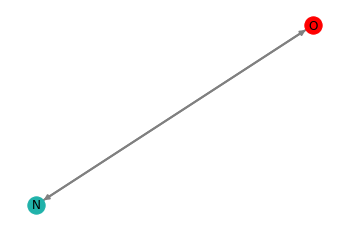

(18, tensor([18]))

In [8]:
device = "cpu" #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = None  

dataset_train = utils.LocalExplanationsDataset("", adjs_train, edge_weights_train, "embeddings", transform=transform, y=le_classes_train, belonging=belonging_train, task_y=ori_classes_train, precomputed_embeddings=embeddings_train)
dataset_val = utils.LocalExplanationsDataset("", adjs_val, edge_weights_val, "embeddings", transform=transform, y=le_classes_val, belonging=belonging_val, task_y=ori_classes_val, precomputed_embeddings=embeddings_val)
dataset_test = utils.LocalExplanationsDataset("", adjs_test, edge_weights_test, "embeddings", transform=transform, y=le_classes_test, belonging=belonging_test, task_y=ori_classes_test, precomputed_embeddings=embeddings_test)


##
# debug Dataset
##
print(np.unique(le_classes_train, return_counts=True))
print(torch.unique(dataset_train.data.task_y, return_counts=True))
idx = 18
utils.plot_molecule(dataset_train[idx])
belonging_train[idx] , dataset_train[idx].graph_id

## Train GLGExplainer

In [ ]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)



torch.manual_seed(42)
hyper = {
    "len_lr": 0.0005,
    "proto_lr": 0.001,
    "le_emb_lr": 0.001,
    "coeff_divloss": 0.000,
    "coeff_pdist": 0.,
    "coeff_gae": 0.,
    "coeff_r1": 0.09,
    "coeff_r2": 0.00099,
    "coeff_ce": 0.0,
    "coeff_de": 0.,
    "coeff_logic_loss": 0.00,
    "focal_gamma": 2, #3
    "focal_alpha": -1,
    "ts": 1,
    "te": 1,
    "focal_loss": True,
    "debug_prototypes": False,
    "num_prototypes": 2,
    "dim_prototypes": 10,
    "num_le_features": 5,
    "activation": "leaky",
    "embedder_backbone": "GIN",
    "embedder_num_layers": 5,
    "assign_func": "straight_sim",
    "LEN_temperature": 1,
    "remove_attention": True,
    "log_images": True,
    "log_models": True,
    "num_epochs": 500,
}

len_model    = models.LEN(hyper["num_prototypes"], 
                          hyper["LEN_temperature"], 
                          remove_attention=hyper["remove_attention"]).to(device)
le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                 activation=hyper["activation"], 
                                 num_hidden=hyper["dim_prototypes"],
                                 backbone=hyper["embedder_backbone"],
                                 num_layers=hyper["embedder_num_layers"]).to(device)
expl         = models.GlobalExplainer(len_model, 
                               le_model, 
                               train_group_loader, 
                               val_group_loader, 
                               device, 
                               hyper_params=hyper,
                               classes_names=priori_etn_classes_names,
                               dataset_name="ETN").to(device)

prefix = "DEBUG" if hyper["debug_prototypes"] else ""
suffix = "no attn" if hyper["remove_attention"] else ""
expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb=f"MUTAG {hyper['num_prototypes']}prots {prefix} {suffix}")

In [14]:
x_train , emb , concepts_assignement , y_train_1h , le_classes , le_idxs , belonging = expl.get_concept_vector(train_group_loader, 
                                                                                                               return_raw=True)        

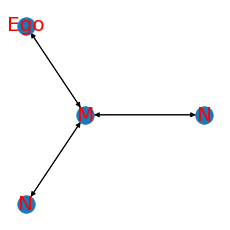

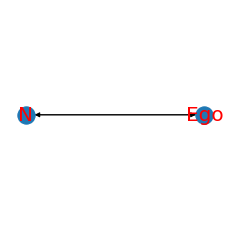

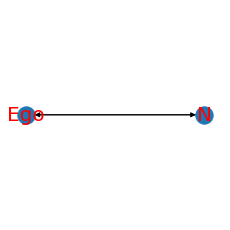

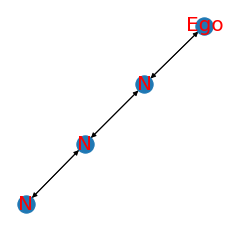

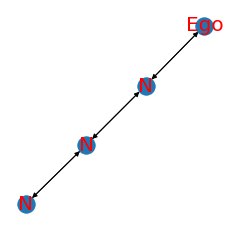

...

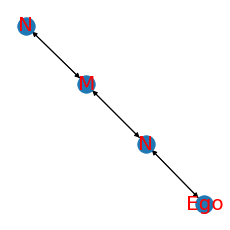

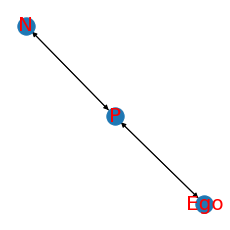

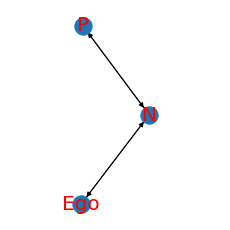

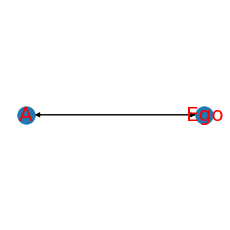

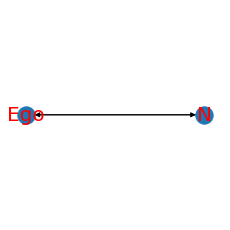

In [15]:
idxs = le_idxs[concepts_assignement.argmax(-1) == 0]
for idx in idxs[:12]: 
    plt.figure(figsize=(3,3))
    plot_etn(dataset_train[int(idx)])
    plt.show()

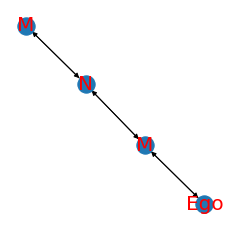

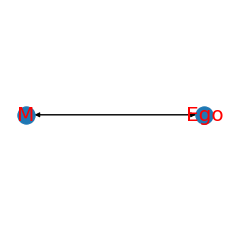

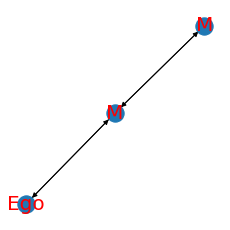

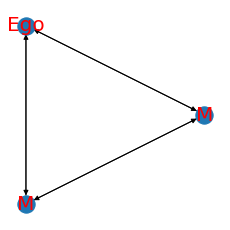

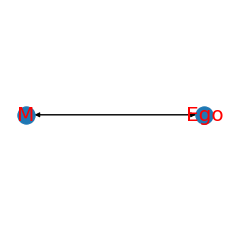

...

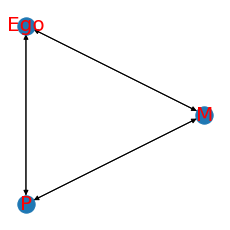

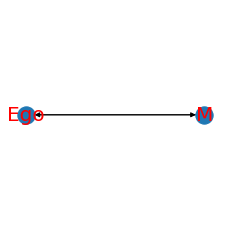

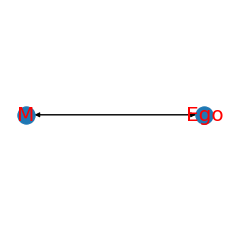

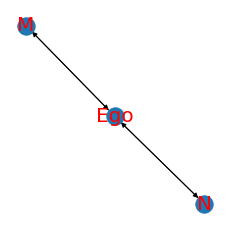

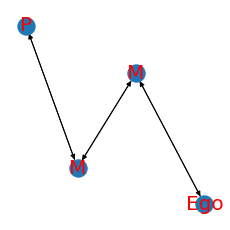

In [16]:
idxs = le_idxs[concepts_assignement.argmax(-1) == 1]
for idx in idxs[:12]: 
    plt.figure(figsize=(3,3))
    plot_etn(dataset_train[int(idx)])
    plt.show()

In [ ]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

torch.manual_seed(42)
hyper = {
    "len_lr": 0.0005,
    "proto_lr": 0.001,
    "le_emb_lr": 0.001,
    "coeff_divloss": 0.000,
    "coeff_pdist": 0.,
    "coeff_gae": 0.,
    "coeff_r1": 0.09,
    "coeff_r2": 0.00099,
    "coeff_ce": 0.0,
    "coeff_de": 0.,
    "coeff_logic_loss": 0.00,
    "focal_gamma": 2, #3
    "focal_alpha": -1,
    "ts": 1,
    "te": 1,
    "focal_loss": True,
    "debug_prototypes": False,
    "num_prototypes": 4,
    "dim_prototypes": 10,
    "num_le_features": 5,
    "activation": "leaky",
    "embedder_backbone": "GAT",
    "embedder_num_layers": 2,
    "assign_func": "straight_sim",
    "LEN_temperature": 1,
    "remove_attention": True,
    "log_images": True,
    "log_models": False,
    "num_epochs": 500
}

len_model    = models.LEN(hyper["num_prototypes"], 
                          hyper["LEN_temperature"], 
                          remove_attention=hyper["remove_attention"]).to(device)
le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                 activation=hyper["activation"], 
                                 num_hidden=hyper["dim_prototypes"],
                                 backbone=hyper["embedder_backbone"],
                                 num_layers=hyper["embedder_num_layers"]).to(device)
expl4         = models.GlobalExplainer(len_model, 
                               le_model, 
                               train_group_loader, 
                               val_group_loader, 
                               device, 
                               hyper_params=hyper,
                               classes_names=priori_etn_classes_names,
                               dataset_name="ETN").to(device)

prefix = "DEBUG" if hyper["debug_prototypes"] else ""
suffix = "no attn" if hyper["remove_attention"] else ""
expl4.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb=f"ETN {hyper['num_prototypes']}prots {prefix} {suffix}")

## Inspect prototypes

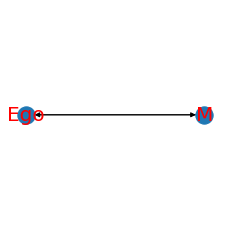

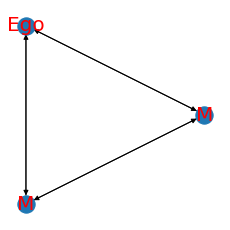

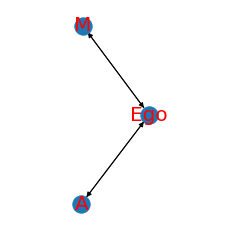

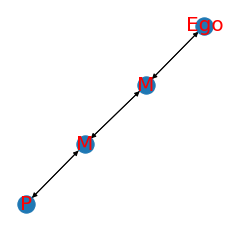

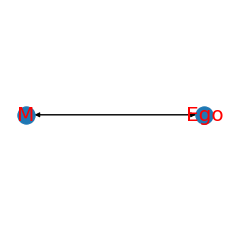

...

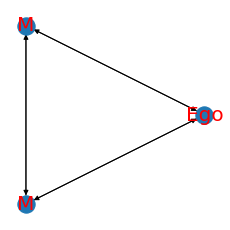

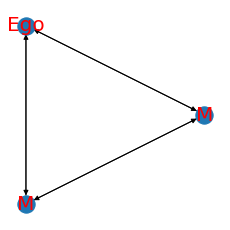

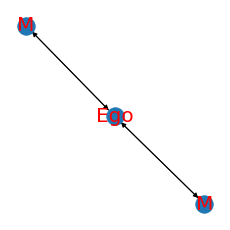

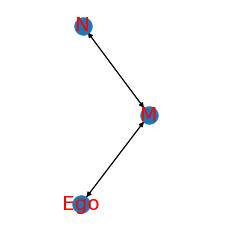

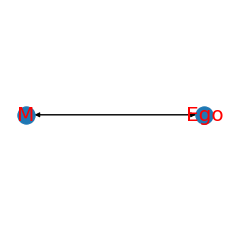

In [44]:
x_train , emb , concepts_assignement , y_train_1h , le_classes , le_idxs , belonging = expl4.get_concept_vector(train_group_loader, 
                                                                                                                return_raw=True)        

prototype_assignements = utils.prototype_assignement("sim", emb, expl4.prototype_vectors, temp=1)

proto = 1
idxs = le_idxs[prototype_assignements.argmax(-1) == proto]
argsort = torch.argsort(prototype_assignements[prototype_assignements.argmax(-1) == proto, proto], descending=True)
idxs = le_idxs[concepts_assignement.argmax(-1) == proto]
for idx in idxs[:20]: 
    plt.figure(figsize=(3,3))
    plot_etn(dataset_train[int(idx)])
    plt.show()

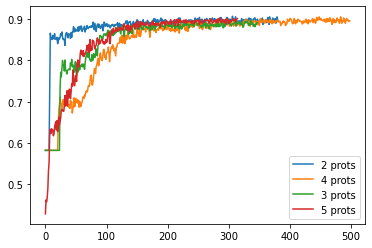

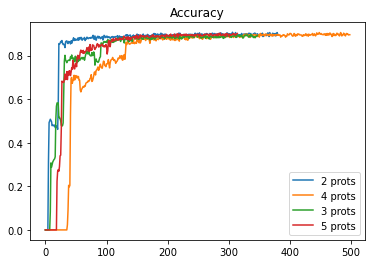

In [14]:
plt.plot([i["acc_per_class"] for i in expl.train_metrics], label="2 prots")
plt.plot([i["acc_per_class"] for i in expl4.train_metrics], label="4 prots")
plt.plot([i["acc_per_class"] for i in expl3.train_metrics], label="3 prots")
plt.plot([i["acc_per_class"] for i in expl5.train_metrics], label="5 prots")
plt.legend()
plt.show()

plt.plot([i["acc_overall"] for i in expl.train_metrics], label="2 prots")
plt.plot([i["acc_overall"] for i in expl4.train_metrics], label="4 prots")
plt.plot([i["acc_overall"] for i in expl3.train_metrics], label="3 prots")
plt.plot([i["acc_overall"] for i in expl5.train_metrics], label="5 prots")
plt.legend()
plt.title("Accuracy")
plt.show()

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


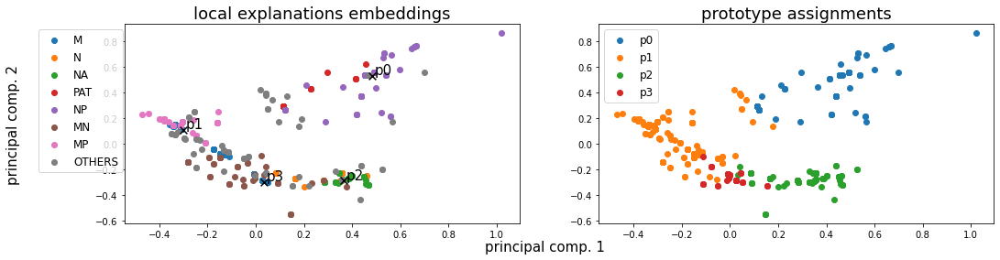

Alpha norms:
tensor([[0.6209, 1.0000, 0.5574, 0.3416],
        [0.1618, 1.0000, 0.2873, 0.1941]], grad_fn=<DivBackward0>)
Concept Purity: 0.626064 +- 0.051098
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 339, 199,  55], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)



In [25]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

torch.manual_seed(42)
hyper = {
    "len_lr": 0.0005,
    "proto_lr": 0.001,
    "le_emb_lr": 0.001,
    "coeff_divloss": 0.000,
    "coeff_pdist": 0.,
    "coeff_gae": 0.,
    "coeff_r1": 0.09,
    "coeff_r2": 0.00099,
    "coeff_ce": 0.0,
    "coeff_de": 0.,
    "coeff_logic_loss": 0.00,
    "focal_gamma": 2, #3
    "focal_alpha": -1,
    "ts": 1,
    "te": 1,
    "focal_loss": True,
    "debug_prototypes": False,
    "num_prototypes": 4,
    "dim_prototypes": 10,
    "num_le_features": 5,
    "activation": "leaky",
    "embedder_backbone": "GAT",
    "embedder_num_layers": 2,
    "assign_func": "straight_sim",
    "LEN_temperature": 1,
    "remove_attention": True,
    "log_images": True,
    "log_models": False,
    "num_epochs": 500
}

len_model    = models.LEN(hyper["num_prototypes"], 
                          hyper["LEN_temperature"], 
                          remove_attention=hyper["remove_attention"]).to(device)
le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                 activation=hyper["activation"], 
                                 num_hidden=hyper["dim_prototypes"],
                                 backbone=hyper["embedder_backbone"],
                                 num_layers=hyper["embedder_num_layers"]).to(device)
expl         = models.GlobalExplainer(len_model, 
                               le_model, 
                               train_group_loader, 
                               val_group_loader, 
                               device, 
                               hyper_params=hyper,
                               classes_names=priori_etn_classes_names,
                               dataset_name="ETN").to(device)
expl.load_state_dict(torch.load("../trained_models/ETN.pt"))
expl.inspect_embedding(expl.dataloader)

In [44]:
def plot_etn(data, ax=None):
    G = to_networkx(data, node_attrs=["x"], to_undirected=True)
    pos = nx.kamada_kawai_layout(G)
    nx.draw(G, pos, node_color="orange", node_size=400, ax=ax)
    nx.draw_networkx_labels(G, pos, {k:v for k,v in convert_labels(G).items() if k in G.nodes()}, font_size=18, font_color="black", ax=ax)

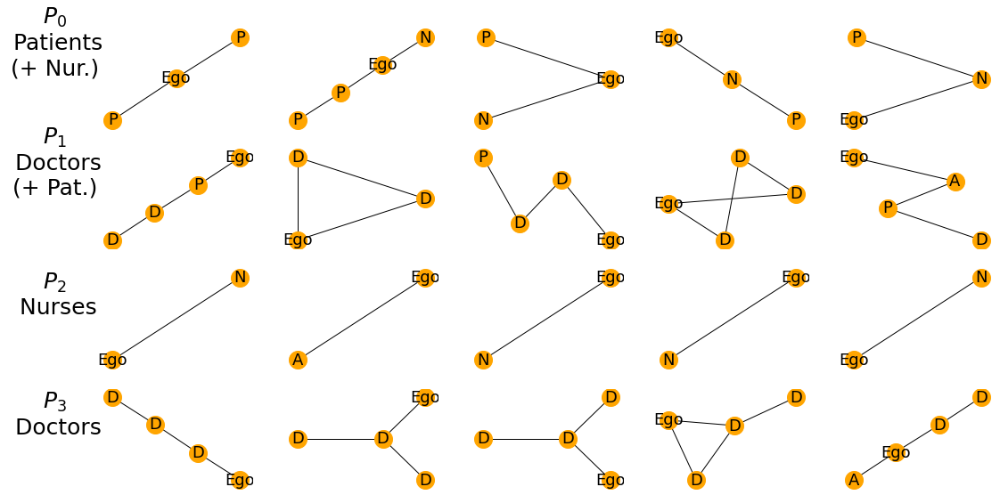

In [52]:
expl.eval()
x_train , emb , concepts_assignement , y_train_1h , le_classes , le_idxs , belonging = expl.get_concept_vector(test_group_loader, 
                                                                                                                    return_raw=True)        
proto_names = {
    0: "Patients\n(+ Nur.)",
    1: "Doctors\n(+ Pat.)",
    2: "Nurses",
    3: "Doctors",
}
torch.manual_seed(42)
fig = plt.figure(figsize=(18,5*1.9))
n = 0
for p in range(expl.hyper["num_prototypes"]):
    idxs = le_idxs[concepts_assignement.argmax(-1) == p]
    idxs = idxs[torch.randperm(len(idxs))]    
    for ex in range(5):
        n += 1
        ax = plt.subplot(expl.hyper["num_prototypes"],5,n)      
        #G = to_networkx(dataset_test[int(idxs[ex])], to_undirected=True)
        #pos = nx.spring_layout(G, seed=42)
        #nx.draw(G, pos, node_size=300, ax=ax, node_color="orange")
        plot_etn(dataset_test[int(idxs[ex])])
        ax.axis("on")
        plt.box(False)
        
for p in range(expl.hyper["num_prototypes"]):
    plt.subplot(expl.hyper["num_prototypes"],5,5*p + 1)
    plt.ylabel(f"$P_{p}$\n {proto_names[p]}", size=25, rotation="horizontal", labelpad=50)

plt.savefig("prototypes_etn.pdf")
plt.show() 

## Ablation study

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


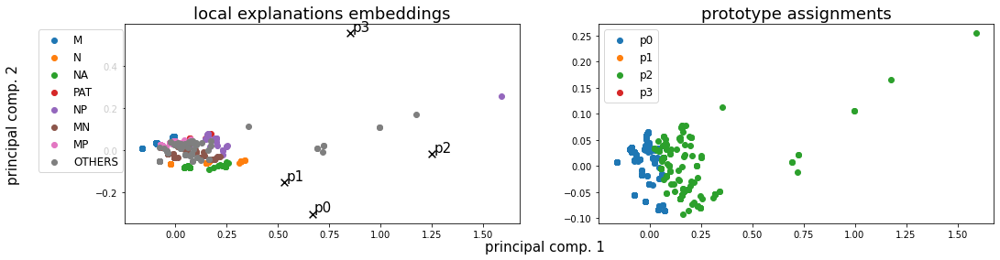

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.394417 +- 0.104645
Concept distribution:  (array([0, 2], dtype=int64), array([533, 176], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.22246, LEN: 0.096762, AccxC: 0.30, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20840, V. LEN 0.10
  2: Loss: 0.21514, LEN: 0.096291, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20983, V. LEN 0.10
  3: Loss: 0.20560, LEN: 0.095711, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20737, V. LEN 0.10
  4: Loss: 0.20101, LEN: 0.095294, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19748, V. LEN 0.10
  5: Loss: 0.19050, LEN: 0.094765, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18406, V. LEN 0.09
  6: Loss: 0.17491, LEN: 0.094331, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16578, V. LEN 0.09
  7: Loss: 0.15923, L

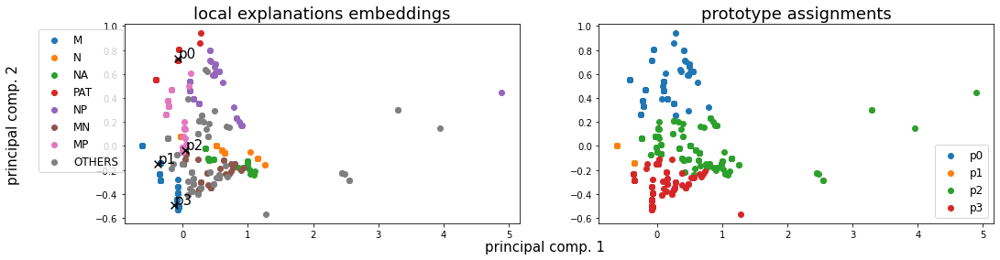

Alpha norms:
tensor([[0.9916, 0.7638, 0.8793, 1.0000],
        [0.8366, 0.8439, 1.0000, 0.9342]], grad_fn=<DivBackward0>)
Concept Purity: 0.653314 +- 0.224048
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([132, 125, 249, 203], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.10346, LEN: 0.089073, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10227, V. LEN 0.09
 21: Loss: 0.10172, LEN: 0.088688, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09967, V. LEN 0.09
 22: Loss: 0.09912, LEN: 0.088282, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09705, V. LEN 0.09
 23: Loss: 0.09660, LEN: 0.087979, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09462, V. LEN 0.09
 24: Loss: 0.09448, LEN: 0.087476, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09264, V. LEN 0.09
 25: Loss: 0.09236, LEN: 0.087156, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09102, V. LEN 0.09
 26:

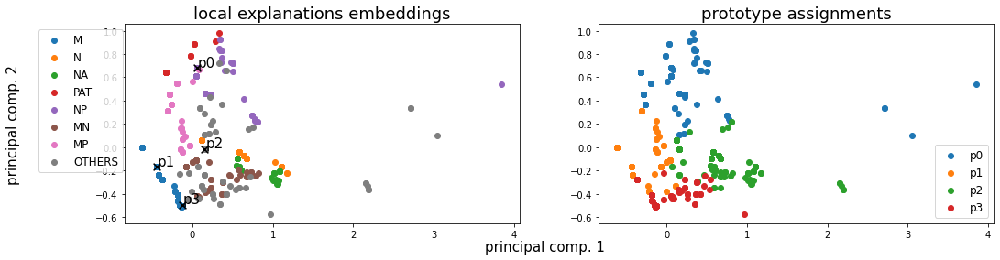

Alpha norms:
tensor([[0.7058, 0.8491, 0.7086, 1.0000],
        [0.6486, 1.0000, 0.7454, 0.8285]], grad_fn=<DivBackward0>)
Concept Purity: 0.629052 +- 0.138279
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([144, 205, 214, 146], dtype=int64))
Logic formulas:
For class 0:
0.5726375176304654 (feature002) | ((feature000) | (feature001)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.1805)


 40: Loss: 0.08139, LEN: 0.080578, AccxC: 0.84, AccO: 0.12, V. Acc: 0.20, V. Loss: 0.08067, V. LEN 0.08
 41: Loss: 0.08043, LEN: 0.080035, AccxC: 0.84, AccO: 0.53, V. Acc: 0.68, V. Loss: 0.08003, V. LEN 0.08
 42: Loss: 0.07993, LEN: 0.079526, AccxC: 0.84, AccO: 0.76, V. Acc: 0.88, V. Loss: 0.07942, V. LEN 0.08
 43: Loss: 0.07909, LEN: 0.078740, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.07875, V. LEN 0.08
 44: Loss: 0.07871, LEN: 0.078130, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.07816, V. LEN 0.08
 45: Loss: 0.07810, LEN: 0.077727, AccxC: 0.84, 

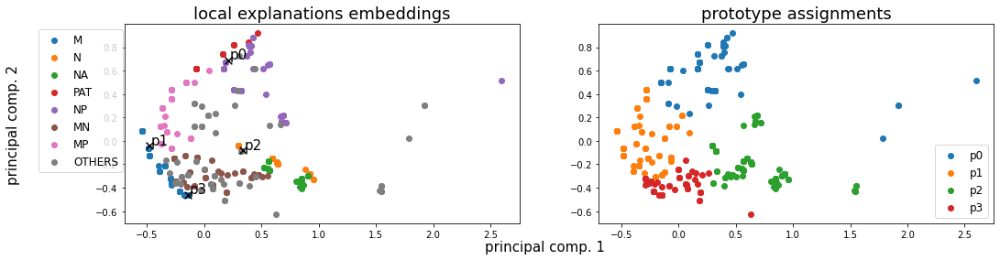

Alpha norms:
tensor([[0.3979, 1.0000, 0.6265, 0.8431],
        [0.3975, 1.0000, 0.5331, 0.5688]], grad_fn=<DivBackward0>)
Concept Purity: 0.595785 +- 0.099302
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([121, 283, 208,  97], dtype=int64))
Logic formulas:
For class 0:
0.8744710860366713 (feature002) | ((feature000)
For class 1:
0.8744710860366713 (feature001) | (feature003)
Accuracy as classifier:  0.8745
LEN fidelity:  tensor(0.8745)


 60: Loss: 0.06622, LEN: 0.065982, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06545, V. LEN 0.07
 61: Loss: 0.06539, LEN: 0.065077, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06474, V. LEN 0.06
 62: Loss: 0.06469, LEN: 0.064440, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06406, V. LEN 0.06
 63: Loss: 0.06466, LEN: 0.064397, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06335, V. LEN 0.06
 64: Loss: 0.06310, LEN: 0.062907, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06271, V. LEN 0.06
 65: Loss: 0.06268, 

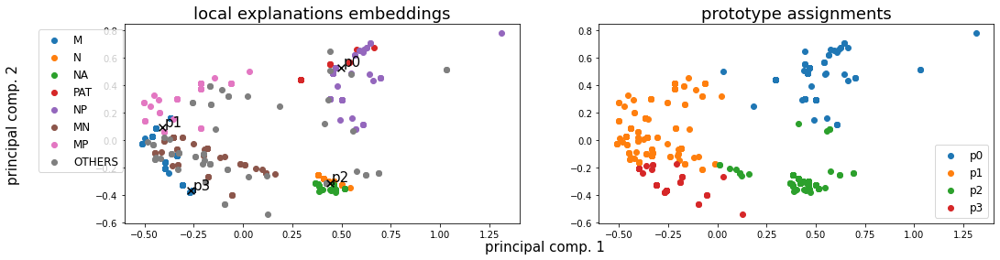

Alpha norms:
tensor([[0.3966, 1.0000, 0.6102, 0.5811],
        [0.2681, 1.0000, 0.4859, 0.4475]], grad_fn=<DivBackward0>)
Concept Purity: 0.631458 +- 0.065636
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 335, 198,  60], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | ((feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


 80: Loss: 0.05199, LEN: 0.051533, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05125, V. LEN 0.05
 81: Loss: 0.04997, LEN: 0.049744, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05063, V. LEN 0.05
 82: Loss: 0.05060, LEN: 0.050390, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04997, V. LEN 0.05
 83: Loss: 0.04937, LEN: 0.049216, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04939, V. LEN 0.05
 84: Loss: 0.04888, LEN: 0.048379, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04920, V. LEN 0.05
 85: Loss: 0.04926, 

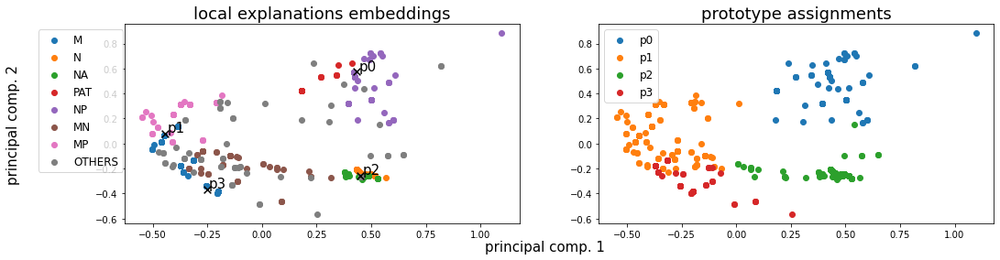

Alpha norms:
tensor([[0.5165, 1.0000, 0.7012, 0.4619],
        [0.1788, 1.0000, 0.3412, 0.2620]], grad_fn=<DivBackward0>)
Concept Purity: 0.650923 +- 0.115589
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 264, 200, 127], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | (feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


100: Loss: 0.04668, LEN: 0.046048, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04466, V. LEN 0.04
101: Loss: 0.04417, LEN: 0.043987, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04455, V. LEN 0.04
102: Loss: 0.04404, LEN: 0.043771, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04391, V. LEN 0.04
103: Loss: 0.04457, LEN: 0.043987, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04451, V. LEN 0.04
104: Loss: 0.04375, LEN: 0.043516, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04454, V. LEN 0.04
105: Loss: 0.04465, L

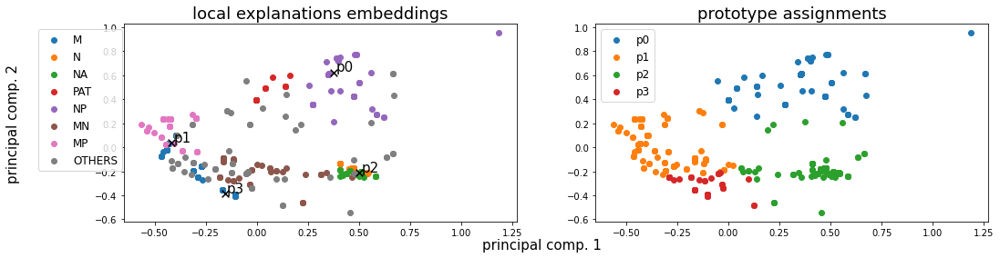

Alpha norms:
tensor([[0.5162, 1.0000, 0.6047, 0.4022],
        [0.1422, 1.0000, 0.2803, 0.1927]], grad_fn=<DivBackward0>)
Concept Purity: 0.624441 +- 0.062245
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 322, 208,  63], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | (feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


120: Loss: 0.04396, LEN: 0.043737, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03988, V. LEN 0.04
121: Loss: 0.04406, LEN: 0.043885, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04429, V. LEN 0.04
122: Loss: 0.04424, LEN: 0.043950, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04041, V. LEN 0.04
123: Loss: 0.04260, LEN: 0.042386, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04359, V. LEN 0.04
124: Loss: 0.04633, LEN: 0.046015, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04032, V. LEN 0.04
125: Loss: 0.04306, L

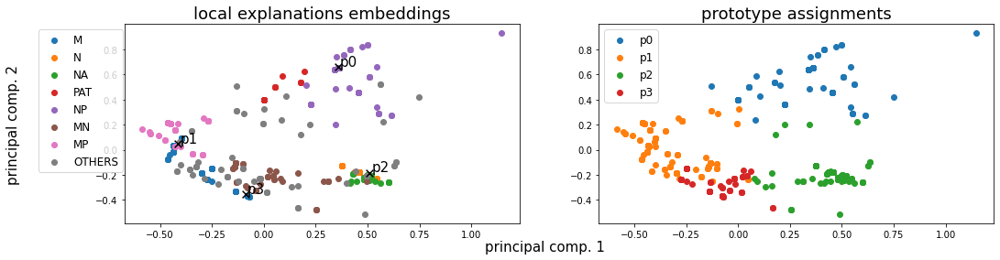

Alpha norms:
tensor([[0.5263, 1.0000, 0.5879, 0.3743],
        [0.1427, 1.0000, 0.2807, 0.1877]], grad_fn=<DivBackward0>)
Concept Purity: 0.639780 +- 0.080790
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([115, 267, 205, 122], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


140: Loss: 0.04467, LEN: 0.044352, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04055, V. LEN 0.04
141: Loss: 0.04403, LEN: 0.043676, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04360, V. LEN 0.04
142: Loss: 0.04192, LEN: 0.041658, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04062, V. LEN 0.04
143: Loss: 0.04745, LEN: 0.047082, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03983, V. LEN 0.04
144: Loss: 0.04209, LEN: 0.041877, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04045, V. LEN 0.04
145: Loss: 0.04336, L

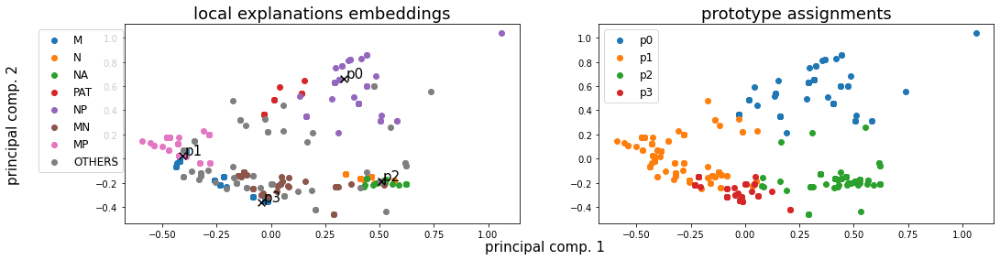

Alpha norms:
tensor([[0.5315, 1.0000, 0.5717, 0.3638],
        [0.1418, 1.0000, 0.2762, 0.1877]], grad_fn=<DivBackward0>)
Concept Purity: 0.643537 +- 0.086570
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([114, 272, 204, 119], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


160: Loss: 0.04215, LEN: 0.041960, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
161: Loss: 0.04193, LEN: 0.041741, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04023, V. LEN 0.04
162: Loss: 0.04543, LEN: 0.045279, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
163: Loss: 0.04213, LEN: 0.041957, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03971, V. LEN 0.04
164: Loss: 0.04221, LEN: 0.042036, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
165: Loss: 0.04413, L

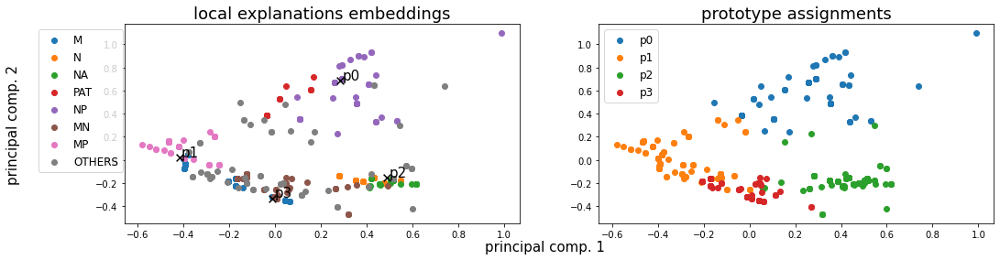

Alpha norms:
tensor([[0.5436, 1.0000, 0.5608, 0.3563],
        [0.1439, 1.0000, 0.2722, 0.1871]], grad_fn=<DivBackward0>)
Concept Purity: 0.637633 +- 0.082404
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 250, 203, 140], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature002) | (feature000)
For class 1:
0.8998589562764457 (feature001) | (feature003)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


180: Loss: 0.04722, LEN: 0.046981, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04049, V. LEN 0.04
181: Loss: 0.04389, LEN: 0.043632, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
182: Loss: 0.04202, LEN: 0.041836, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04018, V. LEN 0.04
183: Loss: 0.04212, LEN: 0.041963, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05496, V. LEN 0.05
184: Loss: 0.04465, LEN: 0.044406, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04023, V. LEN 0.04
185: Loss: 0.04301, L

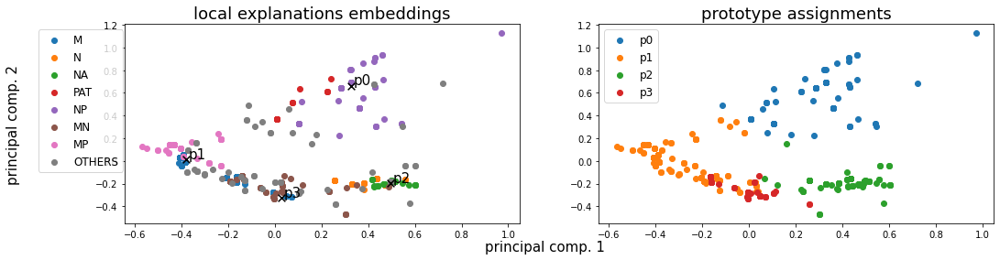

Alpha norms:
tensor([[0.5587, 1.0000, 0.5562, 0.3493],
        [0.1475, 1.0000, 0.2738, 0.1879]], grad_fn=<DivBackward0>)
Concept Purity: 0.651052 +- 0.105829
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 278, 200, 113], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


200: Loss: 0.04486, LEN: 0.044595, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04027, V. LEN 0.04
201: Loss: 0.04555, LEN: 0.045137, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
202: Loss: 0.04281, LEN: 0.042608, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
203: Loss: 0.04358, LEN: 0.043347, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04031, V. LEN 0.04
204: Loss: 0.04280, LEN: 0.042598, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04042, V. LEN 0.04
205: Loss: 0.04889, L

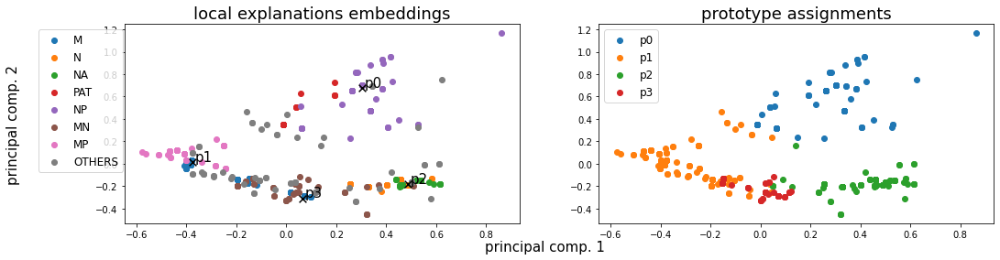

Alpha norms:
tensor([[0.5670, 1.0000, 0.5598, 0.3510],
        [0.1495, 1.0000, 0.2797, 0.1921]], grad_fn=<DivBackward0>)
Concept Purity: 0.651240 +- 0.104175
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 275, 205, 113], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature002) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature003)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


220: Loss: 0.04318, LEN: 0.042983, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04022, V. LEN 0.04
221: Loss: 0.04438, LEN: 0.044249, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
222: Loss: 0.04258, LEN: 0.042386, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
223: Loss: 0.04185, LEN: 0.041676, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03970, V. LEN 0.04
224: Loss: 0.04306, LEN: 0.042930, AccxC: 0.90, AccO: 0.90, V. Acc: 0.86, V. Loss: 0.06019, V. LEN 0.06
225: Loss: 0.04359, L

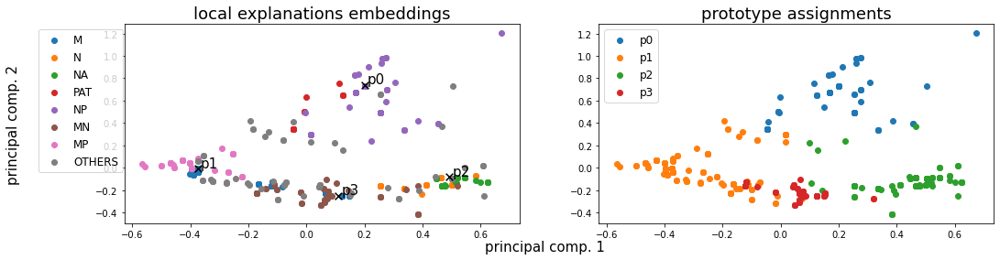

Alpha norms:
tensor([[0.5793, 1.0000, 0.5649, 0.3566],
        [0.1539, 1.0000, 0.2870, 0.1988]], grad_fn=<DivBackward0>)
Concept Purity: 0.632506 +- 0.087773
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([107, 278, 203, 121], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


240: Loss: 0.04064, LEN: 0.040510, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.04559, V. LEN 0.05
241: Loss: 0.04229, LEN: 0.042129, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04032, V. LEN 0.04
242: Loss: 0.04869, LEN: 0.048524, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04036, V. LEN 0.04
243: Loss: 0.04441, LEN: 0.044255, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04226, V. LEN 0.04
244: Loss: 0.04072, LEN: 0.040574, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04039, V. LEN 0.04
245: Loss: 0.04126, L

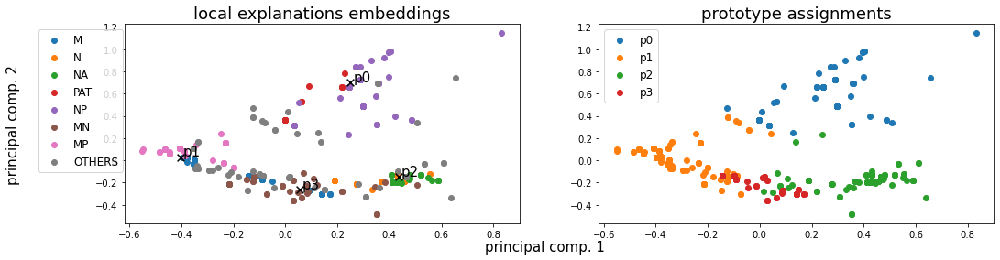

Alpha norms:
tensor([[0.5910, 1.0000, 0.5731, 0.3652],
        [0.1570, 1.0000, 0.2928, 0.2048]], grad_fn=<DivBackward0>)
Concept Purity: 0.647297 +- 0.113564
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 255, 210, 128], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


260: Loss: 0.04465, LEN: 0.044440, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04057, V. LEN 0.04
261: Loss: 0.04168, LEN: 0.041455, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03625, V. LEN 0.04
262: Loss: 0.04330, LEN: 0.043069, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
263: Loss: 0.04324, LEN: 0.043059, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
264: Loss: 0.04046, LEN: 0.040309, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04222, V. LEN 0.04
265: Loss: 0.04778, L

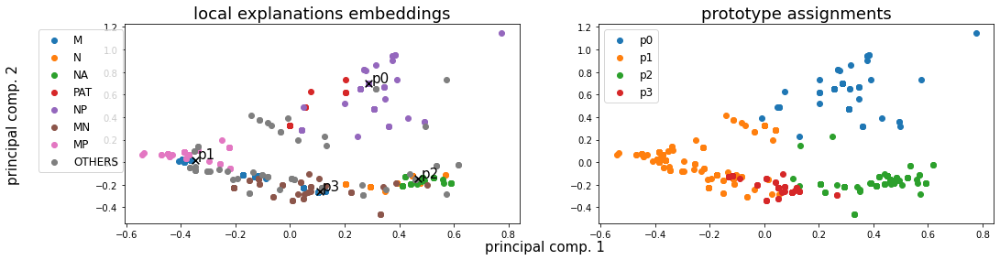

Alpha norms:
tensor([[0.6032, 1.0000, 0.5695, 0.3682],
        [0.1597, 1.0000, 0.2913, 0.2054]], grad_fn=<DivBackward0>)
Concept Purity: 0.687663 +- 0.110296
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 70, 320, 201, 118], dtype=int64))
Logic formulas:
For class 0:
0.8716502115655853 (feature002) | (feature000)
For class 1:
0.8716502115655853 (feature001) | (feature003)
Accuracy as classifier:  0.8717
LEN fidelity:  tensor(0.8717)


280: Loss: 0.04351, LEN: 0.043416, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05622, V. LEN 0.06
281: Loss: 0.04181, LEN: 0.041672, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
282: Loss: 0.04509, LEN: 0.044942, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03688, V. LEN 0.04
283: Loss: 0.04051, LEN: 0.040371, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04222, V. LEN 0.04
284: Loss: 0.04711, LEN: 0.046981, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
285: Loss: 0.04332, L

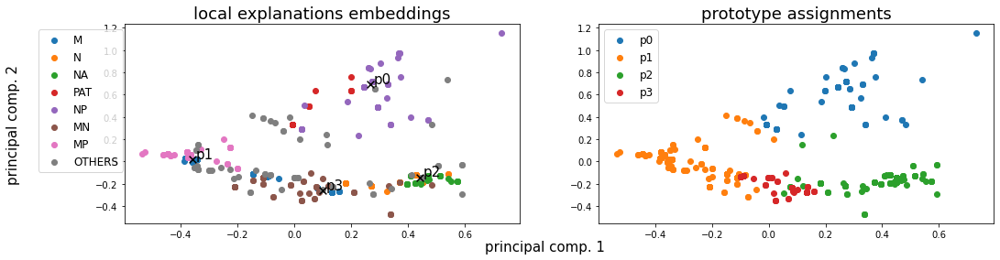

Alpha norms:
tensor([[0.6154, 1.0000, 0.5645, 0.3597],
        [0.1616, 1.0000, 0.2884, 0.2001]], grad_fn=<DivBackward0>)
Concept Purity: 0.645774 +- 0.096830
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([115, 271, 207, 116], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


300: Loss: 0.04041, LEN: 0.040263, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04036, V. LEN 0.04
301: Loss: 0.04477, LEN: 0.044636, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03666, V. LEN 0.04
302: Loss: 0.04434, LEN: 0.044164, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04035, V. LEN 0.04
303: Loss: 0.04355, LEN: 0.043427, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04204, V. LEN 0.04
304: Loss: 0.04970, LEN: 0.049259, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03687, V. LEN 0.04
305: Loss: 0.04276, L

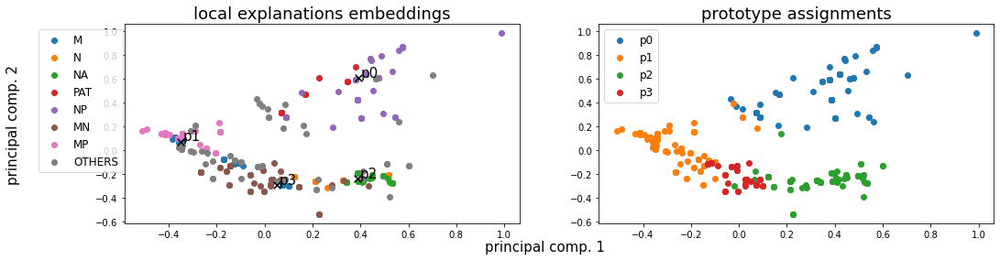

Alpha norms:
tensor([[0.6265, 1.0000, 0.5679, 0.3684],
        [0.1652, 1.0000, 0.2933, 0.2061]], grad_fn=<DivBackward0>)
Concept Purity: 0.643053 +- 0.090604
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([119, 268, 203, 119], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


320: Loss: 0.04526, LEN: 0.045102, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03703, V. LEN 0.04
321: Loss: 0.04076, LEN: 0.040631, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04522, V. LEN 0.05
322: Loss: 0.04290, LEN: 0.042739, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05599, V. LEN 0.06
323: Loss: 0.04634, LEN: 0.046218, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.05585, V. LEN 0.06
324: Loss: 0.04602, LEN: 0.045900, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03706, V. LEN 0.04
325: Loss: 0.04570, L

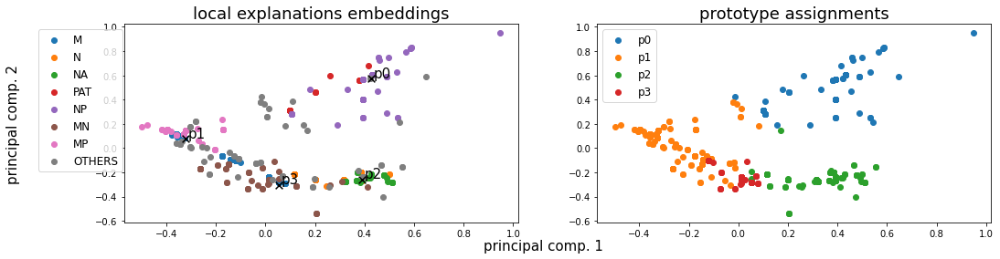

Alpha norms:
tensor([[0.6245, 1.0000, 0.5567, 0.3439],
        [0.1625, 1.0000, 0.2848, 0.1940]], grad_fn=<DivBackward0>)
Concept Purity: 0.653479 +- 0.106927
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 285, 202, 105], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


340: Loss: 0.04428, LEN: 0.044112, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03676, V. LEN 0.04
341: Loss: 0.04631, LEN: 0.046168, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03726, V. LEN 0.04
342: Loss: 0.04231, LEN: 0.042176, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03701, V. LEN 0.04
343: Loss: 0.04343, LEN: 0.043143, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04576, V. LEN 0.05
344: Loss: 0.04212, LEN: 0.041967, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04053, V. LEN 0.04
345: Loss: 0.04646, L

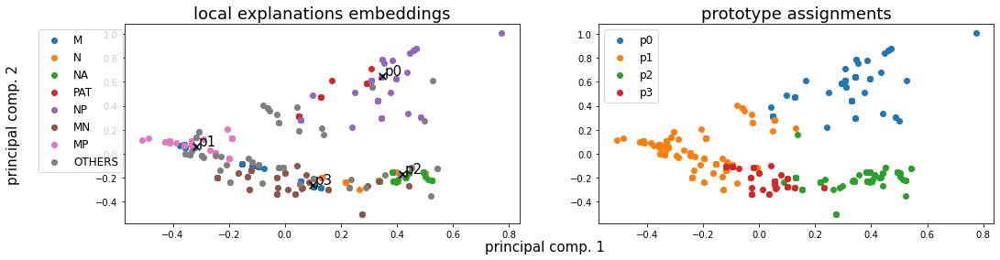

Alpha norms:
tensor([[0.6183, 1.0000, 0.5603, 0.3431],
        [0.1615, 1.0000, 0.2893, 0.1955]], grad_fn=<DivBackward0>)
Concept Purity: 0.634382 +- 0.087672
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([109, 280, 199, 121], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


360: Loss: 0.04257, LEN: 0.042434, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04249, V. LEN 0.04
361: Loss: 0.04108, LEN: 0.040970, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.05049, V. LEN 0.05
362: Loss: 0.04346, LEN: 0.043310, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03681, V. LEN 0.04
363: Loss: 0.04506, LEN: 0.044903, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03730, V. LEN 0.04
364: Loss: 0.04121, LEN: 0.041012, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04151, V. LEN 0.04
365: Loss: 0.04233, L

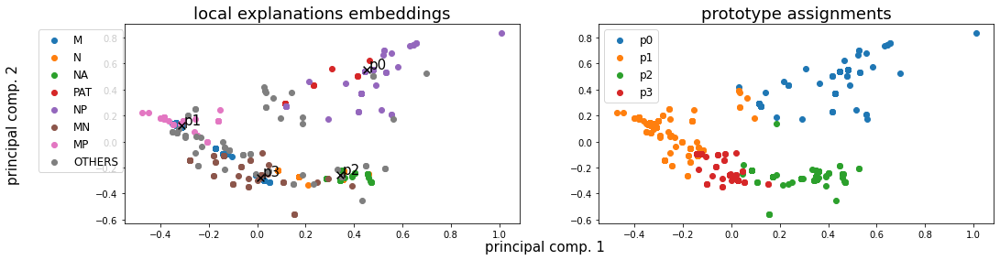

Alpha norms:
tensor([[0.6216, 1.0000, 0.5487, 0.3261],
        [0.1615, 1.0000, 0.2817, 0.1875]], grad_fn=<DivBackward0>)
Concept Purity: 0.640670 +- 0.077495
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 269, 200, 123], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


380: Loss: 0.04808, LEN: 0.047951, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03742, V. LEN 0.04
381: Loss: 0.04233, LEN: 0.042193, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04161, V. LEN 0.04
382: Loss: 0.04706, LEN: 0.046892, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03717, V. LEN 0.04
383: Loss: 0.04190, LEN: 0.041768, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05605, V. LEN 0.06
384: Loss: 0.04285, LEN: 0.042643, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03644, V. LEN 0.04
385: Loss: 0.04857, L

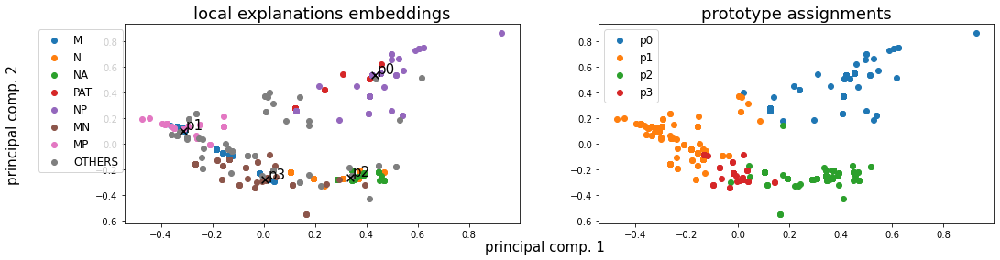

Alpha norms:
tensor([[0.6126, 1.0000, 0.5515, 0.3130],
        [0.1588, 1.0000, 0.2837, 0.1807]], grad_fn=<DivBackward0>)
Concept Purity: 0.647068 +- 0.091133
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 281, 201, 110], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


400: Loss: 0.04866, LEN: 0.048490, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03710, V. LEN 0.04
401: Loss: 0.04215, LEN: 0.042044, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04567, V. LEN 0.05
402: Loss: 0.04401, LEN: 0.043837, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03714, V. LEN 0.04
403: Loss: 0.04197, LEN: 0.041827, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04173, V. LEN 0.04
404: Loss: 0.04534, LEN: 0.045224, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03732, V. LEN 0.04
405: Loss: 0.04154, L

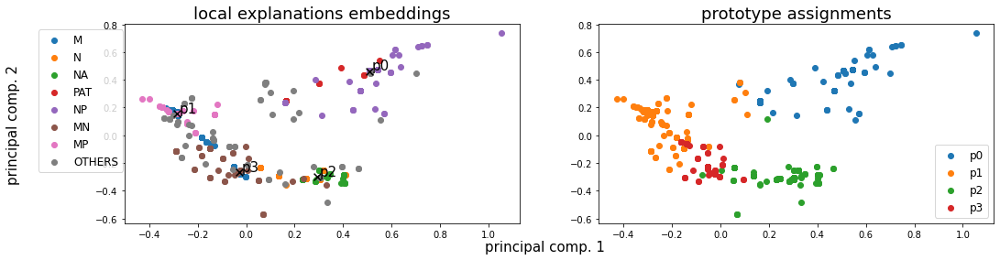

Alpha norms:
tensor([[0.5999, 1.0000, 0.5546, 0.3000],
        [0.1566, 1.0000, 0.2859, 0.1754]], grad_fn=<DivBackward0>)
Concept Purity: 0.643069 +- 0.086129
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 271, 200, 120], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


420: Loss: 0.04418, LEN: 0.044029, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03760, V. LEN 0.04
421: Loss: 0.04220, LEN: 0.042050, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04508, V. LEN 0.04
422: Loss: 0.04332, LEN: 0.043198, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03753, V. LEN 0.04
423: Loss: 0.04347, LEN: 0.043375, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03714, V. LEN 0.04
424: Loss: 0.04462, LEN: 0.044537, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03716, V. LEN 0.04
425: Loss: 0.04226, L

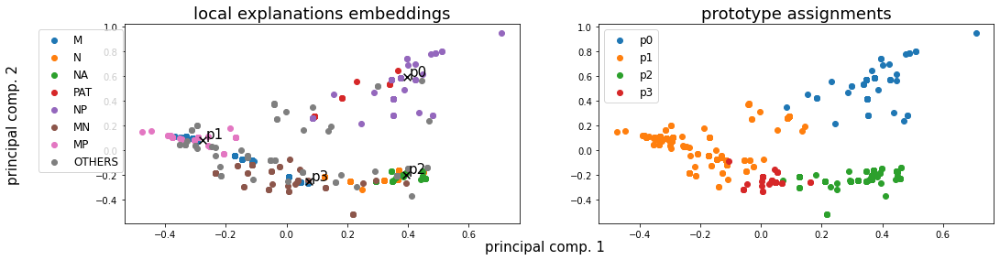

Alpha norms:
tensor([[0.6006, 1.0000, 0.5456, 0.2804],
        [0.1555, 1.0000, 0.2782, 0.1654]], grad_fn=<DivBackward0>)
Concept Purity: 0.674000 +- 0.083647
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 70, 386, 198,  55], dtype=int64))
Logic formulas:
For class 0:
0.8702397743300423 (feature002) | (feature000)
For class 1:
0.8702397743300423 (feature001) | (feature003)
Accuracy as classifier:  0.8702
LEN fidelity:  tensor(0.8702)


440: Loss: 0.04156, LEN: 0.041428, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05519, V. LEN 0.06
441: Loss: 0.04498, LEN: 0.044848, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03753, V. LEN 0.04
442: Loss: 0.04311, LEN: 0.042966, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03735, V. LEN 0.04
443: Loss: 0.04108, LEN: 0.040963, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05588, V. LEN 0.06
444: Loss: 0.04437, LEN: 0.044270, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03654, V. LEN 0.04
445: Loss: 0.04343, L

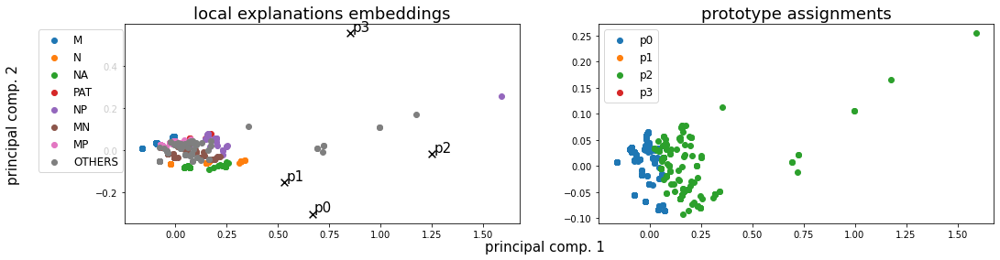

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.394417 +- 0.104645
Concept distribution:  (array([0, 2], dtype=int64), array([533, 176], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.47890, LEN: 0.353197, AccxC: 0.30, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.46491, V. LEN 0.35
  2: Loss: 0.47169, LEN: 0.352833, AccxC: 0.36, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.46644, V. LEN 0.35
  3: Loss: 0.46218, LEN: 0.352285, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.46408, V. LEN 0.35
  4: Loss: 0.45771, LEN: 0.351994, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.45434, V. LEN 0.35
  5: Loss: 0.44732, LEN: 0.351599, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.44099, V. LEN 0.35
  6: Loss: 0.43183, LEN: 0.351325, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.42294, V. LEN 0.35
  7: Loss: 0.41633, L

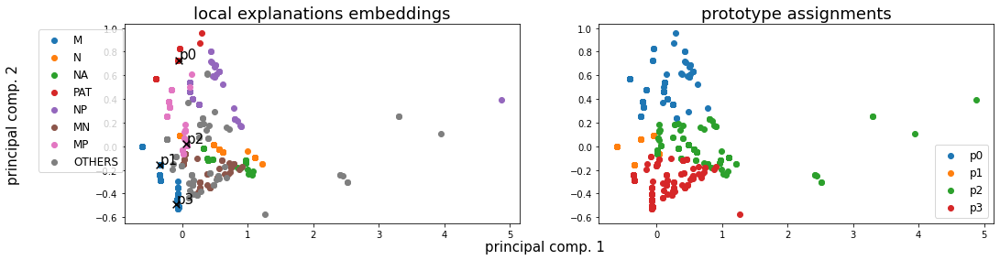

Alpha norms:
tensor([[0.9577, 0.7829, 0.7451, 1.0000],
        [0.7964, 0.8794, 1.0000, 0.9787]], grad_fn=<DivBackward0>)
Concept Purity: 0.478424 +- 0.107115
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([132, 242, 112, 223], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.35993, LEN: 0.346506, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35817, V. LEN 0.35
 21: Loss: 0.35858, LEN: 0.346516, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35639, V. LEN 0.35
 22: Loss: 0.35653, LEN: 0.346045, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35492, V. LEN 0.35
 23: Loss: 0.35540, LEN: 0.345828, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35347, V. LEN 0.35
 24: Loss: 0.35430, LEN: 0.345238, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35245, V. LEN 0.35
 25: Loss: 0.35217, LEN: 0.345062, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35091, V. LEN 0.34
 26:

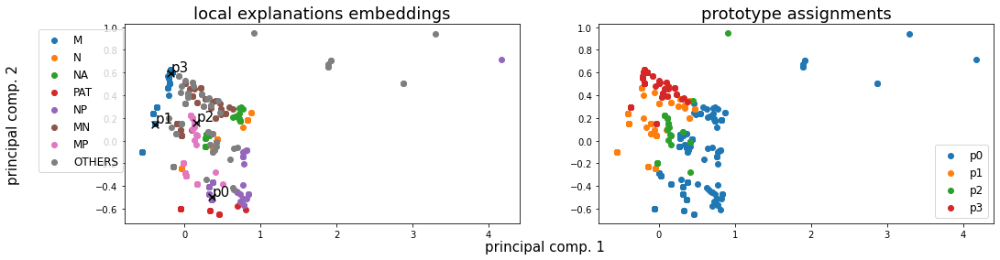

Alpha norms:
tensor([[0.6504, 0.7163, 0.5649, 1.0000],
        [0.7708, 0.9520, 0.6885, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.591556 +- 0.216174
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([228, 312,  28, 141], dtype=int64))
Logic formulas:
For class 0:
0.7263751763046544 (feature000) | ((feature002)
For class 1:
0.763046544428773 (feature001) | (feature003) | ((feature002)

------------------------------------------------------------------------------------
Has double activations  tensor(28)
But only for wrong predictions

Accuracy as classifier:  0.725
LEN fidelity:  tensor(0.7250)


 40: Loss: 0.33835, LEN: 0.336251, AccxC: 0.76, AccO: 0.63, V. Acc: 0.79, V. Loss: 0.33535, V. LEN 0.33
 41: Loss: 0.33627, LEN: 0.335072, AccxC: 0.77, AccO: 0.73, V. Acc: 0.83, V. Loss: 0.33244, V. LEN 0.33
 42: Loss: 0.33161, LEN: 0.330372, AccxC: 0.86, AccO: 0.82, V. Acc: 0.85, V. Loss: 0.32966, V. LEN 0.33
 43: Loss: 0.32948, LEN: 0.328628, AccxC: 0.86, AccO: 0.81, V

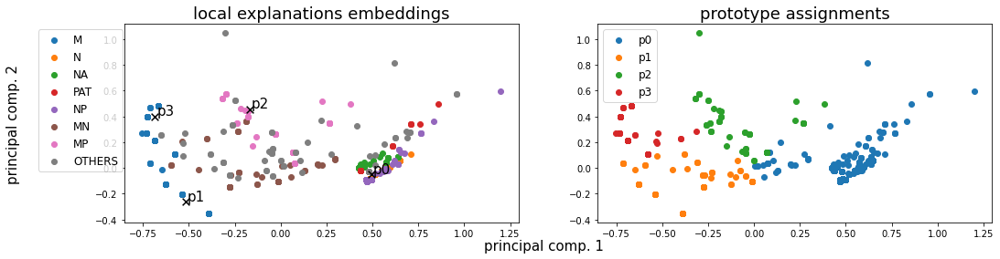

Alpha norms:
tensor([[0.5579, 0.9413, 0.3871, 1.0000],
        [0.8125, 1.0000, 0.4081, 0.8285]], grad_fn=<DivBackward0>)
Concept Purity: 0.673750 +- 0.204516
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([330, 205,  59, 115], dtype=int64))
Logic formulas:
For class 0:
0.8787023977433004 (feature000)
For class 1:
0.8787023977433004 (feature001) | (feature003) | ((feature002)
Accuracy as classifier:  0.8787
LEN fidelity:  tensor(0.8787)


 60: Loss: 0.29214, LEN: 0.290953, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.28832, V. LEN 0.29
 61: Loss: 0.28873, LEN: 0.287775, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.28508, V. LEN 0.28
 62: Loss: 0.28497, LEN: 0.284094, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.28167, V. LEN 0.28
 63: Loss: 0.28288, LEN: 0.281544, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.27816, V. LEN 0.28
 64: Loss: 0.27735, LEN: 0.276289, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.27404, V. LEN 0.27
 65: Loss: 0.27414, 

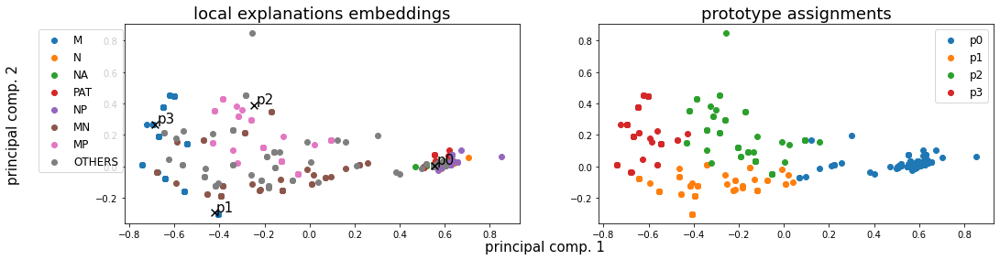

Alpha norms:
tensor([[0.6552, 1.0000, 0.4070, 0.9799],
        [0.5769, 1.0000, 0.2269, 0.6267]], grad_fn=<DivBackward0>)
Concept Purity: 0.672481 +- 0.177597
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([313, 208,  62, 126], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature000)
For class 1:
0.8913963328631875 (feature001) | (feature003) | ((feature002)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


 80: Loss: 0.21211, LEN: 0.211305, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.20832, V. LEN 0.21
 81: Loss: 0.20475, LEN: 0.204025, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.20464, V. LEN 0.20
 82: Loss: 0.20519, LEN: 0.204307, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.20023, V. LEN 0.20
 83: Loss: 0.19701, LEN: 0.196132, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.19616, V. LEN 0.20
 84: Loss: 0.19572, LEN: 0.194843, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.19210, V. LEN 0.19
 85: Loss: 0.19558, 

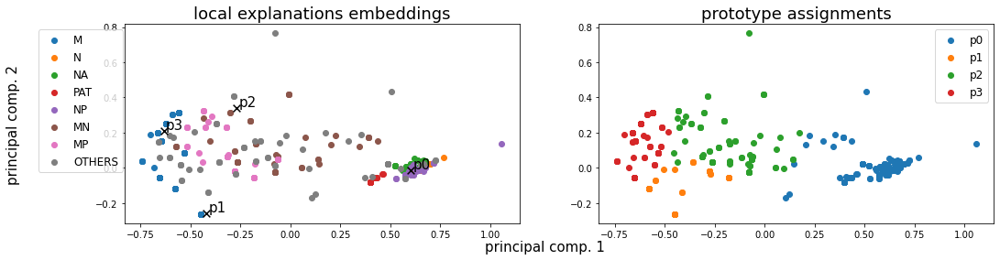

Alpha norms:
tensor([[0.8071, 0.9613, 0.3946, 1.0000],
        [0.5109, 1.0000, 0.1318, 0.5968]], grad_fn=<DivBackward0>)
Concept Purity: 0.647779 +- 0.216814
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([313, 148,  88, 160], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature000)
For class 1:
0.8970380818053597 (feature001) | ((feature002) | (feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


100: Loss: 0.16779, LEN: 0.167111, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.16529, V. LEN 0.16
101: Loss: 0.16376, LEN: 0.163087, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.15176, V. LEN 0.15
102: Loss: 0.16172, LEN: 0.160966, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.15095, V. LEN 0.15
103: Loss: 0.16454, LEN: 0.163771, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14985, V. LEN 0.15
104: Loss: 0.16010, LEN: 0.159288, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14921, V. LEN 0.15
105: Loss: 0.16018, L

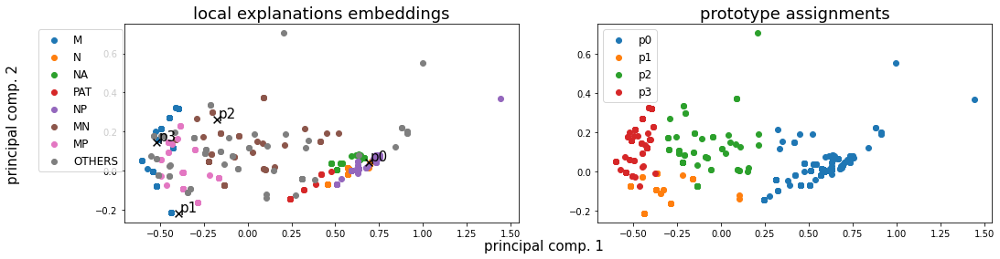

Alpha norms:
tensor([[0.6914, 0.8967, 0.2474, 1.0000],
        [0.4003, 1.0000, 0.0730, 0.5635]], grad_fn=<DivBackward0>)
Concept Purity: 0.655701 +- 0.169276
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([309, 156,  72, 172], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature000)
For class 1:
0.8998589562764457 (feature001) | ((feature002) | (feature003)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


120: Loss: 0.15874, LEN: 0.158104, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14191, V. LEN 0.14
121: Loss: 0.15698, LEN: 0.156090, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14726, V. LEN 0.15
122: Loss: 0.17538, LEN: 0.174622, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.14245, V. LEN 0.14
123: Loss: 0.15618, LEN: 0.155475, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14732, V. LEN 0.15
124: Loss: 0.15875, LEN: 0.157782, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14103, V. LEN 0.14
125: Loss: 0.15373, 

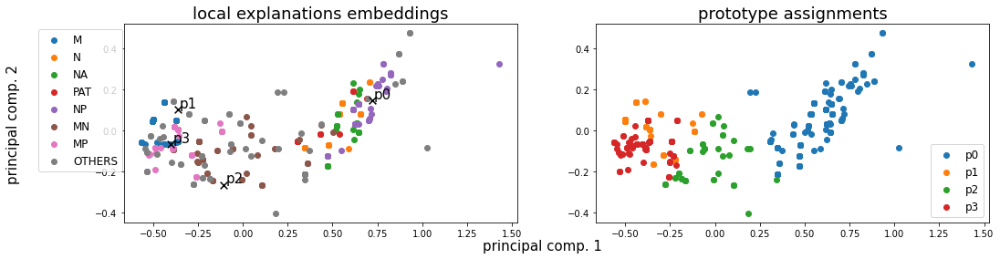

Alpha norms:
tensor([[0.5772, 0.8959, 0.1206, 1.0000],
        [0.3035, 1.0000, 0.0477, 0.5088]], grad_fn=<DivBackward0>)
Concept Purity: 0.606463 +- 0.146465
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([310, 193,  40, 166], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003) | ((feature002)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


140: Loss: 0.16351, LEN: 0.162925, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14302, V. LEN 0.14
141: Loss: 0.17394, LEN: 0.172854, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.14795, V. LEN 0.15
142: Loss: 0.15486, LEN: 0.154416, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.15338, V. LEN 0.15
143: Loss: 0.15519, LEN: 0.154287, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14626, V. LEN 0.15
144: Loss: 0.15477, LEN: 0.153947, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14634, V. LEN 0.15
145: Loss: 0.15747, 

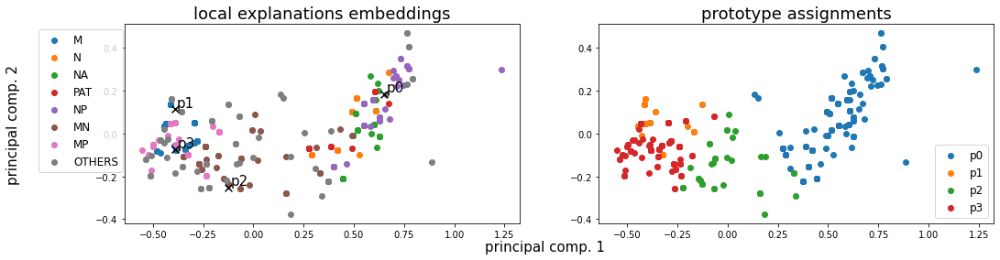

Alpha norms:
tensor([[0.4666, 0.8849, 0.0639, 1.0000],
        [0.2340, 1.0000, 0.0359, 0.4735]], grad_fn=<DivBackward0>)
Concept Purity: 0.629959 +- 0.143862
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([307, 155,  38, 209], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature000)
For class 1:
0.8970380818053597 (feature001) | (feature003) | ((feature002)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


160: Loss: 0.15098, LEN: 0.150329, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.14330, V. LEN 0.14
161: Loss: 0.15511, LEN: 0.154694, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14319, V. LEN 0.14
162: Loss: 0.15144, LEN: 0.150858, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.14328, V. LEN 0.14
163: Loss: 0.15297, LEN: 0.152483, AccxC: 0.90, AccO: 0.90, V. Acc: 0.85, V. Loss: 0.15686, V. LEN 0.16
164: Loss: 0.15886, LEN: 0.158350, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.14314, V. LEN 0.14
165: Loss: 0.15769, L

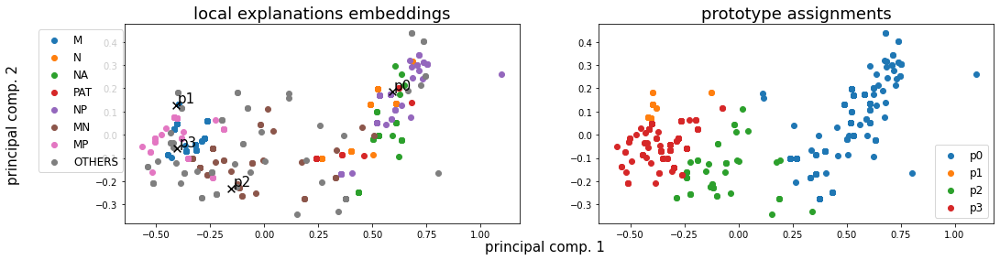

Alpha norms:
tensor([[0.3983, 0.8936, 0.0514, 1.0000],
        [0.1897, 1.0000, 0.0288, 0.4257]], grad_fn=<DivBackward0>)
Concept Purity: 0.619708 +- 0.170451
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([310, 119,  46, 234], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature000)
For class 1:
0.8758815232722144 (feature001) | (feature003)
Accuracy as classifier:  0.8547
LEN fidelity:  tensor(0.8547)


180: Loss: 0.16004, LEN: 0.159426, AccxC: 0.87, AccO: 0.84, V. Acc: 0.86, V. Loss: 0.14649, V. LEN 0.15
181: Loss: 0.15526, LEN: 0.154660, AccxC: 0.90, AccO: 0.86, V. Acc: 0.77, V. Loss: 0.14965, V. LEN 0.15
182: Loss: 0.16336, LEN: 0.162614, AccxC: 0.84, AccO: 0.80, V. Acc: 0.86, V. Loss: 0.14680, V. LEN 0.15
183: Loss: 0.15014, LEN: 0.149654, AccxC: 0.90, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.14338, V. LEN 0.14
184: Loss: 0.15488, LEN: 0.154198, AccxC: 0.86, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.14322, V. LEN 0.14
185: Loss: 0.14881, LEN: 0.148207, A

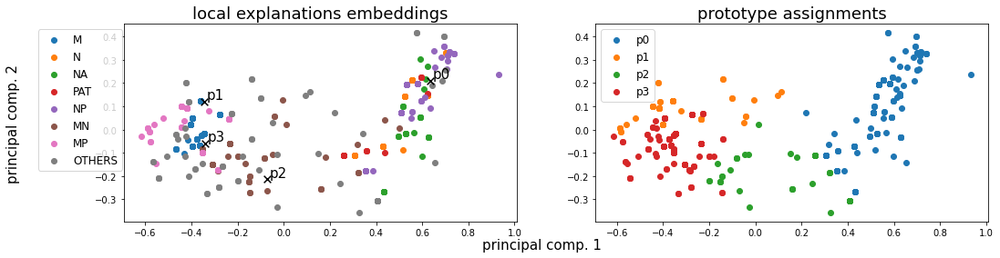

Alpha norms:
tensor([[0.3293, 0.9074, 0.0454, 1.0000],
        [0.1579, 1.0000, 0.0244, 0.3956]], grad_fn=<DivBackward0>)
Concept Purity: 0.593270 +- 0.126476
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([241, 164,  90, 214], dtype=int64))
Logic formulas:
For class 0:
0.843441466854725 (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.8096
LEN fidelity:  tensor(0.8096)


200: Loss: 0.15726, LEN: 0.156800, AccxC: 0.88, AccO: 0.85, V. Acc: 0.77, V. Loss: 0.14288, V. LEN 0.14
201: Loss: 0.15241, LEN: 0.151394, AccxC: 0.87, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.14335, V. LEN 0.14
202: Loss: 0.15268, LEN: 0.152099, AccxC: 0.90, AccO: 0.87, V. Acc: 0.83, V. Loss: 0.15659, V. LEN 0.16
203: Loss: 0.14903, LEN: 0.148542, AccxC: 0.89, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.14342, V. LEN 0.14
204: Loss: 0.14721, LEN: 0.146883, AccxC: 0.90, AccO: 0.87, V. Acc: 0.82, V. Loss: 0.13942, V. LEN 0.14
205: Loss: 0.15108, LEN: 0.150586, Ac

In [62]:
expls = []
for use_focal in [True, False]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": use_focal,
        "debug_prototypes": False,
        "num_prototypes": 4,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "embedder_backbone": "GAT",
        "embedder_num_layers": 2,
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 500
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"],
                                     backbone=hyper["embedder_backbone"],
                                     num_layers=hyper["embedder_num_layers"]).to(device)
    expl4         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=priori_etn_classes_names,
                                   dataset_name="ETN").to(device)

    prefix = "DEBUG" if hyper["debug_prototypes"] else ""
    suffix = "no attn" if hyper["remove_attention"] else ""
    expl4.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb=f"ETN {hyper['num_prototypes']}prots {prefix} {suffix}")
    
    with open(f'../logs/model_focal_{use_focal}_ETN.pkl', 'wb') as handle:
        pickle.dump(expl4, handle)

In [16]:
with open(f'../logs/model_focal_True_ETN.pkl', 'rb') as handle:
    uno = pickle.load(handle)
with open(f'../logs/model_focal_False_ETN.pkl', 'rb') as handle:
    due = pickle.load(handle)

In [19]:
print([e["acc_overall"] for e in uno.val_metrics][uno.early_stopping.best_epoch-1], "@", uno.early_stopping.best_epoch )
print([e["acc_overall"] for e in due.val_metrics][due.early_stopping.best_epoch-1], "@", due.early_stopping.best_epoch)

tensor(0.9242) @ 357
tensor(0.9242) @ 115


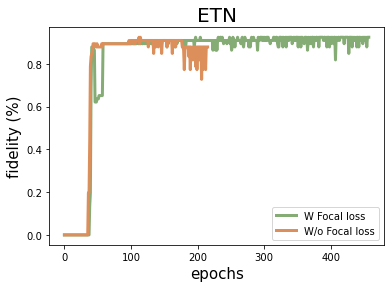

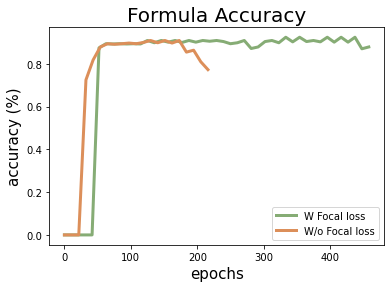

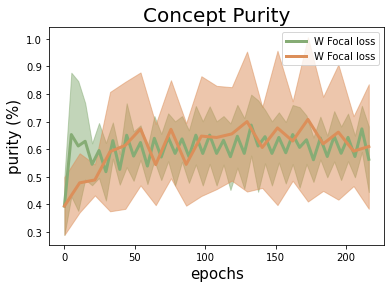

In [64]:
c1 = "#86ac75"
c2 = "#dc8f5a"

print([e["acc_overall"] for e in uno.val_metrics][uno.early_stopping.best_epoch-1])

plt.plot([e["acc_overall"] for e in uno.val_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot([e["acc_overall"] for e in due.val_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("ETN", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.savefig("fidelity_focal_etn.pdf")
plt.show()

plt.plot(np.linspace(0, len([e["acc_overall"] for e in uno.val_metrics]), num=len([e["logic_acc_clf"] for e in uno.val_logic_metrics])), [e["logic_acc_clf"] for e in uno.val_logic_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len([e["logic_acc_clf"] for e in due.val_logic_metrics])), [e["logic_acc_clf"] for e in due.val_logic_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.savefig("formula_acc_focal_etn.pdf")
plt.show()


purity     = np.array([e["concept_purity"] for e in uno.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in uno.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c1, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c1)

purity     = np.array([e["concept_purity"] for e in due.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in due.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c2, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c2)



plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.savefig("purity_focal_etn.pdf")
plt.show()

### Confidence Interval

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


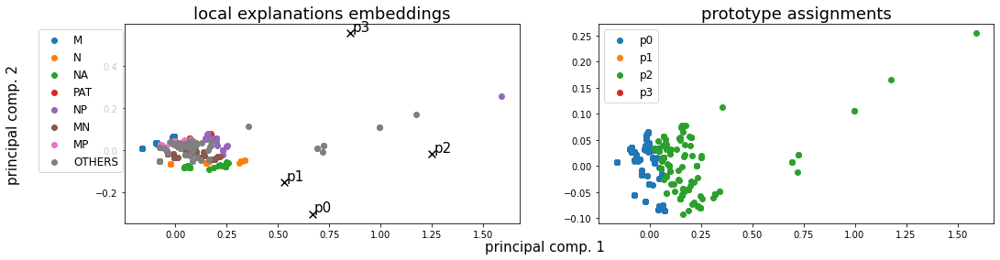

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.394417 +- 0.104645
Concept distribution:  (array([0, 2], dtype=int64), array([533, 176], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.22604, LEN: 0.096665, AccxC: 0.37, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21372, V. LEN 0.10
  2: Loss: 0.21171, LEN: 0.096186, AccxC: 0.37, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20986, V. LEN 0.10
  3: Loss: 0.20532, LEN: 0.095687, AccxC: 0.36, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20738, V. LEN 0.10
  4: Loss: 0.20054, LEN: 0.095165, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19843, V. LEN 0.10
  5: Loss: 0.19013, LEN: 0.094636, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18705, V. LEN 0.09
  6: Loss: 0.17253, LEN: 0.094168, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16718, V. LEN 0.09
  7: Loss: 0.15789, L

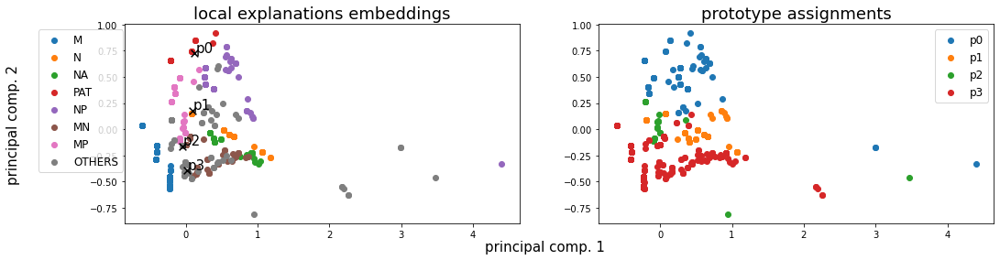

Alpha norms:
tensor([[0.9721, 0.7405, 0.9314, 1.0000],
        [1.0000, 0.7285, 0.9246, 0.7851]], grad_fn=<DivBackward0>)
Concept Purity: 0.678380 +- 0.164636
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([133, 174,  25, 377], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.09707, LEN: 0.089631, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09397, V. LEN 0.09
 21: Loss: 0.09660, LEN: 0.089396, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09263, V. LEN 0.09
 22: Loss: 0.09379, LEN: 0.089028, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09146, V. LEN 0.09
 23: Loss: 0.09320, LEN: 0.088591, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09095, V. LEN 0.09
 24: Loss: 0.09233, LEN: 0.088205, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09019, V. LEN 0.09
 25: Loss: 0.09182, LEN: 0.087825, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08923, V. LEN 0.09
 26:

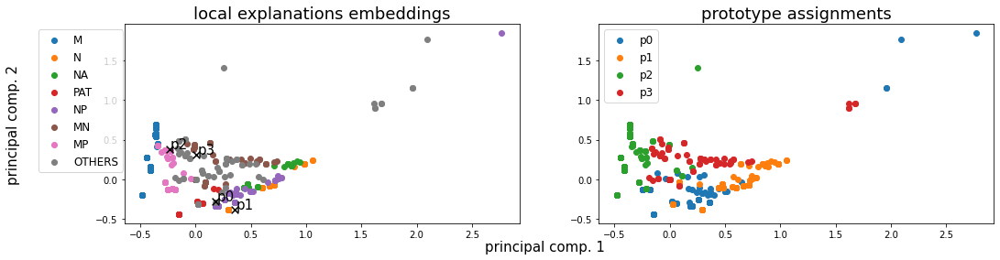

Alpha norms:
tensor([[0.5461, 0.7061, 1.0000, 0.8891],
        [1.0000, 0.4393, 0.6454, 0.8698]], grad_fn=<DivBackward0>)
Concept Purity: 0.608658 +- 0.166423
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([128, 200, 305,  76], dtype=int64))
Logic formulas:
For class 0:
0.8561354019746121 (feature001) | ((feature000)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4880)


 40: Loss: 0.08288, LEN: 0.080709, AccxC: 0.85, AccO: 0.48, V. Acc: 0.45, V. Loss: 0.08231, V. LEN 0.08
 41: Loss: 0.08163, LEN: 0.079982, AccxC: 0.88, AccO: 0.51, V. Acc: 0.45, V. Loss: 0.08142, V. LEN 0.08
 42: Loss: 0.08118, LEN: 0.079643, AccxC: 0.86, AccO: 0.49, V. Acc: 0.45, V. Loss: 0.08053, V. LEN 0.08
 43: Loss: 0.08050, LEN: 0.079070, AccxC: 0.85, AccO: 0.48, V. Acc: 0.45, V. Loss: 0.07972, V. LEN 0.08
 44: Loss: 0.08018, LEN: 0.078192, AccxC: 0.87, AccO: 0.50, V. Acc: 0.71, V. Loss: 0.07900, V. LEN 0.08
 45: Loss: 0.07898, LEN: 0.077451, AccxC: 0.87, AccO: 0.64, V. 

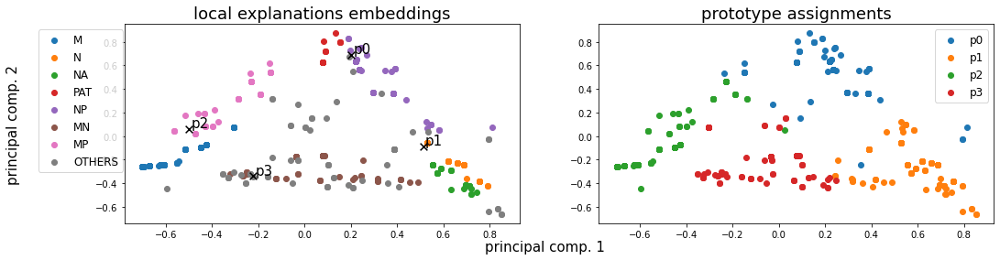

Alpha norms:
tensor([[0.2522, 0.7579, 1.0000, 0.5574],
        [1.0000, 0.5306, 0.5503, 0.7666]], grad_fn=<DivBackward0>)
Concept Purity: 0.612151 +- 0.125223
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([119, 208, 203, 179], dtype=int64))
Logic formulas:
For class 0:
0.8801128349788434 (feature001) | ((feature000)
For class 1:
0.8801128349788434 (feature003) | (feature002)
Accuracy as classifier:  0.8801
LEN fidelity:  tensor(0.8801)


 60: Loss: 0.06621, LEN: 0.065262, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06641, V. LEN 0.07
 61: Loss: 0.06547, LEN: 0.064679, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.06393, V. LEN 0.06
 62: Loss: 0.06436, LEN: 0.062817, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.06296, V. LEN 0.06
 63: Loss: 0.06276, LEN: 0.061411, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.06334, V. LEN 0.06
 64: Loss: 0.06268, LEN: 0.061714, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06211, V. LEN 0.06
 65: Loss: 0.06188, 

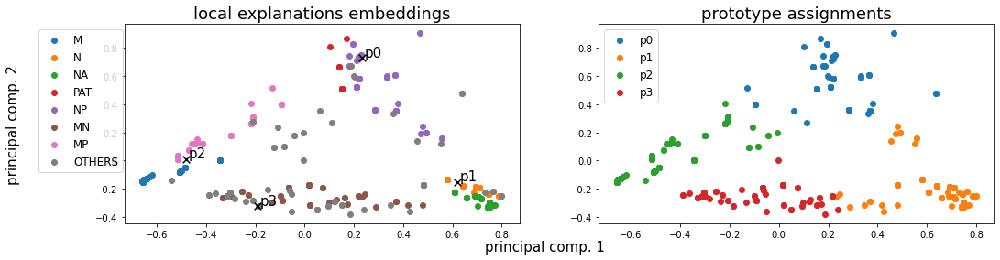

Alpha norms:
tensor([[0.2611, 0.7949, 1.0000, 0.3274],
        [1.0000, 0.7418, 0.7270, 0.7313]], grad_fn=<DivBackward0>)
Concept Purity: 0.629874 +- 0.136879
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 204, 312,  77], dtype=int64))
Logic formulas:
For class 0:
0.8871650211565585 (feature001) | ((feature000)
For class 1:
0.8871650211565585 ((feature002) | (feature003)
Accuracy as classifier:  0.8872
LEN fidelity:  tensor(0.8872)


 80: Loss: 0.04891, LEN: 0.048261, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04791, V. LEN 0.05
 81: Loss: 0.04774, LEN: 0.046963, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04725, V. LEN 0.05
 82: Loss: 0.04749, LEN: 0.046806, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04658, V. LEN 0.05
 83: Loss: 0.04610, LEN: 0.045374, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04605, V. LEN 0.05
 84: Loss: 0.04629, LEN: 0.045555, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04559, V. LEN 0.04
 85: Loss: 0.04679,

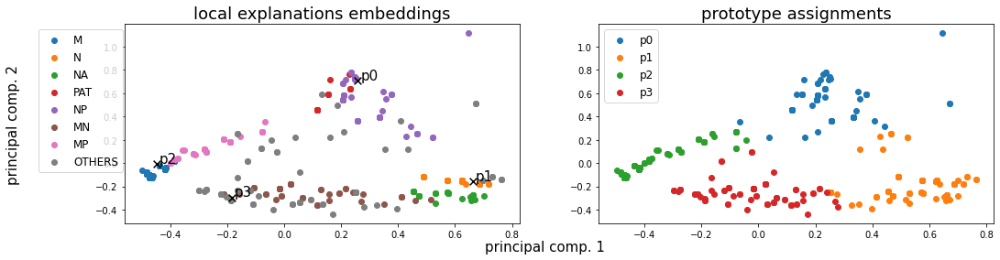

Alpha norms:
tensor([[0.2980, 0.6130, 1.0000, 0.2481],
        [1.0000, 0.9095, 0.9166, 0.4854]], grad_fn=<DivBackward0>)
Concept Purity: 0.630178 +- 0.136355
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 202, 311,  83], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature001) | (feature000)
For class 1:
0.8942172073342737 (feature002) | ((feature003)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


100: Loss: 0.04304, LEN: 0.042638, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04295, V. LEN 0.04
101: Loss: 0.04669, LEN: 0.046134, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04285, V. LEN 0.04
102: Loss: 0.04621, LEN: 0.045313, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04284, V. LEN 0.04
103: Loss: 0.04627, LEN: 0.045450, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03966, V. LEN 0.04
104: Loss: 0.04293, LEN: 0.042487, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04265, V. LEN 0.04
105: Loss: 0.04400, 

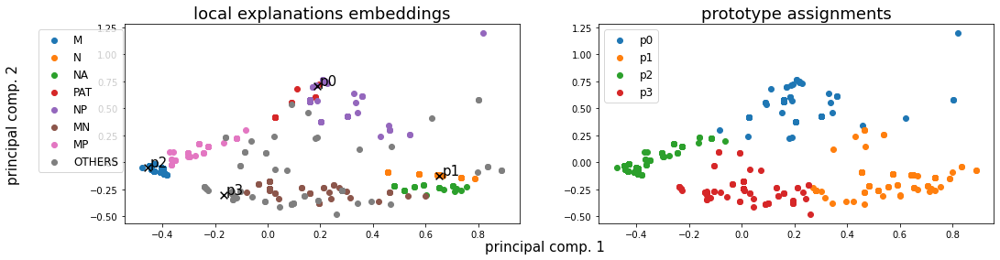

Alpha norms:
tensor([[0.2996, 0.4792, 1.0000, 0.2010],
        [0.9888, 0.8765, 1.0000, 0.3916]], grad_fn=<DivBackward0>)
Concept Purity: 0.624853 +- 0.141875
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 205, 309,  82], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature001) | (feature000)
For class 1:
0.8899858956276445 (feature002) | ((feature003)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


120: Loss: 0.04540, LEN: 0.044866, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04218, V. LEN 0.04
121: Loss: 0.04471, LEN: 0.044377, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04225, V. LEN 0.04
122: Loss: 0.04384, LEN: 0.043008, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04223, V. LEN 0.04
123: Loss: 0.04194, LEN: 0.041446, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04215, V. LEN 0.04
124: Loss: 0.04338, LEN: 0.042948, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.04420, V. LEN 0.04
125: Loss: 0.04244, LE

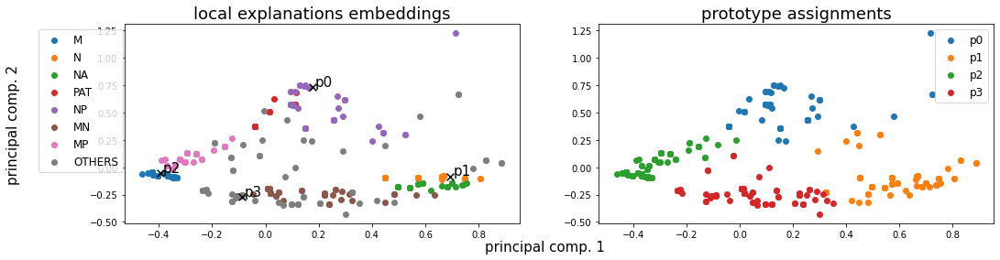

Alpha norms:
tensor([[0.2846, 0.4288, 1.0000, 0.1729],
        [0.9524, 0.8343, 1.0000, 0.3568]], grad_fn=<DivBackward0>)
Concept Purity: 0.633216 +- 0.131063
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([111, 201, 313,  84], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature001) | (feature000)
For class 1:
0.8956276445698167 (feature002) | ((feature003)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


140: Loss: 0.04213, LEN: 0.041738, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04232, V. LEN 0.04
141: Loss: 0.04253, LEN: 0.042030, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.04376, V. LEN 0.04
142: Loss: 0.04340, LEN: 0.043003, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04220, V. LEN 0.04
143: Loss: 0.04361, LEN: 0.043305, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04210, V. LEN 0.04
144: Loss: 0.04376, LEN: 0.043329, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04201, V. LEN 0.04
145: Loss: 0.04681, 

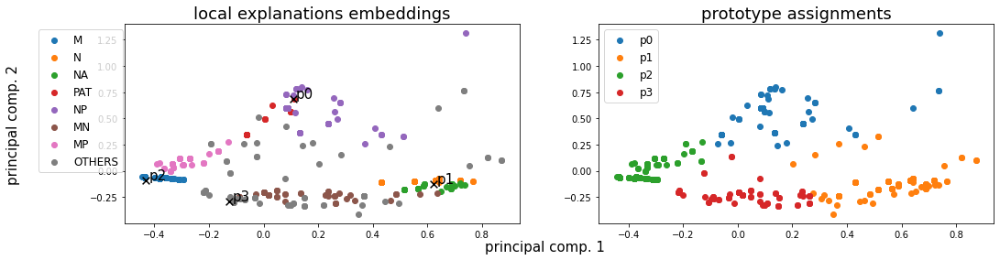

Alpha norms:
tensor([[0.2730, 0.3959, 1.0000, 0.1545],
        [0.9433, 0.8022, 1.0000, 0.3475]], grad_fn=<DivBackward0>)
Concept Purity: 0.631939 +- 0.133248
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 205, 311,  77], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature001) | (feature000)
For class 1:
0.8913963328631875 (feature002) | ((feature003)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


160: Loss: 0.04516, LEN: 0.044628, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04173, V. LEN 0.04
161: Loss: 0.04353, LEN: 0.042916, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03932, V. LEN 0.04
162: Loss: 0.04216, LEN: 0.041667, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04181, V. LEN 0.04
163: Loss: 0.04317, LEN: 0.042733, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04191, V. LEN 0.04
164: Loss: 0.04746, LEN: 0.046939, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03899, V. LEN 0.04
165: Loss: 0.04343, 

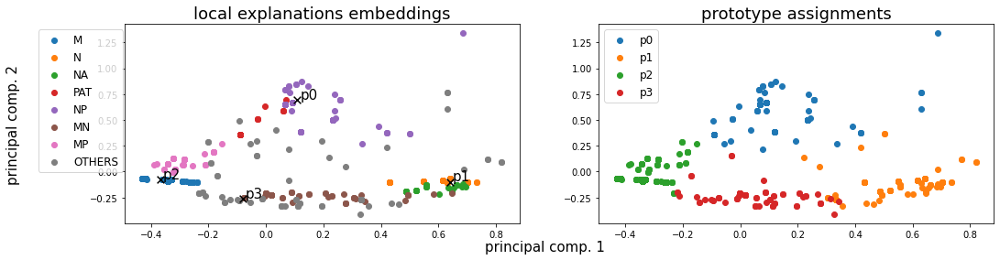

Alpha norms:
tensor([[0.2664, 0.3896, 1.0000, 0.1503],
        [0.9483, 0.8041, 1.0000, 0.3558]], grad_fn=<DivBackward0>)
Concept Purity: 0.636066 +- 0.126396
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 203, 314,  75], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature001) | (feature000)
For class 1:
0.8956276445698167 (feature002) | ((feature003)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


180: Loss: 0.04584, LEN: 0.045465, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03884, V. LEN 0.04
181: Loss: 0.04205, LEN: 0.041614, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04153, V. LEN 0.04
182: Loss: 0.04285, LEN: 0.042479, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03864, V. LEN 0.04
183: Loss: 0.04213, LEN: 0.041683, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03828, V. LEN 0.04
184: Loss: 0.04411, LEN: 0.043782, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03829, V. LEN 0.04
185: Loss: 0.04322, 

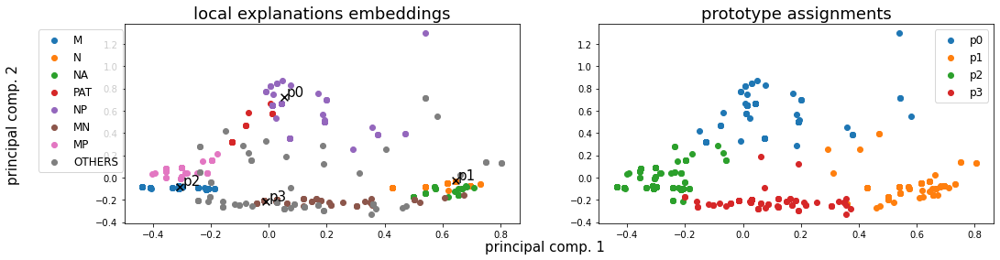

Alpha norms:
tensor([[0.2739, 0.3920, 1.0000, 0.1478],
        [0.9749, 0.8112, 1.0000, 0.3581]], grad_fn=<DivBackward0>)
Concept Purity: 0.647087 +- 0.110870
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 198, 321,  77], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature000)
For class 1:
0.8970380818053597 (feature002) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


200: Loss: 0.04320, LEN: 0.042799, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03855, V. LEN 0.04
201: Loss: 0.05085, LEN: 0.050471, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03654, V. LEN 0.04
202: Loss: 0.04445, LEN: 0.044018, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03875, V. LEN 0.04
203: Loss: 0.04345, LEN: 0.042915, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03895, V. LEN 0.04
204: Loss: 0.04252, LEN: 0.042060, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03887, V. LEN 0.04
205: Loss: 0.04282, L

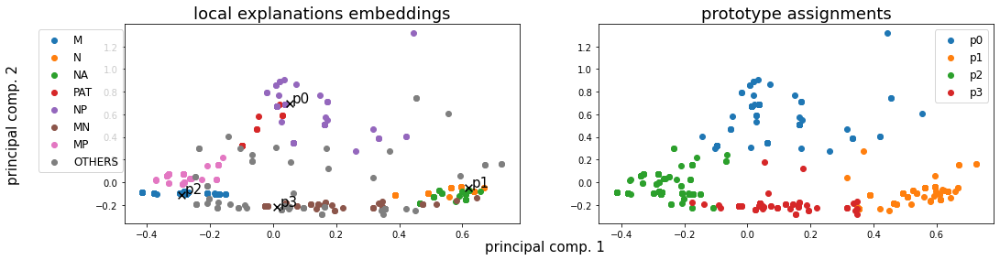

Alpha norms:
tensor([[0.2739, 0.3868, 1.0000, 0.1444],
        [0.9817, 0.8066, 1.0000, 0.3550]], grad_fn=<DivBackward0>)
Concept Purity: 0.654520 +- 0.100697
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 198, 326,  68], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature000)
For class 1:
0.8970380818053597 (feature002) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


220: Loss: 0.04587, LEN: 0.045536, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03608, V. LEN 0.04
221: Loss: 0.04267, LEN: 0.042275, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03815, V. LEN 0.04
222: Loss: 0.04207, LEN: 0.041839, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03615, V. LEN 0.04
223: Loss: 0.04323, LEN: 0.042981, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03817, V. LEN 0.04
224: Loss: 0.04467, LEN: 0.044279, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03574, V. LEN 0.04
225: Loss: 0.04348, L

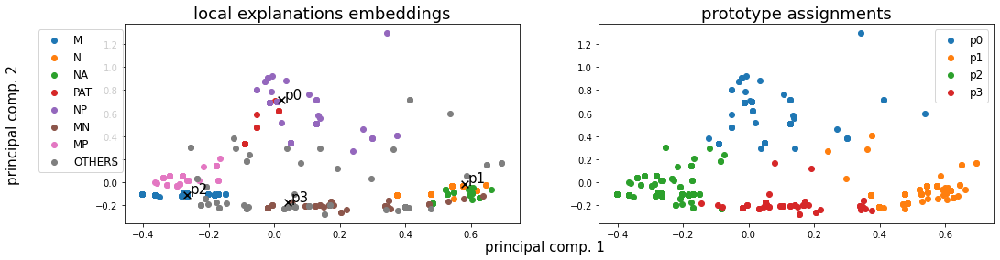

Alpha norms:
tensor([[0.2761, 0.3761, 1.0000, 0.1400],
        [0.9898, 0.7842, 1.0000, 0.3466]], grad_fn=<DivBackward0>)
Concept Purity: 0.657601 +- 0.100311
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 198, 328,  70], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature000)
For class 1:
0.8970380818053597 (feature002) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


240: Loss: 0.04283, LEN: 0.042591, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03836, V. LEN 0.04
241: Loss: 0.04258, LEN: 0.042293, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03749, V. LEN 0.04
242: Loss: 0.04129, LEN: 0.041020, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03612, V. LEN 0.04
243: Loss: 0.04175, LEN: 0.041446, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.05094, V. LEN 0.05
244: Loss: 0.04446, LEN: 0.044315, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03820, V. LEN 0.04
245: Loss: 0.04740, L

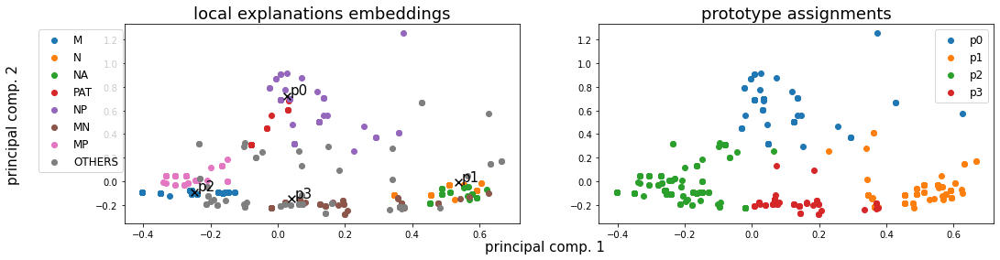

Alpha norms:
tensor([[0.2777, 0.3741, 1.0000, 0.1385],
        [1.0000, 0.7821, 0.9989, 0.3475]], grad_fn=<DivBackward0>)
Concept Purity: 0.692281 +- 0.088505
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 72, 203, 379,  55], dtype=int64))
Logic formulas:
For class 0:
0.8660084626234132 (feature001) | (feature000)
For class 1:
0.8660084626234132 (feature002) | ((feature003)
Accuracy as classifier:  0.866
LEN fidelity:  tensor(0.8660)


260: Loss: 0.04274, LEN: 0.042385, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.05005, V. LEN 0.05
261: Loss: 0.04407, LEN: 0.043862, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03660, V. LEN 0.04
262: Loss: 0.04049, LEN: 0.040265, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.05009, V. LEN 0.05
263: Loss: 0.04502, LEN: 0.044656, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03421, V. LEN 0.03
264: Loss: 0.04134, LEN: 0.041015, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03658, V. LEN 0.04
265: Loss: 0.04589, L

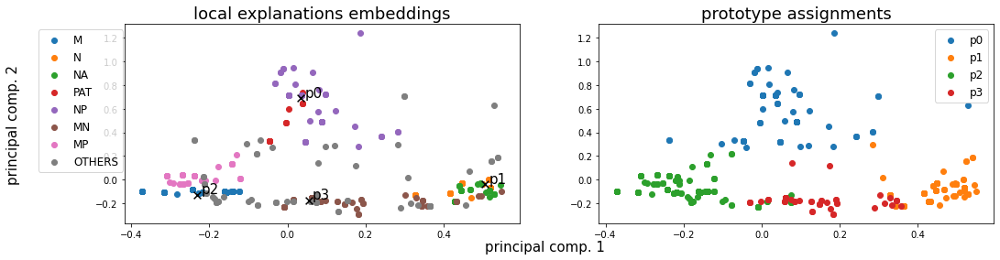

Alpha norms:
tensor([[0.2841, 0.3772, 1.0000, 0.1384],
        [1.0000, 0.7709, 0.9816, 0.3416]], grad_fn=<DivBackward0>)
Concept Purity: 0.658545 +- 0.093381
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([120, 197, 340,  52], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature000)
For class 1:
0.8970380818053597 (feature002) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


280: Loss: 0.04834, LEN: 0.047904, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03443, V. LEN 0.03
281: Loss: 0.04189, LEN: 0.041653, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03489, V. LEN 0.03
282: Loss: 0.04100, LEN: 0.040782, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03669, V. LEN 0.04
283: Loss: 0.04145, LEN: 0.041067, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03435, V. LEN 0.03
284: Loss: 0.04210, LEN: 0.041810, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03426, V. LEN 0.03
285: Loss: 0.04648, L

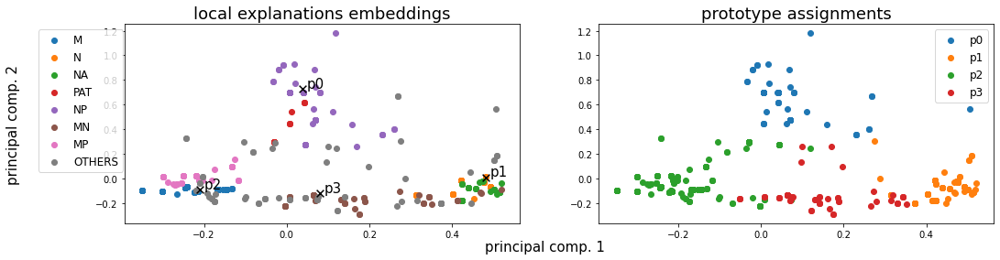

Alpha norms:
tensor([[0.2822, 0.3792, 1.0000, 0.1369],
        [1.0000, 0.7792, 0.9817, 0.3407]], grad_fn=<DivBackward0>)
Concept Purity: 0.711167 +- 0.073629
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 67, 194, 391,  57], dtype=int64))
Logic formulas:
For class 0:
0.8631875881523272 (feature001) | (feature000)
For class 1:
0.8631875881523272 (feature002) | ((feature003)
Accuracy as classifier:  0.8632
LEN fidelity:  tensor(0.8632)


300: Loss: 0.04193, LEN: 0.041660, AccxC: 0.90, AccO: 0.90, V. Acc: 0.86, V. Loss: 0.05726, V. LEN 0.06
301: Loss: 0.04406, LEN: 0.043885, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03380, V. LEN 0.03
302: Loss: 0.04162, LEN: 0.041387, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03941, V. LEN 0.04
303: Loss: 0.04392, LEN: 0.043743, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03386, V. LEN 0.03
304: Loss: 0.04837, LEN: 0.048183, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03384, V. LEN 0.03
305: Loss: 0.04112, 

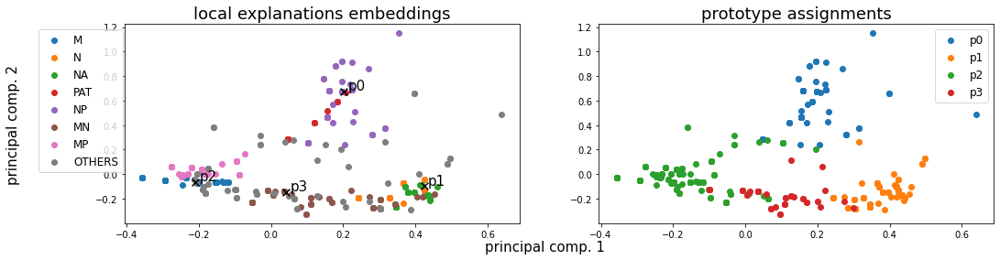

Alpha norms:
tensor([[0.2866, 0.3816, 1.0000, 0.1396],
        [1.0000, 0.7656, 0.9596, 0.3394]], grad_fn=<DivBackward0>)
Concept Purity: 0.656033 +- 0.088034
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([108, 201, 356,  44], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | (feature000)
For class 1:
0.9026798307475318 (feature002) | ((feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


320: Loss: 0.04166, LEN: 0.041507, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03896, V. LEN 0.04
321: Loss: 0.04464, LEN: 0.044522, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.04018, V. LEN 0.04
322: Loss: 0.04350, LEN: 0.043194, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03400, V. LEN 0.03
323: Loss: 0.04196, LEN: 0.041594, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05435, V. LEN 0.05
324: Loss: 0.04190, LEN: 0.041606, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03392, V. LEN 0.03
325: Loss: 0.04385, 

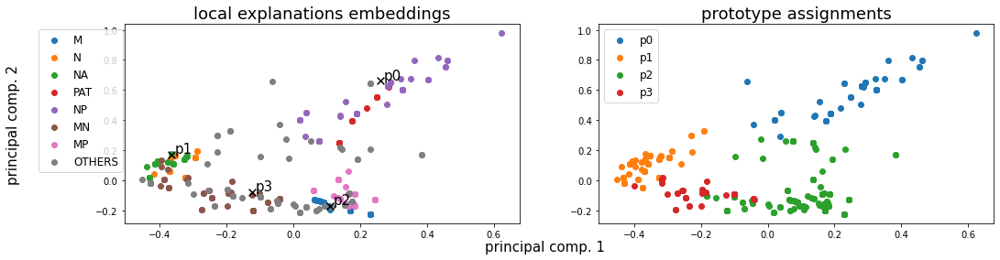

Alpha norms:
tensor([[0.2832, 0.3764, 1.0000, 0.1360],
        [1.0000, 0.7619, 0.9662, 0.3328]], grad_fn=<DivBackward0>)
Concept Purity: 0.738290 +- 0.089742
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 69, 196, 403,  41], dtype=int64))
Logic formulas:
For class 0:
0.8660084626234132 (feature001) | (feature000)
For class 1:
0.8660084626234132 (feature002) | ((feature003)
Accuracy as classifier:  0.866
LEN fidelity:  tensor(0.8660)


340: Loss: 0.04172, LEN: 0.041405, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05400, V. LEN 0.05
341: Loss: 0.04646, LEN: 0.046090, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03397, V. LEN 0.03
342: Loss: 0.04124, LEN: 0.041009, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05495, V. LEN 0.05
343: Loss: 0.04360, LEN: 0.043310, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03308, V. LEN 0.03
344: Loss: 0.04124, LEN: 0.041079, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03955, V. LEN 0.04
345: Loss: 0.04110, L

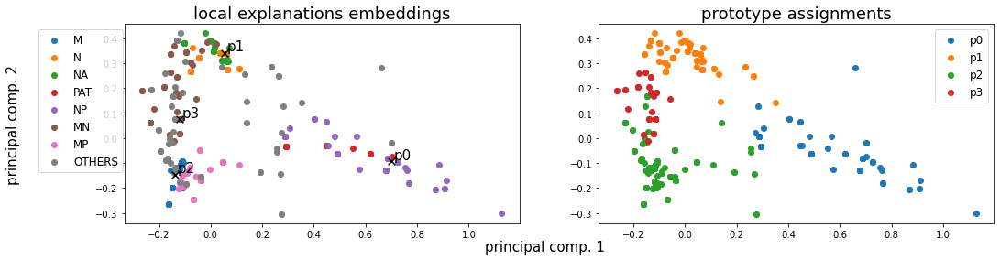

Alpha norms:
tensor([[0.2906, 0.3818, 1.0000, 0.1406],
        [1.0000, 0.7529, 0.9467, 0.3331]], grad_fn=<DivBackward0>)
Concept Purity: 0.673893 +- 0.096526
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([115, 204, 350,  40], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature001) | (feature000)
For class 1:
0.9055007052186178 (feature002) | ((feature003)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


360: Loss: 0.04106, LEN: 0.040825, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03351, V. LEN 0.03
361: Loss: 0.03988, LEN: 0.039707, AccxC: 0.91, AccO: 0.91, V. Acc: 0.88, V. Loss: 0.05371, V. LEN 0.05
362: Loss: 0.04381, LEN: 0.043663, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03347, V. LEN 0.03
363: Loss: 0.04430, LEN: 0.044141, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03301, V. LEN 0.03
364: Loss: 0.04473, LEN: 0.044566, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03507, V. LEN 0.03
365: Loss: 0.04585, 

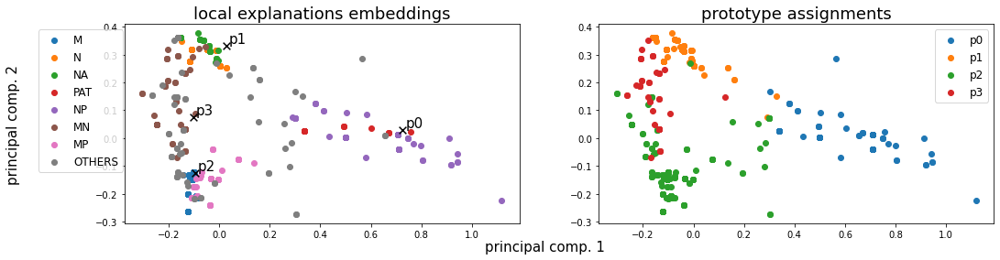

Alpha norms:
tensor([[0.2998, 0.3944, 1.0000, 0.1441],
        [1.0000, 0.7535, 0.9295, 0.3309]], grad_fn=<DivBackward0>)
Concept Purity: 0.678096 +- 0.103271
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([107, 190, 366,  46], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature000)
For class 1:
0.8970380818053597 (feature002) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


380: Loss: 0.04294, LEN: 0.042739, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04099, V. LEN 0.04
381: Loss: 0.04010, LEN: 0.039942, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03341, V. LEN 0.03
382: Loss: 0.04084, LEN: 0.040272, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03334, V. LEN 0.03
383: Loss: 0.04067, LEN: 0.040544, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03375, V. LEN 0.03
384: Loss: 0.04383, LEN: 0.043503, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03327, V. LEN 0.03
385: Loss: 0.04056, L

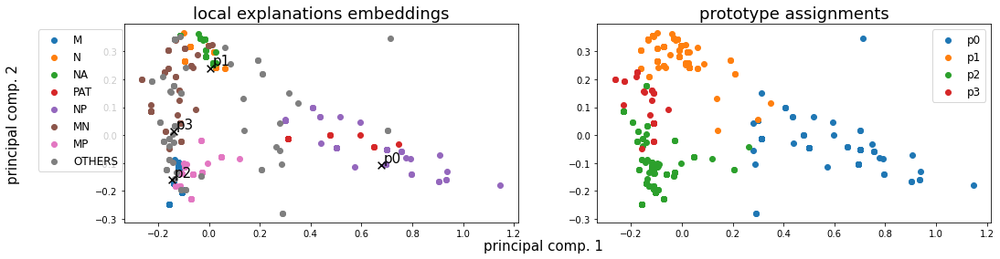

Alpha norms:
tensor([[0.2995, 0.3899, 1.0000, 0.1433],
        [1.0000, 0.7472, 0.9279, 0.3299]], grad_fn=<DivBackward0>)
Concept Purity: 0.666022 +- 0.108745
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 210, 349,  32], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature001) | (feature000)
For class 1:
0.9012693935119888 (feature002) | ((feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


400: Loss: 0.04493, LEN: 0.044748, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03329, V. LEN 0.03
401: Loss: 0.04277, LEN: 0.042496, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03867, V. LEN 0.04
402: Loss: 0.04156, LEN: 0.041394, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03918, V. LEN 0.04
403: Loss: 0.03996, LEN: 0.039783, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03876, V. LEN 0.04
404: Loss: 0.04276, LEN: 0.042422, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03373, V. LEN 0.03
405: Loss: 0.04135, 

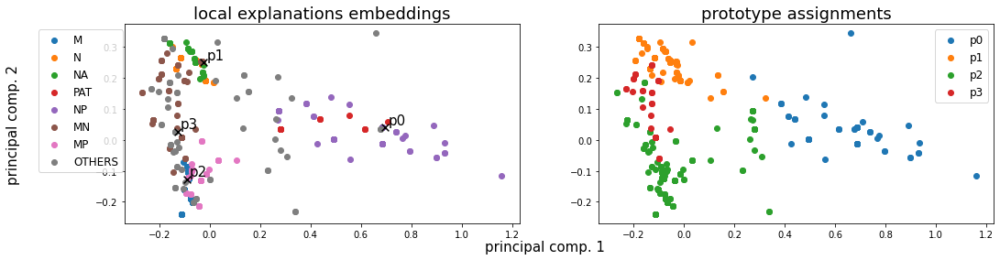

Alpha norms:
tensor([[0.3006, 0.3851, 1.0000, 0.1421],
        [1.0000, 0.7374, 0.9233, 0.3262]], grad_fn=<DivBackward0>)
Concept Purity: 0.736963 +- 0.094235
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 68, 198, 406,  37], dtype=int64))
Logic formulas:
For class 0:
0.8674188998589563 (feature001) | (feature000)
For class 1:
0.8674188998589563 (feature002) | ((feature003)
Accuracy as classifier:  0.8674
LEN fidelity:  tensor(0.8674)


420: Loss: 0.04026, LEN: 0.040099, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05336, V. LEN 0.05
421: Loss: 0.04583, LEN: 0.045565, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03364, V. LEN 0.03
422: Loss: 0.04064, LEN: 0.040492, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03915, V. LEN 0.04
423: Loss: 0.04309, LEN: 0.042910, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03361, V. LEN 0.03
424: Loss: 0.04186, LEN: 0.041725, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03863, V. LEN 0.04
425: Loss: 0.04172, 

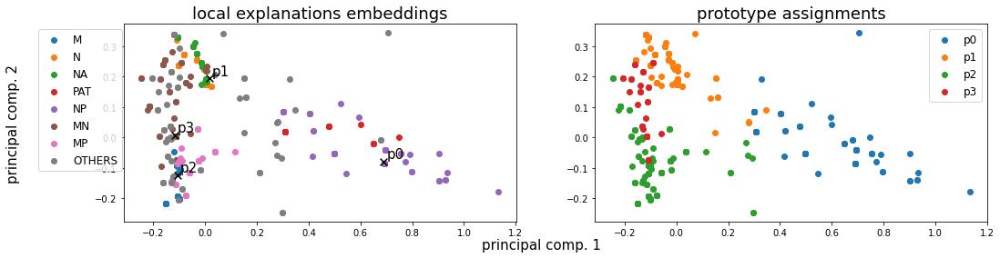

Alpha norms:
tensor([[0.2999, 0.3837, 1.0000, 0.1417],
        [1.0000, 0.7339, 0.9272, 0.3268]], grad_fn=<DivBackward0>)
Concept Purity: 0.650545 +- 0.078049
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 204, 351,  41], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | (feature000)
For class 1:
0.9026798307475318 (feature002) | ((feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


440: Loss: 0.04113, LEN: 0.040699, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03369, V. LEN 0.03
441: Loss: 0.03994, LEN: 0.039789, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03323, V. LEN 0.03
442: Loss: 0.04177, LEN: 0.041552, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05347, V. LEN 0.05
443: Loss: 0.05002, LEN: 0.049774, AccxC: 0.86, AccO: 0.86, V. Acc: 0.92, V. Loss: 0.03480, V. LEN 0.03
444: Loss: 0.04227, LEN: 0.041928, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03352, V. LEN 0.03
445: Loss: 0.04209, 

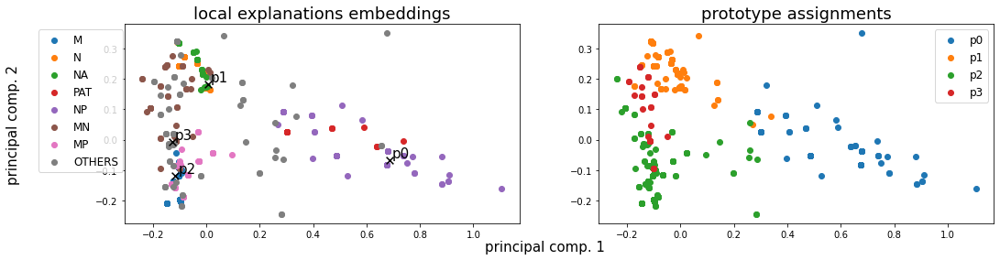

Alpha norms:
tensor([[0.3005, 0.3727, 1.0000, 0.1384],
        [1.0000, 0.7109, 0.9234, 0.3196]], grad_fn=<DivBackward0>)
Concept Purity: 0.649175 +- 0.077533
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([113, 207, 356,  33], dtype=int64))
Logic formulas:
For class 0:
0.9069111424541608 (feature001) | (feature000)
For class 1:
0.9069111424541608 (feature002) | ((feature003)
Accuracy as classifier:  0.9069
LEN fidelity:  tensor(0.9069)


460: Loss: 0.04151, LEN: 0.041325, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03333, V. LEN 0.03
461: Loss: 0.03949, LEN: 0.039296, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03873, V. LEN 0.04
462: Loss: 0.04026, LEN: 0.040132, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03870, V. LEN 0.04
463: Loss: 0.03959, LEN: 0.039310, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03315, V. LEN 0.03
464: Loss: 0.04062, LEN: 0.040410, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03828, V. LEN 0.04
Early Stopping
Loadi

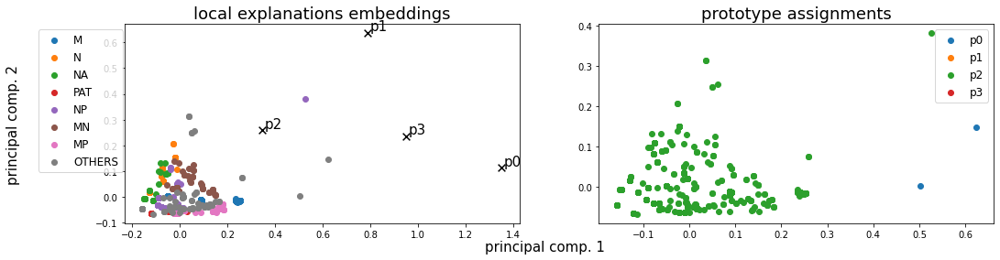

Alpha norms:
tensor([[1.0000, 0.7647, 0.7221, 0.6666],
        [0.8184, 1.0000, 0.9975, 0.8879]], grad_fn=<DivBackward0>)
Concept Purity: 0.688119 +- 0.311881
Concept distribution:  (array([0, 2], dtype=int64), array([  2, 707], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.32003, LEN: 0.105165, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.28999, V. LEN 0.10
  2: Loss: 0.27202, LEN: 0.104241, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24488, V. LEN 0.10
  3: Loss: 0.23801, LEN: 0.103212, AccxC: 0.41, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21772, V. LEN 0.10
  4: Loss: 0.21121, LEN: 0.102377, AccxC: 0.40, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19867, V. LEN 0.10
  5: Loss: 0.19341, LEN: 0.101512, AccxC: 0.40, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18629, V. LEN 0.10
  6: Loss: 0.18034, LEN: 0.100706, AccxC: 0.36, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17513, V. LEN 0.10
  7: Loss: 0.17076, L

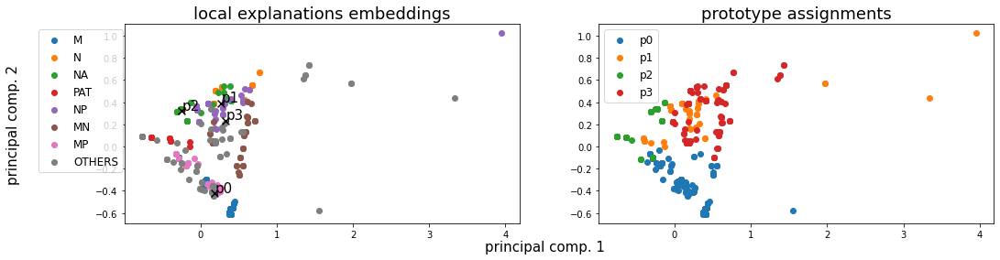

Alpha norms:
tensor([[1.0000, 0.6498, 0.7889, 0.6507],
        [1.0000, 0.9888, 0.8987, 0.8571]], grad_fn=<DivBackward0>)
Concept Purity: 0.533444 +- 0.179926
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([244,  67, 271, 127], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.09945, LEN: 0.092725, AccxC: 0.71, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10234, V. LEN 0.09
 21: Loss: 0.09757, LEN: 0.092226, AccxC: 0.71, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10147, V. LEN 0.09
 22: Loss: 0.09731, LEN: 0.091731, AccxC: 0.72, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10009, V. LEN 0.09
 23: Loss: 0.09579, LEN: 0.091166, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09887, V. LEN 0.09
 24: Loss: 0.09505, LEN: 0.090713, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09787, V. LEN 0.09
 25: Loss: 0.09391, LEN: 0.090310, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09713, V. LEN 0.09
 26:

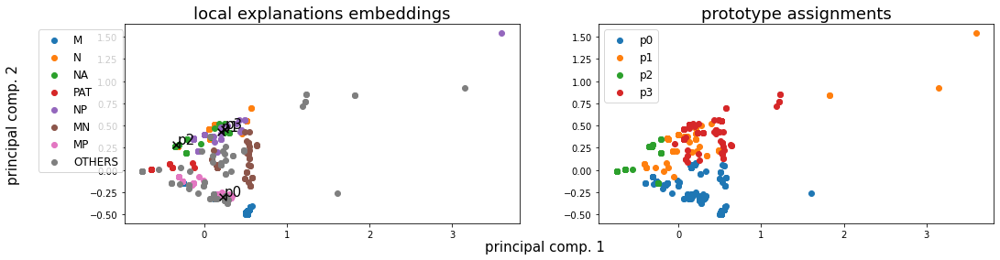

Alpha norms:
tensor([[1.0000, 0.4628, 0.6166, 0.5264],
        [1.0000, 0.9943, 0.7008, 0.7064]], grad_fn=<DivBackward0>)
Concept Purity: 0.532081 +- 0.131706
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([273,  79, 268,  89], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 40: Loss: 0.08486, LEN: 0.082911, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08625, V. LEN 0.08
 41: Loss: 0.08383, LEN: 0.082356, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08575, V. LEN 0.08
 42: Loss: 0.08220, LEN: 0.080658, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08327, V. LEN 0.08
 43: Loss: 0.08018, LEN: 0.078731, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08193, V. LEN 0.08
 44: Loss: 0.07959, LEN: 0.077786, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08066, V. LEN 0.08
 45: Loss: 0.07810, LEN: 0.076799, AccxC: 0.88, AccO: 0.09, V. Acc: 0.18, V. Loss: 0.07974, V. LEN 0.08
 46:

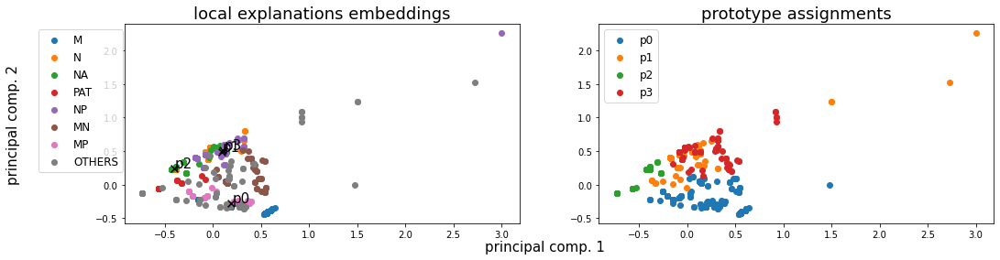

Alpha norms:
tensor([[1.0000, 0.2977, 0.4031, 0.3165],
        [1.0000, 0.8452, 0.3330, 0.6266]], grad_fn=<DivBackward0>)
Concept Purity: 0.595722 +- 0.113598
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([377,  79, 167,  86], dtype=int64))
Logic formulas:
For class 0:
0.8815232722143864 (feature002) | ((feature001) | (feature003)
For class 1:
0.8815232722143864 (feature000)
Accuracy as classifier:  0.8815
LEN fidelity:  tensor(0.8815)


 60: Loss: 0.06377, LEN: 0.062791, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06460, V. LEN 0.06
 61: Loss: 0.06312, LEN: 0.062204, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06365, V. LEN 0.06
 62: Loss: 0.06215, LEN: 0.061221, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06275, V. LEN 0.06
 63: Loss: 0.06038, LEN: 0.059855, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06194, V. LEN 0.06
 64: Loss: 0.06063, LEN: 0.059846, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06094, V. LEN 0.06
 65: Loss: 0.05926, 

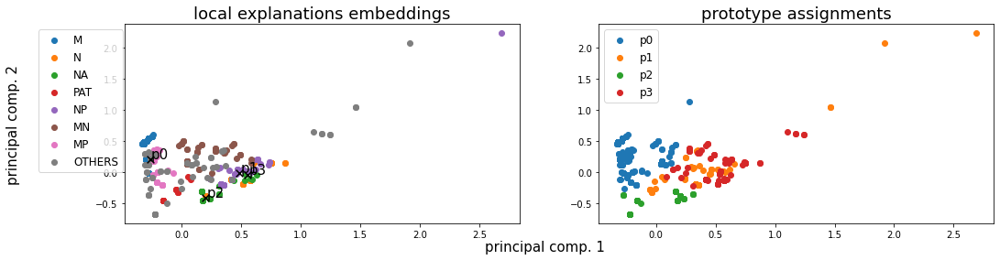

Alpha norms:
tensor([[1.0000, 0.2756, 0.3703, 0.2979],
        [1.0000, 0.5811, 0.3044, 0.4463]], grad_fn=<DivBackward0>)
Concept Purity: 0.594272 +- 0.124554
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([372,  78, 170,  89], dtype=int64))
Logic formulas:
For class 0:
0.8772919605077574 (feature002) | ((feature001) | (feature003)
For class 1:
0.8772919605077574 (feature000)
Accuracy as classifier:  0.8773
LEN fidelity:  tensor(0.8773)


 80: Loss: 0.05072, LEN: 0.050237, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.05291, V. LEN 0.05
 81: Loss: 0.05152, LEN: 0.050694, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.05293, V. LEN 0.05
 82: Loss: 0.05054, LEN: 0.049769, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.05236, V. LEN 0.05
 83: Loss: 0.05135, LEN: 0.050433, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.05199, V. LEN 0.05
 84: Loss: 0.05007, LEN: 0.049311, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.05187, V. LEN 0.05
 85: Loss: 0.05118, 

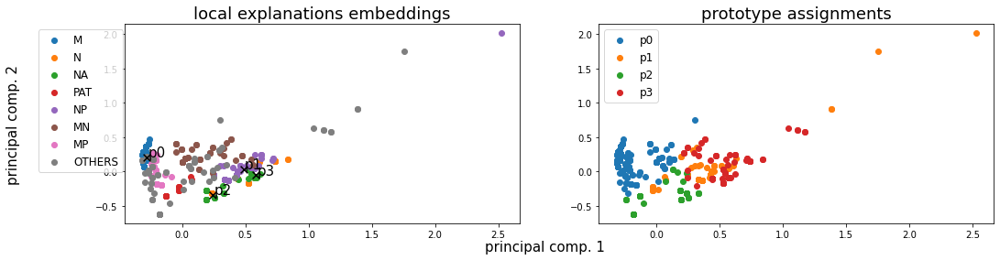

Alpha norms:
tensor([[1.0000, 0.2955, 0.3260, 0.2965],
        [1.0000, 0.4221, 0.2683, 0.3010]], grad_fn=<DivBackward0>)
Concept Purity: 0.600725 +- 0.124844
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([373,  76, 176,  84], dtype=int64))
Logic formulas:
For class 0:
0.8758815232722144 (feature002) | ((feature001) | (feature003)
For class 1:
0.8758815232722144 (feature000)
Accuracy as classifier:  0.8759
LEN fidelity:  tensor(0.8759)


100: Loss: 0.04927, LEN: 0.048804, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04939, V. LEN 0.05
101: Loss: 0.04847, LEN: 0.047881, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04928, V. LEN 0.05
102: Loss: 0.05028, LEN: 0.049658, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04475, V. LEN 0.04
103: Loss: 0.04924, LEN: 0.048768, AccxC: 0.87, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.05373, V. LEN 0.05
104: Loss: 0.04879, LEN: 0.048174, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04898, V. LEN 0.05
105: Loss: 0.04950, 

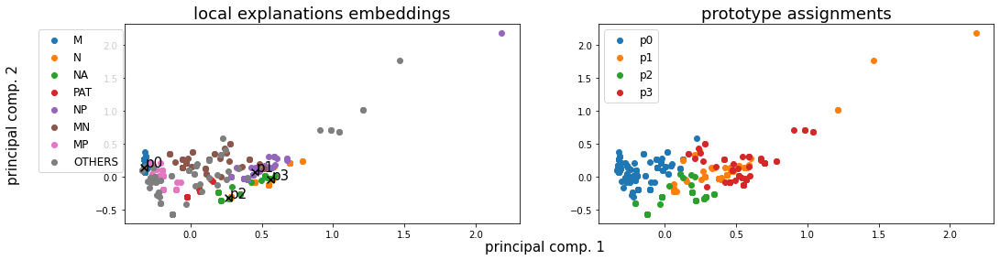

Alpha norms:
tensor([[1.0000, 0.3411, 0.3127, 0.3418],
        [1.0000, 0.3720, 0.2439, 0.2999]], grad_fn=<DivBackward0>)
Concept Purity: 0.601707 +- 0.112009
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([375,  78, 177,  79], dtype=int64))
Logic formulas:
For class 0:
0.8758815232722144 (feature001) | ((feature002) | (feature003)
For class 1:
0.8758815232722144 (feature000)
Accuracy as classifier:  0.8759
LEN fidelity:  tensor(0.8759)


120: Loss: 0.04885, LEN: 0.048321, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04768, V. LEN 0.05
121: Loss: 0.04716, LEN: 0.046680, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04536, V. LEN 0.04
122: Loss: 0.04747, LEN: 0.047007, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04788, V. LEN 0.05
123: Loss: 0.04705, LEN: 0.046698, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04528, V. LEN 0.04
124: Loss: 0.04905, LEN: 0.048606, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04533, V. LEN 0.04
125: Loss: 0.04718, 

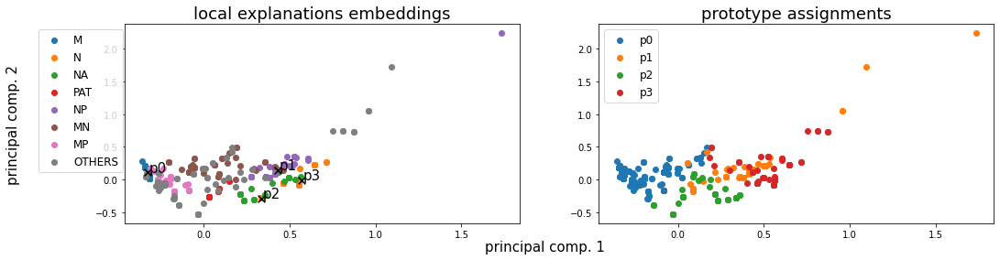

Alpha norms:
tensor([[1.0000, 0.3629, 0.3075, 0.3664],
        [1.0000, 0.3567, 0.2314, 0.3036]], grad_fn=<DivBackward0>)
Concept Purity: 0.610678 +- 0.111736
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([378,  76, 181,  74], dtype=int64))
Logic formulas:
For class 0:
0.8829337094499294 (feature001) | ((feature002) | (feature003)
For class 1:
0.8829337094499294 (feature000)
Accuracy as classifier:  0.8829
LEN fidelity:  tensor(0.8829)


140: Loss: 0.04634, LEN: 0.045863, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04297, V. LEN 0.04
141: Loss: 0.04470, LEN: 0.044266, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04458, V. LEN 0.04
142: Loss: 0.04665, LEN: 0.045864, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04015, V. LEN 0.04
143: Loss: 0.04471, LEN: 0.044378, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04028, V. LEN 0.04
144: Loss: 0.04748, LEN: 0.047067, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04272, V. LEN 0.04
145: Loss: 0.04592, 

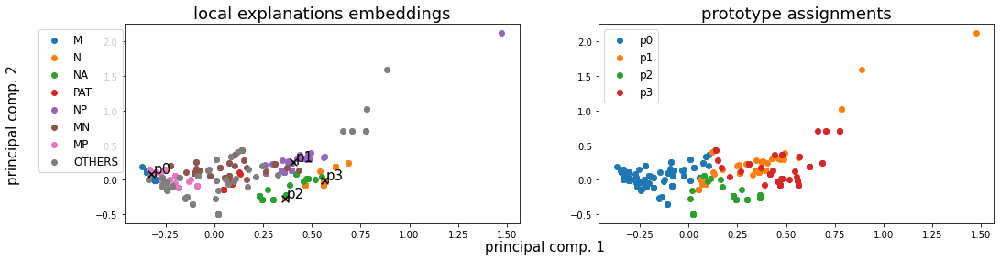

Alpha norms:
tensor([[1.0000, 0.3549, 0.3060, 0.4104],
        [1.0000, 0.3242, 0.2227, 0.3303]], grad_fn=<DivBackward0>)
Concept Purity: 0.587525 +- 0.075616
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([385, 113, 137,  74], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature001) | ((feature002) | (feature003)
For class 1:
0.8899858956276445 (feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


160: Loss: 0.04525, LEN: 0.044825, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04089, V. LEN 0.04
161: Loss: 0.04449, LEN: 0.044183, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04080, V. LEN 0.04
162: Loss: 0.04852, LEN: 0.048202, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04076, V. LEN 0.04
163: Loss: 0.04532, LEN: 0.044887, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04519, V. LEN 0.04
164: Loss: 0.04668, LEN: 0.046197, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04066, V. LEN 0.04
165: Loss: 0.04639, LE

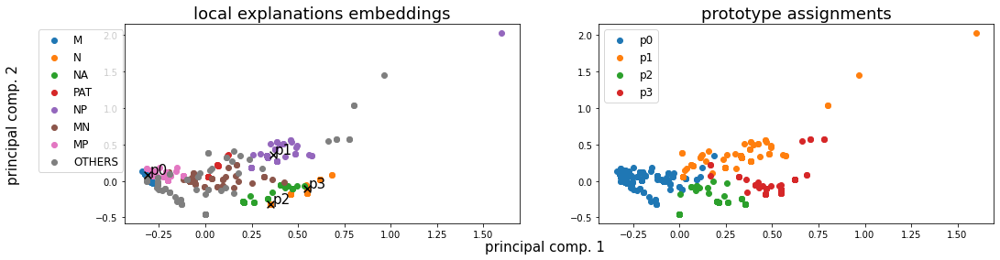

Alpha norms:
tensor([[1.0000, 0.3293, 0.2968, 0.4487],
        [1.0000, 0.2964, 0.2158, 0.3527]], grad_fn=<DivBackward0>)
Concept Purity: 0.605588 +- 0.068065
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([380, 124, 140,  65], dtype=int64))
Logic formulas:
For class 0:
0.8857545839210155 (feature001) | ((feature002) | (feature003)
For class 1:
0.8857545839210155 (feature000)
Accuracy as classifier:  0.8858
LEN fidelity:  tensor(0.8858)


180: Loss: 0.04494, LEN: 0.044759, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04017, V. LEN 0.04
181: Loss: 0.04534, LEN: 0.045171, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04014, V. LEN 0.04
182: Loss: 0.04531, LEN: 0.044995, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04014, V. LEN 0.04
183: Loss: 0.04522, LEN: 0.045093, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04013, V. LEN 0.04
184: Loss: 0.04550, LEN: 0.045370, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04009, V. LEN 0.04
185: Loss: 0.04778, 

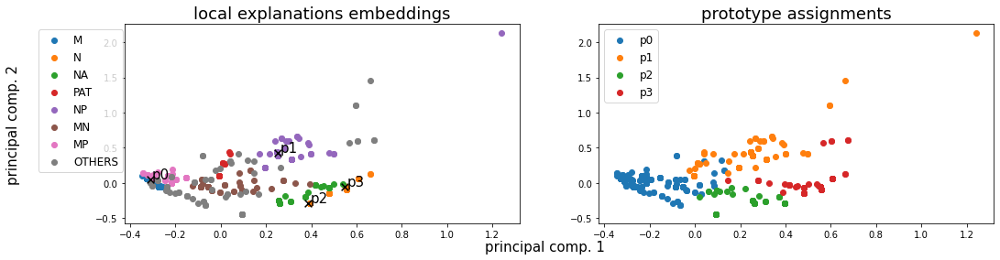

Alpha norms:
tensor([[1.0000, 0.3262, 0.3048, 0.5274],
        [1.0000, 0.2851, 0.2147, 0.3883]], grad_fn=<DivBackward0>)
Concept Purity: 0.611863 +- 0.058248
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([386, 120, 140,  63], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature001) | ((feature002) | (feature003)
For class 1:
0.8913963328631875 (feature000)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


200: Loss: 0.04481, LEN: 0.044658, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04014, V. LEN 0.04
201: Loss: 0.04582, LEN: 0.045680, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04016, V. LEN 0.04
202: Loss: 0.04434, LEN: 0.044152, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04015, V. LEN 0.04
203: Loss: 0.04509, LEN: 0.044902, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04017, V. LEN 0.04
204: Loss: 0.04661, LEN: 0.046287, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04018, V. LEN 0.04
205: Loss: 0.04745, 

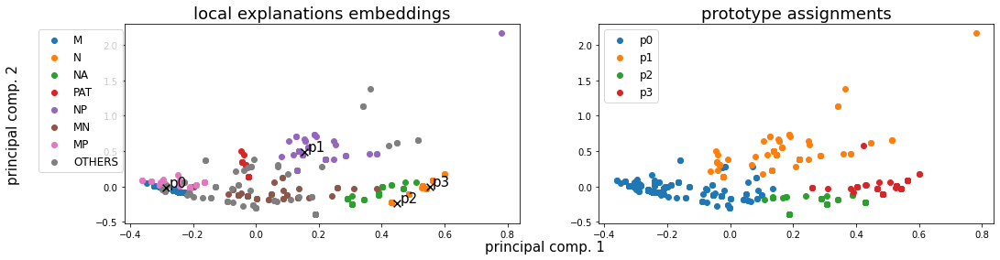

Alpha norms:
tensor([[1.0000, 0.3339, 0.3008, 0.6180],
        [1.0000, 0.2910, 0.2072, 0.4200]], grad_fn=<DivBackward0>)
Concept Purity: 0.623163 +- 0.067130
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([391, 123, 137,  58], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature001) | ((feature002) | (feature003)
For class 1:
0.8956276445698167 (feature000)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


220: Loss: 0.04482, LEN: 0.044515, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04034, V. LEN 0.04
221: Loss: 0.04256, LEN: 0.042373, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04031, V. LEN 0.04
222: Loss: 0.04441, LEN: 0.044221, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04028, V. LEN 0.04
223: Loss: 0.04767, LEN: 0.047480, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04037, V. LEN 0.04
224: Loss: 0.04532, LEN: 0.044836, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04032, V. LEN 0.04
225: Loss: 0.04661, 

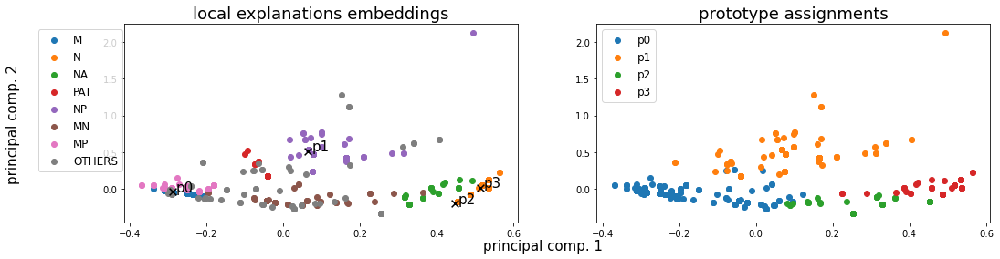

Alpha norms:
tensor([[1.0000, 0.3418, 0.2940, 0.6804],
        [1.0000, 0.3030, 0.2033, 0.4347]], grad_fn=<DivBackward0>)
Concept Purity: 0.616714 +- 0.070877
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([386, 126, 137,  60], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature001) | ((feature002) | (feature003)
For class 1:
0.8942172073342737 (feature000)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


240: Loss: 0.04610, LEN: 0.045864, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04029, V. LEN 0.04
241: Loss: 0.04266, LEN: 0.042529, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05114, V. LEN 0.05
242: Loss: 0.04694, LEN: 0.046792, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03907, V. LEN 0.04
243: Loss: 0.04568, LEN: 0.045542, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03908, V. LEN 0.04
244: Loss: 0.04285, LEN: 0.042660, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03905, V. LEN 0.04
245: Loss: 0.04510, 

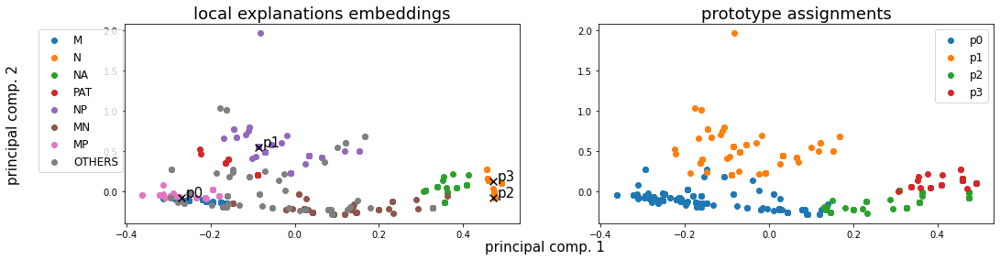

Alpha norms:
tensor([[1.0000, 0.3478, 0.2895, 0.7714],
        [1.0000, 0.3109, 0.2005, 0.4681]], grad_fn=<DivBackward0>)
Concept Purity: 0.612336 +- 0.063646
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([386, 123, 155,  45], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | ((feature002) | (feature003)
For class 1:
0.8970380818053597 (feature000)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


260: Loss: 0.04525, LEN: 0.044891, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03908, V. LEN 0.04
261: Loss: 0.04446, LEN: 0.044263, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03886, V. LEN 0.04
262: Loss: 0.04899, LEN: 0.048816, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03892, V. LEN 0.04
263: Loss: 0.04352, LEN: 0.043337, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04384, V. LEN 0.04
264: Loss: 0.04428, LEN: 0.044121, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03881, V. LEN 0.04
265: Loss: 0.04631, L

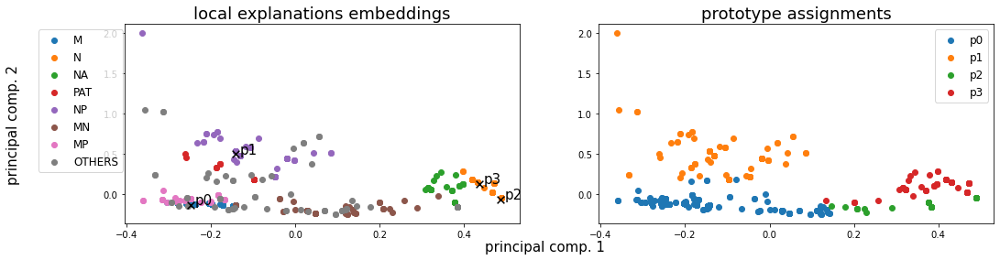

Alpha norms:
tensor([[1.0000, 0.3506, 0.2880, 0.8782],
        [1.0000, 0.3153, 0.2002, 0.4960]], grad_fn=<DivBackward0>)
Concept Purity: 0.608624 +- 0.082634
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([389, 126, 124,  70], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature001) | ((feature002) | (feature003)
For class 1:
0.8984485190409027 (feature000)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


280: Loss: 0.04814, LEN: 0.048017, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03878, V. LEN 0.04
281: Loss: 0.04438, LEN: 0.044201, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04379, V. LEN 0.04
282: Loss: 0.04240, LEN: 0.042249, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03601, V. LEN 0.04
283: Loss: 0.04314, LEN: 0.042985, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04375, V. LEN 0.04
284: Loss: 0.04256, LEN: 0.042435, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03880, V. LEN 0.04
285: Loss: 0.04103, 

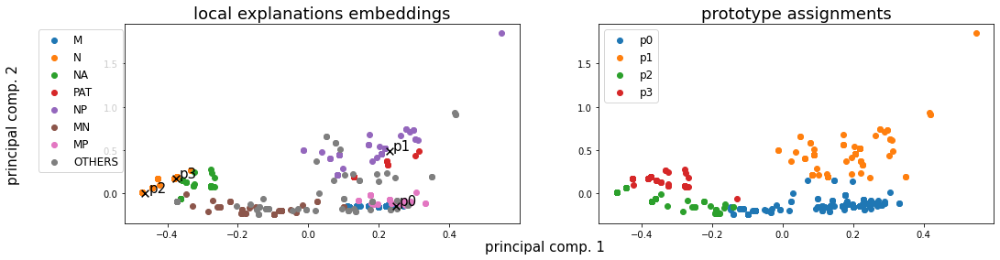

Alpha norms:
tensor([[1.0000, 0.3492, 0.2804, 0.9118],
        [1.0000, 0.3204, 0.1979, 0.4804]], grad_fn=<DivBackward0>)
Concept Purity: 0.588889 +- 0.085416
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([374, 126, 155,  54], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature001) | ((feature002) | (feature003)
For class 1:
0.8998589562764457 (feature000)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


300: Loss: 0.04307, LEN: 0.042805, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03893, V. LEN 0.04
301: Loss: 0.04266, LEN: 0.042431, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03591, V. LEN 0.04
302: Loss: 0.04231, LEN: 0.041998, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04378, V. LEN 0.04
303: Loss: 0.04349, LEN: 0.043245, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03875, V. LEN 0.04
304: Loss: 0.04298, LEN: 0.042724, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04354, V. LEN 0.04
305: Loss: 0.04659, 

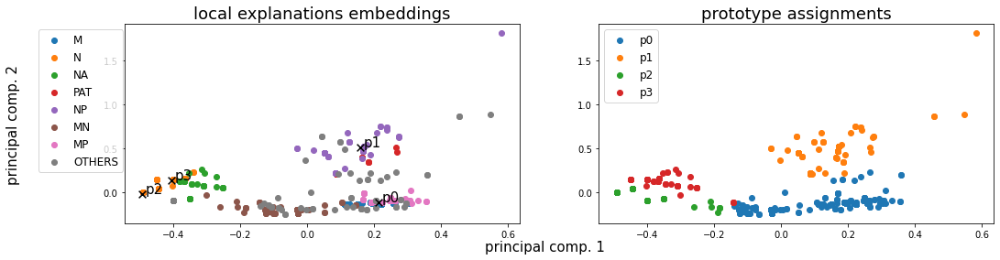

Alpha norms:
tensor([[1.0000, 0.3495, 0.2785, 0.9027],
        [1.0000, 0.3242, 0.1993, 0.4483]], grad_fn=<DivBackward0>)
Concept Purity: 0.600805 +- 0.099132
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([396, 122, 134,  57], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | ((feature002) | (feature003)
For class 1:
0.9026798307475318 (feature000)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


320: Loss: 0.04516, LEN: 0.044964, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03621, V. LEN 0.04
321: Loss: 0.04094, LEN: 0.040777, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03596, V. LEN 0.04
322: Loss: 0.04220, LEN: 0.042038, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03738, V. LEN 0.04
323: Loss: 0.04194, LEN: 0.041795, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03868, V. LEN 0.04
324: Loss: 0.04310, LEN: 0.043011, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04917, V. LEN 0.05
325: Loss: 0.04479, 

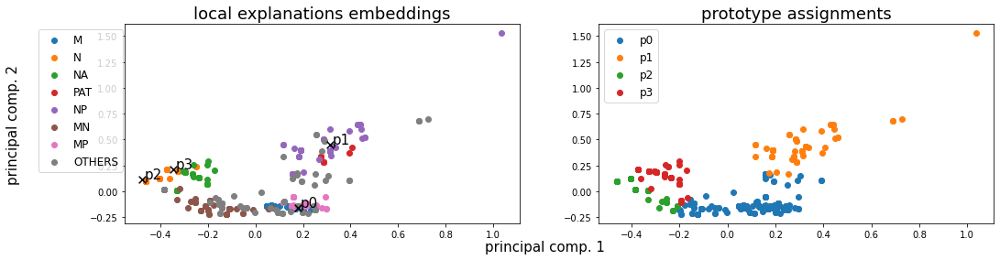

Alpha norms:
tensor([[1.0000, 0.3404, 0.2778, 0.8567],
        [1.0000, 0.3194, 0.2034, 0.4178]], grad_fn=<DivBackward0>)
Concept Purity: 0.632584 +- 0.103408
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([434,  76, 140,  59], dtype=int64))
Logic formulas:
For class 0:
0.8716502115655853 (feature001) | ((feature002) | (feature003)
For class 1:
0.8716502115655853 (feature000)
Accuracy as classifier:  0.8717
LEN fidelity:  tensor(0.8717)


340: Loss: 0.04111, LEN: 0.041031, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.04957, V. LEN 0.05
341: Loss: 0.04623, LEN: 0.046107, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03874, V. LEN 0.04
342: Loss: 0.04177, LEN: 0.041636, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04964, V. LEN 0.05
343: Loss: 0.04645, LEN: 0.046278, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04303, V. LEN 0.04
344: Loss: 0.04115, LEN: 0.041016, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04099, V. LEN 0.04
345: Loss: 0.04200, 

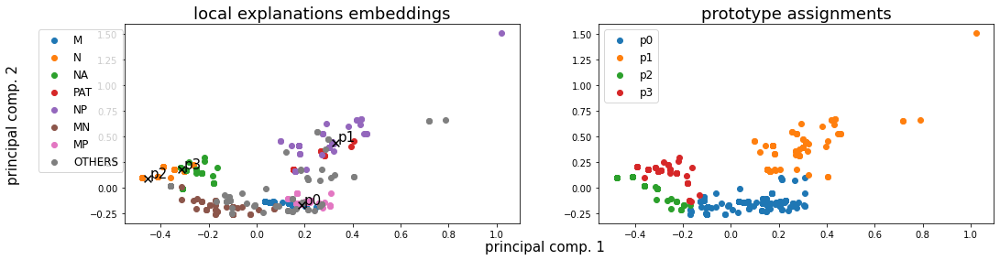

Alpha norms:
tensor([[1.0000, 0.3396, 0.2807, 0.7777],
        [1.0000, 0.3233, 0.2084, 0.3778]], grad_fn=<DivBackward0>)
Concept Purity: 0.590641 +- 0.097611
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([384, 125, 142,  58], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | ((feature002) | (feature003)
For class 1:
0.9026798307475318 (feature000)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


360: Loss: 0.04351, LEN: 0.043383, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03608, V. LEN 0.04
361: Loss: 0.04550, LEN: 0.045294, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03890, V. LEN 0.04
362: Loss: 0.04389, LEN: 0.043670, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03718, V. LEN 0.04
363: Loss: 0.04347, LEN: 0.043248, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03575, V. LEN 0.04
364: Loss: 0.04239, LEN: 0.042101, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04915, V. LEN 0.05
365: Loss: 0.04424, 

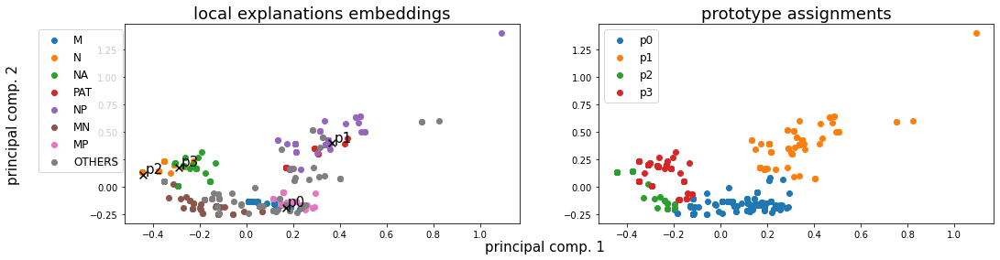

Alpha norms:
tensor([[1.0000, 0.3393, 0.2797, 0.7180],
        [1.0000, 0.3215, 0.2075, 0.3578]], grad_fn=<DivBackward0>)
Concept Purity: 0.597914 +- 0.197217
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([376, 126, 114,  93], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | ((feature002) | (feature003)
For class 1:
0.8970380818053597 (feature000)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


380: Loss: 0.04982, LEN: 0.049564, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03658, V. LEN 0.04
381: Loss: 0.04217, LEN: 0.041943, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03623, V. LEN 0.04
382: Loss: 0.04478, LEN: 0.044558, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04046, V. LEN 0.04
383: Loss: 0.04282, LEN: 0.042648, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03633, V. LEN 0.04
384: Loss: 0.04215, LEN: 0.041968, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04974, V. LEN 0.05
385: Loss: 0.04269, L

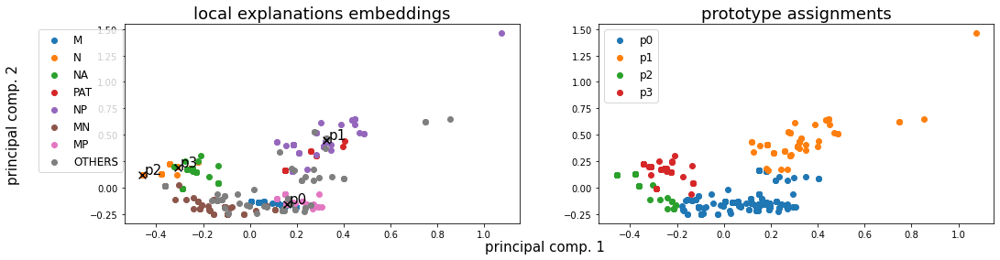

Alpha norms:
tensor([[1.0000, 0.3427, 0.2777, 0.6790],
        [1.0000, 0.3270, 0.2062, 0.3503]], grad_fn=<DivBackward0>)
Concept Purity: 0.646035 +- 0.089809
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([437,  77, 135,  60], dtype=int64))
Logic formulas:
For class 0:
0.8730606488011283 (feature001) | ((feature002) | (feature003)
For class 1:
0.8730606488011283 (feature000)
Accuracy as classifier:  0.8731
LEN fidelity:  tensor(0.8731)


400: Loss: 0.04333, LEN: 0.043023, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04947, V. LEN 0.05
401: Loss: 0.04312, LEN: 0.042763, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03243, V. LEN 0.03
402: Loss: 0.04327, LEN: 0.043094, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03622, V. LEN 0.04
403: Loss: 0.04184, LEN: 0.041615, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03599, V. LEN 0.04
404: Loss: 0.04428, LEN: 0.044090, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03774, V. LEN 0.04
405: Loss: 0.04099, 

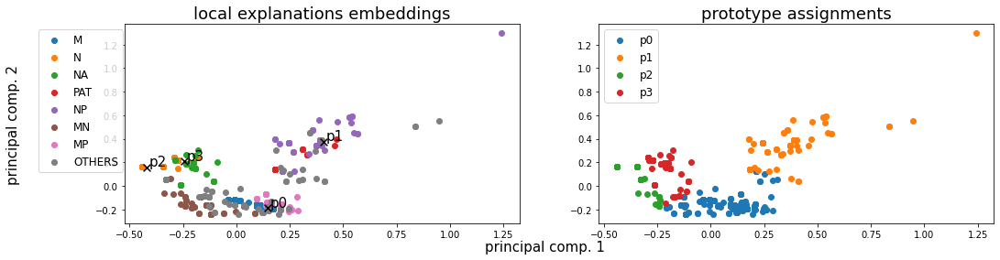

Alpha norms:
tensor([[1.0000, 0.3445, 0.2803, 0.6295],
        [1.0000, 0.3261, 0.2083, 0.3341]], grad_fn=<DivBackward0>)
Concept Purity: 0.582819 +- 0.122950
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([385, 119, 135,  70], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature001) | ((feature002) | (feature003)
For class 1:
0.9012693935119888 (feature000)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


420: Loss: 0.04248, LEN: 0.042390, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03726, V. LEN 0.04
421: Loss: 0.04299, LEN: 0.042890, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03616, V. LEN 0.04
422: Loss: 0.04603, LEN: 0.045962, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03620, V. LEN 0.04
423: Loss: 0.03999, LEN: 0.039882, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03620, V. LEN 0.04
424: Loss: 0.04321, LEN: 0.043093, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03653, V. LEN 0.04
425: Loss: 0.04152, 

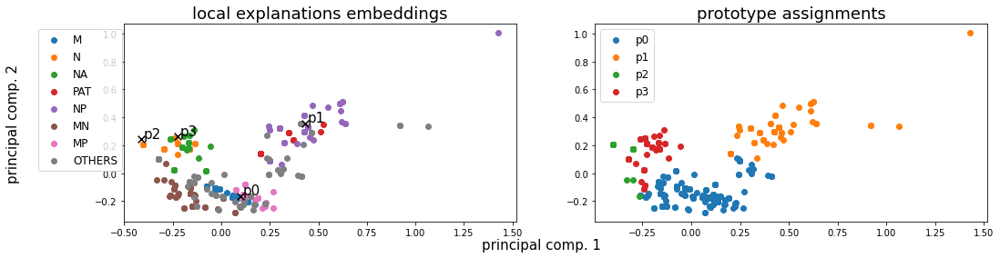

Alpha norms:
tensor([[1.0000, 0.3455, 0.2808, 0.5565],
        [1.0000, 0.3240, 0.2092, 0.3082]], grad_fn=<DivBackward0>)
Concept Purity: 0.609445 +- 0.238410
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([409, 113, 100,  87], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature001) | ((feature002) | (feature003)
For class 1:
0.8956276445698167 (feature000)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


440: Loss: 0.04112, LEN: 0.040951, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03766, V. LEN 0.04
441: Loss: 0.04384, LEN: 0.043708, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03642, V. LEN 0.04
442: Loss: 0.04150, LEN: 0.041392, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03254, V. LEN 0.03
443: Loss: 0.04582, LEN: 0.045717, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03623, V. LEN 0.04
444: Loss: 0.04108, LEN: 0.040980, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03761, V. LEN 0.04
445: Loss: 0.04108, 

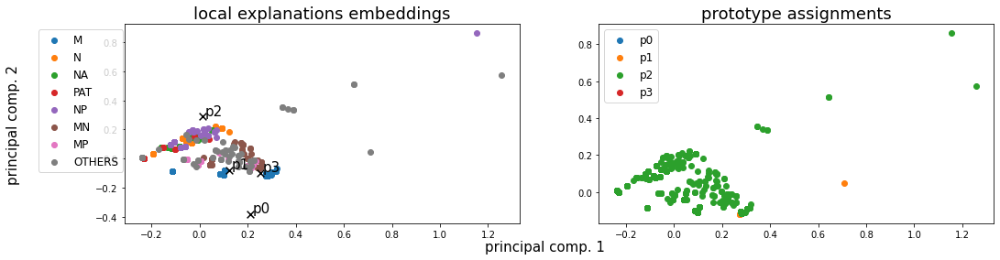

Alpha norms:
tensor([[0.9026, 0.9783, 0.9124, 1.0000],
        [0.6990, 1.0000, 0.6649, 0.9657]], grad_fn=<DivBackward0>)
Concept Purity: 0.561525 +- 0.188475
Concept distribution:  (array([1, 2], dtype=int64), array([  4, 705], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.29986, LEN: 0.088673, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.27828, V. LEN 0.09
  2: Loss: 0.26119, LEN: 0.088198, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.23970, V. LEN 0.09
  3: Loss: 0.22179, LEN: 0.087974, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20299, V. LEN 0.09
  4: Loss: 0.18139, LEN: 0.087700, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16059, V. LEN 0.09
  5: Loss: 0.14735, LEN: 0.087508, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12949, V. LEN 0.09
  6: Loss: 0.12496, LEN: 0.087431, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11586, V. LEN 0.09
  7: Loss: 0.11339, L

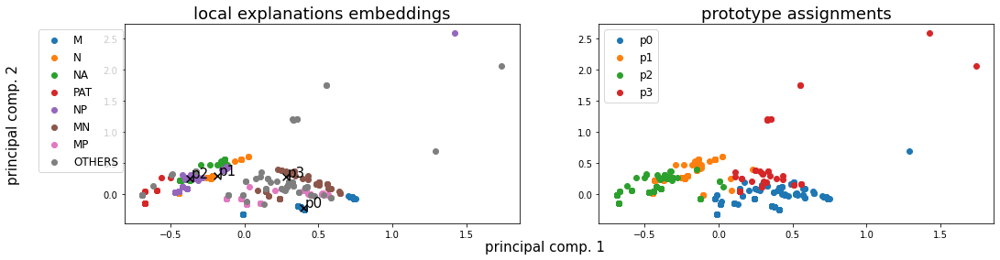

Alpha norms:
tensor([[0.9686, 1.0000, 0.7564, 0.9568],
        [0.9905, 1.0000, 0.8209, 0.9503]], grad_fn=<DivBackward0>)
Concept Purity: 0.607026 +- 0.147082
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([355, 169, 139,  46], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.8533145275035261 (feature000)
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4683)


 20: Loss: 0.08916, LEN: 0.084626, AccxC: 0.58, AccO: 0.47, V. Acc: 0.42, V. Loss: 0.09253, V. LEN 0.08
 21: Loss: 0.08899, LEN: 0.084311, AccxC: 0.58, AccO: 0.47, V. Acc: 0.42, V. Loss: 0.09170, V. LEN 0.08
 22: Loss: 0.08768, LEN: 0.083834, AccxC: 0.58, AccO: 0.48, V. Acc: 0.47, V. Loss: 0.09122, V. LEN 0.08
 23: Loss: 0.08735, LEN: 0.083463, AccxC: 0.58, AccO: 0.55, V. Acc: 0.47, V. Loss: 0.09052, V. LEN 0.08
 24: Loss: 0.08624, LEN: 0.083059, AccxC: 0.70, AccO: 0.55, V. Acc: 0.47, V. Loss: 0.08978, V. LEN 0.08
 25: Loss: 0.08558, LEN: 0.082544, AccxC: 0.70, AccO: 0.53, V. Acc: 0.45, V. Lo

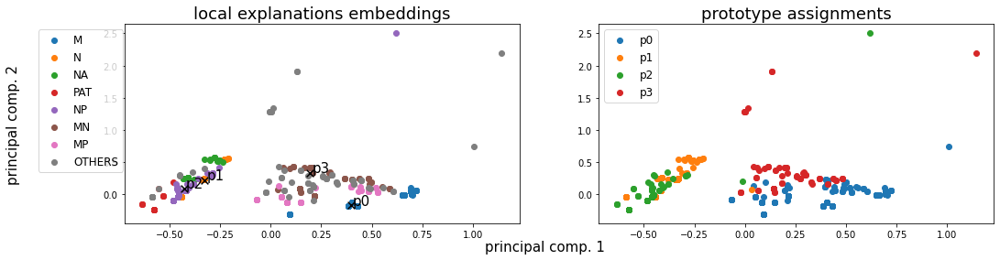

Alpha norms:
tensor([[1.0000, 0.8311, 0.5573, 0.6082],
        [1.0000, 0.4532, 0.9651, 0.5748]], grad_fn=<DivBackward0>)
Concept Purity: 0.616260 +- 0.105303
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([344, 193, 104,  68], dtype=int64))
Logic formulas:
For class 0:
0.8829337094499294 (feature001) | ((feature002)
For class 1:
0.8829337094499294 (feature000) | (feature003)
Accuracy as classifier:  0.8829
LEN fidelity:  tensor(0.8829)


 40: Loss: 0.07124, LEN: 0.070383, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.07331, V. LEN 0.07
 41: Loss: 0.07035, LEN: 0.069101, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.07211, V. LEN 0.07
 42: Loss: 0.06841, LEN: 0.067518, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.07059, V. LEN 0.07
 43: Loss: 0.06713, LEN: 0.066080, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06938, V. LEN 0.07
 44: Loss: 0.06526, LEN: 0.064355, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06800, V. LEN 0.06
 45: Loss: 0.06433, 

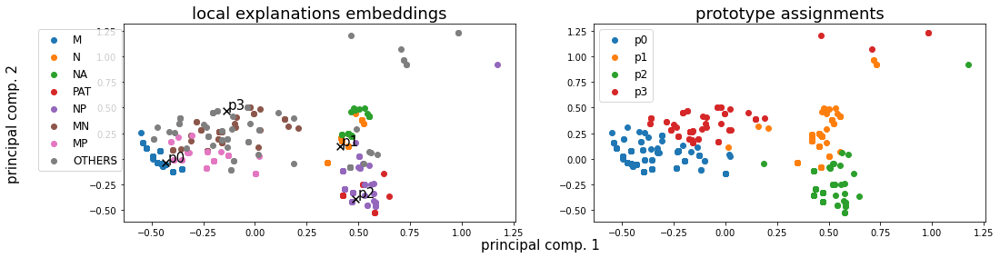

Alpha norms:
tensor([[1.0000, 0.7968, 0.7118, 0.3182],
        [0.7838, 0.4103, 1.0000, 0.3039]], grad_fn=<DivBackward0>)
Concept Purity: 0.627395 +- 0.103956
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([337, 193, 110,  69], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature001) | (feature002)
For class 1:
0.8913963328631875 (feature000) | ((feature003)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


 60: Loss: 0.04981, LEN: 0.049305, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04979, V. LEN 0.05
 61: Loss: 0.04952, LEN: 0.048614, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05093, V. LEN 0.05
 62: Loss: 0.04985, LEN: 0.049001, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04855, V. LEN 0.05
 63: Loss: 0.04791, LEN: 0.047291, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04797, V. LEN 0.05
 64: Loss: 0.04720, LEN: 0.046614, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04951, V. LEN 0.05
 65: Loss: 0.04708, 

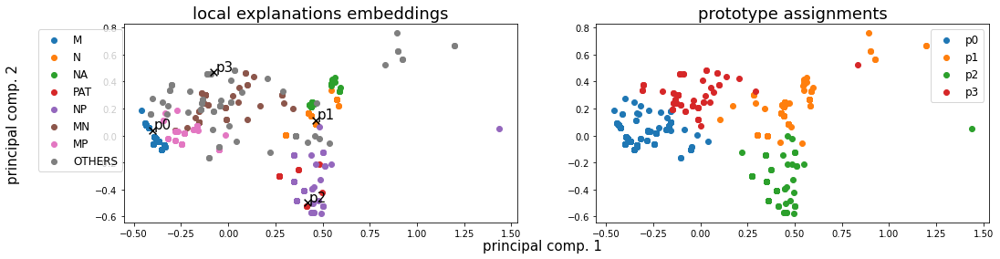

Alpha norms:
tensor([[1.0000, 0.8724, 0.8592, 0.3043],
        [1.0000, 0.6015, 0.9544, 0.2443]], grad_fn=<DivBackward0>)
Concept Purity: 0.630647 +- 0.097319
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([337, 198, 112,  62], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature001) | (feature002)
For class 1:
0.8984485190409027 (feature000) | ((feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


 80: Loss: 0.04293, LEN: 0.042286, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04134, V. LEN 0.04
 81: Loss: 0.04385, LEN: 0.043069, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04112, V. LEN 0.04
 82: Loss: 0.04221, LEN: 0.041723, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04100, V. LEN 0.04
 83: Loss: 0.04292, LEN: 0.042246, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04101, V. LEN 0.04
 84: Loss: 0.04276, LEN: 0.042217, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03835, V. LEN 0.04
 85: Loss: 0.04420, 

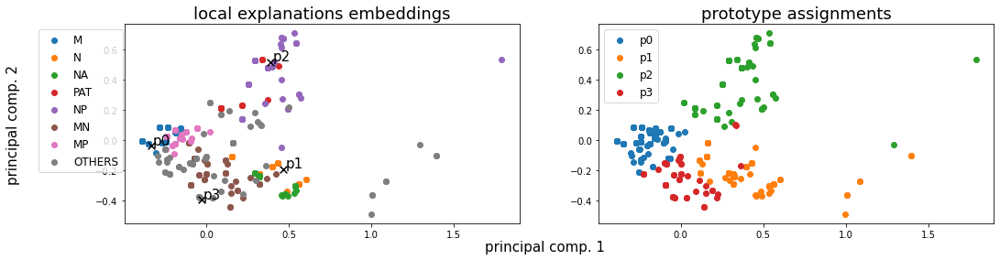

Alpha norms:
tensor([[1.0000, 0.7721, 0.9106, 0.3212],
        [1.0000, 0.5294, 0.7395, 0.1827]], grad_fn=<DivBackward0>)
Concept Purity: 0.614463 +- 0.108824
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([336, 203, 119,  51], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature001) | (feature002)
For class 1:
0.8956276445698167 (feature000) | ((feature003)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


100: Loss: 0.04431, LEN: 0.043652, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03777, V. LEN 0.04
101: Loss: 0.04620, LEN: 0.045406, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03756, V. LEN 0.04
102: Loss: 0.04252, LEN: 0.041896, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03765, V. LEN 0.04
103: Loss: 0.04133, LEN: 0.040851, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03772, V. LEN 0.04
104: Loss: 0.04219, LEN: 0.041518, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03747, V. LEN 0.04
105: Loss: 0.04235, 

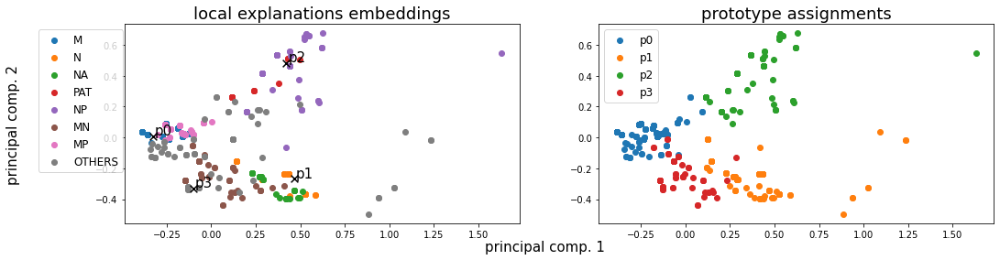

Alpha norms:
tensor([[1.0000, 0.8099, 0.9621, 0.3613],
        [1.0000, 0.5235, 0.6860, 0.1630]], grad_fn=<DivBackward0>)
Concept Purity: 0.648091 +- 0.094234
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([334, 199, 116,  60], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature001) | (feature002)
For class 1:
0.8998589562764457 (feature000) | ((feature003)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


120: Loss: 0.04333, LEN: 0.042925, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03410, V. LEN 0.03
121: Loss: 0.04031, LEN: 0.039855, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03433, V. LEN 0.03
122: Loss: 0.04610, LEN: 0.045500, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03439, V. LEN 0.03
123: Loss: 0.04269, LEN: 0.042301, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03645, V. LEN 0.04
124: Loss: 0.04572, LEN: 0.045342, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03497, V. LEN 0.03
125: Loss: 0.04275, 

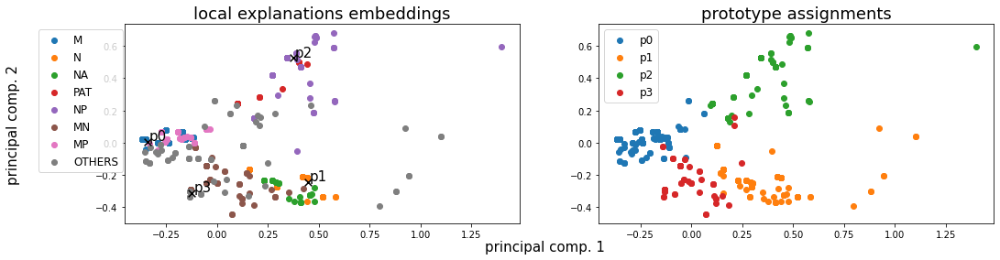

Alpha norms:
tensor([[1.0000, 0.7969, 0.9346, 0.3353],
        [1.0000, 0.5037, 0.6459, 0.1407]], grad_fn=<DivBackward0>)
Concept Purity: 0.648837 +- 0.089813
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([336, 201, 114,  58], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature001) | (feature002)
For class 1:
0.8942172073342737 (feature000) | ((feature003)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


140: Loss: 0.04680, LEN: 0.046258, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03359, V. LEN 0.03
141: Loss: 0.04286, LEN: 0.042545, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03364, V. LEN 0.03
142: Loss: 0.04423, LEN: 0.043933, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03362, V. LEN 0.03
143: Loss: 0.04239, LEN: 0.041781, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03366, V. LEN 0.03
144: Loss: 0.04166, LEN: 0.041383, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03918, V. LEN 0.04
145: Loss: 0.04771, 

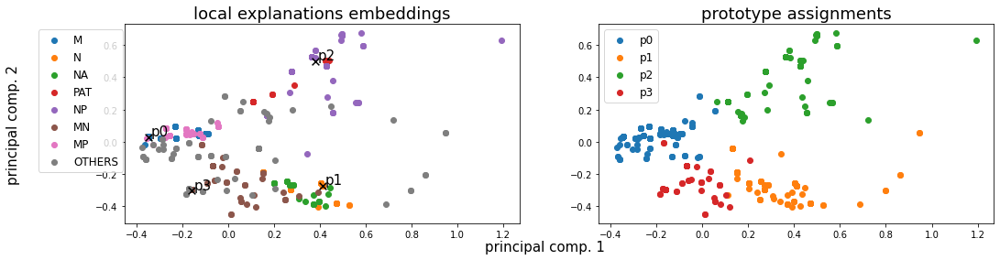

Alpha norms:
tensor([[1.0000, 0.7890, 0.9521, 0.3314],
        [1.0000, 0.4805, 0.6266, 0.1293]], grad_fn=<DivBackward0>)
Concept Purity: 0.665116 +- 0.095846
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([341, 200, 117,  51], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001) | (feature002)
For class 1:
0.8970380818053597 (feature000) | ((feature003)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


160: Loss: 0.04319, LEN: 0.042900, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03371, V. LEN 0.03
161: Loss: 0.04176, LEN: 0.041529, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03373, V. LEN 0.03
162: Loss: 0.04748, LEN: 0.046977, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03389, V. LEN 0.03
163: Loss: 0.04237, LEN: 0.042054, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03373, V. LEN 0.03
164: Loss: 0.04178, LEN: 0.041507, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03376, V. LEN 0.03
165: Loss: 0.04489, L

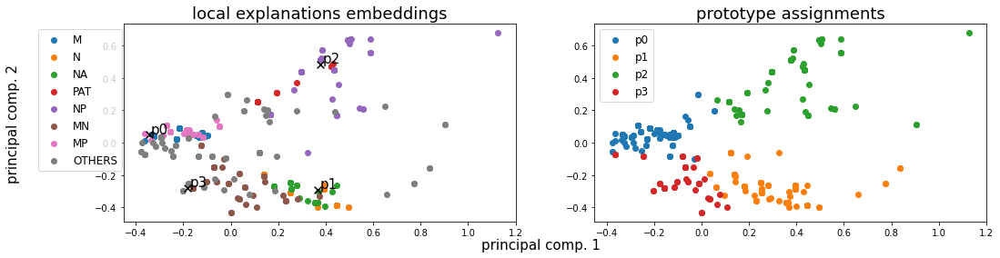

Alpha norms:
tensor([[0.9710, 0.7705, 1.0000, 0.3194],
        [1.0000, 0.4732, 0.6484, 0.1285]], grad_fn=<DivBackward0>)
Concept Purity: 0.634081 +- 0.101601
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([333, 204, 119,  53], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | (feature002)
For class 1:
0.9026798307475318 (feature000) | ((feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


180: Loss: 0.04575, LEN: 0.045461, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03374, V. LEN 0.03
181: Loss: 0.04264, LEN: 0.042394, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03662, V. LEN 0.04
182: Loss: 0.04772, LEN: 0.047377, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03379, V. LEN 0.03
183: Loss: 0.04213, LEN: 0.041849, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03379, V. LEN 0.03
184: Loss: 0.04172, LEN: 0.041195, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03669, V. LEN 0.04
185: Loss: 0.04418, 

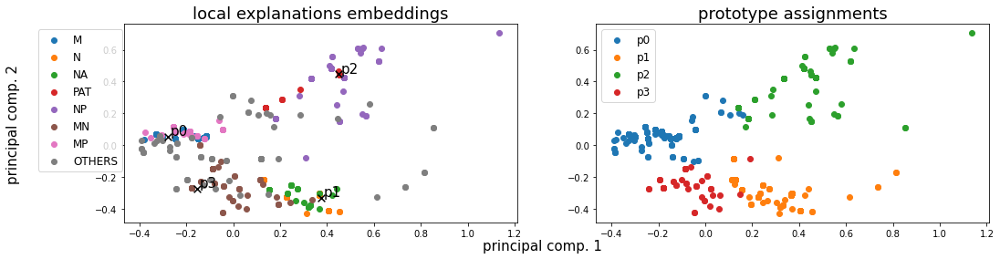

Alpha norms:
tensor([[0.9209, 0.7290, 1.0000, 0.3060],
        [1.0000, 0.4701, 0.6538, 0.1298]], grad_fn=<DivBackward0>)
Concept Purity: 0.672139 +- 0.090986
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([347, 196, 115,  51], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature001) | (feature002)
For class 1:
0.8998589562764457 (feature000) | ((feature003)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


200: Loss: 0.04427, LEN: 0.043809, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03407, V. LEN 0.03
201: Loss: 0.04273, LEN: 0.042508, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03402, V. LEN 0.03
202: Loss: 0.04789, LEN: 0.047631, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03677, V. LEN 0.04
203: Loss: 0.04115, LEN: 0.040857, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03398, V. LEN 0.03
204: Loss: 0.04471, LEN: 0.044548, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03594, V. LEN 0.04
205: Loss: 0.04133, 

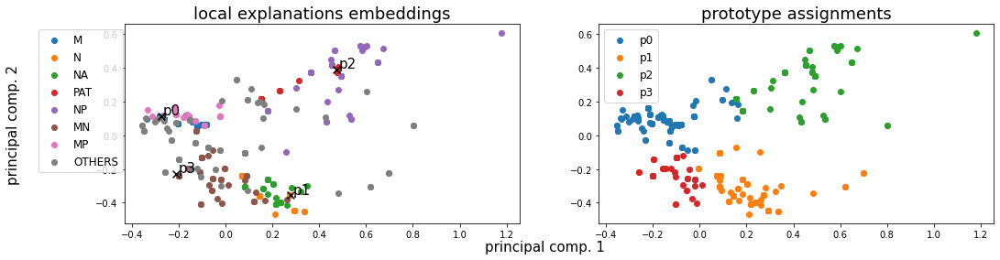

Alpha norms:
tensor([[0.9017, 0.7208, 1.0000, 0.2959],
        [1.0000, 0.4732, 0.6514, 0.1293]], grad_fn=<DivBackward0>)
Concept Purity: 0.674796 +- 0.094812
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([348, 200, 114,  47], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001) | (feature002)
For class 1:
0.9040902679830748 (feature000) | ((feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


220: Loss: 0.04611, LEN: 0.045686, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03398, V. LEN 0.03
221: Loss: 0.04161, LEN: 0.041402, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03675, V. LEN 0.04
222: Loss: 0.04772, LEN: 0.047381, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03400, V. LEN 0.03
223: Loss: 0.04099, LEN: 0.040837, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04201, V. LEN 0.04
224: Loss: 0.04413, LEN: 0.043735, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03682, V. LEN 0.04
225: Loss: 0.04599, 

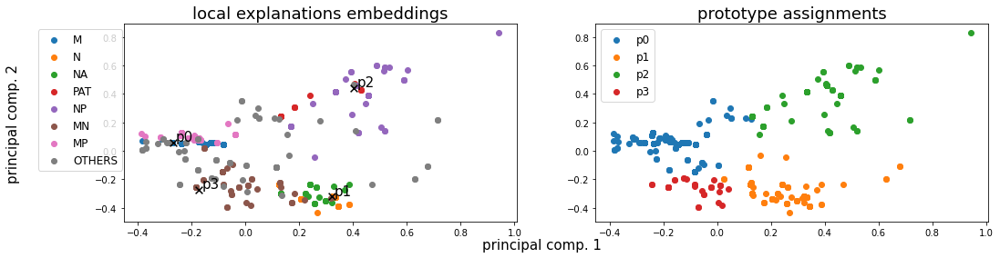

Alpha norms:
tensor([[0.8883, 0.7156, 1.0000, 0.2856],
        [1.0000, 0.4771, 0.6477, 0.1293]], grad_fn=<DivBackward0>)
Concept Purity: 0.664637 +- 0.088281
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([361, 200, 115,  33], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | (feature002)
For class 1:
0.9026798307475318 (feature000) | ((feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


240: Loss: 0.04406, LEN: 0.043488, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03684, V. LEN 0.04
241: Loss: 0.04269, LEN: 0.042573, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03929, V. LEN 0.04
Early Stopping
Loading model at epoch 140
Best epoch: 140
Trained lasted for 63 seconds
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


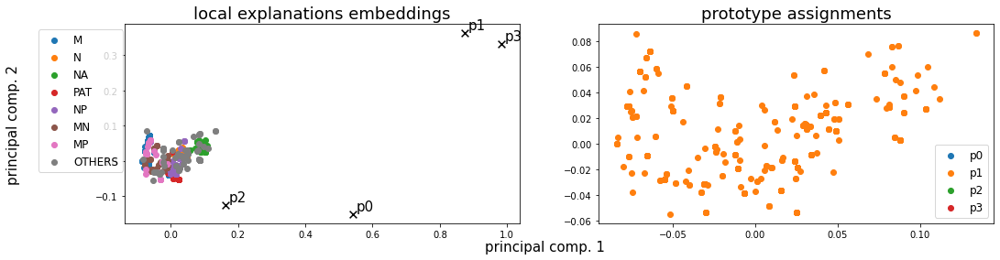

Alpha norms:
tensor([[0.8447, 1.0000, 0.7540, 0.7290],
        [1.0000, 0.8509, 0.8434, 0.9098]], grad_fn=<DivBackward0>)
Concept Purity: 0.375176 +- 0.000000
Concept distribution:  (array([1], dtype=int64), array([709], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.34582, LEN: 0.114510, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.30045, V. LEN 0.11
  2: Loss: 0.31156, LEN: 0.113312, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.25782, V. LEN 0.11
  3: Loss: 0.26663, LEN: 0.112186, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22779, V. LEN 0.11
  4: Loss: 0.24249, LEN: 0.111124, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21342, V. LEN 0.11
  5: Loss: 0.21697, LEN: 0.110160, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20745, V. LEN 0.11
  6: Loss: 0.20135, LEN: 0.109205, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20037, V. LEN 0.11
  7: Loss: 0.19476, LEN: 0.10

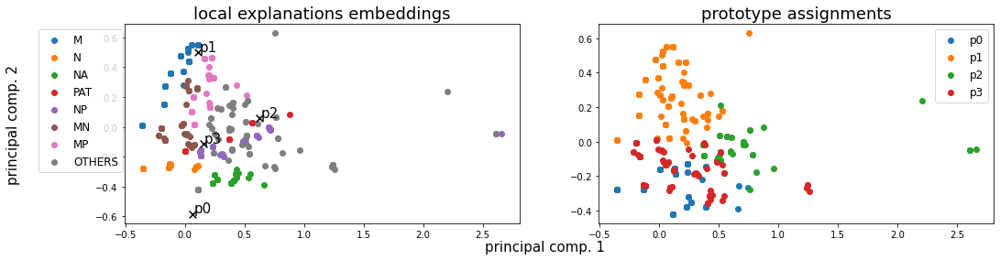

Alpha norms:
tensor([[0.7966, 1.0000, 0.6504, 0.6892],
        [1.0000, 0.8483, 0.8364, 0.8956]], grad_fn=<DivBackward0>)
Concept Purity: 0.487607 +- 0.176152
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([214, 340,  41, 114], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.11462, LEN: 0.099406, AccxC: 0.84, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11474, V. LEN 0.10
 21: Loss: 0.11072, LEN: 0.098970, AccxC: 0.84, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11196, V. LEN 0.10
 22: Loss: 0.10867, LEN: 0.098715, AccxC: 0.84, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10947, V. LEN 0.10
 23: Loss: 0.10636, LEN: 0.098487, AccxC: 0.83, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10739, V. LEN 0.10
 24: Loss: 0.10425, LEN: 0.098188, AccxC: 0.82, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10524, V. LEN 0.10
 25: Loss: 0.10213, LEN: 0.097879, AccxC: 0.82, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10352, V. LEN 0.10
 26:

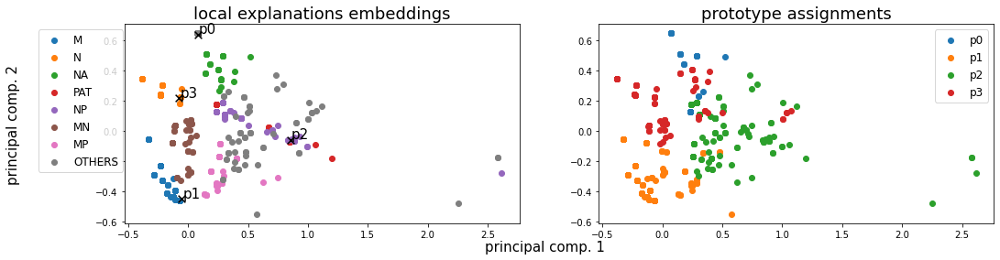

Alpha norms:
tensor([[0.8728, 1.0000, 0.7326, 0.7928],
        [0.9838, 1.0000, 0.9383, 0.9617]], grad_fn=<DivBackward0>)
Concept Purity: 0.584763 +- 0.198794
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 53, 322, 156, 178], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 40: Loss: 0.09432, LEN: 0.093316, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09635, V. LEN 0.09
 41: Loss: 0.09354, LEN: 0.092737, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09583, V. LEN 0.09
 42: Loss: 0.09321, LEN: 0.092152, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09499, V. LEN 0.09
 43: Loss: 0.09326, LEN: 0.091481, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09418, V. LEN 0.09
 44: Loss: 0.09172, LEN: 0.090770, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09391, V. LEN 0.09
 45: Loss: 0.09128, LEN: 0.090072, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09289, V. LEN 0.09
 46:

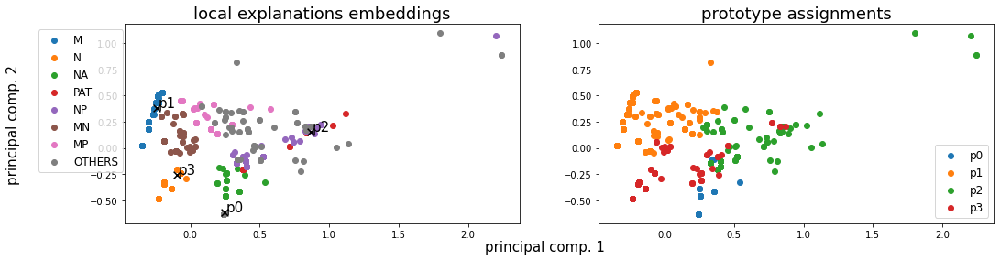

Alpha norms:
tensor([[0.6169, 1.0000, 0.5128, 0.9988],
        [0.5968, 0.8901, 1.0000, 0.6166]], grad_fn=<DivBackward0>)
Concept Purity: 0.633810 +- 0.141657
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 362, 140, 165], dtype=int64))
Logic formulas:
For class 0:
0.8519040902679831 (feature003) | ((feature002) | (feature000)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4725)


 60: Loss: 0.07550, LEN: 0.074496, AccxC: 0.85, AccO: 0.29, V. Acc: 0.41, V. Loss: 0.07719, V. LEN 0.07
 61: Loss: 0.07426, LEN: 0.073360, AccxC: 0.85, AccO: 0.59, V. Acc: 0.65, V. Loss: 0.07592, V. LEN 0.07
 62: Loss: 0.07267, LEN: 0.071927, AccxC: 0.85, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.07436, V. LEN 0.07
 63: Loss: 0.07128, LEN: 0.070518, AccxC: 0.85, AccO: 0.64, V. Acc: 0.85, V. Loss: 0.07305, V. LEN 0.07
 64: Loss: 0.06964, LEN: 0.069150, AccxC: 0.86, AccO: 0.86, V. Acc: 0.85, V. Loss: 0.07193, V. LEN 0.07
 65: Loss: 0.06884, LEN: 0.068253, AccxC: 0.87, 

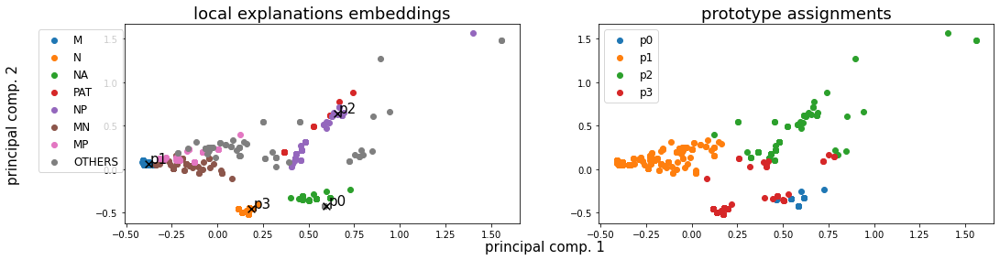

Alpha norms:
tensor([[0.5613, 1.0000, 0.2976, 0.8747],
        [0.4418, 0.7431, 1.0000, 0.5729]], grad_fn=<DivBackward0>)
Concept Purity: 0.636050 +- 0.131439
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 43, 392, 123, 151], dtype=int64))
Logic formulas:
For class 0:
0.8772919605077574 (feature003) | ((feature002) | (feature000)
For class 1:
0.8772919605077574 (feature001)
Accuracy as classifier:  0.8773
LEN fidelity:  tensor(0.8773)


 80: Loss: 0.05389, LEN: 0.053534, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.05248, V. LEN 0.05
 81: Loss: 0.05285, LEN: 0.052423, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.05175, V. LEN 0.05
 82: Loss: 0.05231, LEN: 0.051684, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.05105, V. LEN 0.05
 83: Loss: 0.05173, LEN: 0.051328, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04844, V. LEN 0.05
 84: Loss: 0.05050, LEN: 0.049944, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04775, V. LEN 0.05
 85: Loss: 0.05043, 

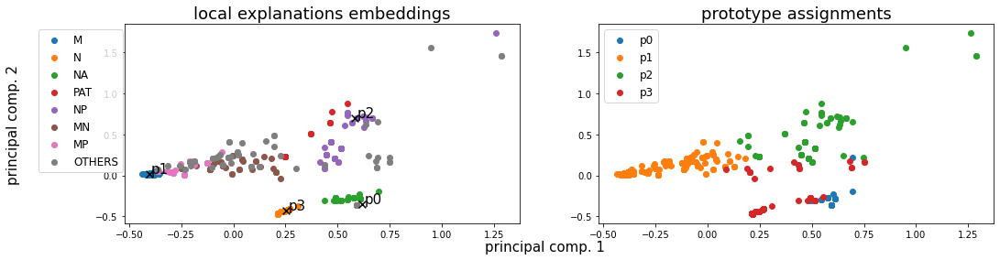

Alpha norms:
tensor([[0.4966, 1.0000, 0.3792, 0.6049],
        [0.5057, 0.8430, 1.0000, 0.6926]], grad_fn=<DivBackward0>)
Concept Purity: 0.642904 +- 0.118451
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 45, 393, 118, 153], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature003) | ((feature002) | (feature000)
For class 1:
0.8899858956276445 (feature001)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


100: Loss: 0.04683, LEN: 0.046449, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04723, V. LEN 0.04
101: Loss: 0.04735, LEN: 0.046811, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04703, V. LEN 0.04
102: Loss: 0.04654, LEN: 0.046140, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04692, V. LEN 0.04
103: Loss: 0.04580, LEN: 0.045082, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04680, V. LEN 0.04
104: Loss: 0.04655, LEN: 0.046034, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04668, V. LEN 0.04
105: Loss: 0.04450, LE

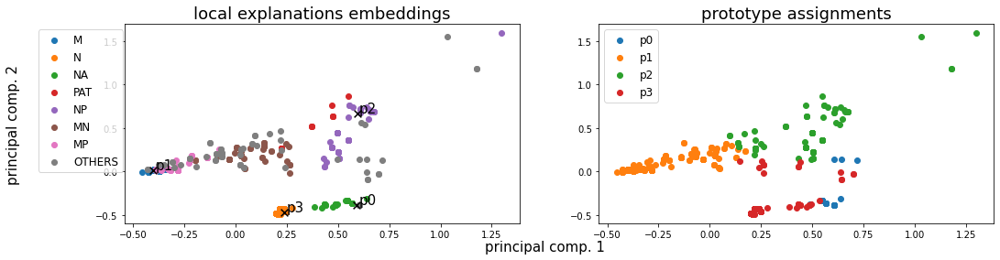

Alpha norms:
tensor([[0.4325, 1.0000, 0.3952, 0.5107],
        [0.5814, 1.0000, 0.9415, 0.8380]], grad_fn=<DivBackward0>)
Concept Purity: 0.651852 +- 0.120163
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 383, 128, 156], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature003) | ((feature002) | (feature000)
For class 1:
0.8956276445698167 (feature001)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


120: Loss: 0.04480, LEN: 0.044347, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04109, V. LEN 0.04
121: Loss: 0.04304, LEN: 0.042584, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04126, V. LEN 0.04
122: Loss: 0.04321, LEN: 0.042864, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04118, V. LEN 0.04
123: Loss: 0.04199, LEN: 0.041770, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04119, V. LEN 0.04
124: Loss: 0.04240, LEN: 0.041735, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04115, V. LEN 0.04
125: Loss: 0.04347, 

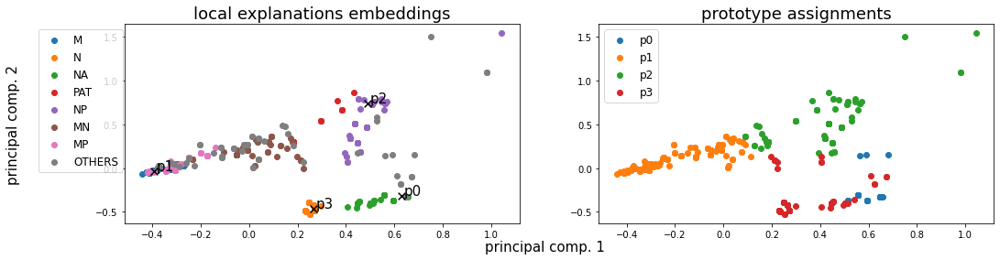

Alpha norms:
tensor([[0.4038, 1.0000, 0.3725, 0.4993],
        [0.5672, 1.0000, 0.8276, 0.8696]], grad_fn=<DivBackward0>)
Concept Purity: 0.654162 +- 0.116997
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 387, 125, 155], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature003) | ((feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


140: Loss: 0.04287, LEN: 0.042566, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04037, V. LEN 0.04
141: Loss: 0.04279, LEN: 0.042006, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04006, V. LEN 0.04
142: Loss: 0.04230, LEN: 0.041958, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
143: Loss: 0.04298, LEN: 0.042363, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04043, V. LEN 0.04
144: Loss: 0.04238, LEN: 0.042045, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04054, V. LEN 0.04
145: Loss: 0.04216, 

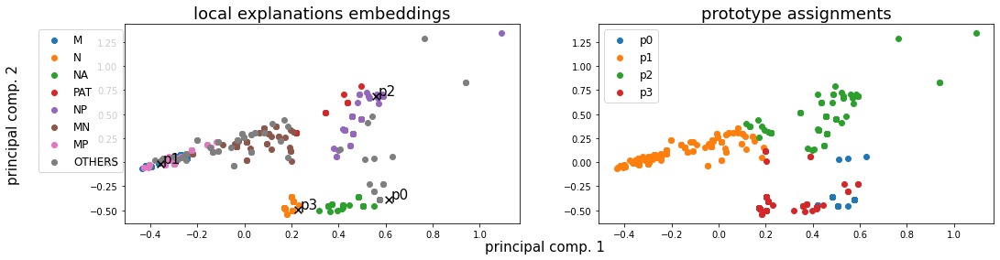

Alpha norms:
tensor([[0.3964, 1.0000, 0.3620, 0.4825],
        [0.5604, 1.0000, 0.7971, 0.8559]], grad_fn=<DivBackward0>)
Concept Purity: 0.659933 +- 0.116103
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 392, 123, 152], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature003) | ((feature002) | (feature000)
For class 1:
0.8970380818053597 (feature001)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


160: Loss: 0.04184, LEN: 0.041551, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
161: Loss: 0.04394, LEN: 0.043657, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04005, V. LEN 0.04
162: Loss: 0.04225, LEN: 0.041918, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03995, V. LEN 0.04
163: Loss: 0.04235, LEN: 0.042068, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03981, V. LEN 0.04
164: Loss: 0.04246, LEN: 0.042059, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03988, V. LEN 0.04
165: Loss: 0.04154, L

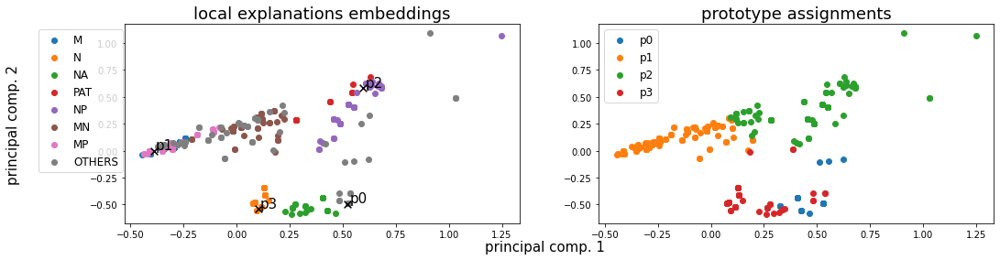

Alpha norms:
tensor([[0.3896, 1.0000, 0.3579, 0.5062],
        [0.5506, 1.0000, 0.7825, 0.9120]], grad_fn=<DivBackward0>)
Concept Purity: 0.656662 +- 0.139914
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 382, 136, 149], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature003) | ((feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


180: Loss: 0.04254, LEN: 0.041911, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03965, V. LEN 0.04
181: Loss: 0.04300, LEN: 0.042729, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03669, V. LEN 0.04
182: Loss: 0.04361, LEN: 0.043266, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03957, V. LEN 0.04
183: Loss: 0.04294, LEN: 0.042699, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03704, V. LEN 0.04
184: Loss: 0.04288, LEN: 0.042457, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03991, V. LEN 0.04
185: Loss: 0.04037, 

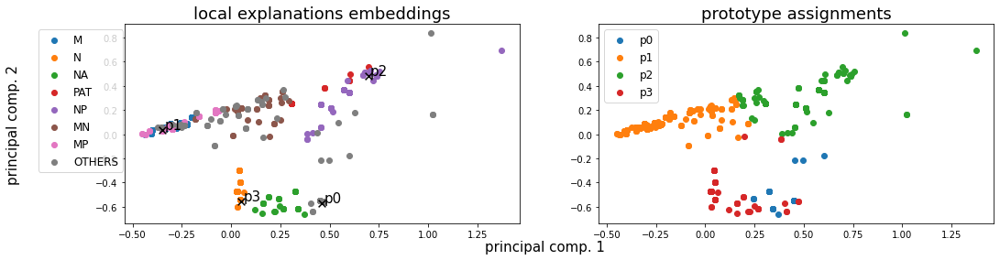

Alpha norms:
tensor([[0.3833, 1.0000, 0.3553, 0.5103],
        [0.5391, 1.0000, 0.7759, 0.9313]], grad_fn=<DivBackward0>)
Concept Purity: 0.657429 +- 0.137191
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 384, 134, 149], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature003) | ((feature002) | (feature000)
For class 1:
0.8998589562764457 (feature001)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


200: Loss: 0.04433, LEN: 0.044126, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03940, V. LEN 0.04
201: Loss: 0.04143, LEN: 0.041080, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03657, V. LEN 0.04
202: Loss: 0.04523, LEN: 0.044817, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03979, V. LEN 0.04
203: Loss: 0.04169, LEN: 0.041275, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03926, V. LEN 0.04
204: Loss: 0.04542, LEN: 0.044967, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03928, V. LEN 0.04
205: Loss: 0.04169, 

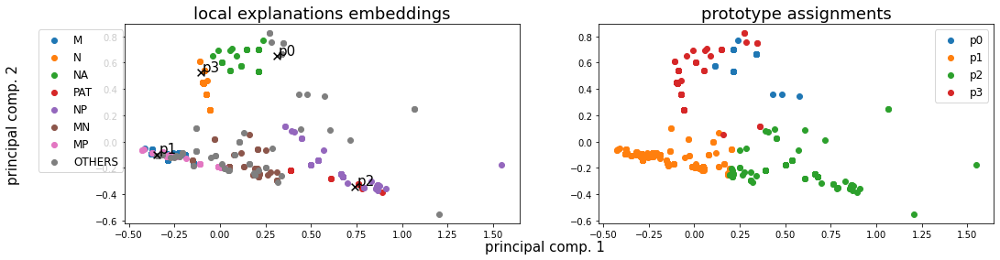

Alpha norms:
tensor([[0.3823, 1.0000, 0.3477, 0.5242],
        [0.5365, 1.0000, 0.7563, 0.9669]], grad_fn=<DivBackward0>)
Concept Purity: 0.656662 +- 0.139914
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 42, 382, 136, 149], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature003) | ((feature002) | (feature000)
For class 1:
0.8970380818053597 (feature001)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


220: Loss: 0.04835, LEN: 0.047751, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03593, V. LEN 0.04
221: Loss: 0.04290, LEN: 0.042490, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03582, V. LEN 0.04
222: Loss: 0.04309, LEN: 0.042280, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03633, V. LEN 0.04
223: Loss: 0.04357, LEN: 0.043232, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03903, V. LEN 0.04
224: Loss: 0.04148, LEN: 0.041164, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03640, V. LEN 0.04
225: Loss: 0.05099, L

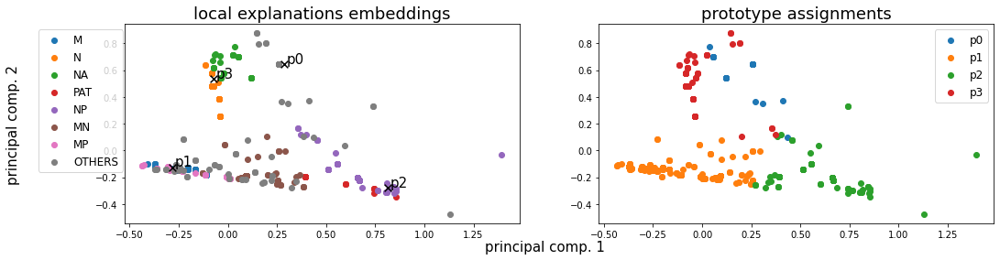

Alpha norms:
tensor([[0.3890, 1.0000, 0.3592, 0.5528],
        [0.5304, 0.9863, 0.7608, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.670411 +- 0.118055
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 40, 393, 123, 153], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature003) | ((feature002) | (feature000)
For class 1:
0.8956276445698167 (feature001)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


240: Loss: 0.04206, LEN: 0.041698, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03624, V. LEN 0.04
241: Loss: 0.04236, LEN: 0.041855, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03953, V. LEN 0.04
242: Loss: 0.04388, LEN: 0.043531, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03615, V. LEN 0.04
243: Loss: 0.04246, LEN: 0.042164, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03612, V. LEN 0.04
244: Loss: 0.05052, LEN: 0.050266, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03623, V. LEN 0.04
245: Loss: 0.04131, 

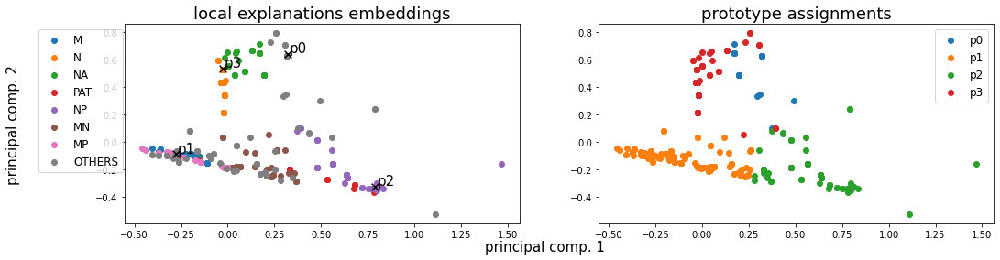

Alpha norms:
tensor([[0.3726, 1.0000, 0.3656, 0.5511],
        [0.4990, 0.9778, 0.7682, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.673947 +- 0.115071
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 40, 395, 122, 152], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature003) | ((feature002) | (feature000)
For class 1:
0.8956276445698167 (feature001)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


260: Loss: 0.04189, LEN: 0.041680, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03640, V. LEN 0.04
261: Loss: 0.04356, LEN: 0.043296, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03641, V. LEN 0.04
262: Loss: 0.04502, LEN: 0.044413, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03625, V. LEN 0.04
263: Loss: 0.04624, LEN: 0.046024, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03611, V. LEN 0.04
264: Loss: 0.04240, LEN: 0.042116, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03632, V. LEN 0.04
265: Loss: 0.04825, 

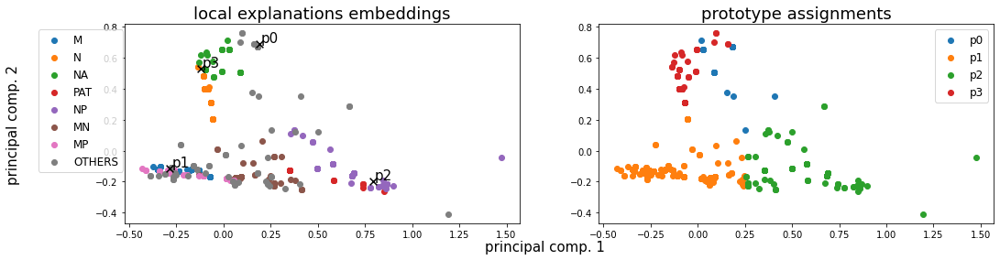

Alpha norms:
tensor([[0.3683, 1.0000, 0.3728, 0.5577],
        [0.4703, 0.9632, 0.7696, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.587618 +- 0.084808
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 40, 471, 135,  63], dtype=int64))
Logic formulas:
For class 0:
0.8194640338504936 (feature002) | (feature003) | ((feature000)
For class 1:
0.8194640338504936 (feature001)
Accuracy as classifier:  0.8195
LEN fidelity:  tensor(0.8195)


280: Loss: 0.04496, LEN: 0.044634, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.05433, V. LEN 0.05
281: Loss: 0.04858, LEN: 0.048302, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03605, V. LEN 0.04
282: Loss: 0.04465, LEN: 0.043764, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03611, V. LEN 0.04
283: Loss: 0.04080, LEN: 0.040483, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03904, V. LEN 0.04
284: Loss: 0.04262, LEN: 0.042095, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03636, V. LEN 0.04
285: Loss: 0.04829, 

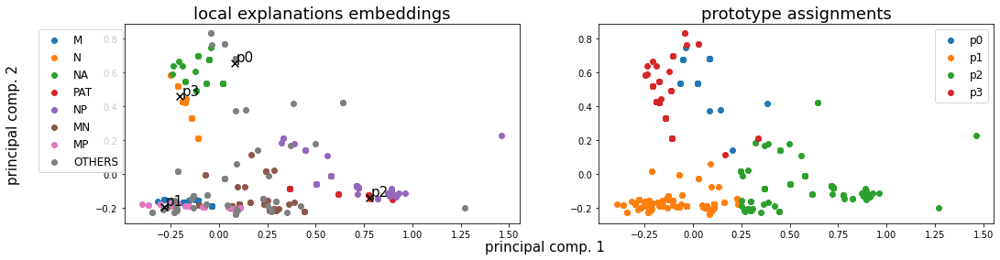

Alpha norms:
tensor([[0.3677, 1.0000, 0.3694, 0.5549],
        [0.4690, 0.9672, 0.7666, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.657540 +- 0.146645
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 43, 376, 141, 149], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature003) | (feature002) | ((feature000)
For class 1:
0.8998589562764457 (feature001)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


300: Loss: 0.04799, LEN: 0.047630, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03880, V. LEN 0.04
301: Loss: 0.04284, LEN: 0.042564, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03584, V. LEN 0.04
302: Loss: 0.04158, LEN: 0.040321, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03594, V. LEN 0.04
303: Loss: 0.04299, LEN: 0.042640, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03890, V. LEN 0.04
304: Loss: 0.04255, LEN: 0.042310, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03883, V. LEN 0.04
305: Loss: 0.04250, 

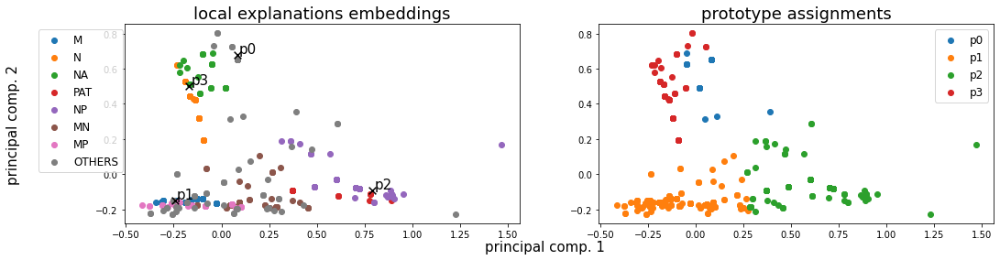

Alpha norms:
tensor([[0.3629, 1.0000, 0.3600, 0.5547],
        [0.4611, 0.9595, 0.7450, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.671755 +- 0.132977
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 39, 386, 135, 149], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature003) | ((feature002) | (feature000)
For class 1:
0.8998589562764457 (feature001)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


320: Loss: 0.04269, LEN: 0.042400, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03575, V. LEN 0.04
321: Loss: 0.04819, LEN: 0.047974, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03861, V. LEN 0.04
322: Loss: 0.04132, LEN: 0.040931, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03566, V. LEN 0.04
323: Loss: 0.04520, LEN: 0.045024, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.05396, V. LEN 0.05
324: Loss: 0.04644, LEN: 0.046127, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.03285, V. LEN 0.03
325: Loss: 0.04321, 

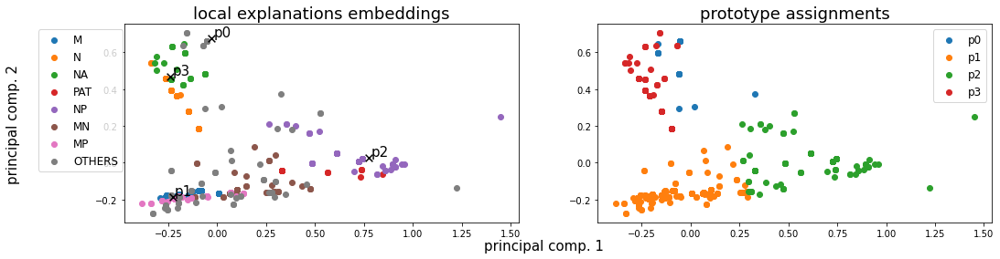

Alpha norms:
tensor([[0.3750, 1.0000, 0.3619, 0.5565],
        [0.4773, 0.9572, 0.7422, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.673078 +- 0.128773
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 39, 389, 132, 149], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature003) | ((feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


340: Loss: 0.04262, LEN: 0.042353, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03589, V. LEN 0.04
341: Loss: 0.04796, LEN: 0.047803, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03580, V. LEN 0.04
342: Loss: 0.04216, LEN: 0.041984, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03574, V. LEN 0.04
343: Loss: 0.04298, LEN: 0.042760, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03576, V. LEN 0.04
344: Loss: 0.04399, LEN: 0.043795, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03585, V. LEN 0.04
345: Loss: 0.04445, 

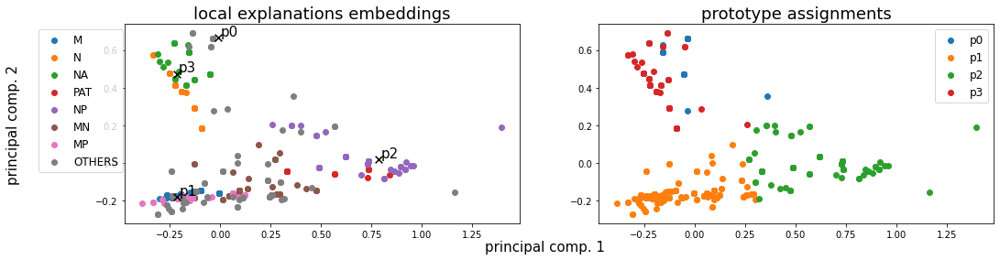

Alpha norms:
tensor([[0.3755, 1.0000, 0.3689, 0.5609],
        [0.4728, 0.9484, 0.7487, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.669265 +- 0.120631
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 38, 393, 127, 151], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature003) | ((feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


360: Loss: 0.04312, LEN: 0.042855, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03573, V. LEN 0.04
361: Loss: 0.04768, LEN: 0.047502, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03565, V. LEN 0.04
362: Loss: 0.04241, LEN: 0.042242, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03564, V. LEN 0.04
363: Loss: 0.04257, LEN: 0.042369, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03568, V. LEN 0.04
364: Loss: 0.04536, LEN: 0.045159, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03578, V. LEN 0.04
365: Loss: 0.04841, 

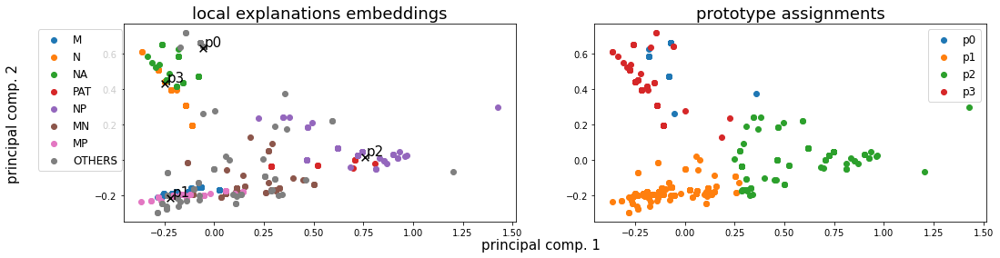

Alpha norms:
tensor([[0.3760, 1.0000, 0.3730, 0.5713],
        [0.4590, 0.9328, 0.7402, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.662500 +- 0.139068
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 38, 378, 141, 152], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature003) | ((feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


380: Loss: 0.04785, LEN: 0.047713, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03580, V. LEN 0.04
381: Loss: 0.04555, LEN: 0.045383, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03585, V. LEN 0.04
382: Loss: 0.05174, LEN: 0.051578, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03590, V. LEN 0.04
383: Loss: 0.04266, LEN: 0.042417, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03595, V. LEN 0.04
384: Loss: 0.04083, LEN: 0.040686, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03610, V. LEN 0.04
385: Loss: 0.04229, 

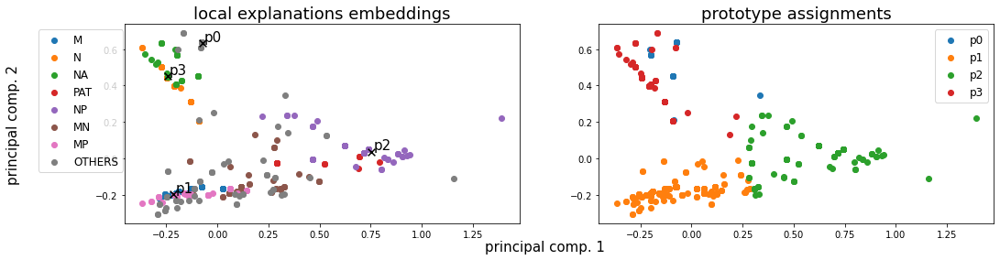

Alpha norms:
tensor([[0.3842, 1.0000, 0.3816, 0.5798],
        [0.4590, 0.9189, 0.7395, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.664637 +- 0.130605
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 38, 384, 135, 152], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature003) | ((feature002) | (feature000)
For class 1:
0.8998589562764457 (feature001)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


400: Loss: 0.04076, LEN: 0.040625, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03581, V. LEN 0.04
401: Loss: 0.04157, LEN: 0.041375, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03591, V. LEN 0.04
402: Loss: 0.04400, LEN: 0.043866, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03582, V. LEN 0.04
403: Loss: 0.04219, LEN: 0.041616, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03586, V. LEN 0.04
404: Loss: 0.04986, LEN: 0.049629, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03579, V. LEN 0.04
405: Loss: 0.04120, 

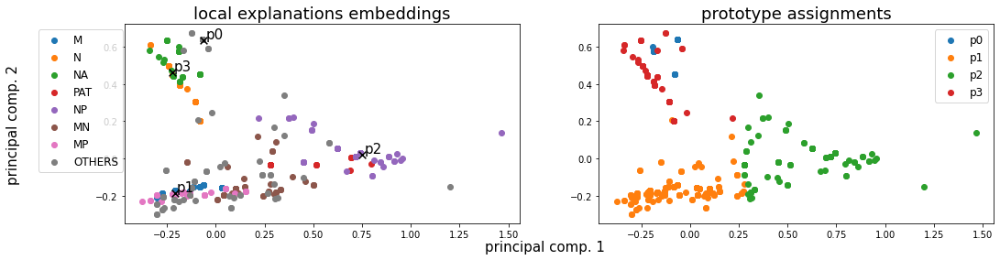

Alpha norms:
tensor([[0.3909, 1.0000, 0.3821, 0.5783],
        [0.4672, 0.9165, 0.7348, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.659486 +- 0.134345
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 36, 385, 137, 151], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature003) | ((feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


420: Loss: 0.04493, LEN: 0.044778, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03587, V. LEN 0.04
Early Stopping
Loading model at epoch 319
Best epoch: 319
Trained lasted for 108 seconds
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


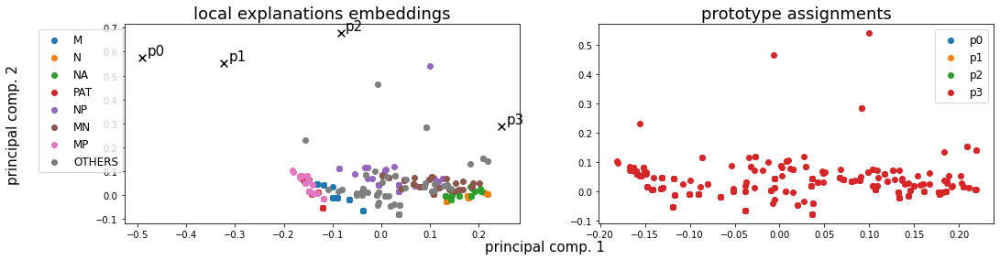

Alpha norms:
tensor([[0.7931, 0.8350, 1.0000, 0.9032],
        [1.0000, 0.8446, 0.9190, 0.7527]], grad_fn=<DivBackward0>)
Concept Purity: 0.375176 +- 0.000000
Concept distribution:  (array([3], dtype=int64), array([709], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.33653, LEN: 0.090716, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.27766, V. LEN 0.09
  2: Loss: 0.25826, LEN: 0.090488, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22794, V. LEN 0.09
  3: Loss: 0.20825, LEN: 0.090262, AccxC: 0.39, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18574, V. LEN 0.09
  4: Loss: 0.16696, LEN: 0.090024, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14890, V. LEN 0.09
  5: Loss: 0.13656, LEN: 0.089718, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12669, V. LEN 0.09
  6: Loss: 0.12289, LEN: 0.089408, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12156, V. LEN 0.09
  7: Loss: 0.12126, LEN: 0.08

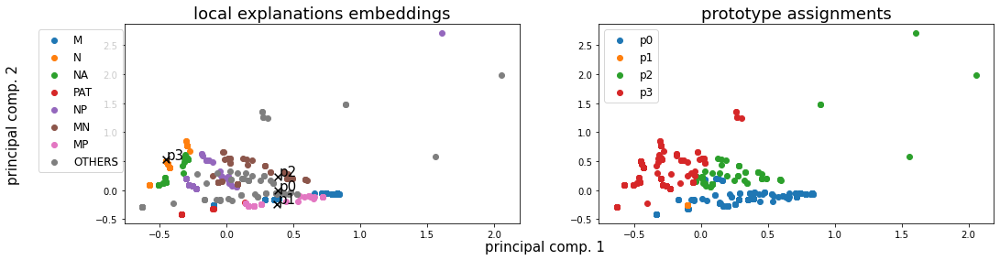

Alpha norms:
tensor([[1.0000, 0.8097, 0.9718, 0.8698],
        [1.0000, 0.7238, 0.7617, 0.6169]], grad_fn=<DivBackward0>)
Concept Purity: 0.653167 +- 0.202533
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([291, 101,  61, 256], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.09865, LEN: 0.086474, AccxC: 0.70, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09781, V. LEN 0.09
 21: Loss: 0.09798, LEN: 0.086302, AccxC: 0.79, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09681, V. LEN 0.09
 22: Loss: 0.09665, LEN: 0.086102, AccxC: 0.81, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09590, V. LEN 0.09
 23: Loss: 0.09574, LEN: 0.085888, AccxC: 0.82, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09503, V. LEN 0.09
 24: Loss: 0.09481, LEN: 0.085786, AccxC: 0.82, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09422, V. LEN 0.09
 25: Loss: 0.09464, LEN: 0.085643, AccxC: 0.82, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09343, V. LEN 0.09
 26:

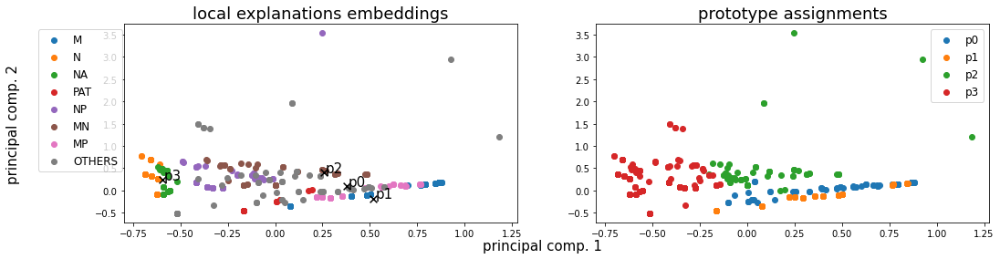

Alpha norms:
tensor([[0.9037, 1.0000, 0.6630, 0.8789],
        [0.9773, 1.0000, 0.5074, 0.4460]], grad_fn=<DivBackward0>)
Concept Purity: 0.556319 +- 0.124283
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([104, 280,  65, 260], dtype=int64))
Logic formulas:
For class 0:
0.8110014104372355 (feature003)
For class 1:
0.8110014104372355 (feature001) | (feature000) | (feature002)
Accuracy as classifier:  0.811
LEN fidelity:  tensor(0.8110)


 40: Loss: 0.08293, LEN: 0.079895, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.08205, V. LEN 0.08
 41: Loss: 0.08195, LEN: 0.079213, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.08105, V. LEN 0.08
 42: Loss: 0.08142, LEN: 0.078234, AccxC: 0.81, AccO: 0.81, V. Acc: 0.85, V. Loss: 0.07999, V. LEN 0.08
 43: Loss: 0.07995, LEN: 0.077714, AccxC: 0.81, AccO: 0.81, V. Acc: 0.85, V. Loss: 0.07901, V. LEN 0.08
 44: Loss: 0.07927, LEN: 0.076993, AccxC: 0.81, AccO: 0.81, V. Acc: 0.85, V. Loss: 0.07783, V. LEN 0.08
 45: Loss: 0.07828, LE

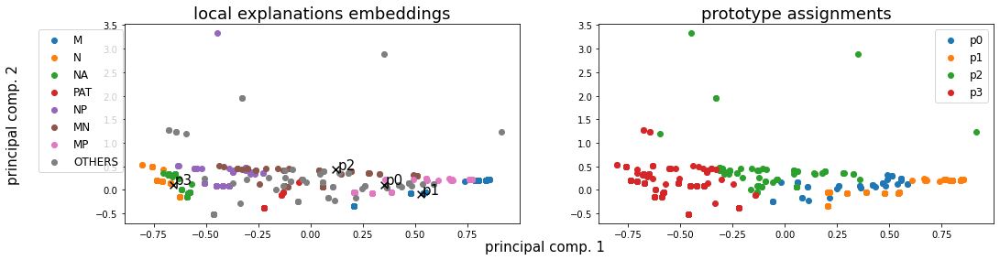

Alpha norms:
tensor([[0.5341, 1.0000, 0.3089, 0.9678],
        [0.4843, 1.0000, 0.2070, 0.4035]], grad_fn=<DivBackward0>)
Concept Purity: 0.651312 +- 0.184251
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 40, 301,  80, 288], dtype=int64))
Logic formulas:
For class 0:
0.8561354019746121 (feature003) | ((feature002)
For class 1:
0.8645980253878702 (feature001) | ((feature002) | (feature000)

------------------------------------------------------------------------------------
Has double activations  tensor(80)
But only for wrong predictions

Accuracy as classifier:  0.8039
LEN fidelity:  tensor(0.8039)


------------------------------------------------------------------------------------
Has double activations  tensor(7)
But only for wrong predictions


 60: Loss: 0.05820, LEN: 0.057129, AccxC: 0.86, AccO: 0.80, V. Acc: 0.85, V. Loss: 0.05345, V. LEN 0.05
 61: Loss: 0.05714, LEN: 0.056047, AccxC: 0.87, AccO: 0.83, V. Acc: 0.91, V. Loss: 0.05189, V. LEN 0.05
 62: Loss: 

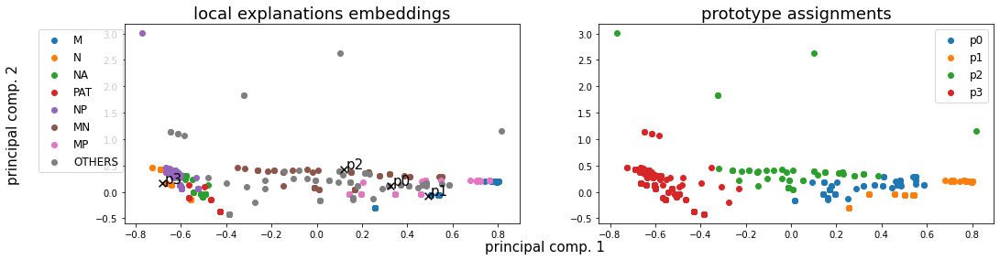

Alpha norms:
tensor([[0.4007, 0.9810, 0.2073, 1.0000],
        [0.3475, 1.0000, 0.0985, 0.3956]], grad_fn=<DivBackward0>)
Concept Purity: 0.614796 +- 0.189974
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 63, 291,  55, 300], dtype=int64))
Logic formulas:
For class 0:
0.8871650211565585 (feature003)
For class 1:
0.8871650211565585 (feature001) | ((feature002) | (feature000)
Accuracy as classifier:  0.8872
LEN fidelity:  tensor(0.8872)


 80: Loss: 0.04491, LEN: 0.044254, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04107, V. LEN 0.04
 81: Loss: 0.04526, LEN: 0.044426, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04096, V. LEN 0.04
 82: Loss: 0.04355, LEN: 0.042674, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04076, V. LEN 0.04
 83: Loss: 0.04453, LEN: 0.043519, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03744, V. LEN 0.04
 84: Loss: 0.04284, LEN: 0.041796, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04043, V. LEN 0.04
 85: Loss: 0.04390, 

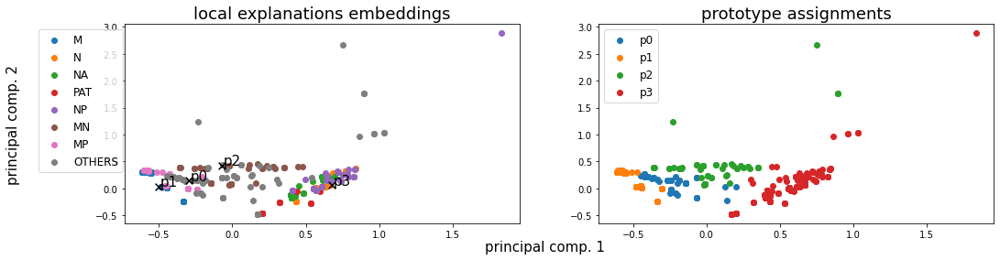

Alpha norms:
tensor([[0.3587, 1.0000, 0.1900, 0.8640],
        [0.2940, 1.0000, 0.0797, 0.3487]], grad_fn=<DivBackward0>)
Concept Purity: 0.655466 +- 0.168973
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 52, 298,  59, 300], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature003)
For class 1:
0.8899858956276445 (feature001) | ((feature002) | (feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


100: Loss: 0.04344, LEN: 0.042810, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03661, V. LEN 0.04
101: Loss: 0.04285, LEN: 0.042034, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03534, V. LEN 0.03
102: Loss: 0.04607, LEN: 0.045422, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03545, V. LEN 0.03
103: Loss: 0.04202, LEN: 0.041512, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04052, V. LEN 0.04
104: Loss: 0.04883, LEN: 0.048050, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04516, V. LEN 0.04
105: Loss: 0.04648, LE

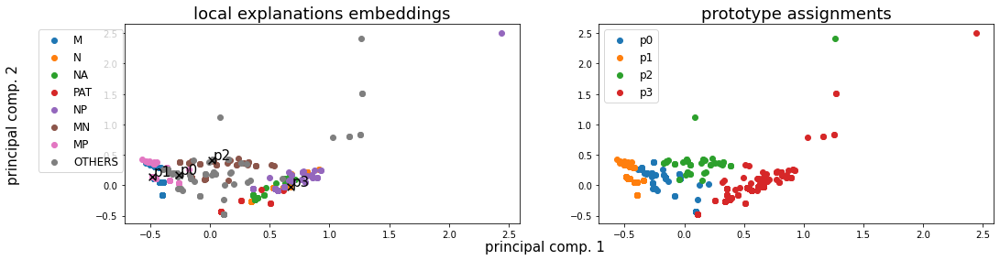

Alpha norms:
tensor([[0.3102, 1.0000, 0.1782, 0.7805],
        [0.2121, 1.0000, 0.0721, 0.3065]], grad_fn=<DivBackward0>)
Concept Purity: 0.595173 +- 0.193250
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([102, 298,  46, 263], dtype=int64))
Logic formulas:
For class 0:
0.8603667136812412 (feature003)
For class 1:
0.8603667136812412 (feature001) | (feature000) | ((feature002)
Accuracy as classifier:  0.8604
LEN fidelity:  tensor(0.8604)


120: Loss: 0.04174, LEN: 0.041017, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.04559, V. LEN 0.05
121: Loss: 0.04350, LEN: 0.042808, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03878, V. LEN 0.04
122: Loss: 0.04296, LEN: 0.042535, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.04523, V. LEN 0.04
123: Loss: 0.05106, LEN: 0.050396, AccxC: 0.86, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.03745, V. LEN 0.04
124: Loss: 0.04186, LEN: 0.041257, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03823, V. LEN 0.04
125: Loss: 0.04362, 

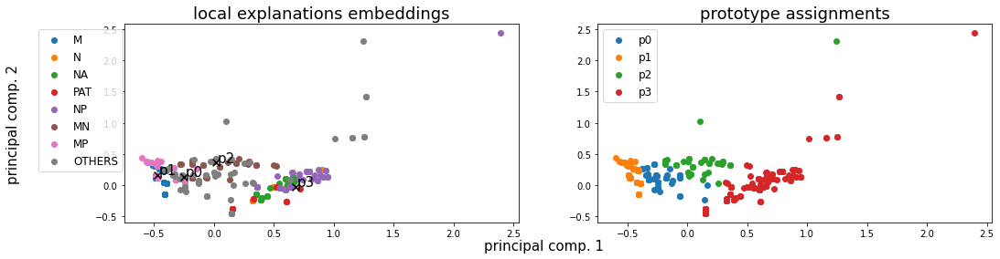

Alpha norms:
tensor([[0.2789, 1.0000, 0.1677, 0.7158],
        [0.1649, 1.0000, 0.0652, 0.2739]], grad_fn=<DivBackward0>)
Concept Purity: 0.593638 +- 0.192431
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 68, 294,  45, 302], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature003)
For class 1:
0.8928067700987306 (feature001) | (feature000) | ((feature002)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


140: Loss: 0.04211, LEN: 0.041623, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03706, V. LEN 0.04
141: Loss: 0.04806, LEN: 0.047589, AccxC: 0.86, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.03747, V. LEN 0.04
142: Loss: 0.04128, LEN: 0.040515, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03732, V. LEN 0.04
143: Loss: 0.04221, LEN: 0.041624, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03771, V. LEN 0.04
144: Loss: 0.04282, LEN: 0.042368, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03718, V. LEN 0.04
145: Loss: 0.04053, 

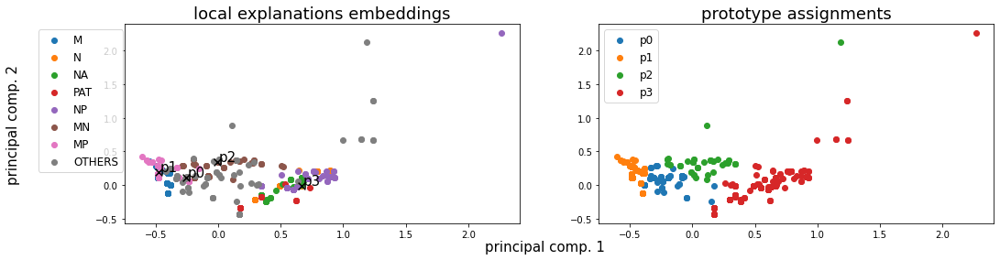

Alpha norms:
tensor([[0.2617, 1.0000, 0.1589, 0.6685],
        [0.1430, 1.0000, 0.0617, 0.2501]], grad_fn=<DivBackward0>)
Concept Purity: 0.584954 +- 0.183847
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 246,  44, 303], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature003)
For class 1:
0.8942172073342737 (feature001) | (feature000) | ((feature002)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


160: Loss: 0.04476, LEN: 0.044370, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03798, V. LEN 0.04
161: Loss: 0.04031, LEN: 0.039749, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03705, V. LEN 0.04
162: Loss: 0.04244, LEN: 0.041899, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03673, V. LEN 0.04
163: Loss: 0.04931, LEN: 0.048749, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03909, V. LEN 0.04
164: Loss: 0.04234, LEN: 0.041940, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03660, V. LEN 0.04
165: Loss: 0.04255, 

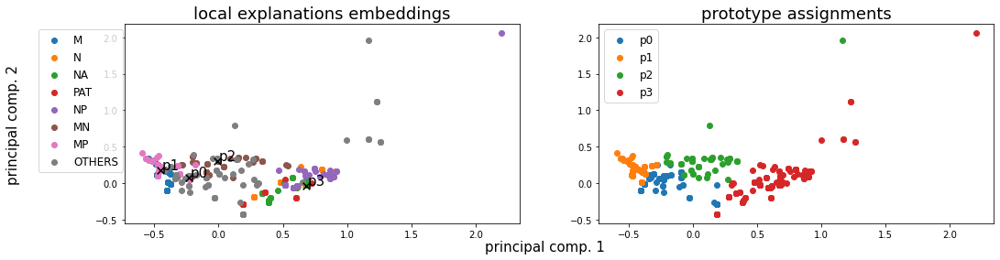

Alpha norms:
tensor([[0.2512, 1.0000, 0.1518, 0.6247],
        [0.1375, 1.0000, 0.0587, 0.2301]], grad_fn=<DivBackward0>)
Concept Purity: 0.615044 +- 0.098893
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([248, 151,  47, 263], dtype=int64))
Logic formulas:
For class 0:
0.8603667136812412 (feature003)
For class 1:
0.8603667136812412 (feature000) | (feature001) | ((feature002)
Accuracy as classifier:  0.8604
LEN fidelity:  tensor(0.8604)


180: Loss: 0.04143, LEN: 0.041063, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.04644, V. LEN 0.05
181: Loss: 0.04748, LEN: 0.047085, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03641, V. LEN 0.04
182: Loss: 0.04030, LEN: 0.039778, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03738, V. LEN 0.04
183: Loss: 0.04130, LEN: 0.040801, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.04409, V. LEN 0.04
184: Loss: 0.04741, LEN: 0.046991, AccxC: 0.86, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.03887, V. LEN 0.04
185: Loss: 0.04037, 

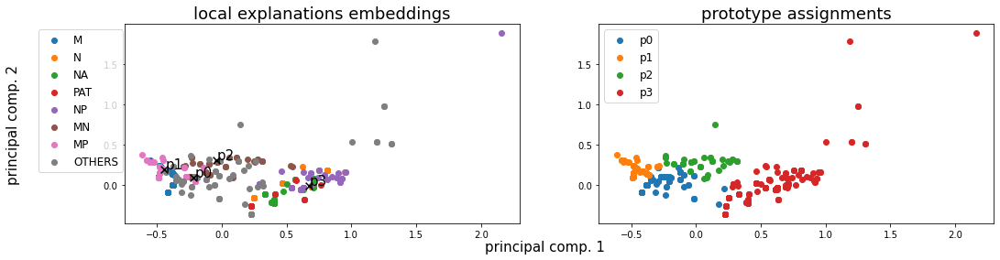

Alpha norms:
tensor([[0.2419, 1.0000, 0.1460, 0.6006],
        [0.1294, 1.0000, 0.0555, 0.2179]], grad_fn=<DivBackward0>)
Concept Purity: 0.629964 +- 0.129741
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([244, 120,  41, 304], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature003)
For class 1:
0.8956276445698167 (feature000) | (feature001) | ((feature002)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


200: Loss: 0.04606, LEN: 0.045570, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03851, V. LEN 0.04
201: Loss: 0.04090, LEN: 0.040319, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03755, V. LEN 0.04
202: Loss: 0.03997, LEN: 0.039519, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03644, V. LEN 0.04
203: Loss: 0.04242, LEN: 0.041863, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03611, V. LEN 0.04
204: Loss: 0.04022, LEN: 0.039722, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.03759, V. LEN 0.04
205: Loss: 0.04367, 

In [10]:
expls = []
for ITERATION_NUM in range(5):
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42 + 10*ITERATION_NUM)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": 4,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "embedder_backbone": "GAT",
        "embedder_num_layers": 2,
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 500
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"],
                                     backbone=hyper["embedder_backbone"],
                                     num_layers=hyper["embedder_num_layers"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                           le_model, 
                                           train_group_loader, 
                                           val_group_loader, 
                                           device, 
                                           hyper_params=hyper,
                                           classes_names=priori_etn_classes_names,
                                           dataset_name="ETN").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb=ITERATION_NUM)
    expls.append(expl)
    
    #with open(f'../logs/model_focal_{use_focal}_BAMultiShapes.pkl', 'wb') as handle:
    #    pickle.dump(expl, handle)

Fidelity:
	 0.9242424368858337  @  363
	 0.939393937587738  @  351
	 0.9242424368858337  @  140
	 0.939393937587738  @  319
	 0.9090909361839294  @  108
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))


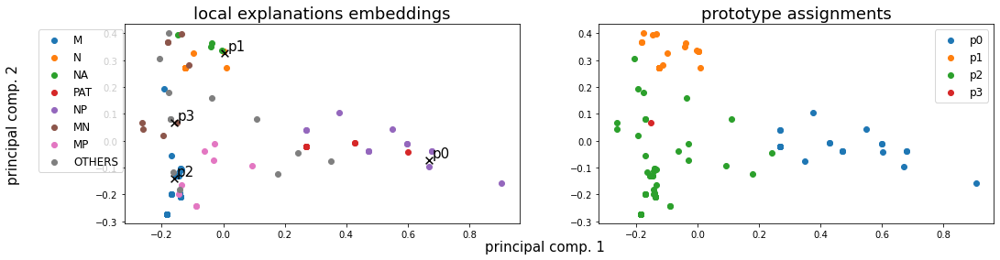

Alpha norms:
tensor([[0.2909, 0.3821, 1.0000, 0.1410],
        [1.0000, 0.7528, 0.9456, 0.3337]], grad_fn=<DivBackward0>)
Concept Purity: 0.712661 +- 0.169069
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([23, 26, 57,  1], dtype=int64))
Logic formulas:
For class 0:
0.8878504672897196 (feature000) | (feature001)
For class 1:
0.8878504672897196 (feature002) | ((feature003)
Accuracy as classifier:  0.8879
LEN fidelity:  tensor(0.8879)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))


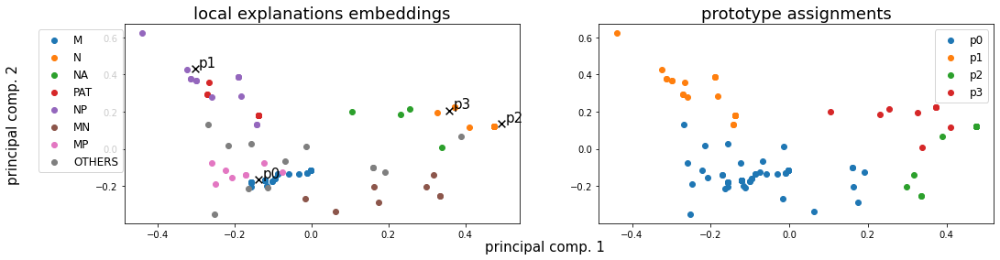

Alpha norms:
tensor([[1.0000, 0.3371, 0.2795, 0.8106],
        [1.0000, 0.3201, 0.2075, 0.3949]], grad_fn=<DivBackward0>)
Concept Purity: 0.615629 +- 0.055667
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([59, 22, 17,  9], dtype=int64))
Logic formulas:
For class 0:
0.897196261682243 (feature001) | ((feature002) | (feature003)
For class 1:
0.897196261682243 (feature000)
Accuracy as classifier:  0.8972
LEN fidelity:  tensor(0.8972)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))


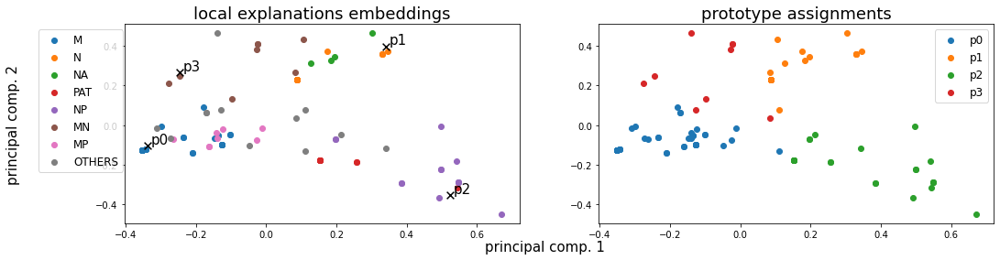

Alpha norms:
tensor([[1.0000, 0.7969, 0.9346, 0.3353],
        [1.0000, 0.5037, 0.6459, 0.1407]], grad_fn=<DivBackward0>)
Concept Purity: 0.659167 +- 0.070676
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([50, 24, 24,  9], dtype=int64))
Logic formulas:
For class 0:
0.897196261682243 (feature002) | (feature001)
For class 1:
0.897196261682243 (feature000) | ((feature003)
Accuracy as classifier:  0.8972
LEN fidelity:  tensor(0.8972)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))


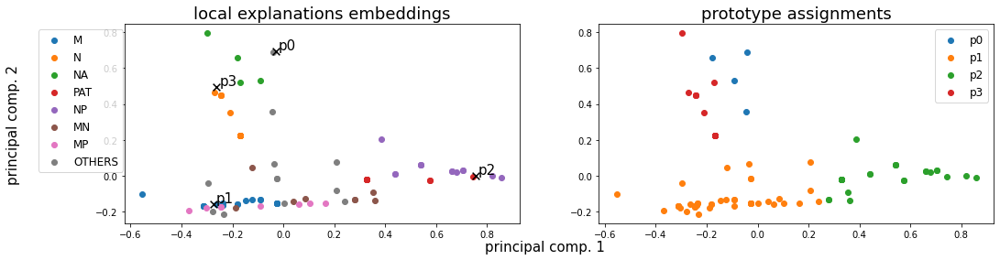

Alpha norms:
tensor([[0.3651, 1.0000, 0.3614, 0.5563],
        [0.4629, 0.9593, 0.7457, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.628857 +- 0.161220
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 4, 58, 26, 19], dtype=int64))
Logic formulas:
For class 0:
0.8878504672897196 (feature000) | ((feature002) | (feature003)
For class 1:
0.8878504672897196 (feature001)
Accuracy as classifier:  0.8879
LEN fidelity:  tensor(0.8879)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([36, 17,  4,  9, 13,  8,  8, 12], dtype=int64))


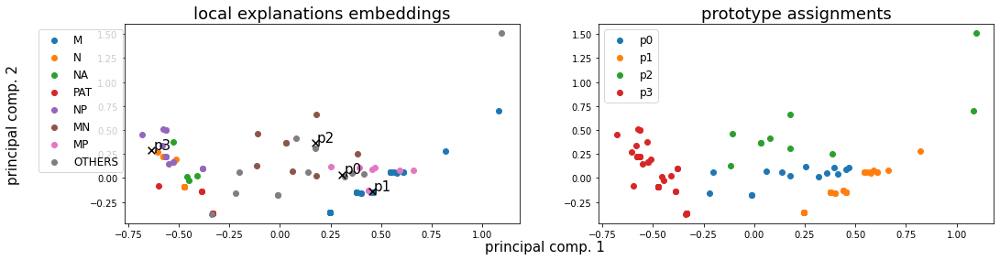

Alpha norms:
tensor([[0.3381, 1.0000, 0.1865, 0.8279],
        [0.2570, 1.0000, 0.0765, 0.3331]], grad_fn=<DivBackward0>)
Concept Purity: 0.613807 +- 0.183141
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([14, 39, 10, 44], dtype=int64))
Logic formulas:
For class 0:
0.9158878504672897 (feature003)
For class 1:
0.9158878504672897 (feature001) | (feature000) | ((feature002)
Accuracy as classifier:  0.9159
LEN fidelity:  tensor(0.9159)



In [14]:
print("Fidelity:")
for i , m in enumerate(expls):
    print("\t", [e["acc_overall"] for e in m.val_metrics][m.early_stopping.best_epoch-1].item(), " @ ", m.early_stopping.best_epoch)
    
for i , m in enumerate(expls):
    m.inspect_embedding(test_group_loader)

In [15]:
fidelities = [0.8879, 0.8972, 0.8972, 0.8879, 0.9159]
print("Fidelity: ", np.mean(fidelities), np.std(fidelities))

formula = [0.8879, 0.8972, 0.8972, 0.8879, 0.9159]
print("Formula Fidelity: ", np.mean(formula), np.std(formula))

Fidelity:  0.8972199999999999 0.010224167447768068
Formula Fidelity:  0.8972199999999999 0.010224167447768068


## Num prototypes

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


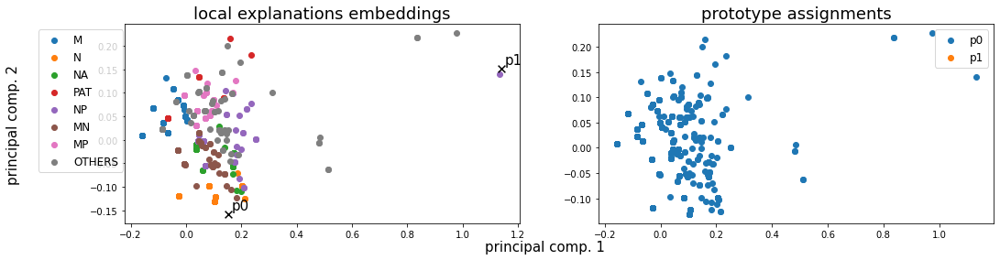

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.375176 +- 0.000000
Concept distribution:  (array([0], dtype=int64), array([709], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.31230, LEN: 0.087184, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24720, V. LEN 0.09
  2: Loss: 0.24441, LEN: 0.087041, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20144, V. LEN 0.09
  3: Loss: 0.20464, LEN: 0.086881, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18150, V. LEN 0.09
  4: Loss: 0.18015, LEN: 0.086723, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16837, V. LEN 0.09
  5: Loss: 0.15539, LEN: 0.086593, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15150, V. LEN 0.09
  6: Loss: 0.13662, LEN: 0.086506, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12584, V. LEN 0.09
  7: Loss: 0.11456, LEN: 0.086338, AccxC: 0.58, AccO: 0.00, V

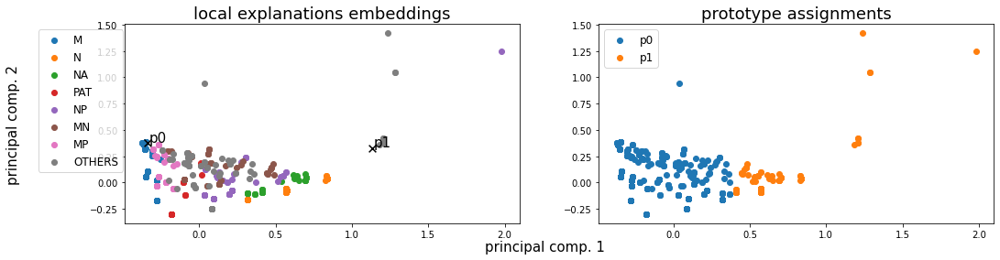

Alpha norms:
tensor([[0.8981, 1.0000],
        [0.6759, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.435762 +- 0.007420
Concept distribution:  (array([0, 1], dtype=int64), array([621,  88], dtype=int64))
Logic formulas:
For class 0:
0.6755994358251057 (feature001)
For class 1:
0.6755994358251057 ((feature000)
Accuracy as classifier:  0.6756
LEN fidelity:  tensor(0.6756)


 20: Loss: 0.08678, LEN: 0.084172, AccxC: 0.68, AccO: 0.68, V. Acc: 0.65, V. Loss: 0.09447, V. LEN 0.08
 21: Loss: 0.08925, LEN: 0.084050, AccxC: 0.68, AccO: 0.68, V. Acc: 0.65, V. Loss: 0.09222, V. LEN 0.08
 22: Loss: 0.08704, LEN: 0.083671, AccxC: 0.68, AccO: 0.68, V. Acc: 0.65, V. Loss: 0.09221, V. LEN 0.08
 23: Loss: 0.08684, LEN: 0.083663, AccxC: 0.68, AccO: 0.68, V. Acc: 0.65, V. Loss: 0.09180, V. LEN 0.08
 24: Loss: 0.08627, LEN: 0.083314, AccxC: 0.68, AccO: 0.68, V. Acc: 0.70, V. Loss: 0.09048, V. LEN 0.08
 25: Loss: 0.08571, LEN: 0.081545, AccxC: 0.76, AccO: 0.76, V. Acc: 0.70, V. Loss: 0.08861, V. LEN

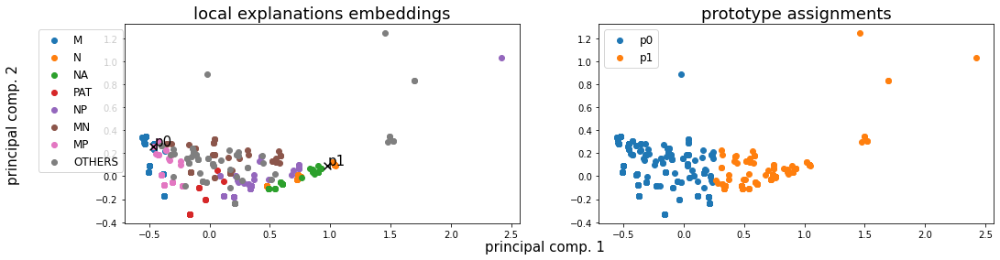

Alpha norms:
tensor([[0.5231, 1.0000],
        [0.6684, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.557573 +- 0.015821
Concept distribution:  (array([0, 1], dtype=int64), array([491, 218], dtype=int64))
Logic formulas:
For class 0:
0.7856135401974612 (feature001)
For class 1:
0.7856135401974612 ((feature000)
Accuracy as classifier:  0.7856
LEN fidelity:  tensor(0.7856)


 40: Loss: 0.07591, LEN: 0.075302, AccxC: 0.79, AccO: 0.79, V. Acc: 0.74, V. Loss: 0.08052, V. LEN 0.08
 41: Loss: 0.07455, LEN: 0.073950, AccxC: 0.81, AccO: 0.81, V. Acc: 0.77, V. Loss: 0.07841, V. LEN 0.08
 42: Loss: 0.07389, LEN: 0.073273, AccxC: 0.81, AccO: 0.81, V. Acc: 0.77, V. Loss: 0.07833, V. LEN 0.08
 43: Loss: 0.07232, LEN: 0.071955, AccxC: 0.81, AccO: 0.81, V. Acc: 0.77, V. Loss: 0.07829, V. LEN 0.08
 44: Loss: 0.07259, LEN: 0.071868, AccxC: 0.81, AccO: 0.81, V. Acc: 0.77, V. Loss: 0.07784, V. LEN 0.07
 45: Loss: 0.07127, LEN: 0.070525, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.07293, V. LEN

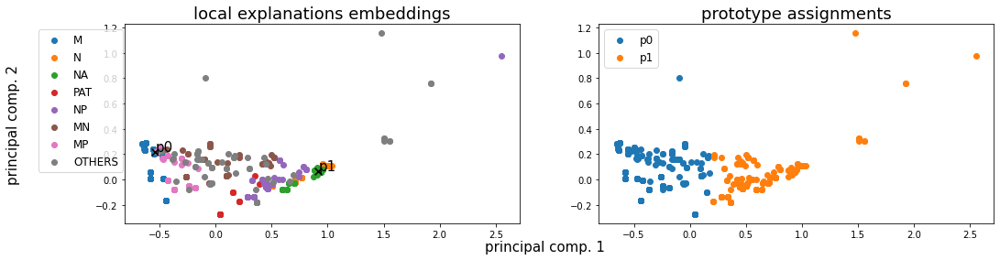

Alpha norms:
tensor([[0.3936, 1.0000],
        [0.5390, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.533405 +- 0.083765
Concept distribution:  (array([0, 1], dtype=int64), array([431, 278], dtype=int64))
Logic formulas:
For class 0:
0.8504936530324401 (feature001)
For class 1:
0.8504936530324401 ((feature000)
Accuracy as classifier:  0.8505
LEN fidelity:  tensor(0.8505)


 60: Loss: 0.06189, LEN: 0.061335, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.06049, V. LEN 0.06
 61: Loss: 0.06027, LEN: 0.059839, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.05994, V. LEN 0.06
 62: Loss: 0.05943, LEN: 0.058810, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.05964, V. LEN 0.06
 63: Loss: 0.06093, LEN: 0.060470, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.05925, V. LEN 0.06
 64: Loss: 0.05944, LEN: 0.058920, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.05893, V. LEN 0.06
 65: Loss: 0.05898, LEN: 0.058607, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.05855, V. LEN

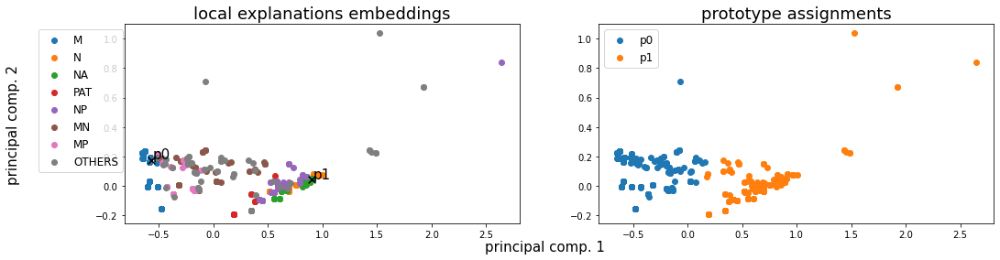

Alpha norms:
tensor([[0.4661, 1.0000],
        [0.5688, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536950 +- 0.145101
Concept distribution:  (array([0, 1], dtype=int64), array([390, 319], dtype=int64))
Logic formulas:
For class 0:
0.8857545839210155 (feature001)
For class 1:
0.8857545839210155 ((feature000)
Accuracy as classifier:  0.8858
LEN fidelity:  tensor(0.8858)


 80: Loss: 0.04893, LEN: 0.048694, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04767, V. LEN 0.05
 81: Loss: 0.04820, LEN: 0.047900, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04726, V. LEN 0.05
 82: Loss: 0.04818, LEN: 0.047921, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04712, V. LEN 0.05
 83: Loss: 0.04758, LEN: 0.047346, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04698, V. LEN 0.05
 84: Loss: 0.04729, LEN: 0.046854, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04658, V. LEN 0.05
 85: Loss: 0.04807, LEN: 0.047407, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04619, V. LEN

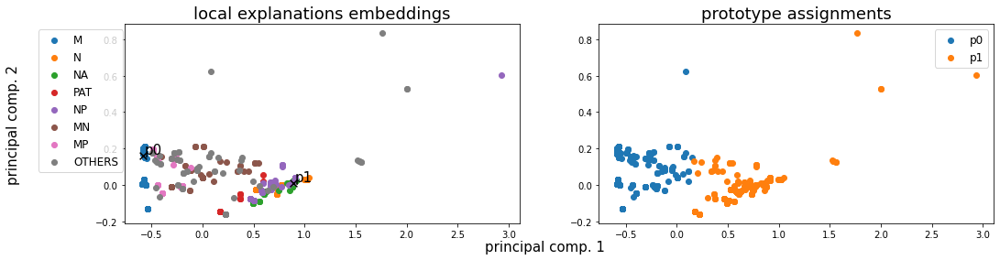

Alpha norms:
tensor([[0.5288, 1.0000],
        [0.7461, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536950 +- 0.145101
Concept distribution:  (array([0, 1], dtype=int64), array([390, 319], dtype=int64))
Logic formulas:
For class 0:
0.8885754583921015 (feature001)
For class 1:
0.8885754583921015 ((feature000)
Accuracy as classifier:  0.8886
LEN fidelity:  tensor(0.8886)


100: Loss: 0.04689, LEN: 0.046636, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04486, V. LEN 0.04
101: Loss: 0.04524, LEN: 0.044948, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04484, V. LEN 0.04
102: Loss: 0.04546, LEN: 0.045251, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04479, V. LEN 0.04
103: Loss: 0.04587, LEN: 0.045655, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04478, V. LEN 0.04
104: Loss: 0.04916, LEN: 0.048935, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04471, V. LEN 0.04
105: Loss: 0.04567, LEN: 0.045404, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04474, V. LEN

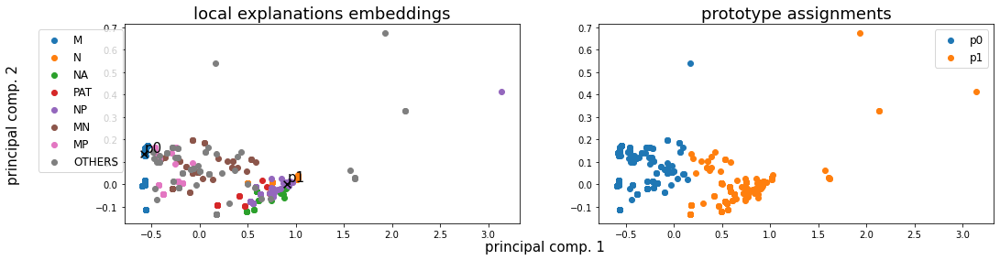

Alpha norms:
tensor([[0.5516, 1.0000],
        [0.8045, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537215 +- 0.146590
Concept distribution:  (array([0, 1], dtype=int64), array([389, 320], dtype=int64))
Logic formulas:
For class 0:
0.8871650211565585 (feature001)
For class 1:
0.8871650211565585 ((feature000)
Accuracy as classifier:  0.8872
LEN fidelity:  tensor(0.8872)


120: Loss: 0.04953, LEN: 0.049231, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04450, V. LEN 0.04
121: Loss: 0.04587, LEN: 0.045578, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04465, V. LEN 0.04
122: Loss: 0.04732, LEN: 0.047026, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04471, V. LEN 0.04
123: Loss: 0.04548, LEN: 0.045087, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04448, V. LEN 0.04
124: Loss: 0.04598, LEN: 0.045647, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04452, V. LEN 0.04
125: Loss: 0.04571, LEN: 0.045432, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.05517, V. LEN

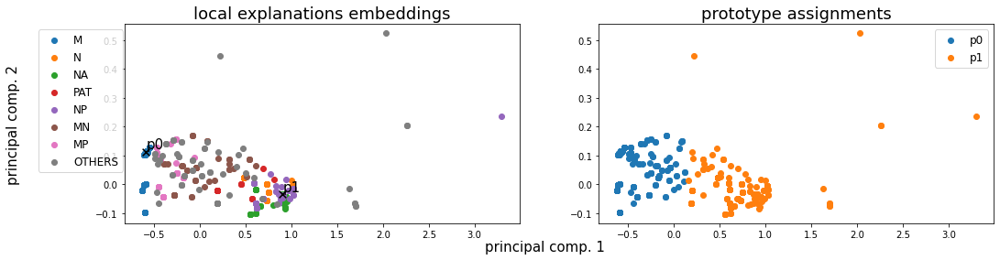

Alpha norms:
tensor([[0.5493, 1.0000],
        [0.8009, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537769 +- 0.149570
Concept distribution:  (array([0, 1], dtype=int64), array([387, 322], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature001)
For class 1:
0.8899858956276445 ((feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


140: Loss: 0.04632, LEN: 0.046089, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04481, V. LEN 0.04
141: Loss: 0.04663, LEN: 0.046446, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04468, V. LEN 0.04
142: Loss: 0.04782, LEN: 0.047543, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04471, V. LEN 0.04
143: Loss: 0.04433, LEN: 0.044076, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04493, V. LEN 0.04
144: Loss: 0.04402, LEN: 0.043803, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04470, V. LEN 0.04
145: Loss: 0.04862, LEN: 0.048293, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04499, V. LEN 0

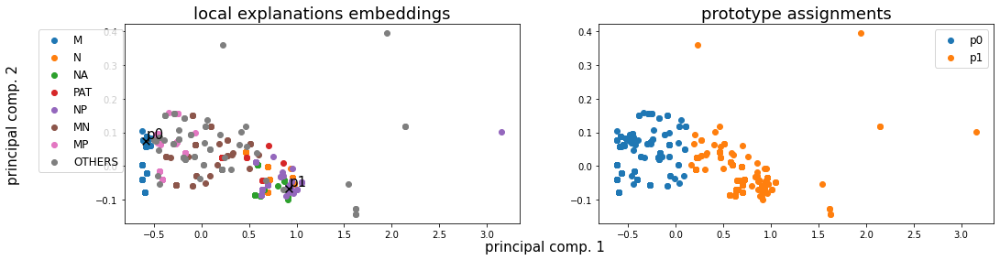

Alpha norms:
tensor([[0.5518, 1.0000],
        [0.8045, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537769 +- 0.149570
Concept distribution:  (array([0, 1], dtype=int64), array([387, 322], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature001)
For class 1:
0.8899858956276445 ((feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


160: Loss: 0.04473, LEN: 0.044531, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04472, V. LEN 0.04
161: Loss: 0.04574, LEN: 0.045481, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04465, V. LEN 0.04
162: Loss: 0.04573, LEN: 0.045479, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04465, V. LEN 0.04
163: Loss: 0.04562, LEN: 0.045355, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04464, V. LEN 0.04
164: Loss: 0.04612, LEN: 0.045893, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.05513, V. LEN 0.05
165: Loss: 0.04516, LEN: 0.044943, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04487, V. LEN 0

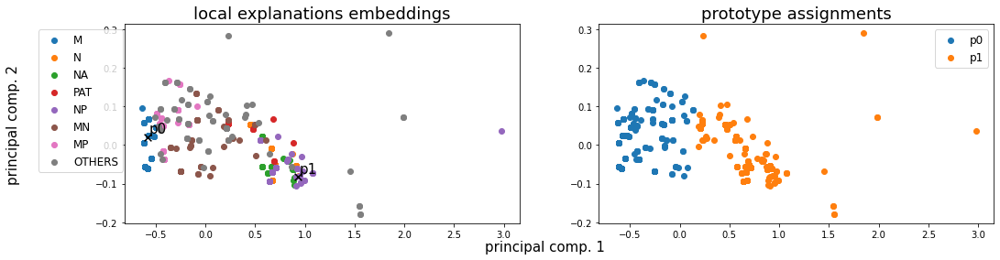

Alpha norms:
tensor([[0.5503, 1.0000],
        [0.8058, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537769 +- 0.149570
Concept distribution:  (array([0, 1], dtype=int64), array([387, 322], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature001)
For class 1:
0.8899858956276445 ((feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


180: Loss: 0.04558, LEN: 0.045349, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04457, V. LEN 0.04
181: Loss: 0.04650, LEN: 0.046295, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04465, V. LEN 0.04
182: Loss: 0.04549, LEN: 0.044845, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04463, V. LEN 0.04
183: Loss: 0.04492, LEN: 0.044631, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04021, V. LEN 0.04
184: Loss: 0.05568, LEN: 0.055387, AccxC: 0.85, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.04475, V. LEN 0.04
185: Loss: 0.04448, LEN: 0.044206, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04489, V. LEN 0

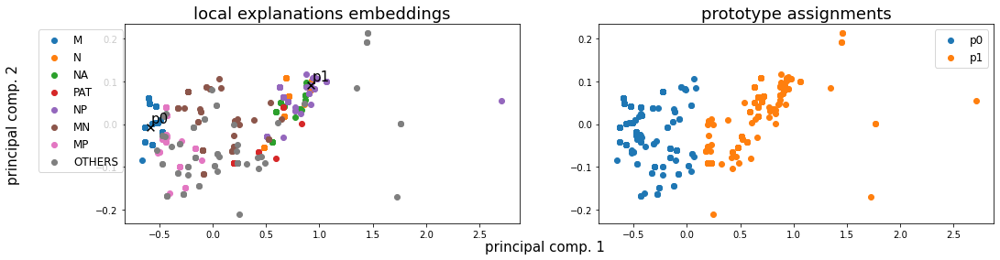

Alpha norms:
tensor([[0.5521, 1.0000],
        [0.8068, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.538662 +- 0.154046
Concept distribution:  (array([0, 1], dtype=int64), array([384, 325], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature001)
For class 1:
0.8913963328631875 ((feature000)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


200: Loss: 0.04523, LEN: 0.044973, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03998, V. LEN 0.04
201: Loss: 0.04659, LEN: 0.046293, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04003, V. LEN 0.04
202: Loss: 0.04499, LEN: 0.044764, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03999, V. LEN 0.04
203: Loss: 0.04837, LEN: 0.048102, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03995, V. LEN 0.04
204: Loss: 0.04479, LEN: 0.044519, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04055, V. LEN 0.04
205: Loss: 0.04495, LEN: 0.044683, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04004, V. LEN

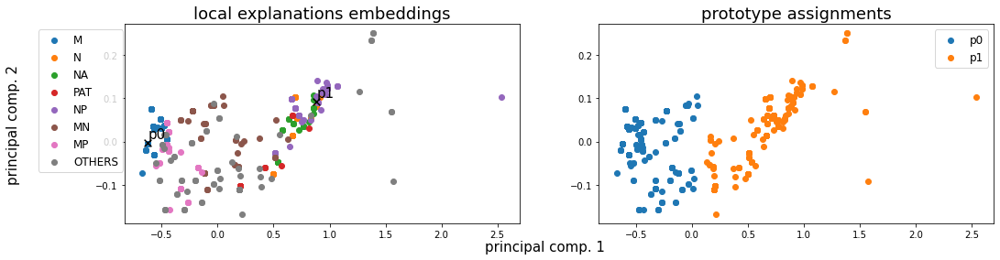

Alpha norms:
tensor([[0.5641, 1.0000],
        [0.8360, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.538662 +- 0.154046
Concept distribution:  (array([0, 1], dtype=int64), array([384, 325], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature001)
For class 1:
0.8913963328631875 ((feature000)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


220: Loss: 0.04378, LEN: 0.043623, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03993, V. LEN 0.04
221: Loss: 0.04507, LEN: 0.044889, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03976, V. LEN 0.04
222: Loss: 0.04459, LEN: 0.044278, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04012, V. LEN 0.04
223: Loss: 0.04452, LEN: 0.044248, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03964, V. LEN 0.04
224: Loss: 0.04502, LEN: 0.044760, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03976, V. LEN 0.04
225: Loss: 0.04941, LEN: 0.049113, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04006, V. LEN

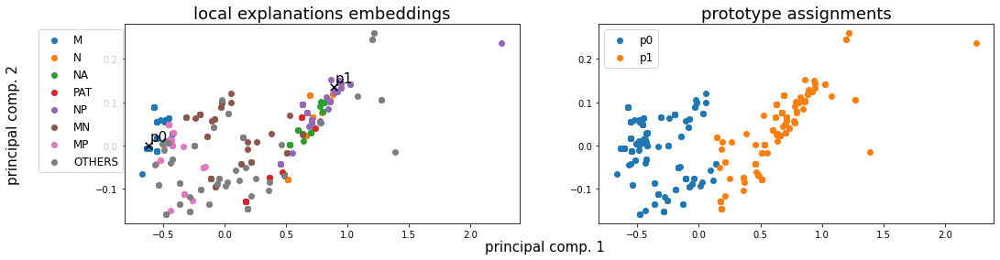

Alpha norms:
tensor([[0.5598, 1.0000],
        [0.8301, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537488 +- 0.148079
Concept distribution:  (array([0, 1], dtype=int64), array([388, 321], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature001)
For class 1:
0.8942172073342737 ((feature000)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


240: Loss: 0.04535, LEN: 0.045142, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03969, V. LEN 0.04
241: Loss: 0.04446, LEN: 0.044203, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03979, V. LEN 0.04
242: Loss: 0.04593, LEN: 0.045738, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03971, V. LEN 0.04
243: Loss: 0.04599, LEN: 0.045602, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03974, V. LEN 0.04
244: Loss: 0.04229, LEN: 0.042079, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03969, V. LEN 0.04
245: Loss: 0.04362, LEN: 0.043424, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03967, V. LEN

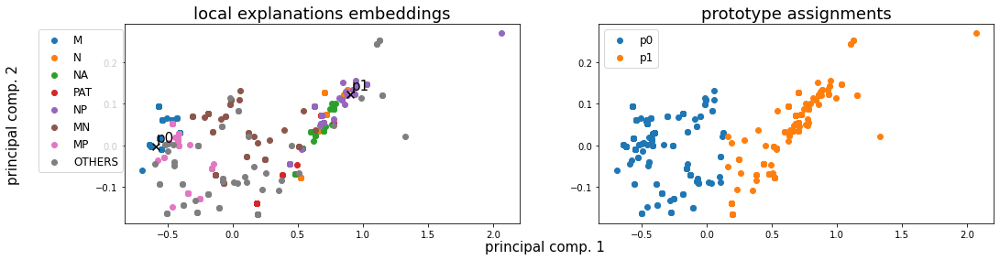

Alpha norms:
tensor([[0.5544, 1.0000],
        [0.8192, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536694 +- 0.143613
Concept distribution:  (array([0, 1], dtype=int64), array([391, 318], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature001)
For class 1:
0.8984485190409027 ((feature000)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


260: Loss: 0.04315, LEN: 0.042929, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03980, V. LEN 0.04
261: Loss: 0.04255, LEN: 0.042265, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03992, V. LEN 0.04
262: Loss: 0.04506, LEN: 0.044864, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03984, V. LEN 0.04
263: Loss: 0.04564, LEN: 0.045461, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03994, V. LEN 0.04
264: Loss: 0.04277, LEN: 0.042567, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03980, V. LEN 0.04
265: Loss: 0.04474, LEN: 0.044533, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03975, V. LEN

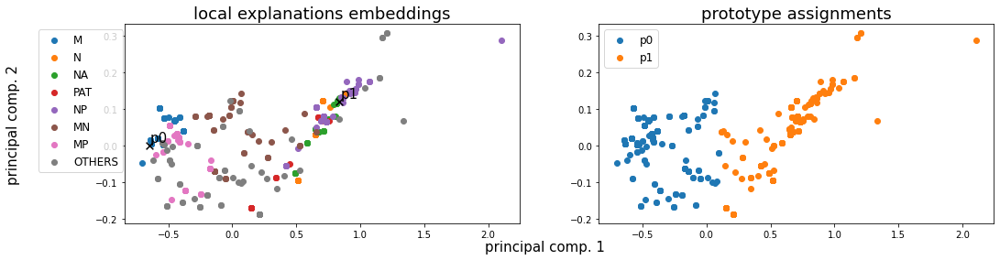

Alpha norms:
tensor([[0.5452, 1.0000],
        [0.8006, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.537488 +- 0.148079
Concept distribution:  (array([0, 1], dtype=int64), array([388, 321], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature001)
For class 1:
0.8942172073342737 ((feature000)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


280: Loss: 0.04390, LEN: 0.043599, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04022, V. LEN 0.04
281: Loss: 0.04270, LEN: 0.042512, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
282: Loss: 0.04566, LEN: 0.045447, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04023, V. LEN 0.04
283: Loss: 0.04440, LEN: 0.044228, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03982, V. LEN 0.04
284: Loss: 0.04753, LEN: 0.047233, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04015, V. LEN 0.04
285: Loss: 0.04610, LEN: 0.045844, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03997, V. LEN

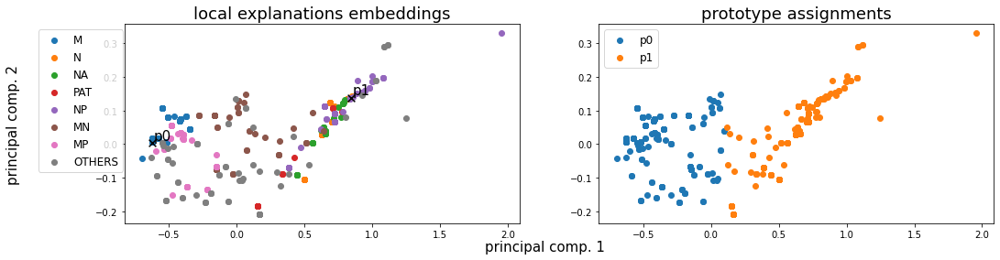

Alpha norms:
tensor([[0.5378, 1.0000],
        [0.7950, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536950 +- 0.145101
Concept distribution:  (array([0, 1], dtype=int64), array([390, 319], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature001)
For class 1:
0.8970380818053597 ((feature000)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


300: Loss: 0.04251, LEN: 0.042304, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03987, V. LEN 0.04
301: Loss: 0.04379, LEN: 0.043545, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03999, V. LEN 0.04
302: Loss: 0.04387, LEN: 0.043540, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03995, V. LEN 0.04
303: Loss: 0.04668, LEN: 0.046418, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03992, V. LEN 0.04
304: Loss: 0.05282, LEN: 0.052576, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03658, V. LEN 0.04
305: Loss: 0.04439, LEN: 0.044135, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03984, V. LEN 

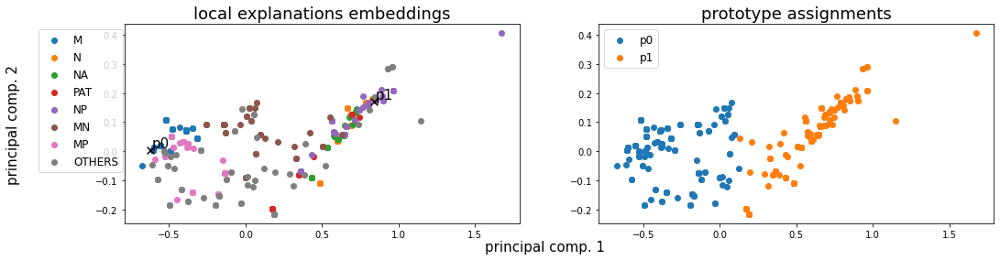

Alpha norms:
tensor([[0.5345, 1.0000],
        [0.7862, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536447 +- 0.142125
Concept distribution:  (array([0, 1], dtype=int64), array([392, 317], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature001)
For class 1:
0.8998589562764457 ((feature000)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


320: Loss: 0.04438, LEN: 0.044157, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03969, V. LEN 0.04
321: Loss: 0.04470, LEN: 0.044460, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03640, V. LEN 0.04
322: Loss: 0.04272, LEN: 0.042519, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03646, V. LEN 0.04
323: Loss: 0.04494, LEN: 0.044785, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03649, V. LEN 0.04
324: Loss: 0.05006, LEN: 0.049862, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04000, V. LEN 0.04
325: Loss: 0.04427, LEN: 0.044059, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03651, V. LEN

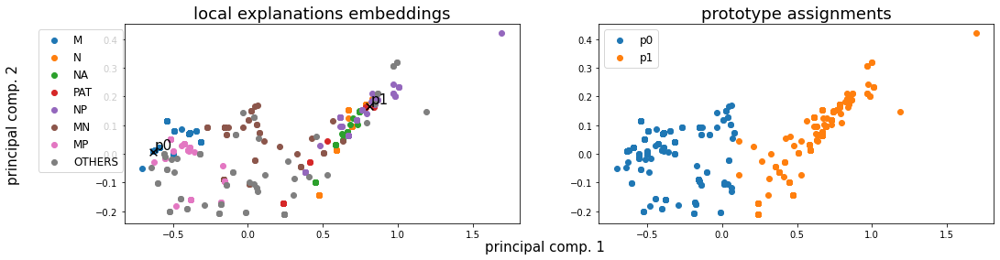

Alpha norms:
tensor([[0.5293, 1.0000],
        [0.7774, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536694 +- 0.143613
Concept distribution:  (array([0, 1], dtype=int64), array([391, 318], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature001)
For class 1:
0.8984485190409027 ((feature000)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


340: Loss: 0.04445, LEN: 0.044243, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03978, V. LEN 0.04
341: Loss: 0.04324, LEN: 0.043033, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03977, V. LEN 0.04
342: Loss: 0.04785, LEN: 0.047618, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03653, V. LEN 0.04
343: Loss: 0.04561, LEN: 0.045316, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03998, V. LEN 0.04
344: Loss: 0.04354, LEN: 0.043321, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03982, V. LEN 0.04
345: Loss: 0.04450, LEN: 0.044305, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03662, V. LEN

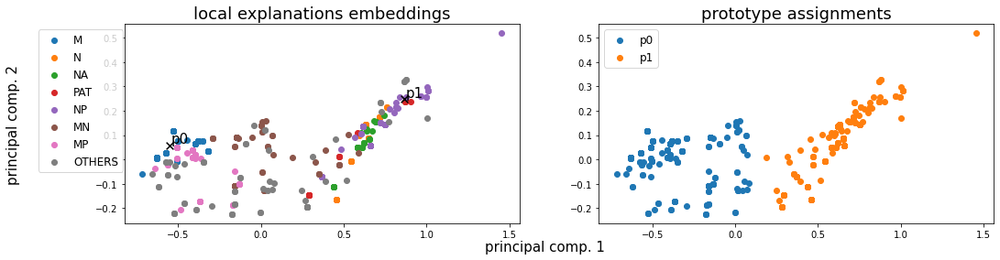

Alpha norms:
tensor([[0.5359, 1.0000],
        [0.7896, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536207 +- 0.140638
Concept distribution:  (array([0, 1], dtype=int64), array([393, 316], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature001)
For class 1:
0.9012693935119888 ((feature000)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


360: Loss: 0.04279, LEN: 0.042434, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03659, V. LEN 0.04
361: Loss: 0.04301, LEN: 0.042558, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03310, V. LEN 0.03
362: Loss: 0.04270, LEN: 0.042331, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03303, V. LEN 0.03
363: Loss: 0.04312, LEN: 0.042777, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03993, V. LEN 0.04
364: Loss: 0.04631, LEN: 0.046075, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04885, V. LEN 0.05
365: Loss: 0.04343, LEN: 0.043154, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03976, V. LEN

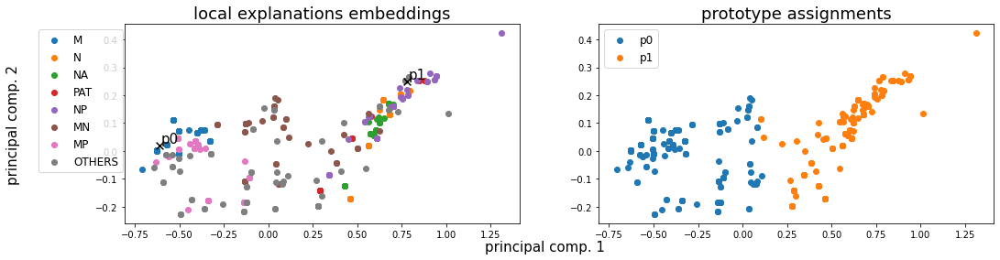

Alpha norms:
tensor([[0.5379, 1.0000],
        [0.7902, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536950 +- 0.145101
Concept distribution:  (array([0, 1], dtype=int64), array([390, 319], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001)
For class 1:
0.9026798307475318 ((feature000)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


380: Loss: 0.04308, LEN: 0.042678, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04010, V. LEN 0.04
381: Loss: 0.04318, LEN: 0.042807, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03408, V. LEN 0.03
382: Loss: 0.04321, LEN: 0.042828, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03985, V. LEN 0.04
383: Loss: 0.04212, LEN: 0.041877, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03975, V. LEN 0.04
384: Loss: 0.04119, LEN: 0.040716, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03318, V. LEN 0.03
385: Loss: 0.04254, LEN: 0.042142, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03984, V. LEN

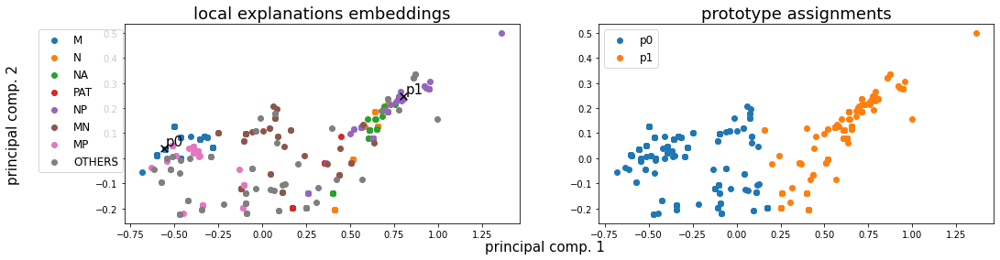

Alpha norms:
tensor([[0.5474, 1.0000],
        [0.8190, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.533317 +- 0.085288
Concept distribution:  (array([0, 1], dtype=int64), array([430, 279], dtype=int64))
Logic formulas:
For class 0:
0.8716502115655853 (feature001)
For class 1:
0.8716502115655853 ((feature000)
Accuracy as classifier:  0.8717
LEN fidelity:  tensor(0.8717)


400: Loss: 0.04351, LEN: 0.043211, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04558, V. LEN 0.05
401: Loss: 0.04587, LEN: 0.045631, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03949, V. LEN 0.04
402: Loss: 0.04209, LEN: 0.041887, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03949, V. LEN 0.04
403: Loss: 0.04230, LEN: 0.042095, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03947, V. LEN 0.04
404: Loss: 0.04639, LEN: 0.046161, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03953, V. LEN 0.04
405: Loss: 0.04271, LEN: 0.042498, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03613, V. LEN

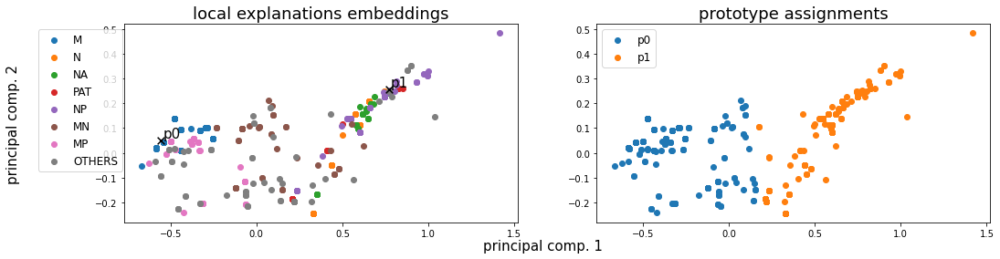

Alpha norms:
tensor([[0.5463, 1.0000],
        [0.8115, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536694 +- 0.143613
Concept distribution:  (array([0, 1], dtype=int64), array([391, 318], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001)
For class 1:
0.9040902679830748 ((feature000)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


420: Loss: 0.04383, LEN: 0.043535, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03619, V. LEN 0.04
421: Loss: 0.04120, LEN: 0.040965, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03621, V. LEN 0.04
422: Loss: 0.04398, LEN: 0.043779, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03613, V. LEN 0.04
423: Loss: 0.04644, LEN: 0.046205, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03954, V. LEN 0.04
424: Loss: 0.04227, LEN: 0.042011, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04566, V. LEN 0.05
425: Loss: 0.04674, LEN: 0.046372, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03964, V. LEN

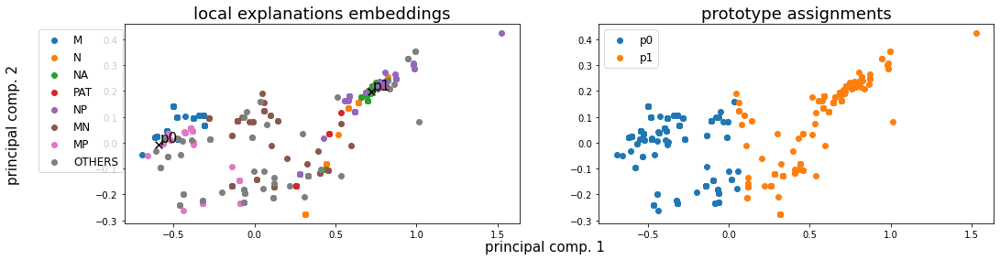

Alpha norms:
tensor([[0.5528, 1.0000],
        [0.8216, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.541792 +- 0.167541
Concept distribution:  (array([0, 1], dtype=int64), array([375, 334], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature001)
For class 1:
0.8984485190409027 ((feature000)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


440: Loss: 0.04330, LEN: 0.042965, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03971, V. LEN 0.04
441: Loss: 0.04123, LEN: 0.040970, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03302, V. LEN 0.03
442: Loss: 0.04329, LEN: 0.042995, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03302, V. LEN 0.03
443: Loss: 0.04105, LEN: 0.040652, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03294, V. LEN 0.03
444: Loss: 0.04040, LEN: 0.040150, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03615, V. LEN 0.04
445: Loss: 0.04656, LEN: 0.046355, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03282, V. LEN

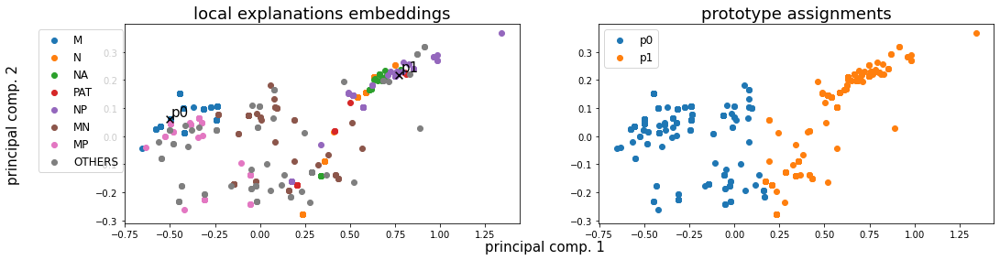

Alpha norms:
tensor([[0.5534, 1.0000],
        [0.8307, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.536694 +- 0.143613
Concept distribution:  (array([0, 1], dtype=int64), array([391, 318], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001)
For class 1:
0.9040902679830748 ((feature000)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


460: Loss: 0.04386, LEN: 0.043620, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03264, V. LEN 0.03
461: Loss: 0.04106, LEN: 0.040805, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03759, V. LEN 0.04
462: Loss: 0.04438, LEN: 0.044105, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03625, V. LEN 0.04
463: Loss: 0.04226, LEN: 0.042024, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03617, V. LEN 0.04
464: Loss: 0.04174, LEN: 0.041437, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03601, V. LEN 0.04
465: Loss: 0.04109, LEN: 0.040804, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03597, V. LEN

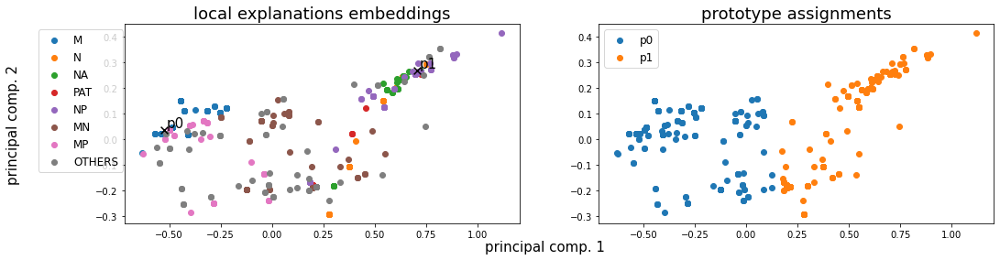

Alpha norms:
tensor([[0.5406, 1.0000],
        [0.8000, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.538058 +- 0.151061
Concept distribution:  (array([0, 1], dtype=int64), array([386, 323], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature001)
For class 1:
0.9055007052186178 ((feature000)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


480: Loss: 0.04063, LEN: 0.040384, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.03284, V. LEN 0.03
481: Loss: 0.04275, LEN: 0.042507, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.05030, V. LEN 0.05
482: Loss: 0.04502, LEN: 0.044764, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03612, V. LEN 0.04
483: Loss: 0.04110, LEN: 0.040874, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03770, V. LEN 0.04
484: Loss: 0.04175, LEN: 0.041464, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03774, V. LEN 0.04
485: Loss: 0.04252, LEN: 0.042288, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03263, V. LEN

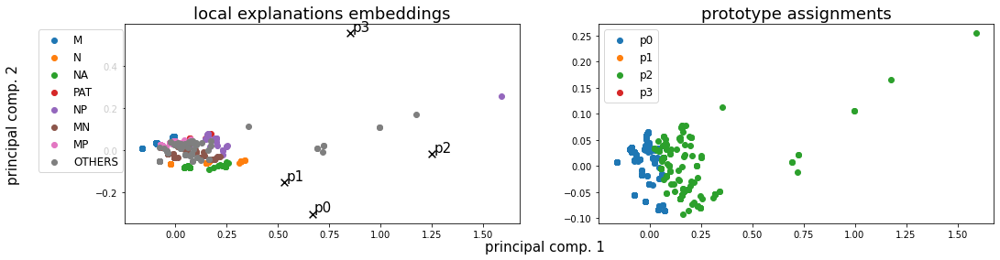

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.394417 +- 0.104645
Concept distribution:  (array([0, 2], dtype=int64), array([533, 176], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.22246, LEN: 0.096762, AccxC: 0.30, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20840, V. LEN 0.10
  2: Loss: 0.21514, LEN: 0.096291, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20983, V. LEN 0.10
  3: Loss: 0.20560, LEN: 0.095711, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20737, V. LEN 0.10
  4: Loss: 0.20101, LEN: 0.095294, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19748, V. LEN 0.10
  5: Loss: 0.19050, LEN: 0.094765, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18406, V. LEN 0.09
  6: Loss: 0.17491, LEN: 0.094331, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16578, V. LEN 0.09
  7: Loss: 0.15923, L

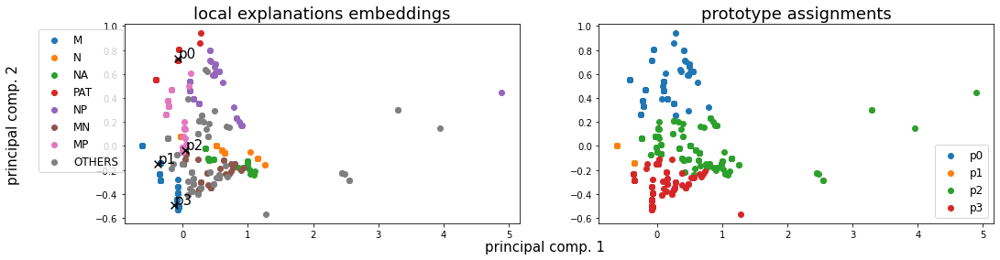

Alpha norms:
tensor([[0.9916, 0.7638, 0.8793, 1.0000],
        [0.8366, 0.8439, 1.0000, 0.9342]], grad_fn=<DivBackward0>)
Concept Purity: 0.653314 +- 0.224048
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([132, 125, 249, 203], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.10346, LEN: 0.089073, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10227, V. LEN 0.09
 21: Loss: 0.10172, LEN: 0.088688, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09967, V. LEN 0.09
 22: Loss: 0.09912, LEN: 0.088282, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09705, V. LEN 0.09
 23: Loss: 0.09660, LEN: 0.087979, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09462, V. LEN 0.09
 24: Loss: 0.09448, LEN: 0.087476, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09264, V. LEN 0.09
 25: Loss: 0.09236, LEN: 0.087156, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09102, V. LEN 0.09
 26:

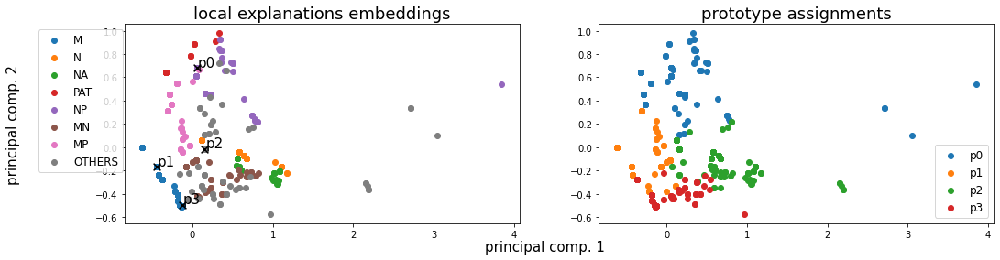

Alpha norms:
tensor([[0.7058, 0.8491, 0.7086, 1.0000],
        [0.6486, 1.0000, 0.7454, 0.8285]], grad_fn=<DivBackward0>)
Concept Purity: 0.629052 +- 0.138279
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([144, 205, 214, 146], dtype=int64))
Logic formulas:
For class 0:
0.5726375176304654 (feature002) | ((feature000) | (feature001)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.1805)


 40: Loss: 0.08139, LEN: 0.080578, AccxC: 0.84, AccO: 0.12, V. Acc: 0.20, V. Loss: 0.08067, V. LEN 0.08
 41: Loss: 0.08043, LEN: 0.080035, AccxC: 0.84, AccO: 0.53, V. Acc: 0.68, V. Loss: 0.08003, V. LEN 0.08
 42: Loss: 0.07993, LEN: 0.079526, AccxC: 0.84, AccO: 0.76, V. Acc: 0.88, V. Loss: 0.07942, V. LEN 0.08
 43: Loss: 0.07909, LEN: 0.078740, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.07875, V. LEN 0.08
 44: Loss: 0.07871, LEN: 0.078130, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.07816, V. LEN 0.08
 45: Loss: 0.07810, LEN: 0.077727, AccxC: 0.84, 

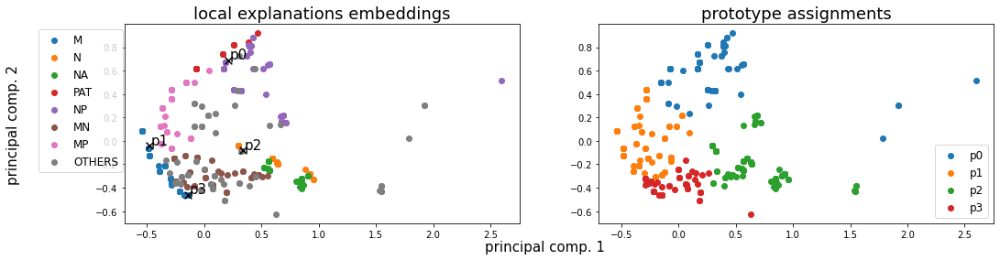

Alpha norms:
tensor([[0.3979, 1.0000, 0.6265, 0.8431],
        [0.3975, 1.0000, 0.5331, 0.5688]], grad_fn=<DivBackward0>)
Concept Purity: 0.595785 +- 0.099302
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([121, 283, 208,  97], dtype=int64))
Logic formulas:
For class 0:
0.8744710860366713 (feature002) | ((feature000)
For class 1:
0.8744710860366713 (feature001) | (feature003)
Accuracy as classifier:  0.8745
LEN fidelity:  tensor(0.8745)


 60: Loss: 0.06622, LEN: 0.065982, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06545, V. LEN 0.07
 61: Loss: 0.06539, LEN: 0.065077, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06474, V. LEN 0.06
 62: Loss: 0.06469, LEN: 0.064440, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06406, V. LEN 0.06
 63: Loss: 0.06466, LEN: 0.064397, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.06335, V. LEN 0.06
 64: Loss: 0.06310, LEN: 0.062907, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06271, V. LEN 0.06
 65: Loss: 0.06268, 

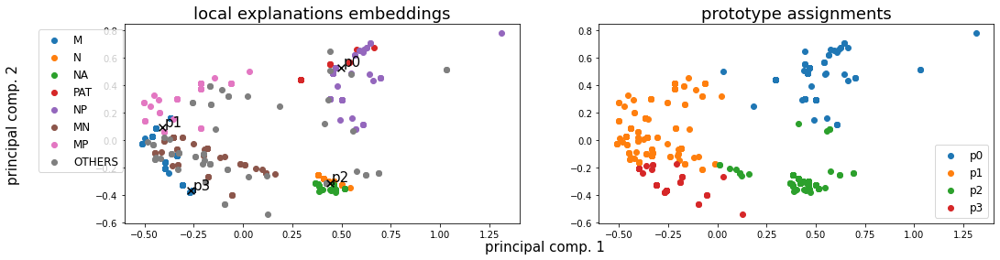

Alpha norms:
tensor([[0.3966, 1.0000, 0.6102, 0.5811],
        [0.2681, 1.0000, 0.4859, 0.4475]], grad_fn=<DivBackward0>)
Concept Purity: 0.631458 +- 0.065636
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 335, 198,  60], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | ((feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


 80: Loss: 0.05199, LEN: 0.051533, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05125, V. LEN 0.05
 81: Loss: 0.04997, LEN: 0.049744, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05063, V. LEN 0.05
 82: Loss: 0.05060, LEN: 0.050390, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04997, V. LEN 0.05
 83: Loss: 0.04937, LEN: 0.049216, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04939, V. LEN 0.05
 84: Loss: 0.04888, LEN: 0.048379, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04920, V. LEN 0.05
 85: Loss: 0.04926, 

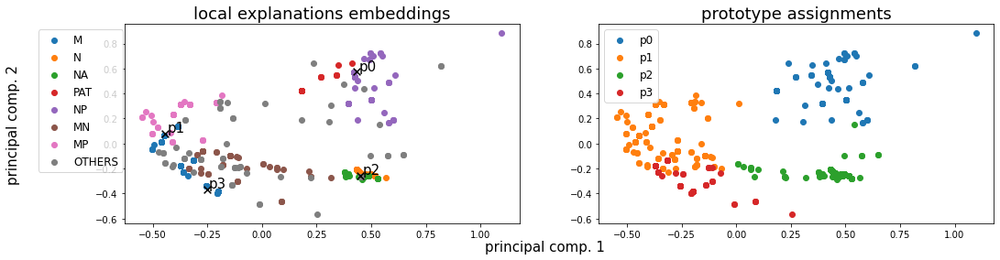

Alpha norms:
tensor([[0.5165, 1.0000, 0.7012, 0.4619],
        [0.1788, 1.0000, 0.3412, 0.2620]], grad_fn=<DivBackward0>)
Concept Purity: 0.650923 +- 0.115589
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 264, 200, 127], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | (feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


100: Loss: 0.04668, LEN: 0.046048, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04466, V. LEN 0.04
101: Loss: 0.04417, LEN: 0.043987, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04455, V. LEN 0.04
102: Loss: 0.04404, LEN: 0.043771, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04391, V. LEN 0.04
103: Loss: 0.04457, LEN: 0.043987, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04451, V. LEN 0.04
104: Loss: 0.04375, LEN: 0.043516, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04454, V. LEN 0.04
105: Loss: 0.04465, L

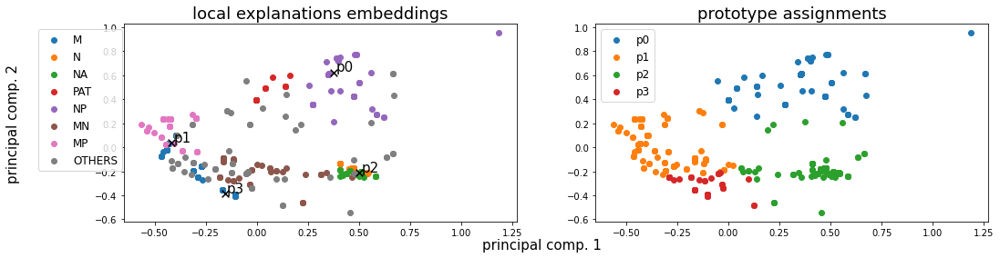

Alpha norms:
tensor([[0.5162, 1.0000, 0.6047, 0.4022],
        [0.1422, 1.0000, 0.2803, 0.1927]], grad_fn=<DivBackward0>)
Concept Purity: 0.624441 +- 0.062245
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 322, 208,  63], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature002) | (feature000)
For class 1:
0.8928067700987306 (feature001) | (feature003)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


120: Loss: 0.04396, LEN: 0.043737, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03988, V. LEN 0.04
121: Loss: 0.04406, LEN: 0.043885, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04429, V. LEN 0.04
122: Loss: 0.04424, LEN: 0.043950, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04041, V. LEN 0.04
123: Loss: 0.04260, LEN: 0.042386, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04359, V. LEN 0.04
124: Loss: 0.04633, LEN: 0.046015, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04032, V. LEN 0.04
125: Loss: 0.04306, L

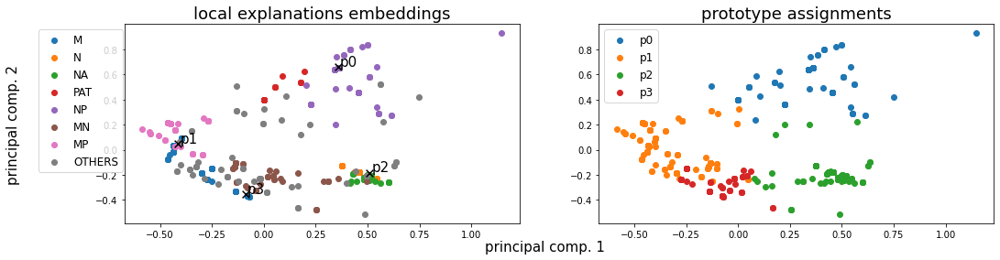

Alpha norms:
tensor([[0.5263, 1.0000, 0.5879, 0.3743],
        [0.1427, 1.0000, 0.2807, 0.1877]], grad_fn=<DivBackward0>)
Concept Purity: 0.639780 +- 0.080790
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([115, 267, 205, 122], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


140: Loss: 0.04467, LEN: 0.044352, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04055, V. LEN 0.04
141: Loss: 0.04403, LEN: 0.043676, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04360, V. LEN 0.04
142: Loss: 0.04192, LEN: 0.041658, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04062, V. LEN 0.04
143: Loss: 0.04745, LEN: 0.047082, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03983, V. LEN 0.04
144: Loss: 0.04209, LEN: 0.041877, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04045, V. LEN 0.04
145: Loss: 0.04336, L

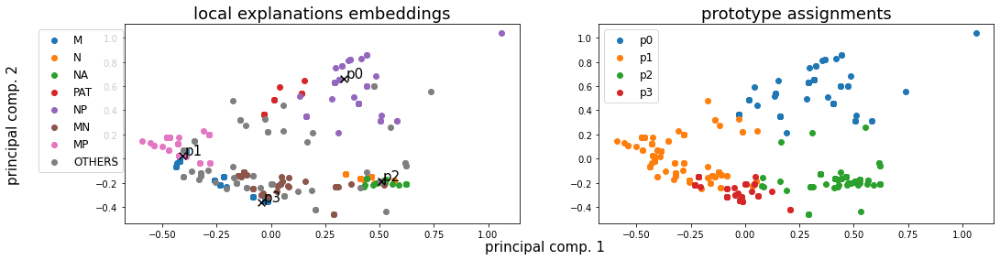

Alpha norms:
tensor([[0.5315, 1.0000, 0.5717, 0.3638],
        [0.1418, 1.0000, 0.2762, 0.1877]], grad_fn=<DivBackward0>)
Concept Purity: 0.643537 +- 0.086570
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([114, 272, 204, 119], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


160: Loss: 0.04215, LEN: 0.041960, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
161: Loss: 0.04193, LEN: 0.041741, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04023, V. LEN 0.04
162: Loss: 0.04543, LEN: 0.045279, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
163: Loss: 0.04213, LEN: 0.041957, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03971, V. LEN 0.04
164: Loss: 0.04221, LEN: 0.042036, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
165: Loss: 0.04413, L

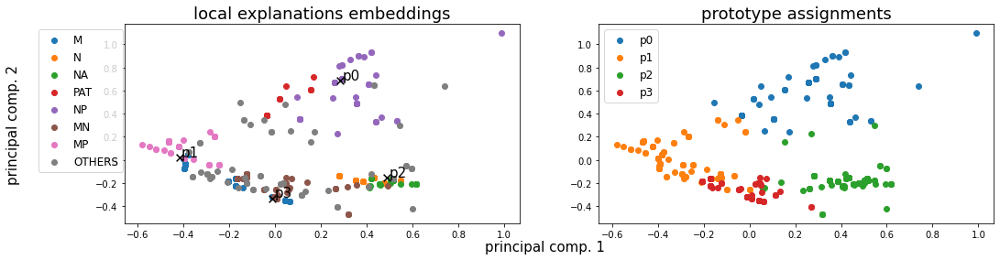

Alpha norms:
tensor([[0.5436, 1.0000, 0.5608, 0.3563],
        [0.1439, 1.0000, 0.2722, 0.1871]], grad_fn=<DivBackward0>)
Concept Purity: 0.637633 +- 0.082404
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 250, 203, 140], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature002) | (feature000)
For class 1:
0.8998589562764457 (feature001) | (feature003)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


180: Loss: 0.04722, LEN: 0.046981, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04049, V. LEN 0.04
181: Loss: 0.04389, LEN: 0.043632, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
182: Loss: 0.04202, LEN: 0.041836, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04018, V. LEN 0.04
183: Loss: 0.04212, LEN: 0.041963, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05496, V. LEN 0.05
184: Loss: 0.04465, LEN: 0.044406, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04023, V. LEN 0.04
185: Loss: 0.04301, L

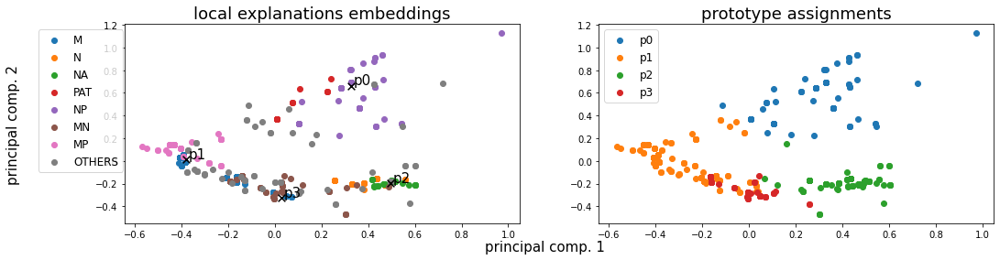

Alpha norms:
tensor([[0.5587, 1.0000, 0.5562, 0.3493],
        [0.1475, 1.0000, 0.2738, 0.1879]], grad_fn=<DivBackward0>)
Concept Purity: 0.651052 +- 0.105829
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 278, 200, 113], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


200: Loss: 0.04486, LEN: 0.044595, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04027, V. LEN 0.04
201: Loss: 0.04555, LEN: 0.045137, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
202: Loss: 0.04281, LEN: 0.042608, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
203: Loss: 0.04358, LEN: 0.043347, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04031, V. LEN 0.04
204: Loss: 0.04280, LEN: 0.042598, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04042, V. LEN 0.04
205: Loss: 0.04889, L

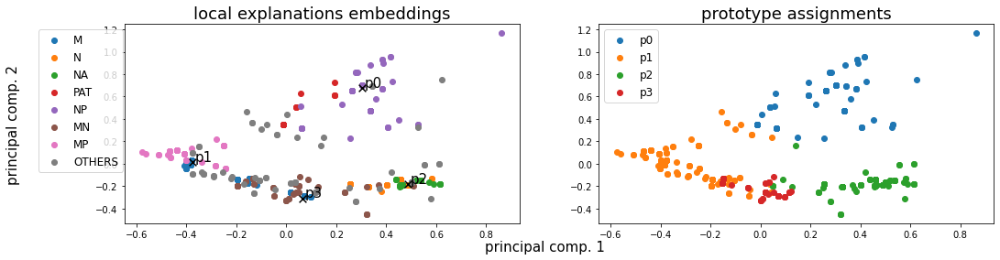

Alpha norms:
tensor([[0.5670, 1.0000, 0.5598, 0.3510],
        [0.1495, 1.0000, 0.2797, 0.1921]], grad_fn=<DivBackward0>)
Concept Purity: 0.651240 +- 0.104175
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 275, 205, 113], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature002) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature003)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


220: Loss: 0.04318, LEN: 0.042983, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04022, V. LEN 0.04
221: Loss: 0.04438, LEN: 0.044249, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
222: Loss: 0.04258, LEN: 0.042386, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04024, V. LEN 0.04
223: Loss: 0.04185, LEN: 0.041676, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03970, V. LEN 0.04
224: Loss: 0.04306, LEN: 0.042930, AccxC: 0.90, AccO: 0.90, V. Acc: 0.86, V. Loss: 0.06019, V. LEN 0.06
225: Loss: 0.04359, L

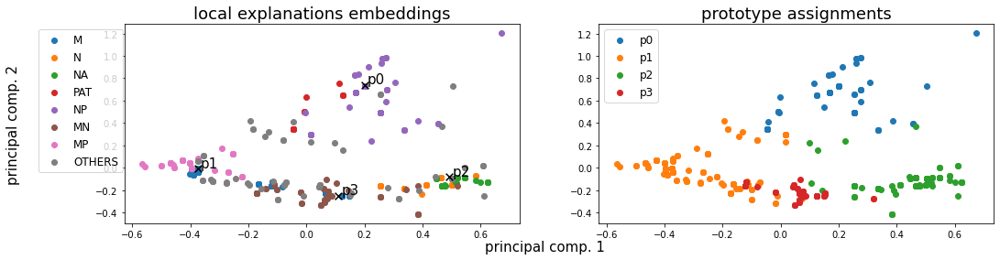

Alpha norms:
tensor([[0.5793, 1.0000, 0.5649, 0.3566],
        [0.1539, 1.0000, 0.2870, 0.1988]], grad_fn=<DivBackward0>)
Concept Purity: 0.632506 +- 0.087773
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([107, 278, 203, 121], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


240: Loss: 0.04064, LEN: 0.040510, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.04559, V. LEN 0.05
241: Loss: 0.04229, LEN: 0.042129, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04032, V. LEN 0.04
242: Loss: 0.04869, LEN: 0.048524, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04036, V. LEN 0.04
243: Loss: 0.04441, LEN: 0.044255, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04226, V. LEN 0.04
244: Loss: 0.04072, LEN: 0.040574, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04039, V. LEN 0.04
245: Loss: 0.04126, L

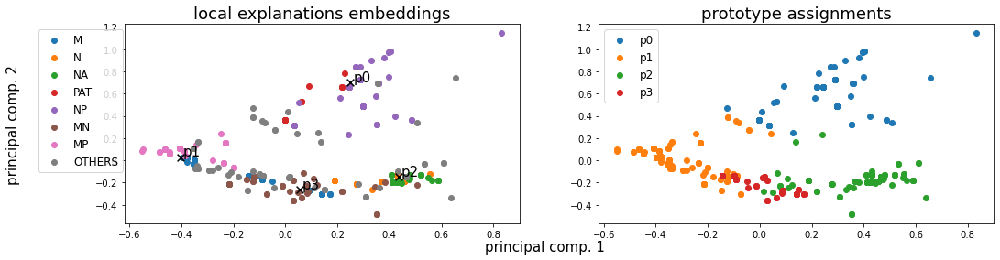

Alpha norms:
tensor([[0.5910, 1.0000, 0.5731, 0.3652],
        [0.1570, 1.0000, 0.2928, 0.2048]], grad_fn=<DivBackward0>)
Concept Purity: 0.647297 +- 0.113564
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([116, 255, 210, 128], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


260: Loss: 0.04465, LEN: 0.044440, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04057, V. LEN 0.04
261: Loss: 0.04168, LEN: 0.041455, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03625, V. LEN 0.04
262: Loss: 0.04330, LEN: 0.043069, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
263: Loss: 0.04324, LEN: 0.043059, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
264: Loss: 0.04046, LEN: 0.040309, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04222, V. LEN 0.04
265: Loss: 0.04778, L

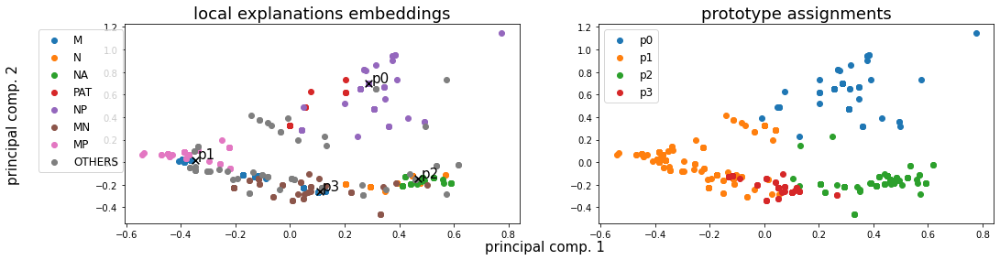

Alpha norms:
tensor([[0.6032, 1.0000, 0.5695, 0.3682],
        [0.1597, 1.0000, 0.2913, 0.2054]], grad_fn=<DivBackward0>)
Concept Purity: 0.687663 +- 0.110296
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 70, 320, 201, 118], dtype=int64))
Logic formulas:
For class 0:
0.8716502115655853 (feature002) | (feature000)
For class 1:
0.8716502115655853 (feature001) | (feature003)
Accuracy as classifier:  0.8717
LEN fidelity:  tensor(0.8717)


280: Loss: 0.04351, LEN: 0.043416, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05622, V. LEN 0.06
281: Loss: 0.04181, LEN: 0.041672, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04026, V. LEN 0.04
282: Loss: 0.04509, LEN: 0.044942, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03688, V. LEN 0.04
283: Loss: 0.04051, LEN: 0.040371, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04222, V. LEN 0.04
284: Loss: 0.04711, LEN: 0.046981, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04030, V. LEN 0.04
285: Loss: 0.04332, L

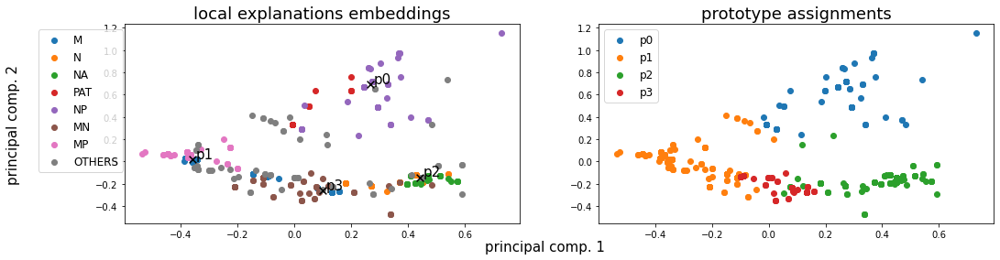

Alpha norms:
tensor([[0.6154, 1.0000, 0.5645, 0.3597],
        [0.1616, 1.0000, 0.2884, 0.2001]], grad_fn=<DivBackward0>)
Concept Purity: 0.645774 +- 0.096830
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([115, 271, 207, 116], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


300: Loss: 0.04041, LEN: 0.040263, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04036, V. LEN 0.04
301: Loss: 0.04477, LEN: 0.044636, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03666, V. LEN 0.04
302: Loss: 0.04434, LEN: 0.044164, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04035, V. LEN 0.04
303: Loss: 0.04355, LEN: 0.043427, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04204, V. LEN 0.04
304: Loss: 0.04970, LEN: 0.049259, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03687, V. LEN 0.04
305: Loss: 0.04276, L

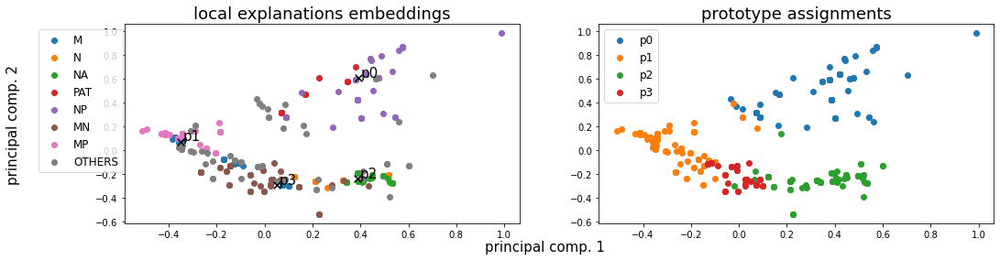

Alpha norms:
tensor([[0.6265, 1.0000, 0.5679, 0.3684],
        [0.1652, 1.0000, 0.2933, 0.2061]], grad_fn=<DivBackward0>)
Concept Purity: 0.643053 +- 0.090604
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([119, 268, 203, 119], dtype=int64))
Logic formulas:
For class 0:
0.8984485190409027 (feature002) | (feature000)
For class 1:
0.8984485190409027 (feature001) | (feature003)
Accuracy as classifier:  0.8984
LEN fidelity:  tensor(0.8984)


320: Loss: 0.04526, LEN: 0.045102, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03703, V. LEN 0.04
321: Loss: 0.04076, LEN: 0.040631, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04522, V. LEN 0.05
322: Loss: 0.04290, LEN: 0.042739, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05599, V. LEN 0.06
323: Loss: 0.04634, LEN: 0.046218, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.05585, V. LEN 0.06
324: Loss: 0.04602, LEN: 0.045900, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03706, V. LEN 0.04
325: Loss: 0.04570, L

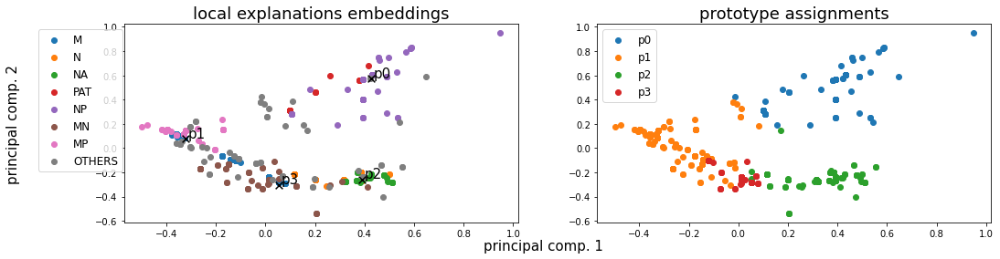

Alpha norms:
tensor([[0.6245, 1.0000, 0.5567, 0.3439],
        [0.1625, 1.0000, 0.2848, 0.1940]], grad_fn=<DivBackward0>)
Concept Purity: 0.653479 +- 0.106927
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 285, 202, 105], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


340: Loss: 0.04428, LEN: 0.044112, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03676, V. LEN 0.04
341: Loss: 0.04631, LEN: 0.046168, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03726, V. LEN 0.04
342: Loss: 0.04231, LEN: 0.042176, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03701, V. LEN 0.04
343: Loss: 0.04343, LEN: 0.043143, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04576, V. LEN 0.05
344: Loss: 0.04212, LEN: 0.041967, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04053, V. LEN 0.04
345: Loss: 0.04646, L

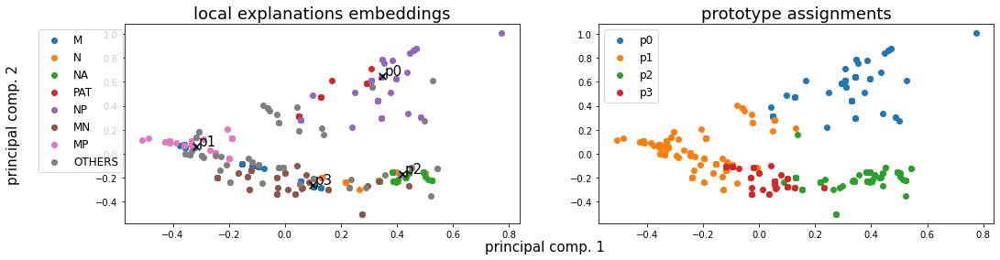

Alpha norms:
tensor([[0.6183, 1.0000, 0.5603, 0.3431],
        [0.1615, 1.0000, 0.2893, 0.1955]], grad_fn=<DivBackward0>)
Concept Purity: 0.634382 +- 0.087672
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([109, 280, 199, 121], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature002) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature003)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


360: Loss: 0.04257, LEN: 0.042434, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04249, V. LEN 0.04
361: Loss: 0.04108, LEN: 0.040970, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.05049, V. LEN 0.05
362: Loss: 0.04346, LEN: 0.043310, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03681, V. LEN 0.04
363: Loss: 0.04506, LEN: 0.044903, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03730, V. LEN 0.04
364: Loss: 0.04121, LEN: 0.041012, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04151, V. LEN 0.04
365: Loss: 0.04233, L

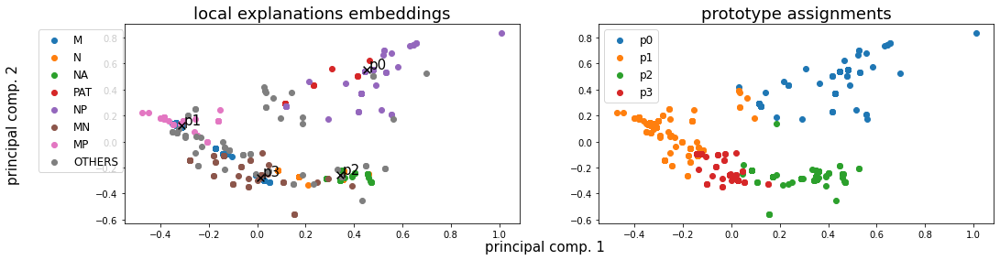

Alpha norms:
tensor([[0.6216, 1.0000, 0.5487, 0.3261],
        [0.1615, 1.0000, 0.2817, 0.1875]], grad_fn=<DivBackward0>)
Concept Purity: 0.640670 +- 0.077495
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 269, 200, 123], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature002) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature003)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


380: Loss: 0.04808, LEN: 0.047951, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03742, V. LEN 0.04
381: Loss: 0.04233, LEN: 0.042193, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04161, V. LEN 0.04
382: Loss: 0.04706, LEN: 0.046892, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03717, V. LEN 0.04
383: Loss: 0.04190, LEN: 0.041768, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05605, V. LEN 0.06
384: Loss: 0.04285, LEN: 0.042643, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03644, V. LEN 0.04
385: Loss: 0.04857, L

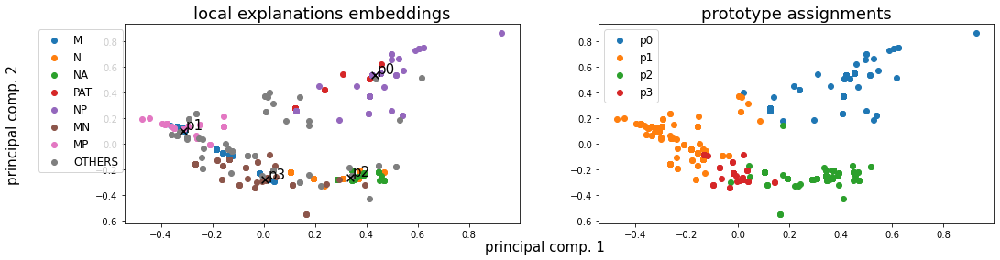

Alpha norms:
tensor([[0.6126, 1.0000, 0.5515, 0.3130],
        [0.1588, 1.0000, 0.2837, 0.1807]], grad_fn=<DivBackward0>)
Concept Purity: 0.647068 +- 0.091133
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([117, 281, 201, 110], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


400: Loss: 0.04866, LEN: 0.048490, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03710, V. LEN 0.04
401: Loss: 0.04215, LEN: 0.042044, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04567, V. LEN 0.05
402: Loss: 0.04401, LEN: 0.043837, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03714, V. LEN 0.04
403: Loss: 0.04197, LEN: 0.041827, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04173, V. LEN 0.04
404: Loss: 0.04534, LEN: 0.045224, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03732, V. LEN 0.04
405: Loss: 0.04154, L

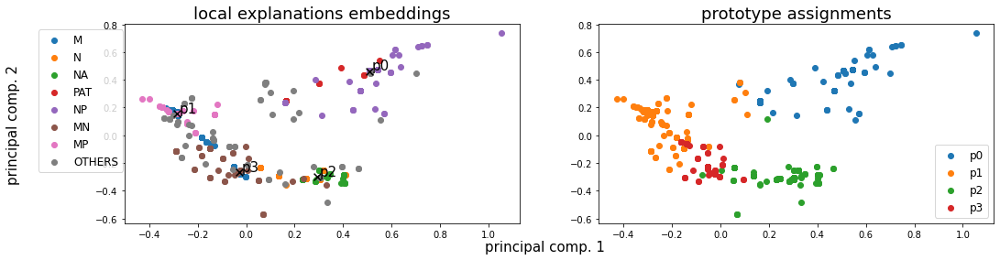

Alpha norms:
tensor([[0.5999, 1.0000, 0.5546, 0.3000],
        [0.1566, 1.0000, 0.2859, 0.1754]], grad_fn=<DivBackward0>)
Concept Purity: 0.643069 +- 0.086129
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([118, 271, 200, 120], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature002) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature003)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


420: Loss: 0.04418, LEN: 0.044029, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03760, V. LEN 0.04
421: Loss: 0.04220, LEN: 0.042050, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04508, V. LEN 0.04
422: Loss: 0.04332, LEN: 0.043198, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03753, V. LEN 0.04
423: Loss: 0.04347, LEN: 0.043375, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03714, V. LEN 0.04
424: Loss: 0.04462, LEN: 0.044537, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03716, V. LEN 0.04
425: Loss: 0.04226, L

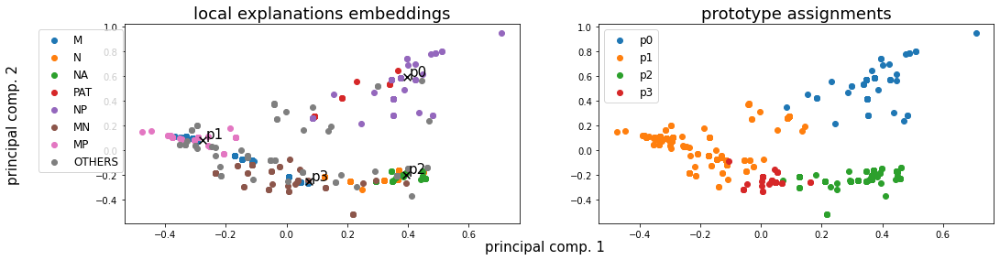

Alpha norms:
tensor([[0.6006, 1.0000, 0.5456, 0.2804],
        [0.1555, 1.0000, 0.2782, 0.1654]], grad_fn=<DivBackward0>)
Concept Purity: 0.674000 +- 0.083647
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([ 70, 386, 198,  55], dtype=int64))
Logic formulas:
For class 0:
0.8702397743300423 (feature002) | (feature000)
For class 1:
0.8702397743300423 (feature001) | (feature003)
Accuracy as classifier:  0.8702
LEN fidelity:  tensor(0.8702)


440: Loss: 0.04156, LEN: 0.041428, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05519, V. LEN 0.06
441: Loss: 0.04498, LEN: 0.044848, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03753, V. LEN 0.04
442: Loss: 0.04311, LEN: 0.042966, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03735, V. LEN 0.04
443: Loss: 0.04108, LEN: 0.040963, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05588, V. LEN 0.06
444: Loss: 0.04437, LEN: 0.044270, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03654, V. LEN 0.04
445: Loss: 0.04343, L

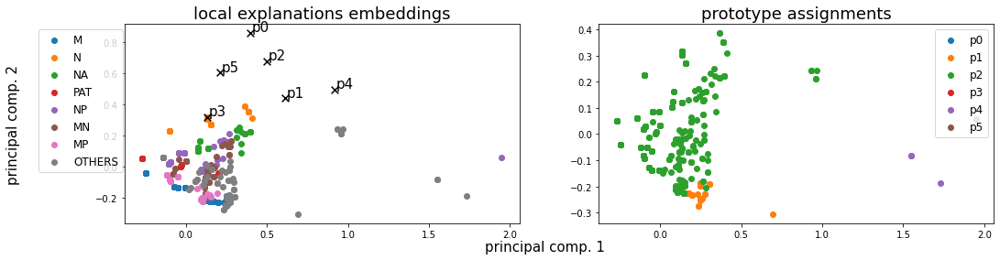

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.553838 +- 0.155876
Concept distribution:  (array([1, 2, 4], dtype=int64), array([ 35, 670,   4], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.25408, LEN: 0.100998, AccxC: 0.43, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.23562, V. LEN 0.10
  2: Loss: 0.22080, LEN: 0.100586, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21003, V. LEN 0.10
  3: Loss: 0.19988, LEN: 0.100183, AccxC: 0.42, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19327, V. LEN 0.10
  4: Loss: 0.18115, LEN: 0.099787, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17076, V. LEN 0.10
  5: Loss: 0.15831, LEN: 0.099369, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15349, V. LEN 0.10
  6: Loss: 0.14747, LEN: 0.098908, AccxC: 0.77, AccO: 0.00, V. Acc: 0.00, V. L

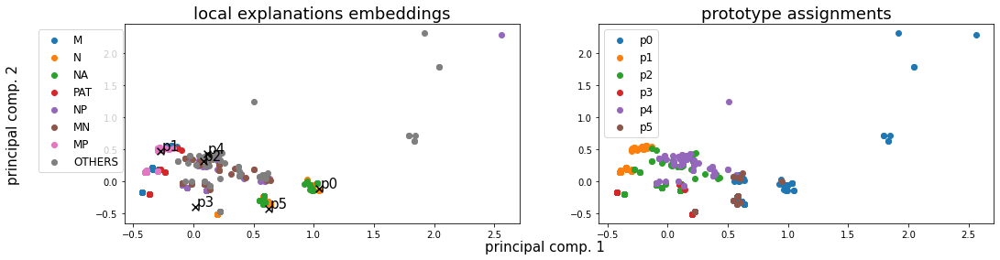

Alpha norms:
tensor([[0.7654, 1.0000, 0.7957, 0.7274, 0.7511, 0.9343],
        [1.0000, 0.7975, 0.7335, 0.8117, 0.8031, 0.6790]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.577217 +- 0.109422
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 76, 206, 117, 195,  68,  47], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.10099, LEN: 0.094236, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10553, V. LEN 0.09
 21: Loss: 0.10012, LEN: 0.093883, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10466, V. LEN 0.09
 22: Loss: 0.09849, LEN: 0.093516, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10414, V. LEN 0.09
 23: Loss: 0.09778, LEN: 0.093152, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10344, V. LEN 0.09
 24: Loss: 0.09781, LEN: 0.092788, AccxC: 0.64, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10298, V. LEN 0.09
 25: Loss: 0.09695, LEN: 0.092428, AccxC: 0.64, AccO:

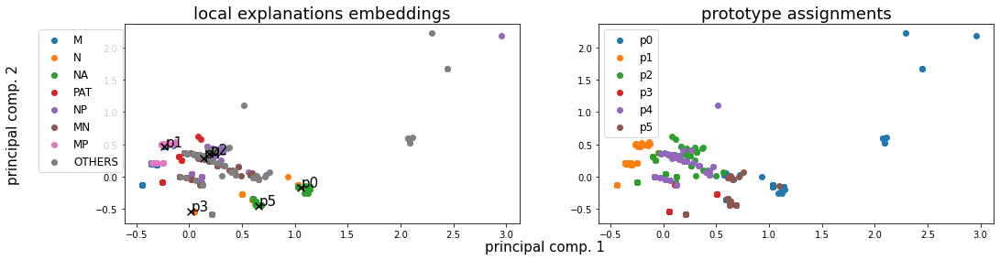

Alpha norms:
tensor([[0.6719, 1.0000, 0.5944, 0.5612, 0.4545, 0.7032],
        [1.0000, 0.6688, 0.3668, 0.5932, 0.6791, 0.5391]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.645510 +- 0.209353
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 65, 310, 119,  98,  69,  48], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 40: Loss: 0.08809, LEN: 0.085673, AccxC: 0.78, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09117, V. LEN 0.08
 41: Loss: 0.08630, LEN: 0.084435, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09095, V. LEN 0.08
 42: Loss: 0.08507, LEN: 0.083827, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08971, V. LEN 0.08
 43: Loss: 0.08425, LEN: 0.082816, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08902, V. LEN 0.08
 44: Loss: 0.08415, LEN: 0.082129, AccxC: 0.88, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08848, V. LEN 0.08
 45: Loss: 0.08354, LEN: 0.081342, AccxC: 0.88, AccO:

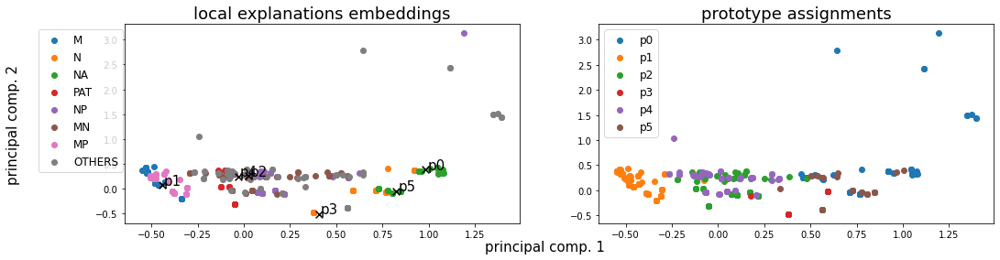

Alpha norms:
tensor([[0.7472, 1.0000, 0.6848, 0.8739, 0.6799, 0.7055],
        [1.0000, 0.9495, 0.2564, 0.2361, 0.7762, 0.5946]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.649824 +- 0.204232
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 64, 311, 114,  98,  72,  50], dtype=int64))
Logic formulas:
For class 0:
0.8815232722143864 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8815232722143864 (feature001) | (feature004)
Accuracy as classifier:  0.8815
LEN fidelity:  tensor(0.8815)


 60: Loss: 0.06609, LEN: 0.064599, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06808, V. LEN 0.06
 61: Loss: 0.06339, LEN: 0.062111, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.06617, V. LEN 0.06
 62: Loss: 0.06277, LEN: 0.061801, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.06462, V. LEN 0.06
 63: Loss: 0.06033, LEN: 0.059544, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.06338, V. LEN 0.06
 64: Loss: 0.06021, LEN: 0.058690, AccxC

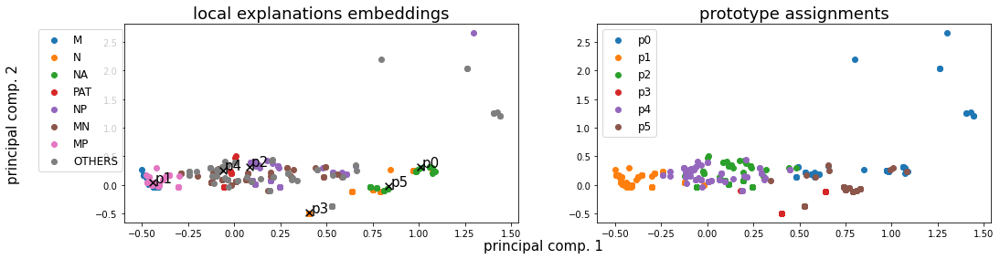

Alpha norms:
tensor([[0.5066, 1.0000, 0.4508, 0.7369, 0.3750, 0.4191],
        [0.5510, 1.0000, 0.1905, 0.1349, 0.5378, 0.2491]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.604179 +- 0.245269
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 44, 324, 109,  98,  67,  67], dtype=int64))
Logic formulas:
For class 0:
0.8871650211565585 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8871650211565585 (feature001) | (feature004)
Accuracy as classifier:  0.8872
LEN fidelity:  tensor(0.8872)


 80: Loss: 0.04836, LEN: 0.046426, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05078, V. LEN 0.05
 81: Loss: 0.04600, LEN: 0.045123, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.05035, V. LEN 0.05
 82: Loss: 0.04842, LEN: 0.046532, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04974, V. LEN 0.05
 83: Loss: 0.04745, LEN: 0.045865, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04992, V. LEN 0.05
 84: Loss: 0.04774, LEN: 0.046378, AccxC

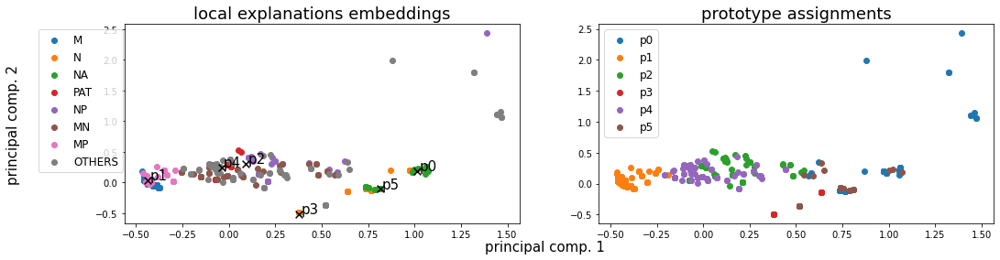

Alpha norms:
tensor([[0.4704, 1.0000, 0.2967, 0.5229, 0.1964, 0.2938],
        [0.3626, 1.0000, 0.1206, 0.1083, 0.2639, 0.1160]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.669572 +- 0.187439
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 52, 313, 119,  97,  80,  48], dtype=int64))
Logic formulas:
For class 0:
0.8928067700987306 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8928067700987306 (feature001) | (feature004)
Accuracy as classifier:  0.8928
LEN fidelity:  tensor(0.8928)


100: Loss: 0.04317, LEN: 0.042313, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04619, V. LEN 0.04
101: Loss: 0.04406, LEN: 0.042446, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04345, V. LEN 0.04
102: Loss: 0.04470, LEN: 0.043763, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04368, V. LEN 0.04
103: Loss: 0.04388, LEN: 0.042844, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04259, V. LEN 0.04
104: Loss: 0.04494, LEN: 0.043409, AccxC

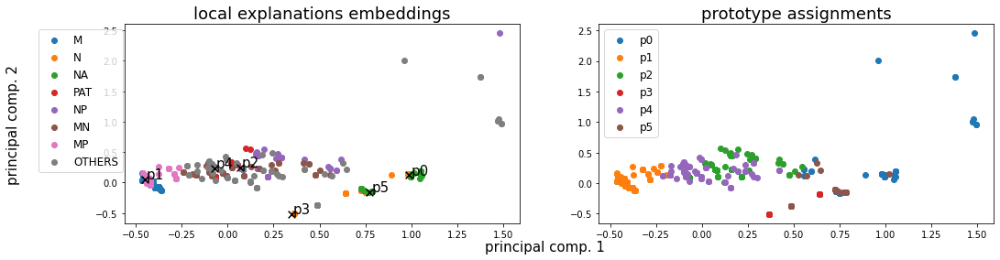

Alpha norms:
tensor([[0.4913, 1.0000, 0.2686, 0.3834, 0.1653, 0.2697],
        [0.3210, 1.0000, 0.0952, 0.0904, 0.1698, 0.0859]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.663132 +- 0.195315
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 57, 313, 119,  97,  77,  46], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8970380818053597 (feature001) | (feature004)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


120: Loss: 0.04355, LEN: 0.042459, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04172, V. LEN 0.04
121: Loss: 0.04313, LEN: 0.041716, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04192, V. LEN 0.04
122: Loss: 0.04318, LEN: 0.042684, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04244, V. LEN 0.04
123: Loss: 0.04330, LEN: 0.042088, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03773, V. LEN 0.03
124: Loss: 0.04268, LEN: 0.041906, AccxC:

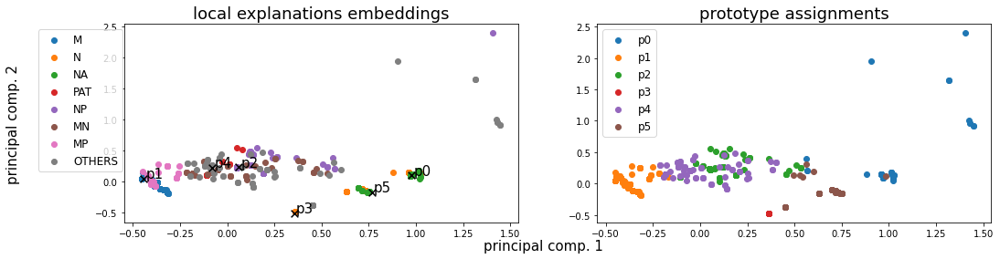

Alpha norms:
tensor([[0.5234, 1.0000, 0.2662, 0.3264, 0.1645, 0.2776],
        [0.2941, 1.0000, 0.0859, 0.0793, 0.1353, 0.0811]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.610034 +- 0.236797
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 35, 311, 117,  86,  84,  76], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature004)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


140: Loss: 0.04167, LEN: 0.040574, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03670, V. LEN 0.03
141: Loss: 0.04143, LEN: 0.040629, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03964, V. LEN 0.04
142: Loss: 0.04241, LEN: 0.041581, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04174, V. LEN 0.04
143: Loss: 0.04088, LEN: 0.039999, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03681, V. LEN 0.03
144: Loss: 0.04229, LEN: 0.041279, AccxC

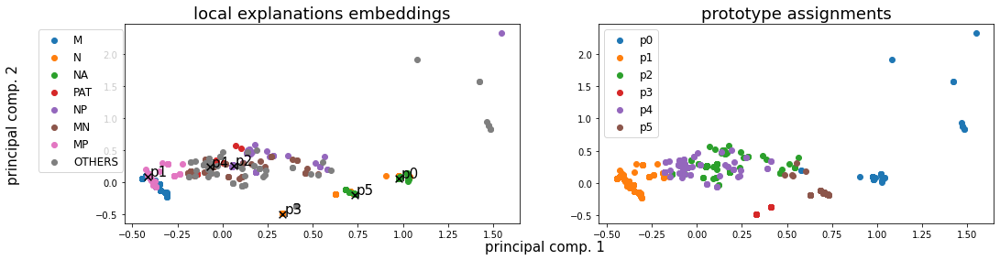

Alpha norms:
tensor([[0.5334, 1.0000, 0.2732, 0.2996, 0.1767, 0.2972],
        [0.2756, 1.0000, 0.0834, 0.0723, 0.1272, 0.0833]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.608012 +- 0.159664
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 35, 313, 127, 110,  73,  51], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature004)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


160: Loss: 0.03987, LEN: 0.039512, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03882, V. LEN 0.04
161: Loss: 0.04369, LEN: 0.043226, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03653, V. LEN 0.03
162: Loss: 0.04170, LEN: 0.040914, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03903, V. LEN 0.04
163: Loss: 0.04058, LEN: 0.039935, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03871, V. LEN 0.04
164: Loss: 0.04082, LEN: 0.040131, AccxC

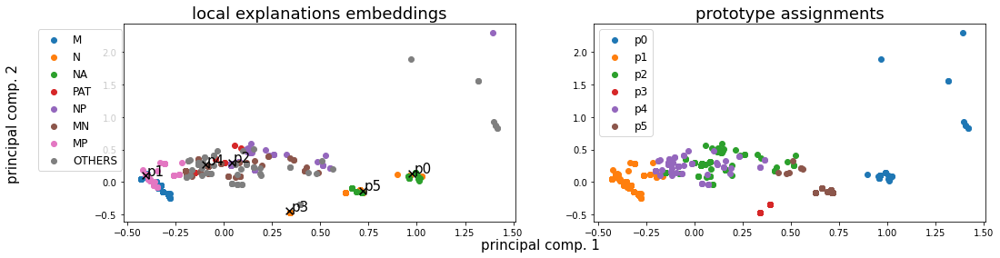

Alpha norms:
tensor([[0.5531, 1.0000, 0.2856, 0.2971, 0.1837, 0.3198],
        [0.2728, 1.0000, 0.0848, 0.0710, 0.1237, 0.0867]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.605261 +- 0.157336
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 313, 129, 110,  71,  53], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9026798307475318 (feature001) | (feature004)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


180: Loss: 0.04202, LEN: 0.041617, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03953, V. LEN 0.04
181: Loss: 0.04148, LEN: 0.040907, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03942, V. LEN 0.04
182: Loss: 0.04052, LEN: 0.040102, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03951, V. LEN 0.04
183: Loss: 0.03963, LEN: 0.039133, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.05394, V. LEN 0.05
184: Loss: 0.04414, LEN: 0.043429, AccxC

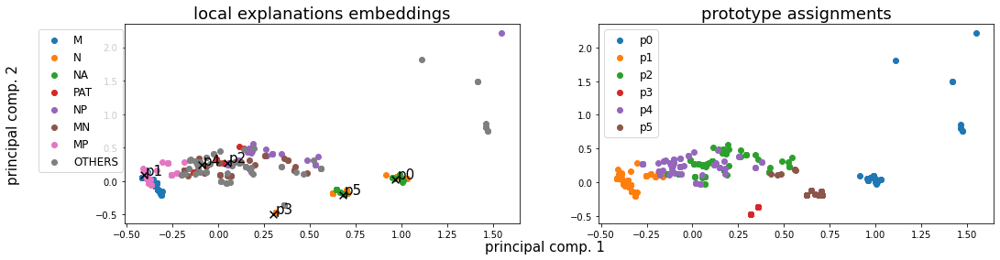

Alpha norms:
tensor([[0.5693, 1.0000, 0.2962, 0.3020, 0.1912, 0.3440],
        [0.2769, 1.0000, 0.0873, 0.0716, 0.1249, 0.0926]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.603645 +- 0.164495
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 307, 133, 110,  74,  52], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


200: Loss: 0.04468, LEN: 0.044202, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03894, V. LEN 0.04
201: Loss: 0.04947, LEN: 0.049087, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03619, V. LEN 0.03
202: Loss: 0.04020, LEN: 0.039914, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04234, V. LEN 0.04
203: Loss: 0.03998, LEN: 0.039514, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04019, V. LEN 0.04
204: Loss: 0.03988, LEN: 0.039343, AccxC

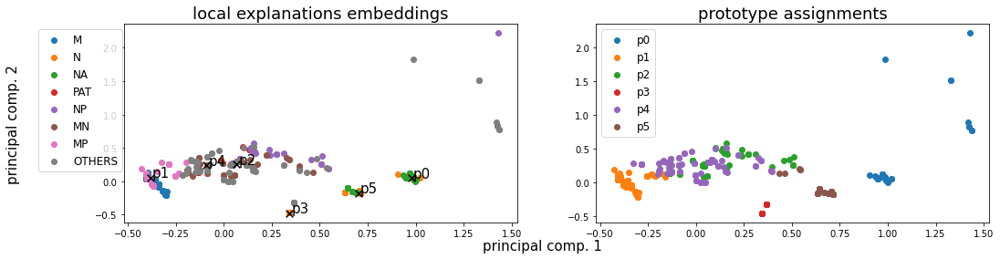

Alpha norms:
tensor([[0.5773, 1.0000, 0.2965, 0.3016, 0.1951, 0.3803],
        [0.2806, 1.0000, 0.0880, 0.0718, 0.1262, 0.1024]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.598338 +- 0.168245
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 306, 112, 110,  97,  51], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


220: Loss: 0.04620, LEN: 0.045880, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03912, V. LEN 0.04
221: Loss: 0.03900, LEN: 0.038726, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03894, V. LEN 0.04
222: Loss: 0.04183, LEN: 0.041576, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05596, V. LEN 0.05
223: Loss: 0.04014, LEN: 0.039780, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.04216, V. LEN 0.04
224: Loss: 0.04082, LEN: 0.040499, AccxC

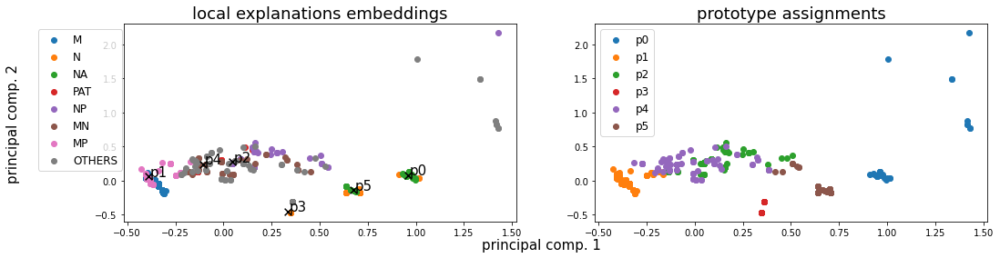

Alpha norms:
tensor([[0.5702, 1.0000, 0.2989, 0.2977, 0.1986, 0.3989],
        [0.2765, 1.0000, 0.0886, 0.0712, 0.1270, 0.1063]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.597344 +- 0.166564
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 306, 118, 110,  88,  54], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8998589562764457 (feature001) | (feature004)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


240: Loss: 0.03995, LEN: 0.038592, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03586, V. LEN 0.03
241: Loss: 0.04399, LEN: 0.043709, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03584, V. LEN 0.03
242: Loss: 0.04616, LEN: 0.045892, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03899, V. LEN 0.04
243: Loss: 0.04070, LEN: 0.040447, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03923, V. LEN 0.04
244: Loss: 0.04269, LEN: 0.042348, AccxC

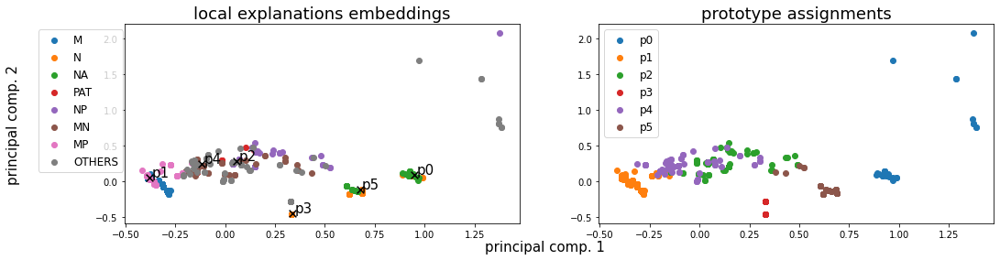

Alpha norms:
tensor([[0.5810, 1.0000, 0.3045, 0.3014, 0.2082, 0.4334],
        [0.2826, 1.0000, 0.0910, 0.0729, 0.1334, 0.1158]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.603569 +- 0.165812
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 306, 133, 110,  76,  51], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature004)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


260: Loss: 0.04424, LEN: 0.043857, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03894, V. LEN 0.04
261: Loss: 0.03918, LEN: 0.038916, AccxC: 0.91, AccO: 0.91, V. Acc: 0.88, V. Loss: 0.05508, V. LEN 0.05
262: Loss: 0.04652, LEN: 0.046255, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03886, V. LEN 0.04
263: Loss: 0.03992, LEN: 0.039620, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05538, V. LEN 0.05
264: Loss: 0.04152, LEN: 0.041213, AccxC

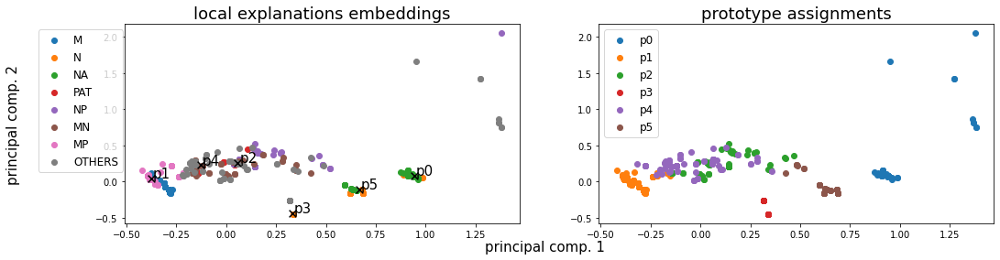

Alpha norms:
tensor([[0.5799, 1.0000, 0.3015, 0.2982, 0.2054, 0.4570],
        [0.2817, 1.0000, 0.0903, 0.0722, 0.1318, 0.1233]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.589953 +- 0.173415
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 306, 119, 110,  88,  53], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature004)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


280: Loss: 0.03971, LEN: 0.039540, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03886, V. LEN 0.04
281: Loss: 0.04574, LEN: 0.045531, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03873, V. LEN 0.04
282: Loss: 0.04723, LEN: 0.046925, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03889, V. LEN 0.04
283: Loss: 0.04029, LEN: 0.039880, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03573, V. LEN 0.03
284: Loss: 0.04728, LEN: 0.047025, AccxC

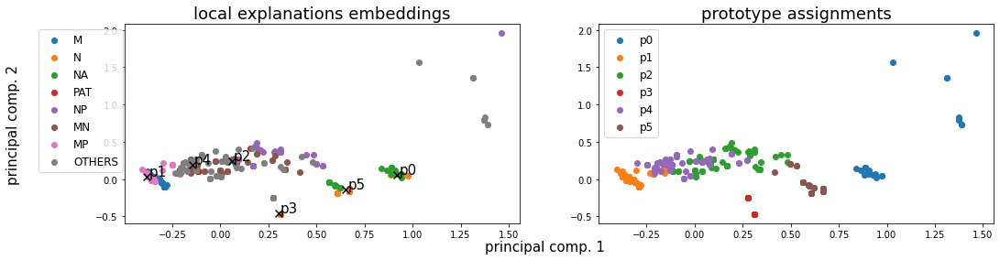

Alpha norms:
tensor([[0.5771, 1.0000, 0.3028, 0.2972, 0.2038, 0.4857],
        [0.2794, 1.0000, 0.0908, 0.0724, 0.1317, 0.1325]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.595898 +- 0.168514
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 309, 135, 110,  70,  52], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


300: Loss: 0.05013, LEN: 0.049838, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03849, V. LEN 0.04
301: Loss: 0.04103, LEN: 0.040798, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03801, V. LEN 0.04
302: Loss: 0.04090, LEN: 0.040616, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04063, V. LEN 0.04
303: Loss: 0.04009, LEN: 0.039910, AccxC: 0.91, AccO: 0.91, V. Acc: 0.86, V. Loss: 0.05737, V. LEN 0.06
304: Loss: 0.04906, LEN: 0.048806, AccxC

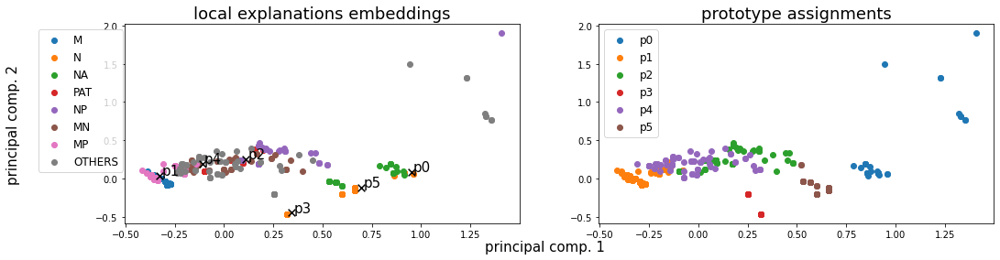

Alpha norms:
tensor([[0.5792, 1.0000, 0.3048, 0.3037, 0.2077, 0.5023],
        [0.2781, 1.0000, 0.0909, 0.0732, 0.1327, 0.1389]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.619244 +- 0.140829
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 324, 117, 110,  77,  48], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9012693935119888 (feature001) | (feature004)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


320: Loss: 0.03969, LEN: 0.039344, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03776, V. LEN 0.04
321: Loss: 0.04080, LEN: 0.040627, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03821, V. LEN 0.04
322: Loss: 0.04320, LEN: 0.042964, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04078, V. LEN 0.04
323: Loss: 0.04291, LEN: 0.042655, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04065, V. LEN 0.04
324: Loss: 0.03912, LEN: 0.038727, AccxC

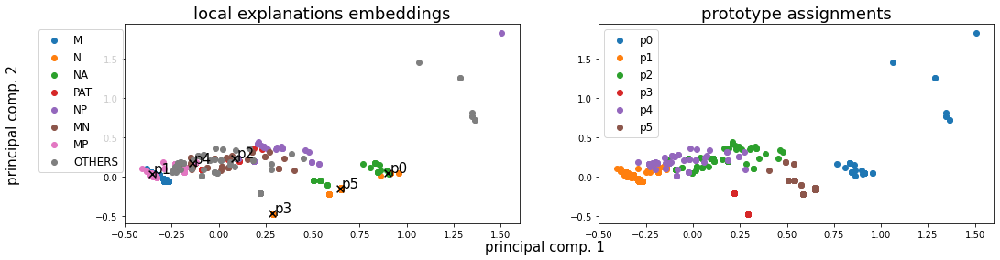

Alpha norms:
tensor([[0.5805, 1.0000, 0.3081, 0.2976, 0.2011, 0.5096],
        [0.2771, 1.0000, 0.0916, 0.0718, 0.1299, 0.1430]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.606621 +- 0.156740
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 320, 132, 110,  62,  52], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature004)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


340: Loss: 0.04164, LEN: 0.041357, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04054, V. LEN 0.04
341: Loss: 0.04042, LEN: 0.040125, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.03888, V. LEN 0.04
342: Loss: 0.04143, LEN: 0.041063, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04046, V. LEN 0.04
343: Loss: 0.04829, LEN: 0.047825, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04041, V. LEN 0.04
344: Loss: 0.03947, LEN: 0.039206, AccxC

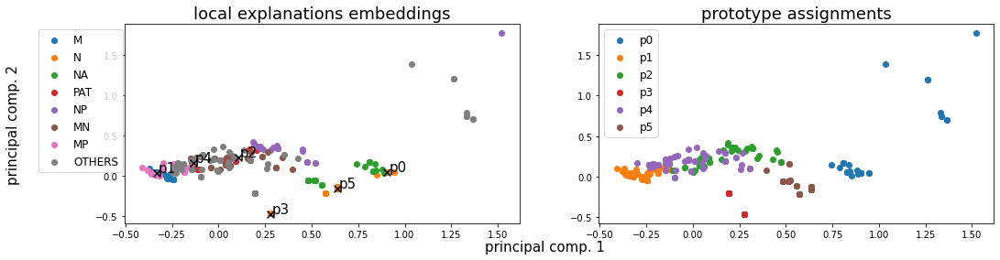

Alpha norms:
tensor([[0.5835, 1.0000, 0.2982, 0.3015, 0.1867, 0.5151],
        [0.2733, 1.0000, 0.0878, 0.0713, 0.1195, 0.1441]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.613523 +- 0.145885
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 323, 125, 110,  69,  49], dtype=int64))
Logic formulas:
For class 0:
0.9055007052186178 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9055007052186178 (feature001) | (feature004)
Accuracy as classifier:  0.9055
LEN fidelity:  tensor(0.9055)


360: Loss: 0.04108, LEN: 0.040816, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04063, V. LEN 0.04
361: Loss: 0.04271, LEN: 0.042482, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04259, V. LEN 0.04
362: Loss: 0.04018, LEN: 0.039944, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.04096, V. LEN 0.04
363: Loss: 0.04369, LEN: 0.042715, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04076, V. LEN 0.04
364: Loss: 0.03878, LEN: 0.038527, AccxC

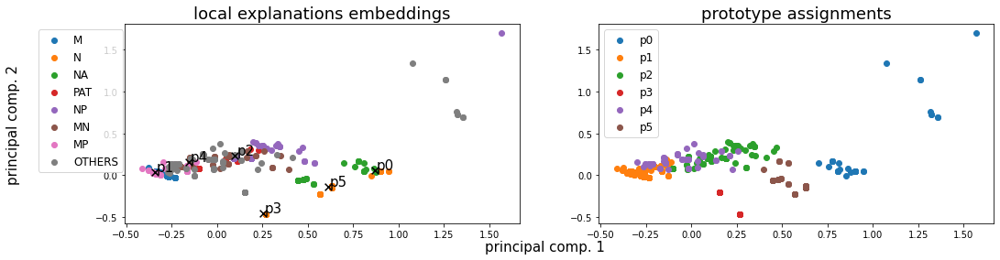

Alpha norms:
tensor([[0.5767, 1.0000, 0.3070, 0.2912, 0.1860, 0.5091],
        [0.2662, 1.0000, 0.0890, 0.0683, 0.1164, 0.1420]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.603602 +- 0.151878
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 326, 130, 110,  58,  52], dtype=int64))
Logic formulas:
For class 0:
0.9083215796897038 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9083215796897038 (feature001) | (feature004)
Accuracy as classifier:  0.9083
LEN fidelity:  tensor(0.9083)


380: Loss: 0.04177, LEN: 0.041384, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04223, V. LEN 0.04
381: Loss: 0.04169, LEN: 0.041286, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04276, V. LEN 0.04
382: Loss: 0.03940, LEN: 0.039133, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04264, V. LEN 0.04
383: Loss: 0.04238, LEN: 0.042141, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03970, V. LEN 0.04
384: Loss: 0.04116, LEN: 0.040928, AccxC

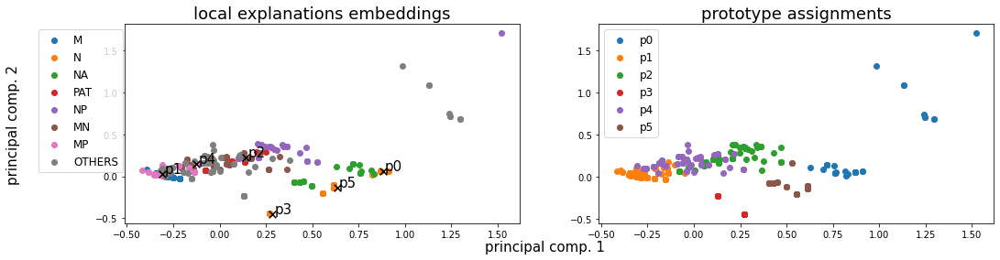

Alpha norms:
tensor([[0.5727, 1.0000, 0.3069, 0.2951, 0.1789, 0.5157],
        [0.2614, 1.0000, 0.0885, 0.0683, 0.1102, 0.1433]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.602205 +- 0.142966
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 333, 119, 110,  66,  48], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.9040902679830748 (feature001) | (feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


400: Loss: 0.03923, LEN: 0.038992, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03643, V. LEN 0.03
401: Loss: 0.04607, LEN: 0.045809, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03949, V. LEN 0.04
402: Loss: 0.04168, LEN: 0.041421, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05475, V. LEN 0.05
403: Loss: 0.04164, LEN: 0.041394, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03962, V. LEN 0.04
404: Loss: 0.04034, LEN: 0.039996, AccxC

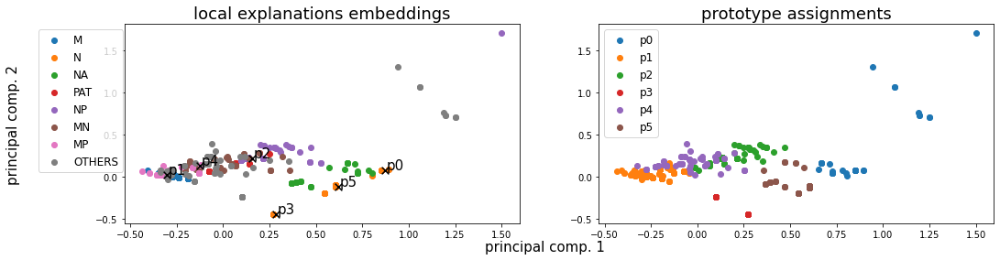

Alpha norms:
tensor([[0.5711, 1.0000, 0.3061, 0.2938, 0.1690, 0.5275],
        [0.2574, 1.0000, 0.0874, 0.0670, 0.1029, 0.1454]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.598905 +- 0.149533
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 32, 375,  70, 110,  69,  53], dtype=int64))
Logic formulas:
For class 0:
0.8716502115655853 (feature003) | (feature002) | (feature005) | (feature000)
For class 1:
0.8716502115655853 (feature001) | (feature004)
Accuracy as classifier:  0.8717
LEN fidelity:  tensor(0.8717)


420: Loss: 0.03985, LEN: 0.039687, AccxC: 0.90, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.05443, V. LEN 0.05
Early Stopping
Loading model at epoch 319
Best epoch: 319
Trained lasted for 149 seconds
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([266, 125,  31,  47,  63,  52,  41,  84], dtype=int64))


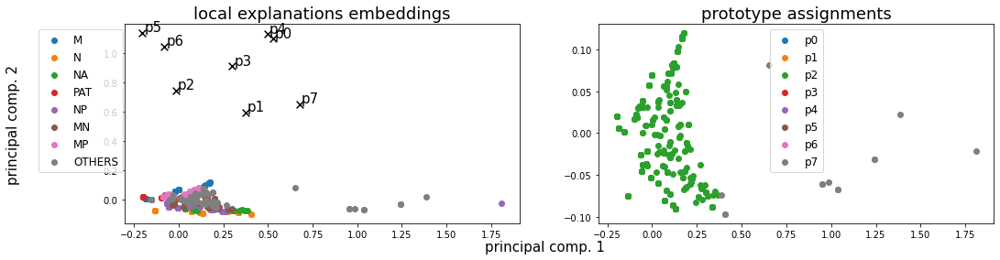

Alpha norms:
tensor([[1.0000, 0.7935, 0.9836, 0.9568, 0.8002, 0.8796, 0.8436, 0.8286],
        [0.8038, 0.9233, 0.9012, 0.9027, 1.0000, 0.9723, 0.8571, 0.9484]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.537246 +- 0.155062
Concept distribution:  (array([2, 7], dtype=int64), array([696,  13], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.28528, LEN: 0.086579, AccxC: 0.60, AccO: 0.01, V. Acc: 0.02, V. Loss: 0.25781, V. LEN 0.09
  2: Loss: 0.23922, LEN: 0.086414, AccxC: 0.60, AccO: 0.18, V. Acc: 0.33, V. Loss: 0.22061, V. LEN 0.09
  3: Loss: 0.20647, LEN: 0.086257, AccxC: 0.60, AccO: 0.44, V. Acc: 0.55, V. Loss: 0.19361, V. LEN 0.09
  4: Loss: 0.18034, LEN: 0.086067, AccxC: 0.60, AccO: 0.60, V. Acc: 0.55, V. Loss: 0.16737, V. LEN 0.09
  5: Loss: 0.15662, LEN: 0.086087, AccxC: 0.60, AccO: 0.60, V. Acc: 0.52, V. Loss: 0.14572, V. LEN 0.09
  6: Loss: 0.14024, LEN: 0.086311, AccxC: 0.62, AccO: 

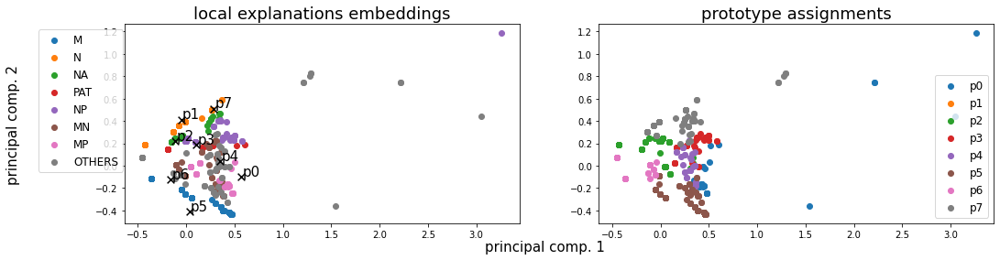

Alpha norms:
tensor([[0.8853, 0.7286, 0.8810, 0.8649, 0.8559, 1.0000, 0.8145, 0.9673],
        [0.6377, 0.6979, 0.6631, 0.7225, 0.8628, 0.6268, 0.8193, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.606195 +- 0.130462
Concept distribution:  (array([0, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 28, 200,  32,  31, 202, 141,  75], dtype=int64))
Logic formulas:
For class 0:
0.6657263751763046 (feature007)
For class 1:
0.6657263751763046 (feature006) | (feature002) | (feature000) | (feature004) | ((feature005) | (feature003)
Accuracy as classifier:  0.6657
LEN fidelity:  tensor(0.6657)


 20: Loss: 0.09876, LEN: 0.082701, AccxC: 0.67, AccO: 0.67, V. Acc: 0.64, V. Loss: 0.10000, V. LEN 0.08
 21: Loss: 0.09760, LEN: 0.082442, AccxC: 0.67, AccO: 0.67, V. Acc: 0.62, V. Loss: 0.09871, V. LEN 0.08
 22: Loss: 0.09601, LEN: 0.082067, AccxC: 0.65, AccO: 0.65, V. Acc: 0.64, V. Loss: 0.09676, V. LEN 0.08
 23: Loss: 0.09413, LEN: 0.081004, AccxC: 0.67, AccO: 0.67, V. Acc: 0.64, V. Loss: 0.095

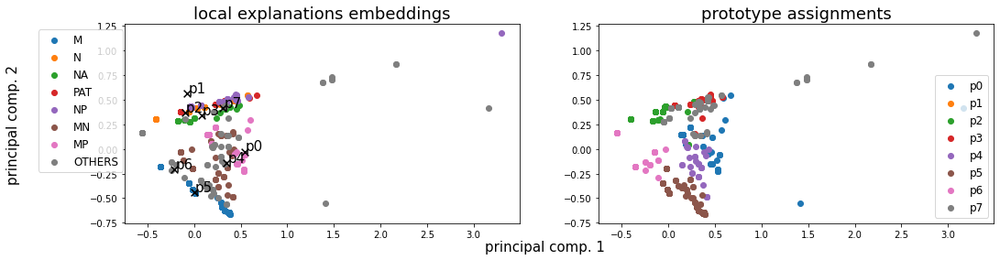

Alpha norms:
tensor([[0.6069, 0.4002, 0.5969, 0.5919, 0.5218, 1.0000, 0.6023, 0.8268],
        [0.4478, 0.3167, 0.4196, 0.5824, 0.4432, 0.4258, 0.5788, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.653212 +- 0.147692
Concept distribution:  (array([0, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 51, 181,  35,  31, 197, 142,  72], dtype=int64))
Logic formulas:
For class 0:
0.8617771509167842 (feature002) | (feature003) | (feature007)
For class 1:
0.8617771509167842 (feature006) | (feature005) | (feature004) | (feature000)
Accuracy as classifier:  0.8618
LEN fidelity:  tensor(0.8618)


 40: Loss: 0.06974, LEN: 0.065225, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.07019, V. LEN 0.07
 41: Loss: 0.06732, LEN: 0.063368, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.06852, V. LEN 0.06
 42: Loss: 0.06641, LEN: 0.062727, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.06778, V. LEN 0.06
 43: Loss: 0.06373, LEN: 0.059783, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.0622

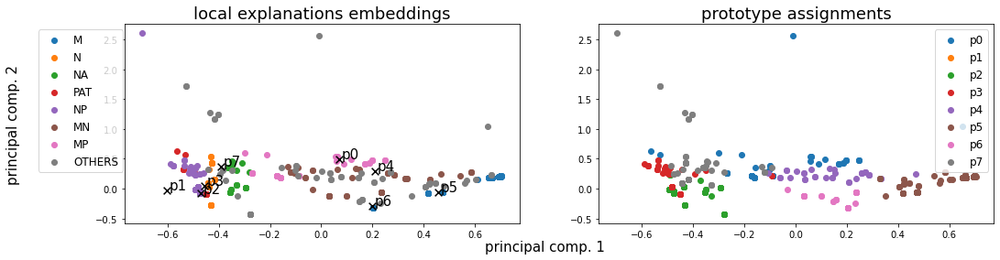

Alpha norms:
tensor([[0.5871, 0.2741, 0.6738, 0.6680, 0.3474, 1.0000, 0.6303, 0.7791],
        [0.3403, 0.1830, 0.3979, 0.5917, 0.2544, 0.3421, 0.4699, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.661226 +- 0.155741
Concept distribution:  (array([0, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 49, 169,  75,  35, 191, 127,  63], dtype=int64))
Logic formulas:
For class 0:
0.8913963328631875 (feature002) | (feature003) | (feature007)
For class 1:
0.8913963328631875 (feature006) | (feature005) | (feature004) | (feature000)
Accuracy as classifier:  0.8914
LEN fidelity:  tensor(0.8914)


 60: Loss: 0.04884, LEN: 0.047130, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04681, V. LEN 0.04
 61: Loss: 0.04675, LEN: 0.045353, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04685, V. LEN 0.04
 62: Loss: 0.04659, LEN: 0.045174, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04604, V. LEN 0.04
 63: Loss: 0.04751, LEN: 0.046227, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.0457

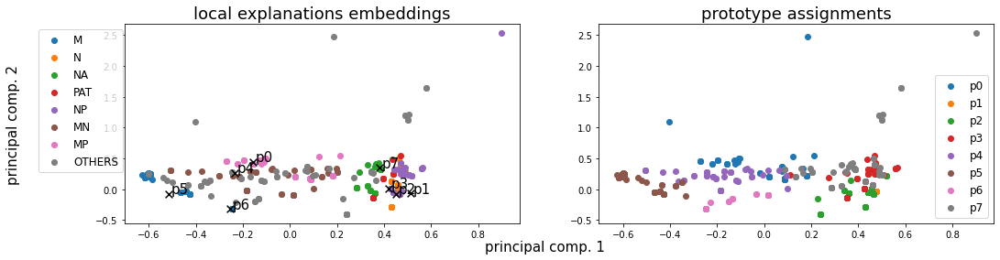

Alpha norms:
tensor([[0.5175, 0.2572, 0.6219, 0.6012, 0.2560, 1.0000, 0.6538, 0.7091],
        [0.2972, 0.1705, 0.3610, 0.5502, 0.1914, 0.3561, 0.5256, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.735518 +- 0.192128
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 49,   6, 158,  77,  51, 179, 116,  73], dtype=int64))
Logic formulas:
For class 0:
0.8899858956276445 (feature002) | (feature003) | (feature007) | (feature001)
For class 1:
0.8899858956276445 (feature006) | (feature005) | (feature004) | (feature000)
Accuracy as classifier:  0.89
LEN fidelity:  tensor(0.8900)


 80: Loss: 0.04367, LEN: 0.042939, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04299, V. LEN 0.04
 81: Loss: 0.04335, LEN: 0.042558, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04502, V. LEN 0.04
 82: Loss: 0.04397, LEN: 0.043121, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04542, V. LEN 0.04
 83: Loss: 0.04229, LEN: 0.041628, AccxC: 0.89, AccO: 0.89, V. Acc: 

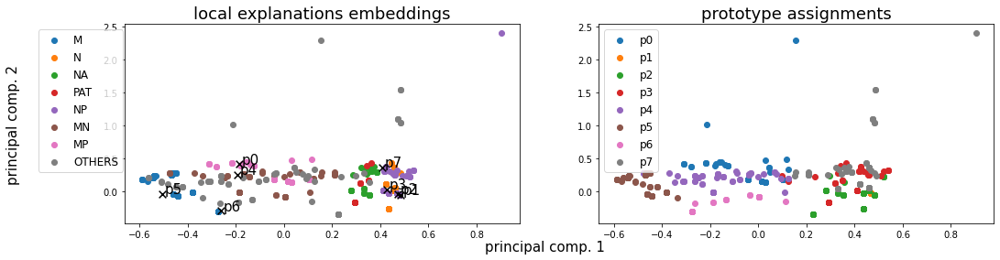

Alpha norms:
tensor([[0.5128, 0.2320, 0.5858, 0.5384, 0.2255, 1.0000, 0.6166, 0.6299],
        [0.2941, 0.1595, 0.3525, 0.5211, 0.1722, 0.3866, 0.5406, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.743941 +- 0.184513
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 47,   6, 166,  76,  60, 176, 117,  61], dtype=int64))
Logic formulas:
For class 0:
0.8942172073342737 (feature002) | (feature003) | (feature007) | (feature001)
For class 1:
0.8942172073342737 (feature006) | (feature005) | (feature004) | (feature000)
Accuracy as classifier:  0.8942
LEN fidelity:  tensor(0.8942)


100: Loss: 0.04236, LEN: 0.041678, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04221, V. LEN 0.04
101: Loss: 0.04191, LEN: 0.041168, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04499, V. LEN 0.04
102: Loss: 0.04517, LEN: 0.044592, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04186, V. LEN 0.04
103: Loss: 0.04321, LEN: 0.042297, AccxC: 0.89, AccO: 0.89, V. Acc

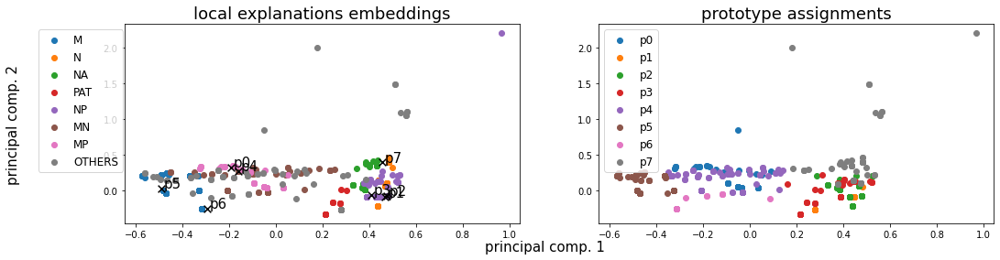

Alpha norms:
tensor([[0.4722, 0.2891, 0.5380, 0.4910, 0.2123, 1.0000, 0.5948, 0.6026],
        [0.2661, 0.2228, 0.3283, 0.4731, 0.1630, 0.4025, 0.5360, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.731476 +- 0.165400
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 46,  31, 140,  73,  78, 170, 108,  63], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature002) | (feature003) | (feature001) | (feature007)
For class 1:
0.8998589562764457 (feature006) | (feature005) | ((feature004) | (feature000)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


120: Loss: 0.04307, LEN: 0.042632, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04181, V. LEN 0.04
121: Loss: 0.04144, LEN: 0.040948, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04512, V. LEN 0.04
122: Loss: 0.04403, LEN: 0.043238, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04477, V. LEN 0.04
123: Loss: 0.04112, LEN: 0.040688, AccxC: 0.90, AccO: 0.90, V. Ac

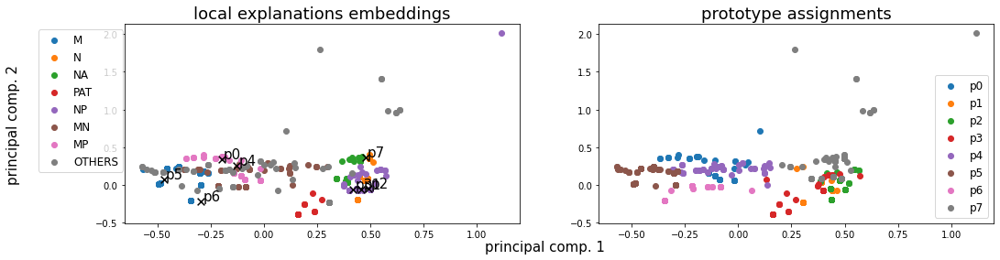

Alpha norms:
tensor([[0.4882, 0.3530, 0.5363, 0.4681, 0.2185, 1.0000, 0.5854, 0.6047],
        [0.2636, 0.2863, 0.3205, 0.4337, 0.1634, 0.4050, 0.5126, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.699648 +- 0.156241
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 46,  40, 133,  68,  48, 181, 127,  66], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature002) | (feature003) | (feature001) | (feature007)
For class 1:
0.8998589562764457 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


140: Loss: 0.04397, LEN: 0.043497, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04043, V. LEN 0.04
141: Loss: 0.04260, LEN: 0.041958, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04116, V. LEN 0.04
142: Loss: 0.04098, LEN: 0.040439, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04101, V. LEN 0.04
143: Loss: 0.04068, LEN: 0.040017, AccxC: 0.90, AccO: 0.90, V. Ac

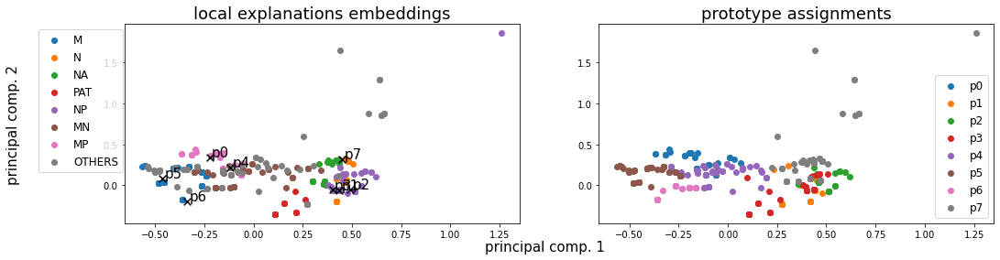

Alpha norms:
tensor([[0.4943, 0.3554, 0.5270, 0.4499, 0.2188, 1.0000, 0.5259, 0.5809],
        [0.2738, 0.3162, 0.3247, 0.4243, 0.1654, 0.4288, 0.4633, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.696179 +- 0.164240
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 45, 126,  38,  79,  58, 130, 168,  65], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature001) | (feature003) | (feature002) | (feature007)
For class 1:
0.9012693935119888 (feature006) | (feature005) | ((feature004) | (feature000)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


160: Loss: 0.04076, LEN: 0.040303, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04070, V. LEN 0.04
161: Loss: 0.04142, LEN: 0.040942, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04099, V. LEN 0.04
162: Loss: 0.04328, LEN: 0.042844, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04056, V. LEN 0.04
163: Loss: 0.04082, LEN: 0.040088, AccxC: 0.90, AccO: 0.90, V. Ac

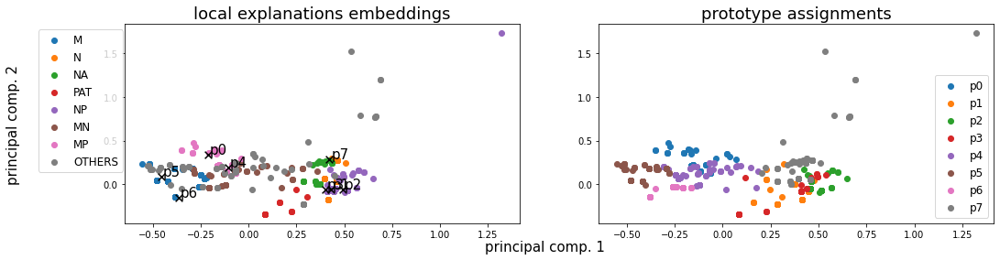

Alpha norms:
tensor([[0.4656, 0.2976, 0.4761, 0.3848, 0.1868, 1.0000, 0.3985, 0.5128],
        [0.2891, 0.3041, 0.3297, 0.4067, 0.1592, 0.5005, 0.3575, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.688601 +- 0.185403
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 45, 133,  48,  62,  86,  98, 168,  69], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001) | (feature007) | (feature003) | (feature002)
For class 1:
0.9040902679830748 (feature006) | (feature005) | ((feature004) | (feature000)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


180: Loss: 0.04120, LEN: 0.040800, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03863, V. LEN 0.04
181: Loss: 0.04171, LEN: 0.041249, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03584, V. LEN 0.03
182: Loss: 0.04039, LEN: 0.039880, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03888, V. LEN 0.04
183: Loss: 0.04040, LEN: 0.039974, AccxC: 0.90, AccO: 0.90, V. Ac

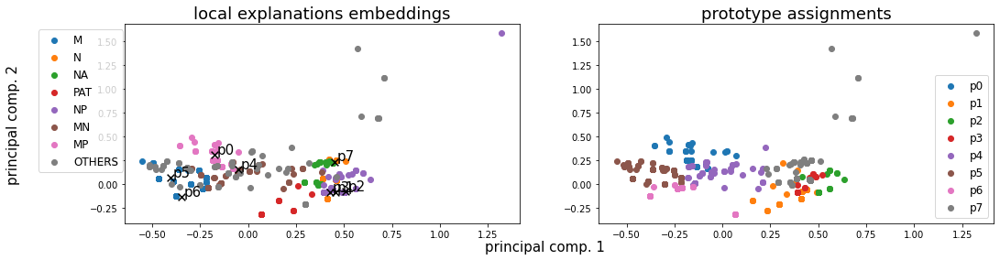

Alpha norms:
tensor([[0.4320, 0.2586, 0.4417, 0.3339, 0.1565, 1.0000, 0.3258, 0.4269],
        [0.3179, 0.3141, 0.3638, 0.4204, 0.1636, 0.6226, 0.3063, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.763361 +- 0.177129
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 45, 146,  23,  19,  52, 138, 207,  79], dtype=int64))
Logic formulas:
For class 0:
0.8660084626234132 (feature001) | (feature007) | (feature003) | (feature002)
For class 1:
0.8660084626234132 (feature006) | (feature005) | ((feature004) | (feature000)
Accuracy as classifier:  0.866
LEN fidelity:  tensor(0.8660)


200: Loss: 0.04164, LEN: 0.041174, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04955, V. LEN 0.05
201: Loss: 0.04421, LEN: 0.043651, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03797, V. LEN 0.04
202: Loss: 0.04122, LEN: 0.040635, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03512, V. LEN 0.03
203: Loss: 0.04039, LEN: 0.039773, AccxC: 0.89, AccO: 0.89, V. Acc

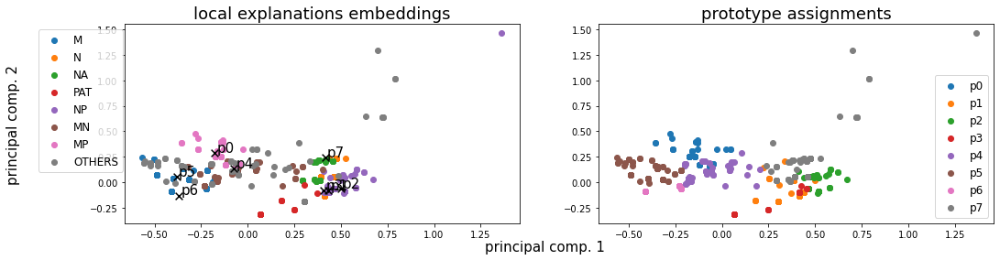

Alpha norms:
tensor([[0.3877, 0.2271, 0.4046, 0.2849, 0.1380, 1.0000, 0.2702, 0.3634],
        [0.3491, 0.3313, 0.3932, 0.4244, 0.1715, 0.7627, 0.2589, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.713480 +- 0.186675
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44, 133,  54,  55,  62, 130, 162,  69], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature001) | (feature007) | (feature003) | (feature002)
For class 1:
0.9026798307475318 (feature006) | (feature005) | ((feature004) | (feature000)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


220: Loss: 0.03814, LEN: 0.037679, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03751, V. LEN 0.04
221: Loss: 0.04059, LEN: 0.040232, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03608, V. LEN 0.04
222: Loss: 0.04149, LEN: 0.041142, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03746, V. LEN 0.04
223: Loss: 0.03849, LEN: 0.038019, AccxC: 0.90, AccO: 0.90, V. Ac

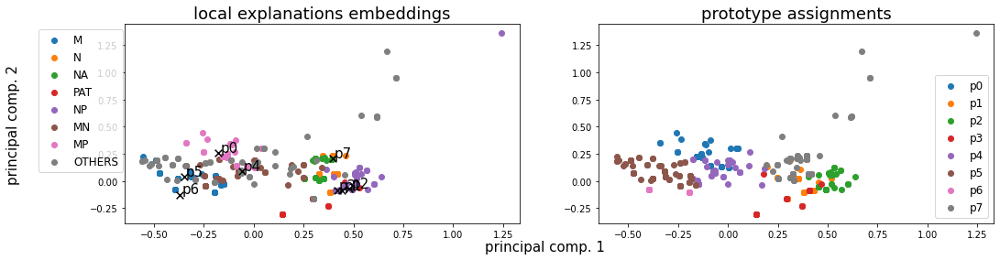

Alpha norms:
tensor([[0.4017, 0.2278, 0.4163, 0.2745, 0.1378, 1.0000, 0.2735, 0.3661],
        [0.3632, 0.3329, 0.3992, 0.4018, 0.1703, 0.7626, 0.2511, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.745236 +- 0.194723
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44, 130,  45,  57,  43, 158, 152,  80], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001) | (feature003) | (feature007) | (feature002)
For class 1:
0.9040902679830748 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


240: Loss: 0.03980, LEN: 0.039279, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03460, V. LEN 0.03
241: Loss: 0.03938, LEN: 0.039001, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04185, V. LEN 0.04
242: Loss: 0.04198, LEN: 0.041435, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04037, V. LEN 0.04
243: Loss: 0.04027, LEN: 0.039798, AccxC: 0.90, AccO: 0.90, V. Ac

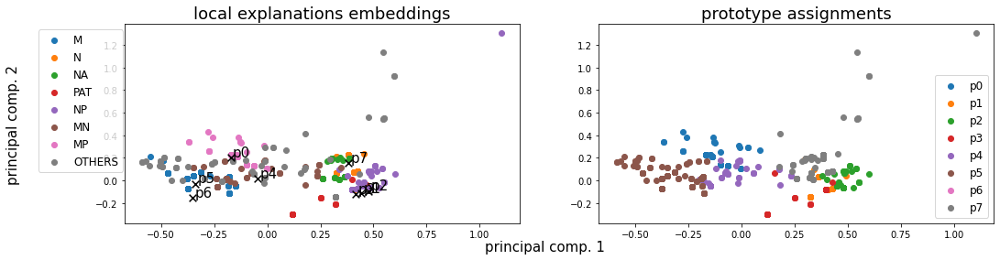

Alpha norms:
tensor([[0.4277, 0.2352, 0.4351, 0.2861, 0.1424, 1.0000, 0.2925, 0.3855],
        [0.3678, 0.3241, 0.3972, 0.3937, 0.1658, 0.7228, 0.2604, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.733218 +- 0.169062
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 7], dtype=int64), array([ 45, 125,  46,  57,  42, 314,  80], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature001) | (feature003) | (feature007) | (feature002)
For class 1:
0.9012693935119888 (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


260: Loss: 0.04094, LEN: 0.040471, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03530, V. LEN 0.03
261: Loss: 0.03929, LEN: 0.038770, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03658, V. LEN 0.04
262: Loss: 0.04051, LEN: 0.040082, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03629, V. LEN 0.04
263: Loss: 0.04081, LEN: 0.040438, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.031

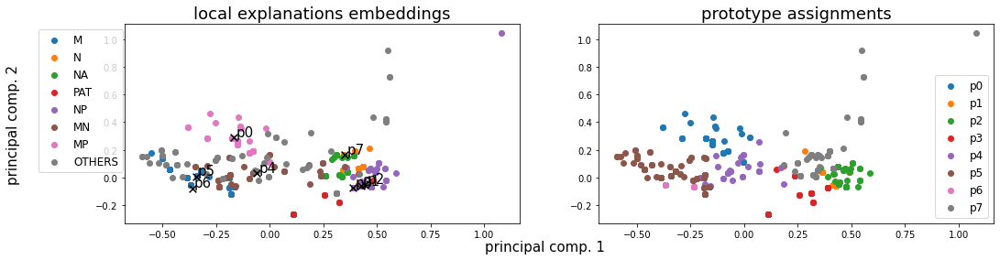

Alpha norms:
tensor([[0.4855, 0.2585, 0.4880, 0.3141, 0.1565, 1.0000, 0.3334, 0.4406],
        [0.3623, 0.3081, 0.3862, 0.3714, 0.1573, 0.6187, 0.2627, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.721073 +- 0.179686
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44, 100,  59,  84,  31, 211, 111,  69], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature001) | (feature003) | (feature007) | (feature002)
For class 1:
0.9040902679830748 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


280: Loss: 0.03969, LEN: 0.039320, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03576, V. LEN 0.04
281: Loss: 0.03843, LEN: 0.038179, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.03497, V. LEN 0.03
282: Loss: 0.04154, LEN: 0.041206, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03194, V. LEN 0.03
283: Loss: 0.03969, LEN: 0.039420, AccxC: 0.90, AccO: 0.90, V. Ac

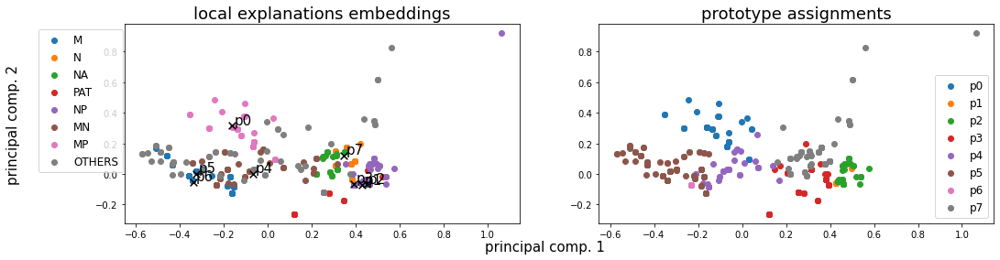

Alpha norms:
tensor([[0.5447, 0.2759, 0.5490, 0.3342, 0.1702, 1.0000, 0.3772, 0.4960],
        [0.3538, 0.2861, 0.3771, 0.3417, 0.1490, 0.5337, 0.2710, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.771530 +- 0.230532
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44,   7,  45, 180,  38, 305,  10,  80], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature007) | (feature002) | (feature001)
For class 1:
0.9040902679830748 (feature005) | (feature006) | (feature000) | ((feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


300: Loss: 0.04016, LEN: 0.039882, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03093, V. LEN 0.03
301: Loss: 0.03972, LEN: 0.039409, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03515, V. LEN 0.03
302: Loss: 0.03869, LEN: 0.038361, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03206, V. LEN 0.03
303: Loss: 0.04076, LEN: 0.040513, AccxC: 0.90, AccO: 0.90, V. Ac

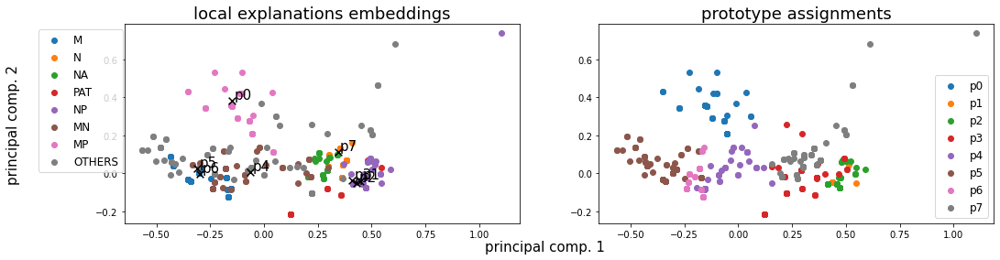

Alpha norms:
tensor([[0.5119, 0.2408, 0.5437, 0.2978, 0.1568, 1.0000, 0.3404, 0.4590],
        [0.3605, 0.2682, 0.3988, 0.3217, 0.1473, 0.5831, 0.2465, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.725198 +- 0.225126
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 41,   8,  48, 177,  39, 235,  82,  79], dtype=int64))
Logic formulas:
For class 0:
0.9040902679830748 (feature003) | (feature007) | (feature002) | (feature001)
For class 1:
0.9040902679830748 (feature005) | (feature006) | (feature000) | ((feature004)
Accuracy as classifier:  0.9041
LEN fidelity:  tensor(0.9041)


320: Loss: 0.04019, LEN: 0.039962, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03068, V. LEN 0.03
321: Loss: 0.03970, LEN: 0.039441, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03067, V. LEN 0.03
322: Loss: 0.03869, LEN: 0.038283, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.02939, V. LEN 0.03
323: Loss: 0.03903, LEN: 0.038762, AccxC: 0.90, AccO: 0.90, V. Ac

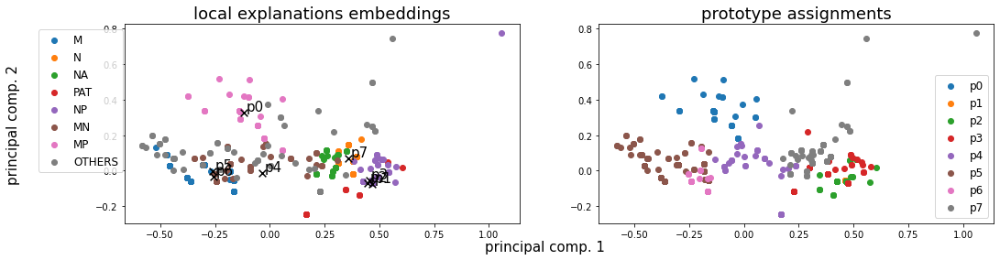

Alpha norms:
tensor([[0.4787, 0.2167, 0.5258, 0.2894, 0.1456, 1.0000, 0.3113, 0.4233],
        [0.3651, 0.2581, 0.4234, 0.3367, 0.1477, 0.6362, 0.2323, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.737197 +- 0.172542
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 41,   6,  38, 144,  72, 257,  71,  80], dtype=int64))
Logic formulas:
For class 0:
0.8674188998589563 (feature003) | (feature002) | (feature007) | (feature001)
For class 1:
0.8674188998589563 (feature005) | (feature006) | ((feature004) | (feature000)
Accuracy as classifier:  0.8674
LEN fidelity:  tensor(0.8674)


340: Loss: 0.04252, LEN: 0.042225, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03217, V. LEN 0.03
341: Loss: 0.03853, LEN: 0.038194, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03762, V. LEN 0.04
342: Loss: 0.03967, LEN: 0.039399, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.02955, V. LEN 0.03
343: Loss: 0.03929, LEN: 0.038985, AccxC: 0.90, AccO: 0.90, V. Ac

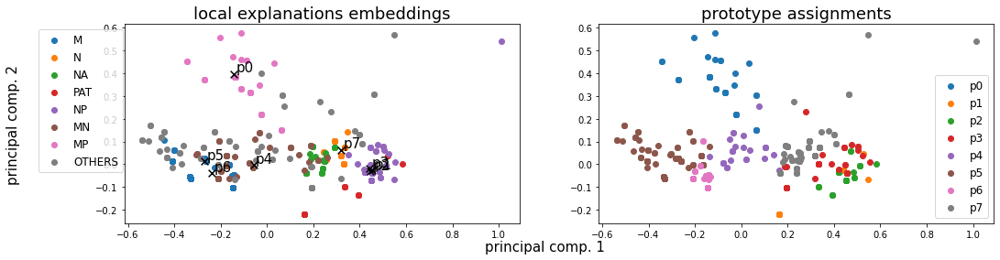

Alpha norms:
tensor([[0.4519, 0.2054, 0.4588, 0.2742, 0.1353, 1.0000, 0.2919, 0.3946],
        [0.3694, 0.2571, 0.3921, 0.3423, 0.1430, 0.6754, 0.2296, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.723365 +- 0.152343
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44,  47,  36, 140,  26, 246,  82,  88], dtype=int64))
Logic formulas:
For class 0:
0.9026798307475318 (feature003) | (feature002) | (feature007) | (feature001)
For class 1:
0.9026798307475318 (feature005) | (feature006) | (feature000) | ((feature004)
Accuracy as classifier:  0.9027
LEN fidelity:  tensor(0.9027)


360: Loss: 0.03890, LEN: 0.038608, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.02879, V. LEN 0.03
361: Loss: 0.03857, LEN: 0.038226, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03085, V. LEN 0.03
362: Loss: 0.04003, LEN: 0.039820, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.02981, V. LEN 0.03
363: Loss: 0.03774, LEN: 0.037423, AccxC: 0.90, AccO: 0.90, V. Ac

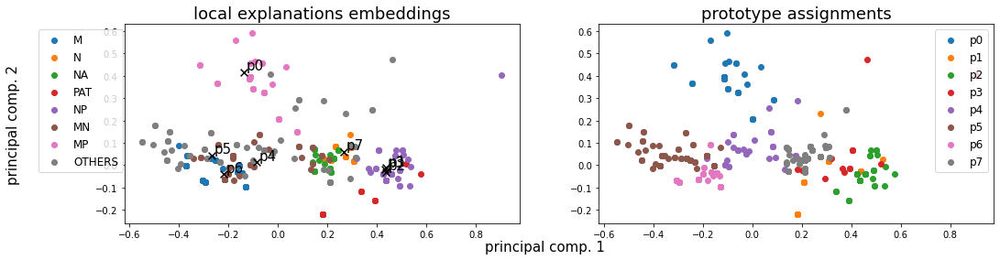

Alpha norms:
tensor([[0.4352, 0.2007, 0.4418, 0.2744, 0.1292, 1.0000, 0.2799, 0.3530],
        [0.3978, 0.2789, 0.4231, 0.3831, 0.1502, 0.7515, 0.2518, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.694060 +- 0.168456
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 41, 157,  54,  14,  33, 116, 212,  82], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature001) | (feature002) | (feature007) | (feature003)
For class 1:
0.8998589562764457 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


380: Loss: 0.03852, LEN: 0.038204, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03052, V. LEN 0.03
381: Loss: 0.03811, LEN: 0.037841, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03138, V. LEN 0.03
382: Loss: 0.03918, LEN: 0.038960, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03188, V. LEN 0.03
383: Loss: 0.03753, LEN: 0.037300, AccxC: 0.91, AccO: 0.91, V. Ac

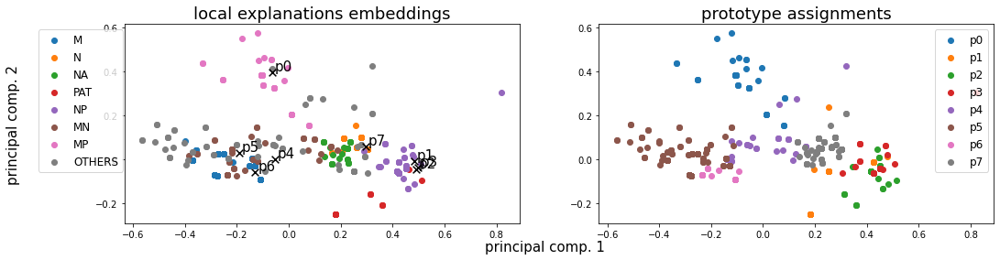

Alpha norms:
tensor([[0.4179, 0.2080, 0.4253, 0.2663, 0.1223, 1.0000, 0.2644, 0.2533],
        [0.5109, 0.3900, 0.5463, 0.4966, 0.1884, 1.0000, 0.3182, 0.9112]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.759263 +- 0.135166
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44,  72,  28,  36,  31, 265,  67, 166], dtype=int64))
Logic formulas:
For class 0:
0.8956276445698167 (feature007) | (feature002) | (feature001) | (feature003)
For class 1:
0.8956276445698167 (feature005) | (feature006) | (feature000) | ((feature004)
Accuracy as classifier:  0.8956
LEN fidelity:  tensor(0.8956)


400: Loss: 0.04110, LEN: 0.040649, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03205, V. LEN 0.03
401: Loss: 0.04026, LEN: 0.039697, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.02914, V. LEN 0.03
402: Loss: 0.03774, LEN: 0.037445, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.03055, V. LEN 0.03
403: Loss: 0.03888, LEN: 0.038560, AccxC: 0.90, AccO: 0.90, V. Ac

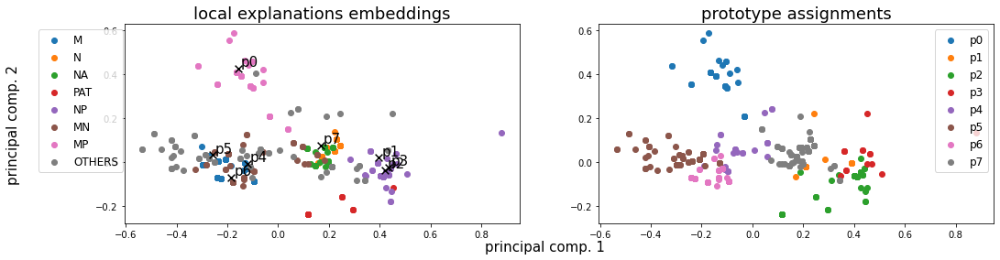

Alpha norms:
tensor([[0.4284, 0.1923, 0.4367, 0.2871, 0.1202, 1.0000, 0.2510, 0.2229],
        [0.5454, 0.3902, 0.5956, 0.5643, 0.1908, 1.0000, 0.2924, 0.7120]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.728348 +- 0.161404
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 39,  33,  93,  15,  26, 115, 213, 175], dtype=int64))
Logic formulas:
For class 0:
0.9012693935119888 (feature007) | (feature002) | (feature001) | (feature003)
For class 1:
0.9012693935119888 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.9013
LEN fidelity:  tensor(0.9013)


420: Loss: 0.03817, LEN: 0.037932, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03261, V. LEN 0.03
421: Loss: 0.03816, LEN: 0.037970, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03012, V. LEN 0.03
422: Loss: 0.04016, LEN: 0.039891, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03082, V. LEN 0.03
423: Loss: 0.04330, LEN: 0.043073, AccxC: 0.88, AccO: 0.88, V. Ac

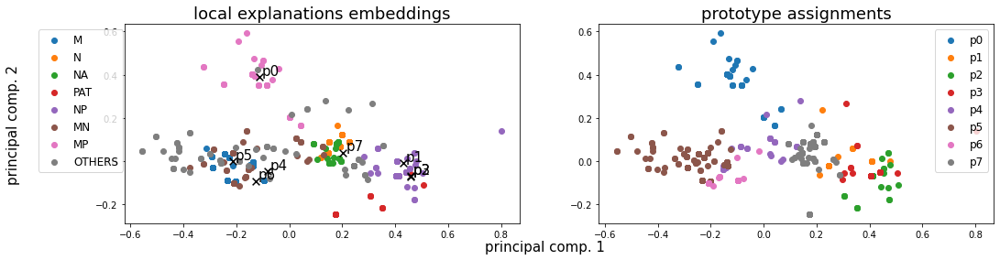

Alpha norms:
tensor([[0.4511, 0.1924, 0.4381, 0.2956, 0.1196, 1.0000, 0.2442, 0.2225],
        [0.6135, 0.4094, 0.6408, 0.6114, 0.1967, 1.0000, 0.2865, 0.6851]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.761015 +- 0.099149
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 44,  37,  31,  33,  27, 266,  69, 202], dtype=int64))
Logic formulas:
For class 0:
0.8970380818053597 (feature007) | (feature002) | (feature001) | (feature003)
For class 1:
0.8970380818053597 (feature005) | (feature006) | (feature000) | ((feature004)
Accuracy as classifier:  0.897
LEN fidelity:  tensor(0.8970)


440: Loss: 0.03937, LEN: 0.039149, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02984, V. LEN 0.03
441: Loss: 0.03987, LEN: 0.039554, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03175, V. LEN 0.03
442: Loss: 0.03930, LEN: 0.039079, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03086, V. LEN 0.03
443: Loss: 0.03782, LEN: 0.037583, AccxC: 0.90, AccO: 0.90, V. Acc

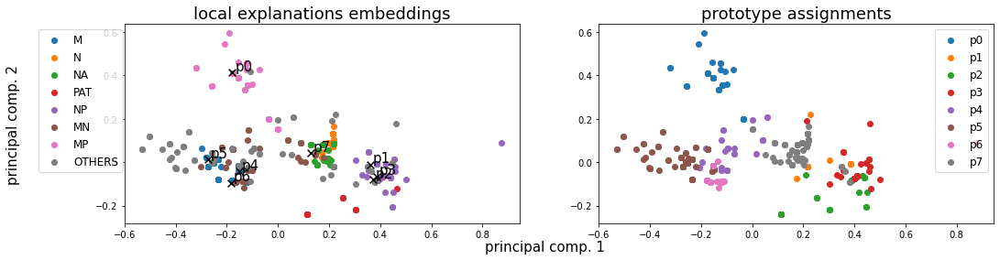

Alpha norms:
tensor([[0.4594, 0.1873, 0.4153, 0.2941, 0.1164, 1.0000, 0.2322, 0.2167],
        [0.6422, 0.4011, 0.6224, 0.6224, 0.1916, 1.0000, 0.2638, 0.6566]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.773709 +- 0.121168
Concept distribution:  (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 39,  33,  65,  44,  27, 155, 171, 175], dtype=int64))
Logic formulas:
For class 0:
0.8998589562764457 (feature007) | (feature002) | (feature001) | (feature003)
For class 1:
0.8998589562764457 (feature006) | (feature005) | (feature000) | ((feature004)
Accuracy as classifier:  0.8999
LEN fidelity:  tensor(0.8999)


460: Loss: 0.03830, LEN: 0.038090, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03278, V. LEN 0.03
461: Loss: 0.03795, LEN: 0.037744, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.03667, V. LEN 0.04
462: Loss: 0.04142, LEN: 0.041116, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.03197, V. LEN 0.03
463: Loss: 0.03919, LEN: 0.038910, AccxC: 0.90, AccO: 0.90, V. Ac

In [20]:
expls = []
for num_proto in [2, 4, 6, 8]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": num_proto,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "embedder_backbone": "GAT",
        "embedder_num_layers": 2,
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 500
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"],
                                     backbone=hyper["embedder_backbone"],
                                     num_layers=hyper["embedder_num_layers"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                           le_model, 
                                           train_group_loader, 
                                           val_group_loader, 
                                           device, 
                                           hyper_params=hyper,
                                           classes_names=priori_etn_classes_names,
                                           dataset_name="ETN").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)
    
    with open(f'../logs/model_focal_num_proto_{hyper["num_prototypes"]}_ETN.pkl', 'wb') as handle:
        pickle.dump(expl, handle)

num_proto:  2 Fidelity: tensor(0.8830)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


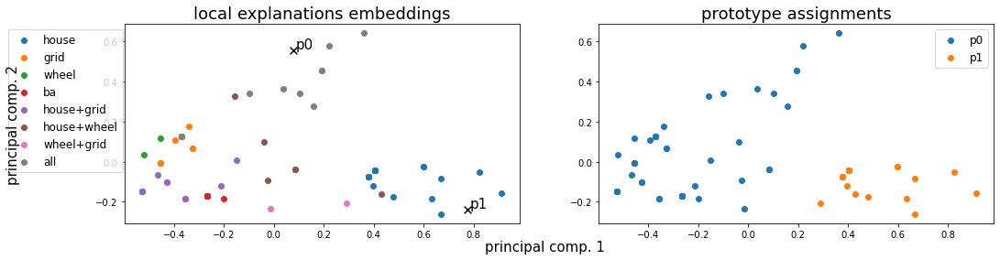

Alpha norms:
tensor([[0.4916, 1.0000],
        [0.4420, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.585714 +- 0.319048
Concept distribution:  (array([0, 1], dtype=int64), array([45, 21], dtype=int64))
Logic formulas:
For class 0:
0.7878787878787878 ((feature000)
For class 1:
0.7878787878787878 (feature001)
Accuracy as classifier:  0.7879
LEN fidelity:  tensor(0.7879)

num_proto:  3 Fidelity: tensor(0.9574)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


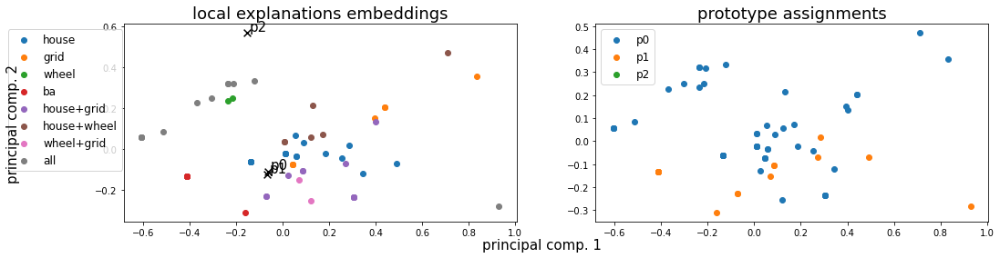

Alpha norms:
tensor([[0.3604, 0.4979, 1.0000],
        [0.2316, 0.3607, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.388750 +- 0.048750
Concept distribution:  (array([0, 1], dtype=int64), array([50, 16], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4697)

num_proto:  4 Fidelity: tensor(0.9043)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


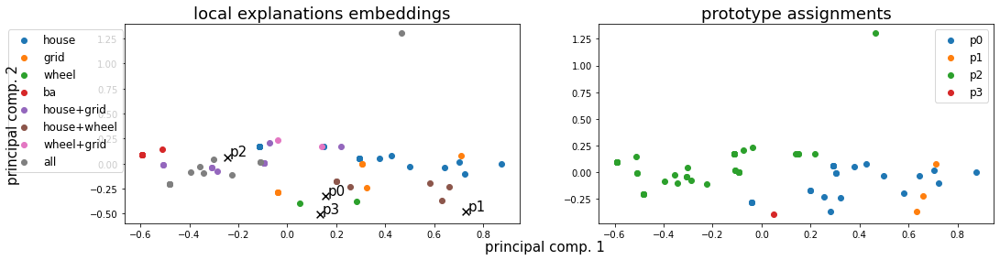

Alpha norms:
tensor([[0.3388, 1.0000, 0.1834, 0.5103],
        [0.6429, 1.0000, 0.8806, 0.6975]], grad_fn=<DivBackward0>)
Concept Purity: 0.616667 +- 0.256580
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([22,  3, 40,  1], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4394)

num_proto:  5 Fidelity: tensor(1.)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


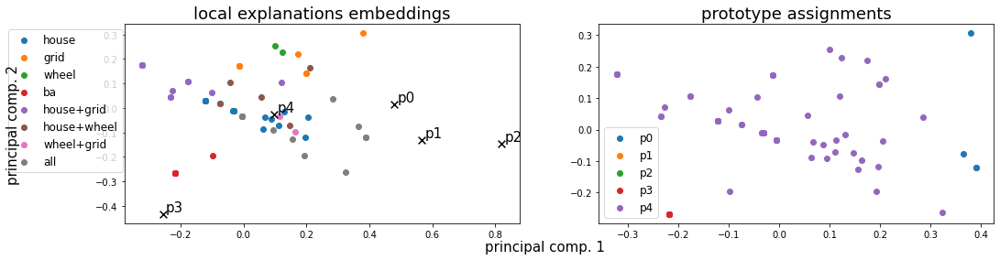

Alpha norms:
tensor([[0.4665, 0.5562, 1.0000, 0.1874, 0.2569],
        [0.3667, 0.2551, 1.0000, 0.1282, 0.2817]], grad_fn=<DivBackward0>)
Concept Purity: 0.696429 +- 0.272382
Concept distribution:  (array([0, 3, 4], dtype=int64), array([ 4,  6, 56], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4697)

num_proto:  6 Fidelity: tensor(1.)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


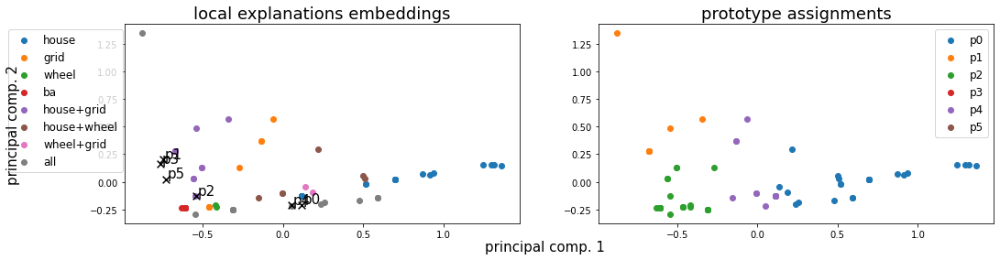

Alpha norms:
tensor([[0.2956, 0.2955, 0.3107, 1.0000, 0.1557, 0.3566],
        [0.0478, 0.1499, 0.1242, 1.0000, 0.0332, 0.0824]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.547062 +- 0.201683
Concept distribution:  (array([0, 1, 2, 4], dtype=int64), array([23,  7, 23, 13], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4697)

num_proto:  7 Fidelity: tensor(1.)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


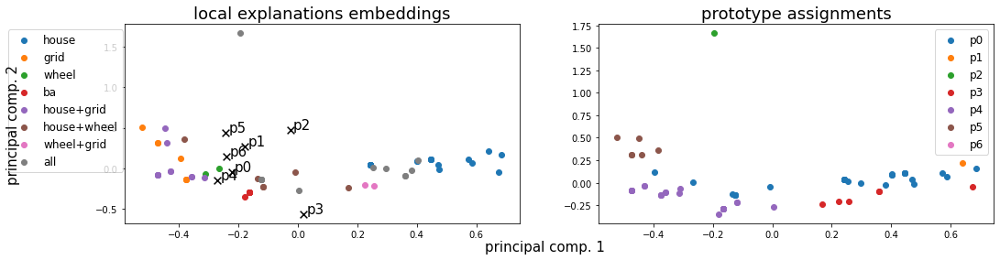

Alpha norms:
tensor([[0.2094, 0.2185, 1.0000, 0.1272, 0.2671, 0.2264, 0.2718],
        [0.2045, 0.2405, 1.0000, 0.0985, 0.2597, 0.3306, 0.2633]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.635141 +- 0.270014
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([29,  1,  1,  6, 23,  6], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4545)

num_proto:  8 Fidelity: tensor(1.)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


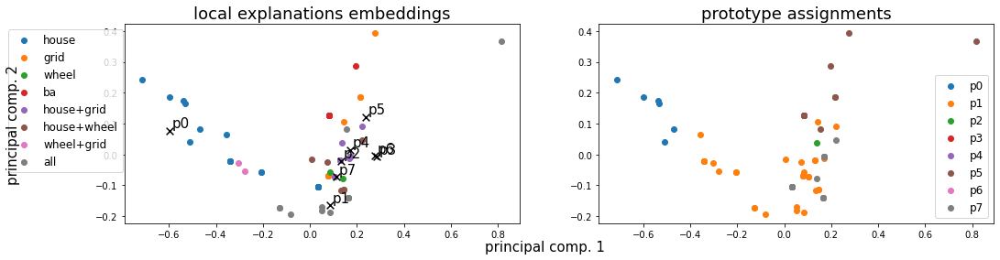

Alpha norms:
tensor([[0.1444, 0.4869, 0.4877, 1.0000, 0.2914, 0.5760, 0.6148, 0.4638],
        [0.2300, 0.4775, 0.5478, 1.0000, 0.3945, 0.6728, 0.9854, 0.4125]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.636828 +- 0.317535
Concept distribution:  (array([0, 1, 2, 5, 7], dtype=int64), array([ 6, 31,  1, 12, 16], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4697)

num_proto:  9 Fidelity: tensor(1.)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([19,  7,  2,  7, 11,  6,  2, 12], dtype=int64))


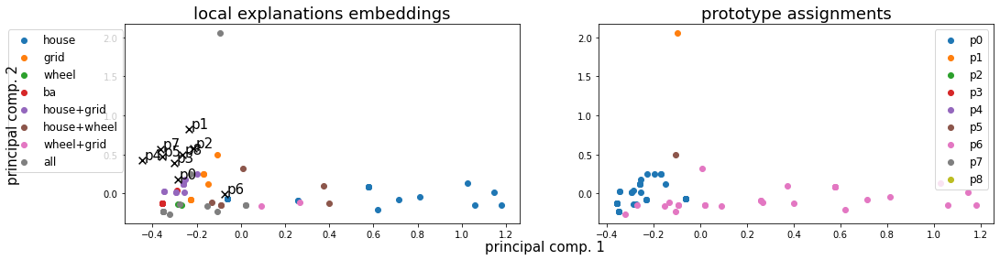

Alpha norms:
tensor([[0.4460, 1.0000, 0.4561, 0.3377, 0.2994, 0.2457, 0.1349, 0.2713, 0.3043],
        [0.7280, 1.0000, 0.7189, 0.5197, 0.5544, 0.8191, 0.5605, 0.4724, 0.5574]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.694695 +- 0.312173
Concept distribution:  (array([0, 1, 5, 6], dtype=int64), array([37,  1,  1, 27], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4545)



In [23]:
metrics = []
for num_p in range(2,10):
    with open(f'../logs/model_focal_num_proto_{num_p}_BAMultiShapes.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)
        print("num_proto: ", num_p, "Fidelity:", uno.val_metrics[uno.early_stopping.best_epoch-1]["acc_overall"])
        uno.inspect_embedding(val_group_loader)

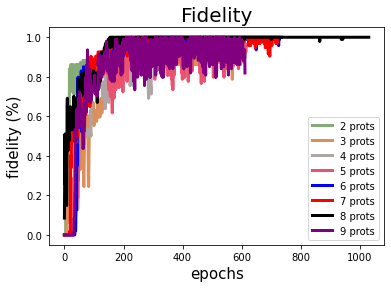

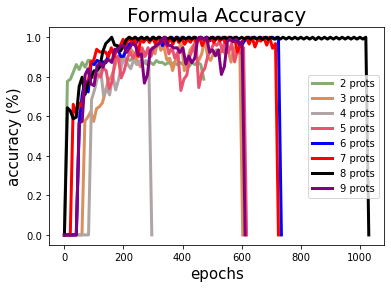

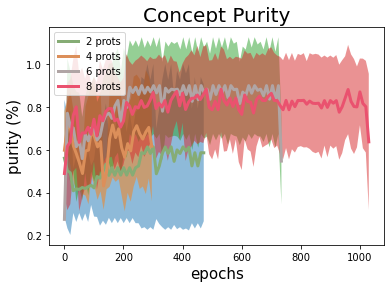

In [22]:
cs = ["#86ac75", "#dc8f5a", "#b0a5a5", "#ea526f", "blue", "red", "black", "purple"]

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot([e["acc_overall"] for e in m.val_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Fidelity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.show()

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), [e["logic_acc_clf"] for e in m.val_logic_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.show()

c = 0
for i , m in enumerate(metrics):
    if i % 2 == 1: continue
    purity     = np.array([e["concept_purity"] for e in m.val_logic_metrics])
    std_purity = np.array([e["concept_purity_std"] for e in m.val_logic_metrics])
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len(purity)), purity, label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), purity-std_purity, purity+std_purity, alpha=0.5)
    c += 1

plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.show()